## Import

In [271]:
import sys
import os
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import spacy


from tqdm import tqdm

from millenlp.preprocessing import PreProc
from millenlp.embeddings import FastTextVec, TfidfVec
from millenlp.state_models.shallow_model import ShallowModel, MultiLabelShallowModel

from sklearn.metrics.pairwise import euclidean_distances, cosine_similarity
from sklearn.cluster import SpectralClustering, KMeans
from sklearn.mixture import BayesianGaussianMixture, GaussianMixture
from sklearn.manifold import TSNE
from sklearn.externals import joblib
from sklearn.feature_extraction.text import TfidfVectorizer

from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

from graphviz import Digraph

from gensim.parsing.preprocessing import preprocess_string, strip_tags, strip_punctuation, strip_multiple_whitespaces, strip_numeric
from gensim.corpora import WikiCorpus
from gensim.models import FastText

## function definitions

In [2]:
def ranking_by_label_prediction(data_set,model,label):
    data_set['Prediction'] = data_set['iteration'].apply(lambda x : model._classifier.predict(model._vectorizer.transform([model.preprocessing(x)]))[0])
    data_set[model._classifier.classes_] = pd.DataFrame(data_set['iteration'].apply(lambda x : model._classifier.predict_proba(model._vectorizer.transform([model.preprocessing(x)]))[0]).values.tolist(), 
                                                                                index= data_set.index)
    return data_set.sort_values([label], ascending = [0])

def vocabulary(model, label_to_sort):
    
    if 'FastText' is model._vectorizer._embedding.__class__.__name__:
        classes = model._classifier.classes_
        word_dict = list(model._vectorizer._embedding.wv.vocab.keys())

        features_words = pd.DataFrame(model._vectorizer.transform(word_dict), 
                                      columns = list(range(model._vectorizer._num_features)))
        features_words = features_words.astype(float)

        features_ranked = pd.DataFrame(word_dict, columns = ['feature'])
        for i, label in enumerate(classes):
            topics = [label_to_sort] if len(model._classifier.classes_) < 3 else model._classifier.classes_.tolist()
            ranking_dim = pd.DataFrame(np.transpose(model._classifier.coef_), columns=topics)
            ranking_dim['feature'] = list(range(model._vectorizer._num_features))
            ranking_dim = ranking_dim.round(2).sort_values(label_to_sort, ascending=False).reset_index(drop=True)
            ranking_dim = ranking_dim[ranking_dim[model._classifier.classes_].idxmax(axis=1)==label]

            feature_weight = pd.DataFrame()
            features_words_filtered = features_words[ranking_dim.feature.tolist()]
            feature_weight[label] = np.dot(features_words_filtered.values,
                                           ranking_dim[label_to_sort].values) / features_words_filtered.shape[1]
            features_ranked = pd.concat([features_ranked,feature_weight], axis = 1)

        features_ranked = features_ranked.sort_values(by=[label_to_sort], ascending = False)
        
    elif 'TfidfVectorizer' is model._vectorizer._embedding.__class__.__name__:
        
        topics = [label_to_sort] if len(model._classifier.classes_) < 3 else model._classifier.classes_.tolist()
#         topics = model._classifier.classes_.tolist()
        features_ranked = pd.DataFrame(np.transpose(model._classifier.coef_), columns=topics)
        features_ranked['feature'] = model._vectorizer._embedding.get_feature_names()
        features_ranked = features_ranked.round(2).sort_values(label_to_sort, ascending=False).reset_index(drop=True)
        
    return features_ranked

def node_coef(data_set,coef_features,msg_col,label_col,feature,per_class):
    if per_class:
        data_set = data_set[data_set.label == label_col]
    count_feature = data_set[data_set[msg_col].str.contains(feature)].shape[0]
    if feature in coef_features.feature.values:
        coef = coef_features[coef_features.feature.isin([feature])][label_col].values[0]
    else:
        coef = 'Not in Dict'
    feature_info = pd.DataFrame(np.array([[feature,count_feature,round(coef,2)]]),
                                      columns = ['feature','counts','coef'])
    return feature_info 

def prob_around_word(data_set,coef_features,regex,msg_col,label_col, feature, per_class):
    
    if per_class:
        data_set = data_set[data_set.label == label_col]
        
    regex = regex.replace('{}',feature)
    look_around = data_set[msg_col].str.extract(regex, expand=False)
    count_feature = data_set[data_set[msg_col].str.contains(feature)].shape[0]
    
    if isinstance(look_around, pd.DataFrame):
        look_around = look_around.iloc[:,-1]
        
    look_around = look_around.dropna().value_counts().to_frame().reset_index()  
    look_around.columns = ['feature','counts']
    look_around['probability'] = np.divide(look_around.counts.values,np.sum(look_around.counts.values))*100
    look_around['coef'] = [round(coef_features[coef_features.feature.isin([word])][label_col].values[0],2)
                           if word in coef_features.feature.values else 'Not in Dict' 
                           for word in look_around.feature.values]
    return look_around

def left_parents(data_set, child, graph, dot):
    for parent in data_set.feature.values:
        data = data_set[data_set.feature==parent]
        if parent in list(graph.keys()):
            graph[parent][child] = (data.probability.values[0],
                                    data.counts.values[0],
                                    data.coef.values[0])
            dot = set_graph_atr(dot, data.coef.values[0])
            dot.node(parent,'{} \n Count = {} \n Coef = {}'.format(parent,
                                                                   data.counts.values[0],
                                                                   data.coef.values[0]),
                    shape='plaintext')
            dot.edge(parent, child,label = ('{}%'.format(str(round(data.probability.values[0],2)))),weight='1.2')
        else:
            graph[parent] = {child: (data.probability.values[0],
                                     data.counts.values[0],
                                     data.coef.values[0])}
            dot = set_graph_atr(dot, data.coef.values[0])
            dot.node(parent,'{} \n Count = {} \n Coef = {}'.format(parent,
                                                                   data.counts.values[0],
                                                                   data.coef.values[0]),
                    shape='plaintext')
            dot.edge(parent, child,label = ('{}%'.format(str(round(data.probability.values[0],2)))),weight='1.2')
    return graph, dot

def right_child(data_set, parent, graph,dot):
    if parent in list(graph.keys()):
        graph[parent] = {**graph[parent],**dict(zip(data_set.feature.values,
                                                   zip(data_set.probability.values,
                                                       data_set.counts.values,
                                                      data_set.coef.values)))}
        for child, counts, prob, coef in data_set.values:
            dot = set_graph_atr(dot, coef)
            dot.node(child,'{} \n Count = {} \n Coef = {}'.format(child,
                                                                  counts,
                                                                  coef),shape='plaintext')
            dot.edge(parent, child,label = ('{}%'.format(str(round(prob,2)))),weight='1.2')
        
    else:
        graph[parent] = dict(zip(data_set.feature.values,
                               zip(data_set.probability.values,
                                   data_set.counts.values,
                                   data_set.coef.values)))
        for child, counts, prob, coef in data_set.values:
            dot = set_graph_atr(dot, coef)
            dot.node(child,'{} \n Count = {} \n Coef = {}'.format(child,
                                                                  counts,
                                                                  coef),shape='plaintext')
            dot.edge(parent, child,label = ('{}%'.format(str(round(prob,2)))),weight='1.2')
    return graph, dot

def set_graph_atr(dot, coef):
    if isinstance(coef,str):
        dot.attr('node',style='filled', color='lightgrey')
    else:
        if coef > 0:
            dot.attr('node',style='filled', color='green')
        elif coef <= 0:
            dot.attr('node', style='filled', color='red')
    return dot

def create_adjacency_graph(data_set,model,label,num_features,per_class,levels):

    coef_vocab = vocabulary(model,label)
    features = coef_vocab.feature.iloc[:num_features+1].values.tolist()
    feature = features[num_features]
    
    check_around = ['(\w+(?=(?:\s(?:\w+\s){level}){}))',
                    '(({}\s)(\s*(\w+)){0,level})']
    
    graph = {}
    dot = Digraph(comment='Data Feature Probability Relationship')
    feature_data = node_coef(data_set,coef_vocab,'iteration',label,feature,per_class)
    dot.attr('node',style='filled', color='blue')
    dot.node(feature_data.feature.values[0],'{} \n Count = {} \n Coef = {}'.format(feature_data.feature.values[0],
                                                                                   feature_data.counts.values[0],
                                                                                   feature_data.coef.values[0]))
    for side in range(levels):
        where_to_check = check_around[side].replace('level',str(side))
        for level in range(levels):
            words_lvl1 = prob_around_word(data_set,
                                          coef_vocab,
                                          where_to_check,
                                          'iteration',
                                          label,
                                          feature,
                                          per_class).query('probability>5')
            if not side and level == 0:
                graph, dot = left_parents(words_lvl1, feature, graph, dot)
            elif not side and level == 1:
                for word in words_lvl1.feature.values:
                    
                    words_lvl2 = prob_around_word(data_set,
                                                  coef_vocab,
                                                  where_to_check,
                                                  'iteration',
                                                  label,
                                                  word,
                                                  per_class).query('probability>5')
                    graph, dot = left_parents(words_lvl2, word, graph, dot)
            elif side and level == 0:   
                graph, dot = right_child(words_lvl1, feature, graph, dot)
            elif side and level == 1:
                for word in words_lvl1.feature.values:
                    words_lvl2 = prob_around_word(data_set,
                                                  coef_vocab,
                                                  where_to_check,
                                                  'iteration',
                                                  label,
                                                  word,
                                                  per_class).query('probability>5')
                    graph, dot = right_child(words_lvl2, word, graph, dot)
    return dot

def elbow_plot(features, clusters2test):
    
    clust = []
    final_distance = []
    l = features.shape[0]
    for cluster in range(2, clusters2test):
        clust = KMeans(cluster).fit_predict(features)
        distances_per_cl = []
        cluster_list = clust.tolist()
        weight = [cluster_list.count(cluster_num)/l for cluster_num in range(0, cluster)]
        for clu in range(cluster):
            centroide = features[np.where(clust == clu)[0],:].mean(axis = 0).reshape(1,-1)
            euc_distance = euclidean_distances(features[np.where(clust == clu)[0],:], centroide)
            distances_per_cl.append(euc_distance.mean())
            
        final_distance.append((np.array(distances_per_cl)@ weight)/len(distances_per_cl))
    
    plt.plot(list(range(2, clusters2test)),final_distance)
    
    return final_distance                                
                                
def plot_word_cloud(data, cluster):
    wordcloud = WordCloud(max_font_size=50, max_words=200, background_color="white",width=700, height=400).generate(data)
    plt.figure(figsize=(20,10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()
    wordcloud.to_file("wordclouds/{}.png".format(cluster))


In [3]:
# Options to display all the information inside the row
pd.set_option('display.max_colwidth', -1)
pd.set_option('display.max_rows', 2000)
pd.set_option('display.max_columns', 2000)
tqdm.pandas()
# Class PreProc
p = PreProc()
p._remove_digits = True
# p._stop_pos_words = []
p._remove_names = False

/opt/conda/envs/nlp/lib/python3.7/site-packages/tqdm/std.py:658: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [4]:
data_base = pd.read_csv('/home/JhonChavez/clustering_codensa/data_emergencia.csv')
tipified_data = pd.read_excel('/home/JulioCesar/nlp/nlp_clustering/tipified/Tipificacion_B2C (28)2.xlsx')
print ('data_base.shape', data_base.shape)
print ('tipified_data.shape', tipified_data.shape)

data_base.shape (113788, 9)
tipified_data.shape (6802, 13)


In [5]:
tipified_data = tipified_data[['UNIQUEID', 'SUBMOTIVO ATENCIÓN']]
tipified_data[:10]

,UNIQUEID,SUBMOTIVO ATENCIÓN
0,3-1577865077.472827,Sin suministro en la calle
1,3-1577865077.472827,Sin suministro en la calle
2,3-1577895822.473576,Poda de arboles
3,3-1577908703.473893,"Chispas en línea, transformador o medidor/Explosiones/Incendios"
4,3-1577908703.473893,"Chispas en línea, transformador o medidor/Explosiones/Incendios"
5,3-1577915005.474169,"Chispas en línea, transformador o medidor/Explosiones/Incendios"
6,3-1577916598.474238,Sin suministro en la calle
7,3-1577916598.474238,Sin suministro en la calle
8,3-1577923497.474705,Cables colgando o al suelo/Accidentado en la Red
9,3-1577967341.475004,Sin suministro en la calle


# Tipificaciones

In [8]:
dict_submotivo = {}
for item in tipified_data['SUBMOTIVO ATENCIÓN']:
    if item in dict_submotivo.keys():
        dict_submotivo[item] += 1
    else:
        dict_submotivo[item] = 1
dict_submotivo

{'Sin suministro en la calle': 3577,
 'Poda de arboles': 22,
 'Chispas en línea, transformador o medidor/Explosiones/Incendios': 206,
 'Cables colgando o al suelo/Accidentado en la Red': 531,
 'Tensiones bajas': 183,
 'Posible Avería cliente': 1335,
 'Tensiones altas': 48,
 'Microcortes, oscilaciones': 310,
 'Sin suministro otros vecinos edificio': 401,
 'Aplomar poste': 51,
 'Cambiar poste (roto, fisurado, etc.)': 52,
 'Corrientes en partes metálicas': 2,
 'Poste metálico energizado': 4,
 'Cambiar tapa de caja de inspección': 3,
 'Cámara sin Tapa': 15,
 'Cliente VIP/Electrodependiente/Poda de Subestación': 49,
 'Otras causas/mantenimiento Programado': 12,
 nan: 1}

In [10]:
import operator
sorted(dict_submotivo.items(), key=operator.itemgetter(1))

[(nan, 1),
 ('Corrientes en partes metálicas', 2),
 ('Cambiar tapa de caja de inspección', 3),
 ('Poste metálico energizado', 4),
 ('Otras causas/mantenimiento Programado', 12),
 ('Cámara sin Tapa', 15),
 ('Poda de arboles', 22),
 ('Tensiones altas', 48),
 ('Cliente VIP/Electrodependiente/Poda de Subestación', 49),
 ('Aplomar poste', 51),
 ('Cambiar poste (roto, fisurado, etc.)', 52),
 ('Tensiones bajas', 183),
 ('Chispas en línea, transformador o medidor/Explosiones/Incendios', 206),
 ('Microcortes, oscilaciones', 310),
 ('Sin suministro otros vecinos edificio', 401),
 ('Cables colgando o al suelo/Accidentado en la Red', 531),
 ('Posible Avería cliente', 1335),
 ('Sin suministro en la calle', 3577)]

In [4]:
filename_cluster = '/home/JulioCesar/nlp/nlp_clustering/with_stopwords_and_names/chat_lemma_cluster.csv'
cluster_data = pd.read_csv(filename_cluster)
cluster_data.shape

(113788, 13)

In [5]:
cluster_data.ClusterNumber.value_counts().to_frame()

,ClusterNumber
11,28632
7,21643
6,11908
8,11796
3,10684
1,8152
9,7566
10,3926
0,3592
4,2335


In [6]:
cluster_data[:10]

,Unnamed: 0,Unnamed: 0.1,product,sessionId,_text,templateId,id,time,name,diff,clase,lemma,ClusterNumber
0,0,0,/voicebot_codensa_b2c,2-1578082323.601250,no hay servicio,emergencias,2,2020-01-03 15:13:10.036557-05:00,Emergencias,0.485171,Emergencias,no haber servicio,8
1,1,1,/voicebot_codensa_b2c,1-1578082408.737052,escorpion corte de energia desde las 8 de la manana y son las 3 de la manana solucionar el problema Por favor,emergencias,8,2020-01-03 15:14:48.127871-05:00,Emergencias,0.259904,Emergencias,escorpion corte energia manana ser manana solucionar problema,11
2,2,2,/voicebot_codensa_b2c,2-1578082580.601341,estoy llamando la Vereda campo municipal caparrapi desde el lunes estamos sin luz y no es posible que los guarda lineas,emergencias,19,2020-01-03 15:17:50.659319-05:00,Emergencias,0.340897,Emergencias,estar llamar vereda campo municipal caparrapi lunes estar luz no ser posible que guardar linea,7
3,3,3,/voicebot_codensa_b2c,2-1578082699.601374,"y casi todos los dias estamos sin luz en el primero todos fueron 12 horas , y ahora otra vez no",emergencias,30,2020-01-03 15:19:38.406214-05:00,Emergencias,0.255137,Emergencias,casi dia estar luz primero ser hora ahora vez no,11
4,4,4,/voicebot_codensa_b2c,2-1578082796.601402,hay muchos cortes de energia constantes bajones de luz porque ya me bloqueo porque me esta danando los aparatos,emergencias,37,2020-01-03 15:21:22.117893-05:00,Emergencias,0.099053,Emergencias,haber cortes energia constantes bajones luz porque ya bloquear porque danando aparatos,11
5,5,5,/voicebot_codensa_b2c,2-1578082849.601415,no hay energia,emergencias,43,2020-01-03 15:22:05.147743-05:00,Emergencias,0.428879,Emergencias,no haber energia,3
6,6,6,/voicebot_codensa_b2c,1-1578082867.737243,problemas del servicio,emergencias,47,2020-01-03 15:22:30.122180-05:00,Emergencias,0.393107,Emergencias,problema servicio,8
7,7,7,/voicebot_codensa_b2c,2-1578082931.601438,corte de luz,emergencias,52,2020-01-03 15:23:18.158533-05:00,Emergencias,0.397747,Emergencias,corte luz,5
8,8,8,/voicebot_codensa_b2c,1-1578082985.737287,lo que pasa es que tengo un problema con la vaina de la energia que dice una casa y estoy esperando a ponerme las luces ya que los 20 dias Entonces eso es lo que pasa que no me explique no me digan que es lo que pasa sobre eso,emergencias,58,2020-01-03 15:24:22.121047-05:00,Emergencias,0.106807,Emergencias,paso ser que tener problema vaina energia hacer casa estar esperar poner lunes ya que dia entonces ser paso que no explicar no digna que ser paso,11
9,9,9,/voicebot_codensa_b2c,1-1578083095.737341,falla en el servicio,emergencias,76,2020-01-03 15:26:19.747221-05:00,Emergencias,0.682655,Emergencias,fallo servicio,9


In [5]:
cluster_data.shape

(113788, 13)

In [6]:
cluster_data[:5]

,Unnamed: 0,Unnamed: 0.1,product,sessionId,_text,templateId,id,time,name,diff,clase,lemma,ClusterNumber
0,0,0,/voicebot_codensa_b2c,2-1578082323.601250,no hay servicio,emergencias,2,2020-01-03 15:13:10.036557-05:00,Emergencias,0.485171,Emergencias,no haber servicio,8
1,1,1,/voicebot_codensa_b2c,1-1578082408.737052,escorpion corte de energia desde las 8 de la manana y son las 3 de la manana solucionar el problema Por favor,emergencias,8,2020-01-03 15:14:48.127871-05:00,Emergencias,0.259904,Emergencias,escorpion corte energia manana ser manana solucionar problema,11
2,2,2,/voicebot_codensa_b2c,2-1578082580.601341,estoy llamando la Vereda campo municipal caparrapi desde el lunes estamos sin luz y no es posible que los guarda lineas,emergencias,19,2020-01-03 15:17:50.659319-05:00,Emergencias,0.340897,Emergencias,estar llamar vereda campo municipal caparrapi lunes estar luz no ser posible que guardar linea,7
3,3,3,/voicebot_codensa_b2c,2-1578082699.601374,"y casi todos los dias estamos sin luz en el primero todos fueron 12 horas , y ahora otra vez no",emergencias,30,2020-01-03 15:19:38.406214-05:00,Emergencias,0.255137,Emergencias,casi dia estar luz primero ser hora ahora vez no,11
4,4,4,/voicebot_codensa_b2c,2-1578082796.601402,hay muchos cortes de energia constantes bajones de luz porque ya me bloqueo porque me esta danando los aparatos,emergencias,37,2020-01-03 15:21:22.117893-05:00,Emergencias,0.099053,Emergencias,haber cortes energia constantes bajones luz porque ya bloquear porque danando aparatos,11


In [19]:
# cluster_data[cluster_data['ClusterNumber'] == 8]['_text']

In [7]:
fasttext = FastTextVec()
fasttext.fit(cluster_data['lemma'].apply(lambda x: str(x)))

Number of features: 6147



In [9]:
features = fasttext.transform(cluster_data['lemma'])
features.shape

(113788, 300)

In [17]:
falla_servicio_cluster_lst = [7, 3, 1, 9, 10, 0, 4, 2, 5]
retraso_cluster_lst = [11]
infraestructura_cluster_lst = [6]
reconexion_cluster_lst = [8]

In [18]:
cluster_data.shape

(113788, 13)

In [19]:
# cluster_data['label'] = 'otros'
cluster_data.shape

(113788, 13)

In [20]:
falla_servicio_cluster = cluster_data[cluster_data['ClusterNumber'].isin(falla_servicio_cluster_lst)]
print('falla_servicio_cluster', falla_servicio_cluster.shape)

retraso_cluster = cluster_data[cluster_data['ClusterNumber'].isin(retraso_cluster_lst)]
print('retraso_cluster', retraso_cluster.shape)

infraestructura_cluster = cluster_data[cluster_data['ClusterNumber'].isin(infraestructura_cluster_lst)]
print('infraestructura_cluster', infraestructura_cluster.shape)

reconexion_cluster = cluster_data[cluster_data['ClusterNumber'].isin(reconexion_cluster_lst)]
print('reconexion_cluster', reconexion_cluster.shape)

falla_servicio_cluster (61452, 13)
retraso_cluster (28632, 13)
infraestructura_cluster (11908, 13)
reconexion_cluster (11796, 13)


In [15]:
retraso_cluster[:10]

,Unnamed: 0,Unnamed: 0.1,product,sessionId,_text,templateId,id,time,name,diff,clase,lemma,ClusterNumber
1,1,1,/voicebot_codensa_b2c,1-1578082408.737052,escorpion corte de energia desde las 8 de la manana y son las 3 de la manana solucionar el problema Por favor,emergencias,8,2020-01-03 15:14:48.127871-05:00,Emergencias,0.259904,Emergencias,escorpion corte energia manana ser manana solucionar problema,11
3,3,3,/voicebot_codensa_b2c,2-1578082699.601374,"y casi todos los dias estamos sin luz en el primero todos fueron 12 horas , y ahora otra vez no",emergencias,30,2020-01-03 15:19:38.406214-05:00,Emergencias,0.255137,Emergencias,casi dia estar luz primero ser hora ahora vez no,11
4,4,4,/voicebot_codensa_b2c,2-1578082796.601402,hay muchos cortes de energia constantes bajones de luz porque ya me bloqueo porque me esta danando los aparatos,emergencias,37,2020-01-03 15:21:22.117893-05:00,Emergencias,0.099053,Emergencias,haber cortes energia constantes bajones luz porque ya bloquear porque danando aparatos,11
8,8,8,/voicebot_codensa_b2c,1-1578082985.737287,lo que pasa es que tengo un problema con la vaina de la energia que dice una casa y estoy esperando a ponerme las luces ya que los 20 dias Entonces eso es lo que pasa que no me explique no me digan que es lo que pasa sobre eso,emergencias,58,2020-01-03 15:24:22.121047-05:00,Emergencias,0.106807,Emergencias,paso ser que tener problema vaina energia hacer casa estar esperar poner lunes ya que dia entonces ser paso que no explicar no digna que ser paso,11
10,10,10,/voicebot_codensa_b2c,1-1578083117.737354,no tenemos servicio de energia en la Vereda ozuna y No no te creas ahorita lo mismo cierto ahorita que la isla me pones eso le mando el magia,emergencias,83,2020-01-03 15:27:05.714963-05:00,Emergencias,0.622098,Emergencias,no tener servicio energia vereda ozuna no no creer ahora cierto ahora que isla poner mandar magia,11
17,17,17,/voicebot_codensa_b2c,1-1578083598.737579,Espera yo no tengo por favor,emergencias,140,2020-01-03 15:34:40.976064-05:00,Emergencias,0.098138,Emergencias,esperar no tener,11
19,19,19,/voicebot_codensa_b2c,2-1578083666.601670,estamos completando en el municipio de terrazas La Vega + municipio de Salvatierra viejas mas de 4 horas ya queremos saber que pasa tenemos medicamentos en congelado en congelacion y no se esta preocupando,emergencias,150,2020-01-03 15:36:04.524904-05:00,Emergencias,0.221386,Emergencias,estar completar municipio terrazas vega municipio salvatierra viejas mas hora ya querer saber que paso tener medicamentos congelado congelacion no preocupar,11
20,20,20,/voicebot_codensa_b2c,2-1578083782.601713,amor para mas de dos horas estar sin luz en el municipio de la Vereda tierras viejas y tenemos medicamentos que se pueden danar de alto costo Queremos saber a que hora tenemos luz,emergencias,160,2020-01-03 15:37:45.536021-05:00,Emergencias,0.119846,Emergencias,amor mas dos hora estar luz municipio vereda tierras viejas tener medicamentos poder danar alto costo querer saber que hora tener luz,11
21,21,21,/voicebot_codensa_b2c,2-1578083808.601723,presentamos una falla desde esta manana y Queremos saber a que horas regresa el servicio,emergencias,162,2020-01-03 15:37:59.780216-05:00,Emergencias,0.180927,Emergencias,presentar falla manana querer saber que hora regresar servicio,11
23,23,23,/voicebot_codensa_b2c,1-1578083797.737657,y hagame un favor Es que llevo desde el primero sin servicio y tengo una senora que utiliza oxigeno y el llamado de llamado y ya van varias quejas si no me han puesto el servicio y es una canuela que esta una canuela que esta abajo,emergencias,170,2020-01-03 15:38:17.605002-05:00,Emergencias,0.202648,Emergencias,hagame ser llevar primero servicio tener utilizar oxigeno llamado llamado ya ir variar quejas si no haber poner servicio ser canuela canuela bajo,11


# Categorias

## Sin suministro en la calle/barrio/vereda

In [218]:
similarities = fasttext._embedding.wv.most_similar(positive=['falta'],
                                                   # negative=['interface'],
                                                   topn = 20)
similarities

[('faltar', 0.7298643589019775),
 ('falte', 0.7217991352081299),
 ('peralta', 0.5329761505126953),
 ('alta', 0.5284823179244995),
 ('falsa', 0.49339359998703003),
 ('falto', 0.4896480441093445),
 ('falso', 0.4723165035247803),
 ('falda', 0.439132422208786),
 ('ausencia', 0.4269745349884033),
 ('fallo', 0.4108521342277527),
 ('altagracia', 0.4090598225593567),
 ('altavista', 0.40304094552993774),
 ('altania', 0.3883906900882721),
 ('altar', 0.36560970544815063),
 ('multa', 0.3635115623474121),
 ('baja', 0.33905816078186035),
 ('altas', 0.33079975843429565),
 ('alterna', 0.32969337701797485),
 ('mazata', 0.3219373822212219),
 ('deficiencia', 0.3194749653339386)]

In [154]:
reference = ['calle', 'cuadra', 'barrio', 'localidad', 'conjunto', 'cuadrante', 
             'urbanizacion', 'sector', 'zona', 'vereda', 'municipio', 'manzana']
stri = ''
for idx, word in enumerate(reference):    
    stri +=  word
    if idx < len(reference) - 1:
         stri += '|'

print('**** falla_servicio_cluster ****')
print('Filter is ' + stri)
tmp_data = falla_servicio_cluster[falla_servicio_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(falla_servicio_cluster)))
print('')

'''
print('**** retraso_cluster ****')
print('Filter is ' + stri)
tmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))
print('')

print('**** infraestructura_cluster ****')
print('Filter is ' + stri)
tmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))
print('')

print('**** reconexion_cluster ****')
print('Filter is ' + stri)
tmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))
print('')
'''

**** falla_servicio_cluster ****
Filter is calle|cuadra|barrio|localidad|conjunto|cuadrante|urbanizacion|sector|zona|vereda|municipio|manzana
Found: 24682. It is 40.16468137733516%



"\nprint('**** retraso_cluster ****')\nprint('Filter is ' + stri)\ntmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]\nprint('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))\nprint('')\n\nprint('**** infraestructura_cluster ****')\nprint('Filter is ' + stri)\ntmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]\nprint('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))\nprint('')\n\nprint('**** reconexion_cluster ****')\nprint('Filter is ' + stri)\ntmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]\nprint('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))\nprint('')\n"

(24682, 13)

## Cables colgando o al suelo/Accidentado en la Red

In [106]:
similarities = fasttext._embedding.wv.most_similar(positive=['cuerda'],
                                                   # negative=['interface'],
                                                   topn = 20)
similarities

[('acuerdate', 0.8979483246803284),
 ('cuerdas', 0.8372315168380737),
 ('acuerdas', 0.8150851726531982),
 ('acuerdo', 0.7760555744171143),
 ('cuerpo', 0.7515751123428345),
 ('recuerdo', 0.6327900886535645),
 ('linea', 0.6118967533111572),
 ('cable', 0.5672389268875122),
 ('cables', 0.5670440793037415),
 ('mierda', 0.5567593574523926),
 ('teja', 0.4839383363723755),
 ('linear', 0.48308300971984863),
 ('arbol', 0.4814530313014984),
 ('rama', 0.47446590662002563),
 ('muela', 0.47287362813949585),
 ('cuello', 0.4661223888397217),
 ('canela', 0.4597025513648987),
 ('puertas', 0.4594399333000183),
 ('palo', 0.4589392840862274),
 ('cableado', 0.45416903495788574)]

In [107]:
reference = ['cable', 'cableado', 'cables', 'cuerda', 'cuerdas']
stri = ''
for idx, word in enumerate(reference):    
    stri +=  word
    if idx < len(reference) - 1:
         stri += '|'

print('**** falla_servicio_cluster ****')
print('Filter is ' + stri)
tmp_data = falla_servicio_cluster[falla_servicio_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(falla_servicio_cluster)))
print('')

print('**** retraso_cluster ****')
print('Filter is ' + stri)
tmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))
print('')

print('**** infraestructura_cluster ****')
print('Filter is ' + stri)
tmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))
print('')
cables_cluster = tmp_data

print('**** reconexion_cluster ****')
print('Filter is ' + stri)
tmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))
print('')

**** falla_servicio_cluster ****
Filter is cable|cableado|cables|cuerda|cuerdas
Found: 592. It is 0.9633535116839159%

**** retraso_cluster ****
Filter is cable|cableado|cables|cuerda|cuerdas
Found: 687. It is 2.3994132439228837%

**** infraestructura_cluster ****
Filter is cable|cableado|cables|cuerda|cuerdas
Found: 2538. It is 21.313402754450788%

**** reconexion_cluster ****
Filter is cable|cableado|cables|cuerda|cuerdas
Found: 4. It is 0.0339097999321804%



In [ ]:
cables_cluster.shape

## Sin suministro otros vecinos edificio

In [109]:
similarities = fasttext._embedding.wv.most_similar(positive=['vecino'],
                                                   # negative=['interface'],
                                                   topn = 20)
similarities

[('vecina', 0.849502682685852),
 ('vecindad', 0.8409934043884277),
 ('vecinos', 0.8314449787139893),
 ('vecindario', 0.7854791879653931),
 ('vecinas', 0.7667033672332764),
 ('vecindades', 0.7447699904441833),
 ('casa', 0.4787490963935852),
 ('uno', 0.4719732403755188),
 ('preciso', 0.4574015736579895),
 ('papelito', 0.45579013228416443),
 ('mito', 0.43509119749069214),
 ('casino', 0.43268585205078125),
 ('alla', 0.41889533400535583),
 ('mio', 0.41664743423461914),
 ('ernesto', 0.41218632459640503),
 ('conectada', 0.40791845321655273),
 ('abandonado', 0.4050421714782715),
 ('mitad', 0.40439504384994507),
 ('aparente', 0.4030713737010956),
 ('ambiente', 0.4013879895210266)]

In [110]:
reference = ['vecino', 'vecina', 'vecindad', 'vecinos', 'vecindario']
stri = ''
for idx, word in enumerate(reference):    
    stri +=  word
    if idx < len(reference) - 1:
         stri += '|'

print('**** falla_servicio_cluster ****')
print('Filter is ' + stri)
tmp_data = falla_servicio_cluster[falla_servicio_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(falla_servicio_cluster)))
print('')

print('**** retraso_cluster ****')
print('Filter is ' + stri)
tmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))
print('')

print('**** infraestructura_cluster ****')
print('Filter is ' + stri)
tmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))
print('')

print('**** reconexion_cluster ****')
print('Filter is ' + stri)
tmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))
print('')

**** falla_servicio_cluster ****
Filter is vecino|vecina|vecindad|vecinos|vecindario
Found: 105. It is 0.17086506541691077%

**** retraso_cluster ****
Filter is vecino|vecina|vecindad|vecinos|vecindario
Found: 381. It is 1.3306789606035205%

**** infraestructura_cluster ****
Filter is vecino|vecina|vecindad|vecinos|vecindario
Found: 186. It is 1.561975142761169%

**** reconexion_cluster ****
Filter is vecino|vecina|vecindad|vecinos|vecindario
Found: 2. It is 0.0169548999660902%



## Microcortes, oscilaciones

In [114]:
similarities = fasttext._embedding.wv.most_similar(positive=['oscilacion'],
                                                   # negative=['interface'],
                                                   topn = 20)
similarities

[('ventilacion', 0.6268342733383179),
 ('oscilaciones', 0.6074659824371338),
 ('fluctuacion', 0.5437607765197754),
 ('interdiccion', 0.5124993324279785),
 ('actuacion', 0.5103370547294617),
 ('agrupacion', 0.500956118106842),
 ('funcion', 0.48941749334335327),
 ('apagados', 0.4801623821258545),
 ('titilar', 0.4781225323677063),
 ('variacion', 0.47538089752197266),
 ('fluctuaciones', 0.4749946594238281),
 ('adecuacion', 0.47354987263679504),
 ('alteracion', 0.4717671573162079),
 ('intermitencias', 0.46941468119621277),
 ('intermitencia', 0.4685755968093872),
 ('voltios', 0.46683046221733093),
 ('operacion', 0.46455076336860657),
 ('subidas', 0.4625694453716278),
 ('asuncion', 0.46200889348983765),
 ('equipos', 0.45989349484443665)]

In [115]:
reference = ['intermitente', 'intermitentemente', 'intermitentes', 'intermitencia', 'intermitencias',
            'titilar', 'intervalos', 'intervalo', 'oscilacion', 'oscilaciones', 'fluctuacion', 
            'fluctuaciones']
stri = ''
for idx, word in enumerate(reference):    
    stri +=  word
    if idx < len(reference) - 1:
         stri += '|'

print('**** falla_servicio_cluster ****')
print('Filter is ' + stri)
tmp_data = falla_servicio_cluster[falla_servicio_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(falla_servicio_cluster)))
print('')

print('**** retraso_cluster ****')
print('Filter is ' + stri)
tmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))
print('')

print('**** infraestructura_cluster ****')
print('Filter is ' + stri)
tmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))
print('')

print('**** reconexion_cluster ****')
print('Filter is ' + stri)
tmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))
print('')

**** falla_servicio_cluster ****
Filter is intermitente|intermitentemente|intermitentes|intermitencia|intermitencias|titilar|intervalos|intervalo|oscilacion|oscilaciones|fluctuacion|fluctuaciones
Found: 264. It is 0.42960359304823276%

**** retraso_cluster ****
Filter is intermitente|intermitentemente|intermitentes|intermitencia|intermitencias|titilar|intervalos|intervalo|oscilacion|oscilaciones|fluctuacion|fluctuaciones
Found: 561. It is 1.9593461860854988%

**** infraestructura_cluster ****
Filter is intermitente|intermitentemente|intermitentes|intermitencia|intermitencias|titilar|intervalos|intervalo|oscilacion|oscilaciones|fluctuacion|fluctuaciones
Found: 344. It is 2.888814242526033%

**** reconexion_cluster ****
Filter is intermitente|intermitentemente|intermitentes|intermitencia|intermitencias|titilar|intervalos|intervalo|oscilacion|oscilaciones|fluctuacion|fluctuaciones
Found: 12. It is 0.1017293997965412%



## Chispas en línea, transformador o medidor/Explosiones/Incendios

In [117]:
similarities = fasttext._embedding.wv.most_similar(positive=['medidor'],
                                                   # negative=['interface'],
                                                   topn = 20)
similarities

[('medidores', 0.7679559588432312),
 ('contador', 0.6548376083374023),
 ('citador', 0.5966240167617798),
 ('aceptador', 0.5811561942100525),
 ('servidor', 0.5673774480819702),
 ('registrador', 0.5540944337844849),
 ('medida', 0.5468130111694336),
 ('solicitador', 0.5438371896743774),
 ('cazador', 0.5428031086921692),
 ('ecuador', 0.5402306318283081),
 ('medir', 0.525473952293396),
 ('contado', 0.5196082592010498),
 ('decodificador', 0.5117540955543518),
 ('totalizador', 0.5023987889289856),
 ('calentador', 0.49932828545570374),
 ('condensador', 0.4977302849292755),
 ('consumo', 0.49712708592414856),
 ('transportador', 0.494858980178833),
 ('contadores', 0.49465787410736084),
 ('cargador', 0.49005866050720215)]

In [118]:
reference = ['transformador', 'transformadores', 'medidor', 'medidores', 'contador', 'contadores',
            'registro', 'registrador']
stri = ''
for idx, word in enumerate(reference):    
    stri +=  word
    if idx < len(reference) - 1:
         stri += '|'

print('**** falla_servicio_cluster ****')
print('Filter is ' + stri)
tmp_data = falla_servicio_cluster[falla_servicio_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(falla_servicio_cluster)))
print('')

print('**** retraso_cluster ****')
print('Filter is ' + stri)
tmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))
print('')

print('**** infraestructura_cluster ****')
print('Filter is ' + stri)
tmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))
print('')

print('**** reconexion_cluster ****')
print('Filter is ' + stri)
tmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))
print('')

**** falla_servicio_cluster ****
Filter is transformador|transformadores|medidor|medidores|contador|contadores|registro|registrador
Found: 837. It is 1.3620386643233744%

**** retraso_cluster ****
Filter is transformador|transformadores|medidor|medidores|contador|contadores|registro|registrador
Found: 796. It is 2.7801061749091924%

**** infraestructura_cluster ****
Filter is transformador|transformadores|medidor|medidores|contador|contadores|registro|registrador
Found: 2182. It is 18.323815922069198%

**** reconexion_cluster ****
Filter is transformador|transformadores|medidor|medidores|contador|contadores|registro|registrador
Found: 12. It is 0.1017293997965412%



## Postes

In [119]:
similarities = fasttext._embedding.wv.most_similar(positive=['poste'],
                                                   # negative=['interface'],
                                                   topn = 20)
similarities

[('poster', 0.9299191832542419),
 ('post', 0.889106273651123),
 ('posteo', 0.8858343958854675),
 ('posta', 0.8186113238334656),
 ('postre', 0.7725088000297546),
 ('postura', 0.7685114741325378),
 ('postes', 0.7610886693000793),
 ('postal', 0.7487157583236694),
 ('coste', 0.7257974147796631),
 ('postres', 0.6692112684249878),
 ('cableado', 0.6038194894790649),
 ('oeste', 0.5740727186203003),
 ('cable', 0.563312828540802),
 ('acometida', 0.5615516901016235),
 ('acostado', 0.5470894575119019),
 ('ajuste', 0.5086166858673096),
 ('poseer', 0.506061315536499),
 ('cables', 0.5055174231529236),
 ('neutro', 0.5033581256866455),
 ('contador', 0.49110960960388184)]

In [122]:
reference = ['poste', 'posta']
stri = ''
for idx, word in enumerate(reference):    
    stri +=  word
    if idx < len(reference) - 1:
         stri += '|'

print('**** falla_servicio_cluster ****')
print('Filter is ' + stri)
tmp_data = falla_servicio_cluster[falla_servicio_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(falla_servicio_cluster)))
print('')

print('**** retraso_cluster ****')
print('Filter is ' + stri)
tmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))
print('')

print('**** infraestructura_cluster ****')
print('Filter is ' + stri)
tmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))
print('')

print('**** reconexion_cluster ****')
print('Filter is ' + stri)
tmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))
print('')

**** falla_servicio_cluster ****
Filter is poste|posta
Found: 217. It is 0.3531211351949489%

**** retraso_cluster ****
Filter is poste|posta
Found: 367. It is 1.2817826208438112%

**** infraestructura_cluster ****
Filter is poste|posta
Found: 669. It is 5.61807188444743%

**** reconexion_cluster ****
Filter is poste|posta
Found: 11. It is 0.0932519498134961%



## Arboles

In [123]:
similarities = fasttext._embedding.wv.most_similar(positive=['arbol'],
                                                   # negative=['interface'],
                                                   topn = 20)
similarities

[('arbolito', 0.8847848773002625),
 ('arboleda', 0.8081254959106445),
 ('arboles', 0.7943260669708252),
 ('trebol', 0.6549561619758606),
 ('futbol', 0.6393651962280273),
 ('palo', 0.6271178126335144),
 ('encima', 0.6073836088180542),
 ('rama', 0.5565570592880249),
 ('gol', 0.5234772562980652),
 ('teja', 0.5002781748771667),
 ('carbon', 0.4838007688522339),
 ('cuerda', 0.4814530313014984),
 ('post', 0.4746949076652527),
 ('rayo', 0.46924498677253723),
 ('enredada', 0.45593011379241943),
 ('acuerdas', 0.4553752839565277),
 ('acuerdate', 0.45324790477752686),
 ('postre', 0.45318472385406494),
 ('acuerdo', 0.4523276686668396),
 ('ruta', 0.45072290301322937)]

In [124]:
reference = ['arbol', 'arbolito', 'arboles', 'rama']
stri = ''
for idx, word in enumerate(reference):    
    stri +=  word
    if idx < len(reference) - 1:
         stri += '|'

print('**** falla_servicio_cluster ****')
print('Filter is ' + stri)
tmp_data = falla_servicio_cluster[falla_servicio_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(falla_servicio_cluster)))
print('')

print('**** retraso_cluster ****')
print('Filter is ' + stri)
tmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))
print('')

print('**** infraestructura_cluster ****')
print('Filter is ' + stri)
tmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))
print('')

print('**** reconexion_cluster ****')
print('Filter is ' + stri)
tmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))
print('')

**** falla_servicio_cluster ****
Filter is arbol|arbolito|arboles|rama
Found: 358. It is 0.5825685087548005%

**** retraso_cluster ****
Filter is arbol|arbolito|arboles|rama
Found: 282. It is 0.9849119865884325%

**** infraestructura_cluster ****
Filter is arbol|arbolito|arboles|rama
Found: 573. It is 4.811891165602956%

**** reconexion_cluster ****
Filter is arbol|arbolito|arboles|rama
Found: 16. It is 0.1356391997287216%



## Electrodependiente

In [125]:
similarities = fasttext._embedding.wv.most_similar(positive=['dependiente'],
                                                   # negative=['interface'],
                                                   topn = 20)
similarities

[('codependiente', 0.9435820579528809),
 ('dependientes', 0.932451605796814),
 ('independiente', 0.9041596055030823),
 ('electrodependiente', 0.8629311919212341),
 ('pendiente', 0.831468939781189),
 ('independientes', 0.8284206390380859),
 ('depender', 0.8114782571792603),
 ('insulinodependiente', 0.7743679881095886),
 ('dependencia', 0.7649957537651062),
 ('oxigenodependiente', 0.7360137701034546),
 ('independizar', 0.7160425782203674),
 ('permanente', 0.6330207586288452),
 ('utilizar', 0.6286090612411499),
 ('dientes', 0.6175632476806641),
 ('enferma', 0.5907132625579834),
 ('requiriente', 0.5873991250991821),
 ('auxiliar', 0.5801299214363098),
 ('independizacion', 0.573370099067688),
 ('permanentes', 0.5722923278808594),
 ('uso', 0.5646957159042358)]

In [126]:
reference = ['dependiente', 'codependiente', 'electrodependiente', 'insulinodependiente', 
             'oxigenodependiente', 'oxigeno']
stri = ''
for idx, word in enumerate(reference):    
    stri +=  word
    if idx < len(reference) - 1:
         stri += '|'

print('**** falla_servicio_cluster ****')
print('Filter is ' + stri)
tmp_data = falla_servicio_cluster[falla_servicio_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(falla_servicio_cluster)))
print('')

print('**** retraso_cluster ****')
print('Filter is ' + stri)
tmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))
print('')

print('**** infraestructura_cluster ****')
print('Filter is ' + stri)
tmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))
print('')

print('**** reconexion_cluster ****')
print('Filter is ' + stri)
tmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))
print('')

**** falla_servicio_cluster ****
Filter is dependiente|codependiente|electrodependiente|insulinodependiente|oxigenodependiente|oxigeno
Found: 138. It is 0.22456551454793985%

**** retraso_cluster ****
Filter is dependiente|codependiente|electrodependiente|insulinodependiente|oxigenodependiente|oxigeno
Found: 1797. It is 6.276194467728415%

**** infraestructura_cluster ****
Filter is dependiente|codependiente|electrodependiente|insulinodependiente|oxigenodependiente|oxigeno
Found: 32. It is 0.26872690628149143%

**** reconexion_cluster ****
Filter is dependiente|codependiente|electrodependiente|insulinodependiente|oxigenodependiente|oxigeno
Found: 11. It is 0.0932519498134961%



## Mantenimiento

In [127]:
similarities = fasttext._embedding.wv.most_similar(positive=['mantenimiento'],
                                                   # negative=['interface'],
                                                   topn = 20)
similarities

[('procedimiento', 0.7273892164230347),
 ('movimiento', 0.6937078237533569),
 ('corrimiento', 0.6815345287322998),
 ('arreglos', 0.6406618356704712),
 ('conocimiento', 0.6369495391845703),
 ('acontecimiento', 0.6216433644294739),
 ('seguimiento', 0.6154693961143494),
 ('incumplimiento', 0.6093701124191284),
 ('requerimiento', 0.5910031795501709),
 ('visitar', 0.5886693000793457),
 ('arreglo', 0.5731967091560364),
 ('reparaciones', 0.5656241178512573),
 ('visita', 0.5447103381156921),
 ('sarmiento', 0.5432164669036865),
 ('reparacion', 0.5387059450149536),
 ('mientras', 0.5378128290176392),
 ('asiento', 0.5221432447433472),
 ('trabar', 0.5172853469848633),
 ('requerimientos', 0.5154860019683838),
 ('trabajo', 0.49150097370147705)]

In [128]:
reference = ['mantenimiento']
stri = ''
for idx, word in enumerate(reference):    
    stri +=  word
    if idx < len(reference) - 1:
         stri += '|'

print('**** falla_servicio_cluster ****')
print('Filter is ' + stri)
tmp_data = falla_servicio_cluster[falla_servicio_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(falla_servicio_cluster)))
print('')

print('**** retraso_cluster ****')
print('Filter is ' + stri)
tmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))
print('')

print('**** infraestructura_cluster ****')
print('Filter is ' + stri)
tmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))
print('')

print('**** reconexion_cluster ****')
print('Filter is ' + stri)
tmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))
print('')

**** falla_servicio_cluster ****
Filter is mantenimiento
Found: 14. It is 0.02278200872225477%

**** retraso_cluster ****
Filter is mantenimiento
Found: 127. It is 0.4435596535345068%

**** infraestructura_cluster ****
Filter is mantenimiento
Found: 41. It is 0.3443063486731609%

**** reconexion_cluster ****
Filter is mantenimiento
Found: 2. It is 0.0169548999660902%



In [142]:
slice_cluster['label'] = 'otro'

In [143]:
slice_cluster

,Unnamed: 0,Unnamed: 0.1,product,sessionId,_text,templateId,id,time,name,diff,clase,lemma,ClusterNumber,label
0,0,0,/voicebot_codensa_b2c,2-1578082323.601250,no hay servicio,emergencias,2,2020-01-03 15:13:10.036557-05:00,Emergencias,0.485171,Emergencias,no haber servicio,8,otro
1,1,1,/voicebot_codensa_b2c,1-1578082408.737052,escorpion corte de energia desde las 8 de la manana y son las 3 de la manana solucionar el problema Por favor,emergencias,8,2020-01-03 15:14:48.127871-05:00,Emergencias,0.259904,Emergencias,escorpion corte energia manana ser manana solucionar problema,11,otro
0,0,0,/voicebot_codensa_b2c,2-1578082323.601250,no hay servicio,emergencias,2,2020-01-03 15:13:10.036557-05:00,Emergencias,0.485171,Emergencias,no haber servicio,8,otro
1,1,1,/voicebot_codensa_b2c,1-1578082408.737052,escorpion corte de energia desde las 8 de la manana y son las 3 de la manana solucionar el problema Por favor,emergencias,8,2020-01-03 15:14:48.127871-05:00,Emergencias,0.259904,Emergencias,escorpion corte energia manana ser manana solucionar problema,11,otro


# Test code

In [163]:
slice_cluster

,Unnamed: 0,Unnamed: 0.1,product,sessionId,_text,templateId,id,time,name,diff,clase,lemma,ClusterNumber,label
0,0,0,/voicebot_codensa_b2c,2-1578082323.601250,no hay servicio,emergencias,2,2020-01-03 15:13:10.036557-05:00,Emergencias,0.485171,Emergencias,no haber servicio,8,otro
1,1,1,/voicebot_codensa_b2c,1-1578082408.737052,escorpion corte de energia desde las 8 de la manana y son las 3 de la manana solucionar el problema Por favor,emergencias,8,2020-01-03 15:14:48.127871-05:00,Emergencias,0.259904,Emergencias,escorpion corte energia manana ser manana solucionar problema,11,otro
0,0,0,/voicebot_codensa_b2c,2-1578082323.601250,no hay servicio,emergencias,2,2020-01-03 15:13:10.036557-05:00,Emergencias,0.485171,Emergencias,no haber servicio,8,otro
1,1,1,/voicebot_codensa_b2c,1-1578082408.737052,escorpion corte de energia desde las 8 de la manana y son las 3 de la manana solucionar el problema Por favor,emergencias,8,2020-01-03 15:14:48.127871-05:00,Emergencias,0.259904,Emergencias,escorpion corte energia manana ser manana solucionar problema,11,otro


In [164]:
slice_cluster_1 = cluster_data[:2]
slice_cluster = pd.concat([slice_cluster_1, slice_cluster_1])
slice_cluster

,Unnamed: 0,Unnamed: 0.1,product,sessionId,_text,templateId,id,time,name,diff,clase,lemma,ClusterNumber,label
0,0,0,/voicebot_codensa_b2c,2-1578082323.601250,no hay servicio,emergencias,2,2020-01-03 15:13:10.036557-05:00,Emergencias,0.485171,Emergencias,no haber servicio,8,0
1,1,1,/voicebot_codensa_b2c,1-1578082408.737052,escorpion corte de energia desde las 8 de la manana y son las 3 de la manana solucionar el problema Por favor,emergencias,8,2020-01-03 15:14:48.127871-05:00,Emergencias,0.259904,Emergencias,escorpion corte energia manana ser manana solucionar problema,11,0
0,0,0,/voicebot_codensa_b2c,2-1578082323.601250,no hay servicio,emergencias,2,2020-01-03 15:13:10.036557-05:00,Emergencias,0.485171,Emergencias,no haber servicio,8,0
1,1,1,/voicebot_codensa_b2c,1-1578082408.737052,escorpion corte de energia desde las 8 de la manana y son las 3 de la manana solucionar el problema Por favor,emergencias,8,2020-01-03 15:14:48.127871-05:00,Emergencias,0.259904,Emergencias,escorpion corte energia manana ser manana solucionar problema,11,0


# Remap database

In [156]:
cluster_data['label'] = '0'

In [157]:
cluster_data[:5]

,Unnamed: 0,Unnamed: 0.1,product,sessionId,_text,templateId,id,time,name,diff,clase,lemma,ClusterNumber,label
0,0,0,/voicebot_codensa_b2c,2-1578082323.601250,no hay servicio,emergencias,2,2020-01-03 15:13:10.036557-05:00,Emergencias,0.485171,Emergencias,no haber servicio,8,0
1,1,1,/voicebot_codensa_b2c,1-1578082408.737052,escorpion corte de energia desde las 8 de la manana y son las 3 de la manana solucionar el problema Por favor,emergencias,8,2020-01-03 15:14:48.127871-05:00,Emergencias,0.259904,Emergencias,escorpion corte energia manana ser manana solucionar problema,11,0
2,2,2,/voicebot_codensa_b2c,2-1578082580.601341,estoy llamando la Vereda campo municipal caparrapi desde el lunes estamos sin luz y no es posible que los guarda lineas,emergencias,19,2020-01-03 15:17:50.659319-05:00,Emergencias,0.340897,Emergencias,estar llamar vereda campo municipal caparrapi lunes estar luz no ser posible que guardar linea,7,0
3,3,3,/voicebot_codensa_b2c,2-1578082699.601374,"y casi todos los dias estamos sin luz en el primero todos fueron 12 horas , y ahora otra vez no",emergencias,30,2020-01-03 15:19:38.406214-05:00,Emergencias,0.255137,Emergencias,casi dia estar luz primero ser hora ahora vez no,11,0
4,4,4,/voicebot_codensa_b2c,2-1578082796.601402,hay muchos cortes de energia constantes bajones de luz porque ya me bloqueo porque me esta danando los aparatos,emergencias,37,2020-01-03 15:21:22.117893-05:00,Emergencias,0.099053,Emergencias,haber cortes energia constantes bajones luz porque ya bloquear porque danando aparatos,11,0


In [184]:
classes_dict = {0: 'otro', 1: 'sin_suministro_calle', 2: 'posible_averia_cliente', 3: 'cables',
               4: 'intermitencia', 5: 'transformador_contador', 6: 'postes', 7: 'electrodependiente',
               8: 'arboles'}
classes_dict

{0: 'otro',
 1: 'sin_suministro_calle',
 2: 'posible_averia_cliente',
 3: 'cables',
 4: 'intermitencia',
 5: 'transformador_contador',
 6: 'postes',
 7: 'electrodependiente',
 8: 'arboles'}

## Sin suministro: Calle - Avería cliente

In [12]:
sin_suministro_calle_cluster_lst = [7, 1]
posible_averia_cliente_cluster_lst = [3, 9, 10, 0, 4, 2, 5]

In [13]:
sin_suministro_calle_cluster = cluster_data[cluster_data['ClusterNumber'].isin(sin_suministro_calle_cluster_lst)]
print('sin_suministro_calle_cluster', sin_suministro_calle_cluster.shape)
sin_suministro_calle_cluster[:5]

sin_suministro_calle_cluster (29795, 13)


,Unnamed: 0,Unnamed: 0.1,product,sessionId,_text,templateId,id,time,name,diff,clase,lemma,ClusterNumber
2,2,2,/voicebot_codensa_b2c,2-1578082580.601341,estoy llamando la Vereda campo municipal caparrapi desde el lunes estamos sin luz y no es posible que los guarda lineas,emergencias,19,2020-01-03 15:17:50.659319-05:00,Emergencias,0.340897,Emergencias,estar llamar vereda campo municipal caparrapi lunes estar luz no ser posible que guardar linea,7
14,14,14,/voicebot_codensa_b2c,1-1578083322.737449,esa tiene la expresion de Santa Aguila municipio paratebueno cundinamarca que se encuentra todo el caserio sin luz,emergencias,114,2020-01-03 15:29:56.965332-05:00,Emergencias,0.103920,Emergencias,tener expresion santa aguila municipio paratebueno cundinamarca encontrar caserio luz,7
15,15,15,/voicebot_codensa_b2c,2-1578083543.601622,Que pasa si no tenemos luz en el sector de Chimbote Santa Lucia,emergencias,130,2020-01-03 15:33:46.529007-05:00,Emergencias,0.167004,Emergencias,que paso si no tener luz sector chimbote santa lucia,7
16,16,16,/voicebot_codensa_b2c,2-1578083570.601631,Tu amor es que ando aqui en el dia que llegamos aqui Se fue la luz este ano nuevo Ya que no tenemos aca heladeria el show de la Vega cundinamarca,emergencias,136,2020-01-03 15:34:33.533913-05:00,Emergencias,0.337424,Emergencias,amor ser que andar aqui dia llegar aqui ser luz ano nuevo ya que no tener heladeria show vega cundinamarca,7
18,18,18,/voicebot_codensa_b2c,2-1578083632.601656,Bueno lo siguiente esta aqui en el barrio San Mateo es un corto no se fue la luz y se fueron varias casas en algunos llamaron y vinieron ayer a querer arreglo pero como yo estaba en la casa de la Calle 7 numero 346 le llama cuando cuenta,emergencias,147,2020-01-03 15:35:26.629853-05:00,Emergencias,0.104358,Emergencias,bueno siguiente aqui barrio santo mateo ser corto no ser luz ser variar clases llamar venir ayer querer arreglo como estar casa calle numero llamar cuando contar,1


In [14]:
posible_averia_cliente_cluster = cluster_data[cluster_data['ClusterNumber'].isin(posible_averia_cliente_cluster_lst)]
print('posible_averia_cliente_cluster', posible_averia_cliente_cluster.shape)
posible_averia_cliente_cluster[:5]

posible_averia_cliente_cluster (31657, 13)


,Unnamed: 0,Unnamed: 0.1,product,sessionId,_text,templateId,id,time,name,diff,clase,lemma,ClusterNumber
5,5,5,/voicebot_codensa_b2c,2-1578082849.601415,no hay energia,emergencias,43,2020-01-03 15:22:05.147743-05:00,Emergencias,0.428879,Emergencias,no haber energia,3
7,7,7,/voicebot_codensa_b2c,2-1578082931.601438,corte de luz,emergencias,52,2020-01-03 15:23:18.158533-05:00,Emergencias,0.397747,Emergencias,corte luz,5
9,9,9,/voicebot_codensa_b2c,1-1578083095.737341,falla en el servicio,emergencias,76,2020-01-03 15:26:19.747221-05:00,Emergencias,0.682655,Emergencias,fallo servicio,9
11,11,11,/voicebot_codensa_b2c,1-1578083186.737395,no tenemos servicio de energia en el momento desde el dia de ayer a las 7 de la manana,emergencias,97,2020-01-03 15:28:08.285475-05:00,Emergencias,0.592909,Emergencias,no tener servicio energia momento dia ayer manana,3
12,12,12,/voicebot_codensa_b2c,2-1578083255.601533,vamos y servicio de energia,emergencias,103,2020-01-03 15:28:36.369667-05:00,Emergencias,0.694743,Emergencias,ir servicio energia,3


In [15]:
print(sin_suministro_calle_cluster.shape)
print(posible_averia_cliente_cluster.shape)

(29795, 13)
(31657, 13)


## Cables

In [21]:
reference = ['cable', 'cableado', 'cables', 'cuerda', 'cuerdas']
stri = ''
for idx, word in enumerate(reference):    
    stri +=  word
    if idx < len(reference) - 1:
         stri += '|'

print('**** falla_servicio_cluster ****')
print('Filter is ' + stri)
tmp_data = falla_servicio_cluster[falla_servicio_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(falla_servicio_cluster)))
print('')

print('**** retraso_cluster ****')
print('Filter is ' + stri)
tmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))
cables_cluster_1 = tmp_data
print('')

print('**** infraestructura_cluster ****')
print('Filter is ' + stri)
tmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))
cables_cluster_2 = tmp_data
print('')

print('**** reconexion_cluster ****')
print('Filter is ' + stri)
tmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))
print('')

**** falla_servicio_cluster ****
Filter is cable|cableado|cables|cuerda|cuerdas
Found: 592. It is 0.9633535116839159%

**** retraso_cluster ****
Filter is cable|cableado|cables|cuerda|cuerdas
Found: 687. It is 2.3994132439228837%

**** infraestructura_cluster ****
Filter is cable|cableado|cables|cuerda|cuerdas
Found: 2538. It is 21.313402754450788%

**** reconexion_cluster ****
Filter is cable|cableado|cables|cuerda|cuerdas
Found: 4. It is 0.0339097999321804%



In [22]:
print(cables_cluster_1.shape, cables_cluster_2.shape)

(687, 13) (2538, 13)


In [23]:
cables_cluster = pd.concat([cables_cluster_2, cables_cluster_1])
cables_cluster.shape

(3225, 13)

## Intermitencia

In [24]:
reference = ['intermitente', 'intermitentemente', 'intermitentes', 'intermitencia', 'intermitencias',
            'titilar', 'intervalos', 'intervalo', 'oscilacion', 'oscilaciones', 'fluctuacion', 
            'fluctuaciones']
stri = ''
for idx, word in enumerate(reference):    
    stri +=  word
    if idx < len(reference) - 1:
         stri += '|'

print('**** falla_servicio_cluster ****')
print('Filter is ' + stri)
tmp_data = falla_servicio_cluster[falla_servicio_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(falla_servicio_cluster)))
print('')

print('**** retraso_cluster ****')
print('Filter is ' + stri)
tmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]
intermitencia_cluster_1 = tmp_data
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))
print('')

print('**** infraestructura_cluster ****')
print('Filter is ' + stri)
tmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]
intermitencia_cluster_2 = tmp_data
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))
print('')

print('**** reconexion_cluster ****')
print('Filter is ' + stri)
tmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))
print('')

**** falla_servicio_cluster ****
Filter is intermitente|intermitentemente|intermitentes|intermitencia|intermitencias|titilar|intervalos|intervalo|oscilacion|oscilaciones|fluctuacion|fluctuaciones
Found: 264. It is 0.42960359304823276%

**** retraso_cluster ****
Filter is intermitente|intermitentemente|intermitentes|intermitencia|intermitencias|titilar|intervalos|intervalo|oscilacion|oscilaciones|fluctuacion|fluctuaciones
Found: 561. It is 1.9593461860854988%

**** infraestructura_cluster ****
Filter is intermitente|intermitentemente|intermitentes|intermitencia|intermitencias|titilar|intervalos|intervalo|oscilacion|oscilaciones|fluctuacion|fluctuaciones
Found: 344. It is 2.888814242526033%

**** reconexion_cluster ****
Filter is intermitente|intermitentemente|intermitentes|intermitencia|intermitencias|titilar|intervalos|intervalo|oscilacion|oscilaciones|fluctuacion|fluctuaciones
Found: 12. It is 0.1017293997965412%



In [25]:
print(intermitencia_cluster_1.shape, intermitencia_cluster_2.shape)

(561, 13) (344, 13)


In [26]:
intermitencia_cluster = pd.concat([intermitencia_cluster_1, intermitencia_cluster_2])
intermitencia_cluster.shape

(905, 13)

## Transformador - Contador

In [27]:
reference = ['transformador', 'transformadores', 'medidor', 'medidores', 'contador', 'contadores',
            'registro', 'registrador']
stri = ''
for idx, word in enumerate(reference):    
    stri +=  word
    if idx < len(reference) - 1:
         stri += '|'

print('**** falla_servicio_cluster ****')
print('Filter is ' + stri)
tmp_data = falla_servicio_cluster[falla_servicio_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(falla_servicio_cluster)))
print('')

print('**** retraso_cluster ****')
print('Filter is ' + stri)
tmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]
transformador_contador_cluster_1 = tmp_data
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))
print('')

print('**** infraestructura_cluster ****')
print('Filter is ' + stri)
tmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]
transformador_contador_cluster_2 = tmp_data
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))
print('')

print('**** reconexion_cluster ****')
print('Filter is ' + stri)
tmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))
print('')

**** falla_servicio_cluster ****
Filter is transformador|transformadores|medidor|medidores|contador|contadores|registro|registrador
Found: 837. It is 1.3620386643233744%

**** retraso_cluster ****
Filter is transformador|transformadores|medidor|medidores|contador|contadores|registro|registrador
Found: 796. It is 2.7801061749091924%

**** infraestructura_cluster ****
Filter is transformador|transformadores|medidor|medidores|contador|contadores|registro|registrador
Found: 2182. It is 18.323815922069198%

**** reconexion_cluster ****
Filter is transformador|transformadores|medidor|medidores|contador|contadores|registro|registrador
Found: 12. It is 0.1017293997965412%



In [28]:
print(transformador_contador_cluster_1.shape, transformador_contador_cluster_2.shape)

(796, 13) (2182, 13)


In [29]:
transformador_contador_cluster = pd.concat([transformador_contador_cluster_2, transformador_contador_cluster_1])
transformador_contador_cluster.shape

(2978, 13)

## Postes

In [30]:
reference = ['poste', 'posta']
stri = ''
for idx, word in enumerate(reference):    
    stri +=  word
    if idx < len(reference) - 1:
         stri += '|'

print('**** falla_servicio_cluster ****')
print('Filter is ' + stri)
tmp_data = falla_servicio_cluster[falla_servicio_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(falla_servicio_cluster)))
print('')

print('**** retraso_cluster ****')
print('Filter is ' + stri)
tmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]
postes_cluster_1 = tmp_data
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))
print('')

print('**** infraestructura_cluster ****')
print('Filter is ' + stri)
tmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]
postes_cluster_2 = tmp_data
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))
print('')

print('**** reconexion_cluster ****')
print('Filter is ' + stri)
tmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))
print('')

**** falla_servicio_cluster ****
Filter is poste|posta
Found: 217. It is 0.3531211351949489%

**** retraso_cluster ****
Filter is poste|posta
Found: 367. It is 1.2817826208438112%

**** infraestructura_cluster ****
Filter is poste|posta
Found: 669. It is 5.61807188444743%

**** reconexion_cluster ****
Filter is poste|posta
Found: 11. It is 0.0932519498134961%



In [31]:
print(postes_cluster_1.shape, postes_cluster_2.shape)

(367, 13) (669, 13)


In [32]:
postes_cluster = pd.concat([postes_cluster_2, postes_cluster_1])
postes_cluster.shape

(1036, 13)

## Electrodependiente

In [33]:
reference = ['dependiente', 'codependiente', 'electrodependiente', 'insulinodependiente', 
             'oxigenodependiente', 'oxigeno']
stri = ''
for idx, word in enumerate(reference):    
    stri +=  word
    if idx < len(reference) - 1:
         stri += '|'

print('**** falla_servicio_cluster ****')
print('Filter is ' + stri)
tmp_data = falla_servicio_cluster[falla_servicio_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(falla_servicio_cluster)))
print('')

print('**** retraso_cluster ****')
print('Filter is ' + stri)
tmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]
electrodependiente_cluster = tmp_data
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))
print('')

print('**** infraestructura_cluster ****')
print('Filter is ' + stri)
tmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))
print('')

print('**** reconexion_cluster ****')
print('Filter is ' + stri)
tmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))
print('')

**** falla_servicio_cluster ****
Filter is dependiente|codependiente|electrodependiente|insulinodependiente|oxigenodependiente|oxigeno
Found: 138. It is 0.22456551454793985%

**** retraso_cluster ****
Filter is dependiente|codependiente|electrodependiente|insulinodependiente|oxigenodependiente|oxigeno
Found: 1797. It is 6.276194467728415%

**** infraestructura_cluster ****
Filter is dependiente|codependiente|electrodependiente|insulinodependiente|oxigenodependiente|oxigeno
Found: 32. It is 0.26872690628149143%

**** reconexion_cluster ****
Filter is dependiente|codependiente|electrodependiente|insulinodependiente|oxigenodependiente|oxigeno
Found: 11. It is 0.0932519498134961%



In [34]:
electrodependiente_cluster.shape

(1797, 13)

## Arboles

In [35]:
reference = ['arbol', 'arbolito', 'arboles', 'rama']
stri = ''
for idx, word in enumerate(reference):    
    stri +=  word
    if idx < len(reference) - 1:
         stri += '|'

print('**** falla_servicio_cluster ****')
print('Filter is ' + stri)
tmp_data = falla_servicio_cluster[falla_servicio_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(falla_servicio_cluster)))
print('')

print('**** retraso_cluster ****')
print('Filter is ' + stri)
tmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))
print('')

print('**** infraestructura_cluster ****')
print('Filter is ' + stri)
tmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]
arboles_cluster = tmp_data
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))
print('')

print('**** reconexion_cluster ****')
print('Filter is ' + stri)
tmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))
print('')

**** falla_servicio_cluster ****
Filter is arbol|arbolito|arboles|rama
Found: 358. It is 0.5825685087548005%

**** retraso_cluster ****
Filter is arbol|arbolito|arboles|rama
Found: 282. It is 0.9849119865884325%

**** infraestructura_cluster ****
Filter is arbol|arbolito|arboles|rama
Found: 573. It is 4.811891165602956%

**** reconexion_cluster ****
Filter is arbol|arbolito|arboles|rama
Found: 16. It is 0.1356391997287216%



In [36]:
arboles_cluster.shape

(573, 13)

## Extra filtro falla suministro

In [37]:
# 'no haber luz', 'no tener luz', 'no tener energia', 'no haber servicio', 'no tener servicio'

reference = ['no haber luz', 'no tener luz', 'no tener energia', 'no haber servicio', 'no tener servicio']
stri = ''
for idx, word in enumerate(reference):    
    stri +=  word
    if idx < len(reference) - 1:
         stri += '|'

print('**** falla_servicio_cluster ****')
print('Filter is ' + stri)
tmp_data = falla_servicio_cluster[falla_servicio_cluster['lemma'].str.contains(stri, na = False)]
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(falla_servicio_cluster)))
print('')

print('**** retraso_cluster ****')
print('Filter is ' + stri)
tmp_data = retraso_cluster[retraso_cluster['lemma'].str.contains(stri, na = False)]
posible_averia_cliente_cluster_1 = tmp_data
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(retraso_cluster)))
print('')

print('**** infraestructura_cluster ****')
print('Filter is ' + stri)
tmp_data = infraestructura_cluster[infraestructura_cluster['lemma'].str.contains(stri, na = False)]
posible_averia_cliente_cluster_2 = tmp_data
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(infraestructura_cluster)))
print('')

print('**** reconexion_cluster ****')
print('Filter is ' + stri)
tmp_data = reconexion_cluster[reconexion_cluster['lemma'].str.contains(stri, na = False)]
posible_averia_cliente_cluster_3 = tmp_data
print('Found: {}. It is {}%'.format(len(tmp_data), (len(tmp_data) * 100)/ len(reconexion_cluster)))
print('')

**** falla_servicio_cluster ****
Filter is no haber luz|no tener luz|no tener energia|no haber servicio|no tener servicio
Found: 15643. It is 25.455640174445094%

**** retraso_cluster ****
Filter is no haber luz|no tener luz|no tener energia|no haber servicio|no tener servicio
Found: 7371. It is 25.74392288348701%

**** infraestructura_cluster ****
Filter is no haber luz|no tener luz|no tener energia|no haber servicio|no tener servicio
Found: 1504. It is 12.630164595230097%

**** reconexion_cluster ****
Filter is no haber luz|no tener luz|no tener energia|no haber servicio|no tener servicio
Found: 3801. It is 32.222787385554426%



In [38]:
print(posible_averia_cliente_cluster_1.shape, posible_averia_cliente_cluster_2.shape, posible_averia_cliente_cluster_3.shape)

(7371, 13) (1504, 13) (3801, 13)


In [39]:
posible_averia_cliente_cluster = pd.concat([posible_averia_cliente_cluster, 
                                            posible_averia_cliente_cluster_1,
                                           posible_averia_cliente_cluster_2,
                                           posible_averia_cliente_cluster_3], sort=True)
posible_averia_cliente_cluster.shape

(44333, 13)

## Check cluster dimensions

In [40]:
# Check if all clusters have same columns

print(sin_suministro_calle_cluster.shape)
print(posible_averia_cliente_cluster.shape)
print(cables_cluster.shape)
print(intermitencia_cluster.shape)
print(transformador_contador_cluster.shape)
print(postes_cluster.shape)
print(electrodependiente_cluster.shape)
print(arboles_cluster.shape)

(29795, 13)
(44333, 13)
(3225, 13)
(905, 13)
(2978, 13)
(1036, 13)
(1797, 13)
(573, 13)


In [ ]:
'''
(29795, 13)
(44333, 13)
(3225, 13)
(905, 13)
(2978, 13)
(1036, 13)
(1797, 13)
(573, 13)
'''

## Append database

In [47]:
full_tipified_data = cluster_data
full_tipified_data['tipified'] = 0
full_tipified_data.shape

(113788, 14)

In [44]:
clusters_list = [sin_suministro_calle_cluster,
                 posible_averia_cliente_cluster,
                 cables_cluster,
                 intermitencia_cluster,
                 transformador_contador_cluster,
                 postes_cluster,
                 electrodependiente_cluster,
                 arboles_cluster]

In [65]:
idx_set = 0
label_cluster = idx_set + 1
print('Processing cluster {}'.format(label_cluster))

for idx, item_tipified in enumerate(clusters_list[idx_set]['sessionId']):
    print('{} de {}. Item: {}'.format(idx + 1, len(clusters_list[idx_set]['sessionId']), item_tipified))
    full_tipified_data.loc[(full_tipified_data['sessionId'] == item_tipified), 'tipified'] = label_cluster

Processing cluster 1
1 de 29795. Item: 2-1578082580.601341
2 de 29795. Item: 1-1578083322.737449
3 de 29795. Item: 2-1578083543.601622
4 de 29795. Item: 2-1578083570.601631
5 de 29795. Item: 2-1578083632.601656
6 de 29795. Item: 2-1578083817.601728
7 de 29795. Item: 1-1578083856.737680
8 de 29795. Item: 1-1578084346.737869
9 de 29795. Item: 1-1578084436.737901
10 de 29795. Item: 2-1578084641.602043
11 de 29795. Item: 2-1578084833.602116
12 de 29795. Item: 1-1578084901.738094
13 de 29795. Item: 2-1578085274.602275
14 de 29795. Item: 2-1578085265.602273
15 de 29795. Item: 1-1578085751.738468
16 de 29795. Item: 2-1578085812.602449
17 de 29795. Item: 2-1578085927.602490
18 de 29795. Item: 1-1578085979.738545
19 de 29795. Item: 1-1578086184.738639
20 de 29795. Item: 2-1578086343.602619
21 de 29795. Item: 2-1578086926.602820
22 de 29795. Item: 1-1578086994.739020
23 de 29795. Item: 1-1578087018.739033
24 de 29795. Item: 2-1578087177.602904
25 de 29795. Item: 2-1578087383.602967
26 de 29795. 

224 de 29795. Item: 1-1578156558.748639
225 de 29795. Item: 1-1578156732.748696
226 de 29795. Item: 2-1578156781.610696
227 de 29795. Item: 1-1578157147.748816
228 de 29795. Item: 1-1578157192.748823
229 de 29795. Item: 1-1578157469.748901
230 de 29795. Item: 1-1578157539.748921
231 de 29795. Item: 2-1578157611.610929
232 de 29795. Item: 2-1578157638.610935
233 de 29795. Item: 1-1578157787.748993
234 de 29795. Item: 2-1578158173.611052
235 de 29795. Item: 1-1578158455.749198
236 de 29795. Item: 2-1578158603.611145
237 de 29795. Item: 2-1578158673.611166
238 de 29795. Item: 1-1578158710.749270
239 de 29795. Item: 1-1578158837.749297
240 de 29795. Item: 2-1578158893.611251
241 de 29795. Item: 2-1578159181.611328
242 de 29795. Item: 1-1578159256.749415
243 de 29795. Item: 1-1578159236.749408
244 de 29795. Item: 1-1578159394.749449
245 de 29795. Item: 1-1578159400.749451
246 de 29795. Item: 2-1578159507.611427
247 de 29795. Item: 1-1578159511.749477
248 de 29795. Item: 2-1578159612.611454


448 de 29795. Item: 2-1578229404.616560
449 de 29795. Item: 1-1578229454.755610
450 de 29795. Item: 2-1578229619.616581
451 de 29795. Item: 2-1578229777.616596
452 de 29795. Item: 1-1578230166.755673
453 de 29795. Item: 1-1578230291.755687
454 de 29795. Item: 2-1578230529.616658
455 de 29795. Item: 2-1578230882.616689
456 de 29795. Item: 2-1578230964.616696
457 de 29795. Item: 2-1578231029.616707
458 de 29795. Item: 2-1578231107.616719
459 de 29795. Item: 1-1578231136.755792
460 de 29795. Item: 2-1578231177.616725
461 de 29795. Item: 2-1578231305.616738
462 de 29795. Item: 2-1578231632.616765
463 de 29795. Item: 2-1578231624.616764
464 de 29795. Item: 1-1578231688.755878
465 de 29795. Item: 2-1578231726.616775
466 de 29795. Item: 1-1578231780.755897
467 de 29795. Item: 1-1578232182.755952
468 de 29795. Item: 1-1578232227.755957
469 de 29795. Item: 1-1578232424.755984
470 de 29795. Item: 2-1578232467.616838
471 de 29795. Item: 1-1578232611.756009
472 de 29795. Item: 2-1578233308.616926


670 de 29795. Item: 1-1578264311.759669
671 de 29795. Item: 2-1578264333.620081
672 de 29795. Item: 1-1578264395.759683
673 de 29795. Item: 2-1578264356.620085
674 de 29795. Item: 1-1578264396.759684
675 de 29795. Item: 1-1578264423.759687
676 de 29795. Item: 2-1578264551.620112
677 de 29795. Item: 1-1578264604.759719
678 de 29795. Item: 2-1578264657.620131
679 de 29795. Item: 2-1578264710.620141
680 de 29795. Item: 1-1578264719.759740
681 de 29795. Item: 2-1578264755.620151
682 de 29795. Item: 2-1578264829.620163
683 de 29795. Item: 2-1578264822.620161
684 de 29795. Item: 2-1578264855.620165
685 de 29795. Item: 1-1578264868.759766
686 de 29795. Item: 1-1578264934.759780
687 de 29795. Item: 1-1578265082.759808
688 de 29795. Item: 1-1578265172.759828
689 de 29795. Item: 1-1578265191.759830
690 de 29795. Item: 2-1578265265.620218
691 de 29795. Item: 2-1578265730.620287
692 de 29795. Item: 1-1578265731.759914
693 de 29795. Item: 2-1578265816.620300
694 de 29795. Item: 1-1578265822.759928


893 de 29795. Item: 1-1578330101.764010
894 de 29795. Item: 1-1578330260.764039
895 de 29795. Item: 1-1578330350.764055
896 de 29795. Item: 2-1578330414.623554
897 de 29795. Item: 2-1578330499.623566
898 de 29795. Item: 1-1578330620.764108
899 de 29795. Item: 1-1578331340.764188
900 de 29795. Item: 1-1578331353.764189
901 de 29795. Item: 2-1578331481.623689
902 de 29795. Item: 1-1578332109.764294
903 de 29795. Item: 2-1578332291.623748
904 de 29795. Item: 1-1578332437.764344
905 de 29795. Item: 2-1578332578.623772
906 de 29795. Item: 1-1578332611.764361
907 de 29795. Item: 2-1578332711.623779
908 de 29795. Item: 1-1578332754.764386
909 de 29795. Item: 2-1578332834.623794
910 de 29795. Item: 1-1578333238.764450
911 de 29795. Item: 2-1578333490.623864
912 de 29795. Item: 1-1578333537.764483
913 de 29795. Item: 1-1578333783.764515
914 de 29795. Item: 2-1578333832.623899
915 de 29795. Item: 2-1578334043.623922
916 de 29795. Item: 1-1578334512.764608
917 de 29795. Item: 1-1578334544.764614


1097 de 29795. Item: 2-1578406668.629260
1098 de 29795. Item: 1-1578406698.771504
1099 de 29795. Item: 2-1578406800.629328
1100 de 29795. Item: 2-1578406826.629346
1101 de 29795. Item: 1-1578407188.771824
1102 de 29795. Item: 2-1578407267.629567
1103 de 29795. Item: 1-1578407258.771876
1104 de 29795. Item: 2-1578407449.629669
1105 de 29795. Item: 2-1578407614.629747
1106 de 29795. Item: 1-1578407641.772062
1107 de 29795. Item: 1-1578407671.772075
1108 de 29795. Item: 2-1578407805.629828
1109 de 29795. Item: 2-1578407818.629836
1110 de 29795. Item: 1-1578407891.772210
1111 de 29795. Item: 1-1578407912.772225
1112 de 29795. Item: 1-1578407938.772255
1113 de 29795. Item: 2-1578407978.629919
1114 de 29795. Item: 2-1578407981.629920
1115 de 29795. Item: 1-1578408207.772454
1116 de 29795. Item: 1-1578408338.772520
1117 de 29795. Item: 1-1578408359.772535
1118 de 29795. Item: 2-1578408416.630134
1119 de 29795. Item: 2-1578408454.630161
1120 de 29795. Item: 1-1578408643.772690
1121 de 29795. I

1298 de 29795. Item: 2-1578431180.641332
1299 de 29795. Item: 2-1578431184.641335
1300 de 29795. Item: 1-1578431347.786159
1301 de 29795. Item: 1-1578431348.786160
1302 de 29795. Item: 1-1578431804.786446
1303 de 29795. Item: 1-1578431889.786506
1304 de 29795. Item: 2-1578432002.641712
1305 de 29795. Item: 1-1578432231.786700
1306 de 29795. Item: 1-1578432323.786761
1307 de 29795. Item: 2-1578432439.641920
1308 de 29795. Item: 1-1578432727.787032
1309 de 29795. Item: 2-1578432937.642156
1310 de 29795. Item: 2-1578433080.642220
1311 de 29795. Item: 2-1578433083.642221
1312 de 29795. Item: 2-1578433679.642466
1313 de 29795. Item: 1-1578434390.787993
1314 de 29795. Item: 2-1578434590.642949
1315 de 29795. Item: 1-1578434691.788138
1316 de 29795. Item: 1-1578434976.788289
1317 de 29795. Item: 2-1578435634.643378
1318 de 29795. Item: 1-1578435730.788607
1319 de 29795. Item: 2-1578435960.643489
1320 de 29795. Item: 2-1578436059.643538
1321 de 29795. Item: 2-1578436396.643661
1322 de 29795. I

1516 de 29795. Item: 1-1578495278.798082
1517 de 29795. Item: 2-1578495415.651364
1518 de 29795. Item: 2-1578495422.651365
1519 de 29795. Item: 1-1578495607.798241
1520 de 29795. Item: 2-1578495651.651469
1521 de 29795. Item: 2-1578495670.651478
1522 de 29795. Item: 1-1578495749.798327
1523 de 29795. Item: 1-1578495859.798409
1524 de 29795. Item: 2-1578495925.651630
1525 de 29795. Item: 1-1578496008.798478
1526 de 29795. Item: 1-1578496098.798533
1527 de 29795. Item: 2-1578496109.651711
1528 de 29795. Item: 1-1578496337.798667
1529 de 29795. Item: 1-1578496388.798703
1530 de 29795. Item: 2-1578496479.651896
1531 de 29795. Item: 1-1578496696.798904
1532 de 29795. Item: 2-1578497180.652216
1533 de 29795. Item: 1-1578497575.799331
1534 de 29795. Item: 2-1578497577.652398
1535 de 29795. Item: 2-1578498100.652667
1536 de 29795. Item: 1-1578498561.799906
1537 de 29795. Item: 2-1578498725.652991
1538 de 29795. Item: 2-1578499614.653407
1539 de 29795. Item: 2-1578499673.653430
1540 de 29795. I

1719 de 29795. Item: 2-1578525082.665170
1720 de 29795. Item: 1-1578525156.814569
1721 de 29795. Item: 1-1578525199.814592
1722 de 29795. Item: 2-1578525259.665275
1723 de 29795. Item: 1-1578525231.814616
1724 de 29795. Item: 2-1578525247.665270
1725 de 29795. Item: 2-1578525271.665279
1726 de 29795. Item: 2-1578525280.665283
1727 de 29795. Item: 1-1578525322.814669
1728 de 29795. Item: 2-1578525342.665314
1729 de 29795. Item: 2-1578525373.665322
1730 de 29795. Item: 2-1578525429.665340
1731 de 29795. Item: 1-1578525530.814757
1732 de 29795. Item: 1-1578525647.814816
1733 de 29795. Item: 2-1578525648.665410
1734 de 29795. Item: 1-1578525769.814874
1735 de 29795. Item: 2-1578525792.665469
1736 de 29795. Item: 1-1578525791.814881
1737 de 29795. Item: 1-1578525985.814962
1738 de 29795. Item: 2-1578526041.665575
1739 de 29795. Item: 1-1578526311.815075
1740 de 29795. Item: 1-1578526357.815093
1741 de 29795. Item: 2-1578526377.665696
1742 de 29795. Item: 2-1578526394.665708
1743 de 29795. I

1921 de 29795. Item: 2-1578590803.675594
1922 de 29795. Item: 2-1578590853.675618
1923 de 29795. Item: 1-1578590978.826883
1924 de 29795. Item: 1-1578591088.826938
1925 de 29795. Item: 1-1578591141.826965
1926 de 29795. Item: 1-1578591357.827093
1927 de 29795. Item: 2-1578591392.675899
1928 de 29795. Item: 1-1578591851.827364
1929 de 29795. Item: 2-1578592460.676370
1930 de 29795. Item: 1-1578592875.827912
1931 de 29795. Item: 2-1578592928.676593
1932 de 29795. Item: 2-1578593538.676901
1933 de 29795. Item: 1-1578593607.828294
1934 de 29795. Item: 1-1578593630.828308
1935 de 29795. Item: 2-1578593675.676936
1936 de 29795. Item: 1-1578593873.828439
1937 de 29795. Item: 1-1578593944.828478
1938 de 29795. Item: 2-1578594002.677070
1939 de 29795. Item: 1-1578594378.828731
1940 de 29795. Item: 2-1578594423.677245
1941 de 29795. Item: 1-1578594492.828802
1942 de 29795. Item: 2-1578594647.677349
1943 de 29795. Item: 2-1578594649.677352
1944 de 29795. Item: 2-1578594793.677417
1945 de 29795. I

2121 de 29795. Item: 2-1578661172.688121
2122 de 29795. Item: 1-1578661307.841834
2123 de 29795. Item: 1-1578661858.842024
2124 de 29795. Item: 1-1578661903.842039
2125 de 29795. Item: 1-1578662176.842151
2126 de 29795. Item: 1-1578662571.842336
2127 de 29795. Item: 1-1578662981.842556
2128 de 29795. Item: 1-1578662991.842559
2129 de 29795. Item: 2-1578663015.688789
2130 de 29795. Item: 2-1578663054.688808
2131 de 29795. Item: 1-1578663108.842615
2132 de 29795. Item: 2-1578663236.688885
2133 de 29795. Item: 1-1578663241.842691
2134 de 29795. Item: 1-1578663709.842918
2135 de 29795. Item: 1-1578664780.843470
2136 de 29795. Item: 2-1578664794.689439
2137 de 29795. Item: 1-1578664868.843523
2138 de 29795. Item: 1-1578665108.843633
2139 de 29795. Item: 2-1578665137.689621
2140 de 29795. Item: 2-1578665257.689675
2141 de 29795. Item: 1-1578665514.843902
2142 de 29795. Item: 1-1578665531.843917
2143 de 29795. Item: 2-1578665613.689855
2144 de 29795. Item: 1-1578665990.844155
2145 de 29795. I

2323 de 29795. Item: 1-1578691250.858703
2324 de 29795. Item: 2-1578691641.702605
2325 de 29795. Item: 2-1578691887.702682
2326 de 29795. Item: 2-1578691962.702726
2327 de 29795. Item: 2-1578692133.702796
2328 de 29795. Item: 1-1578692499.859362
2329 de 29795. Item: 1-1578692499.859361
2330 de 29795. Item: 1-1578692646.859464
2331 de 29795. Item: 1-1578692871.859598
2332 de 29795. Item: 1-1578692963.859656
2333 de 29795. Item: 1-1578692986.859673
2334 de 29795. Item: 2-1578693143.703267
2335 de 29795. Item: 2-1578693213.703307
2336 de 29795. Item: 1-1578693259.859832
2337 de 29795. Item: 2-1578693300.703345
2338 de 29795. Item: 2-1578693385.703383
2339 de 29795. Item: 1-1578693453.859960
2340 de 29795. Item: 2-1578693495.703426
2341 de 29795. Item: 2-1578693884.703615
2342 de 29795. Item: 2-1578694042.703685
2343 de 29795. Item: 1-1578694119.860335
2344 de 29795. Item: 2-1578694185.703768
2345 de 29795. Item: 1-1578694397.860484
2346 de 29795. Item: 2-1578694477.703896
2347 de 29795. I

2524 de 29795. Item: 1-1578744655.865583
2525 de 29795. Item: 1-1578744686.865590
2526 de 29795. Item: 2-1578744805.708230
2527 de 29795. Item: 1-1578744827.865624
2528 de 29795. Item: 2-1578744911.708244
2529 de 29795. Item: 2-1578745219.708285
2530 de 29795. Item: 2-1578745267.708300
2531 de 29795. Item: 2-1578745278.708303
2532 de 29795. Item: 1-1578745373.865741
2533 de 29795. Item: 1-1578745452.865762
2534 de 29795. Item: 2-1578745491.708341
2535 de 29795. Item: 2-1578745562.708351
2536 de 29795. Item: 2-1578745733.708378
2537 de 29795. Item: 1-1578746011.865880
2538 de 29795. Item: 2-1578746060.708445
2539 de 29795. Item: 1-1578746157.865900
2540 de 29795. Item: 1-1578746166.865902
2541 de 29795. Item: 2-1578746266.708494
2542 de 29795. Item: 1-1578746301.865936
2543 de 29795. Item: 1-1578746398.865966
2544 de 29795. Item: 1-1578746523.865995
2545 de 29795. Item: 1-1578746548.866000
2546 de 29795. Item: 2-1578746810.708617
2547 de 29795. Item: 1-1578746922.866082
2548 de 29795. I

2743 de 29795. Item: 1-1578762536.873242
2744 de 29795. Item: 1-1578762682.873324
2745 de 29795. Item: 2-1578762835.714586
2746 de 29795. Item: 2-1578762842.714589
2747 de 29795. Item: 1-1578762959.873453
2748 de 29795. Item: 1-1578763151.873522
2749 de 29795. Item: 1-1578763187.873536
2750 de 29795. Item: 1-1578763206.873546
2751 de 29795. Item: 1-1578763258.873564
2752 de 29795. Item: 2-1578763401.714761
2753 de 29795. Item: 2-1578763397.714760
2754 de 29795. Item: 1-1578763414.873632
2755 de 29795. Item: 1-1578763627.873718
2756 de 29795. Item: 1-1578763769.873772
2757 de 29795. Item: 1-1578763808.873781
2758 de 29795. Item: 1-1578763865.873805
2759 de 29795. Item: 1-1578763904.873822
2760 de 29795. Item: 2-1578763916.714921
2761 de 29795. Item: 2-1578764039.714962
2762 de 29795. Item: 2-1578764219.715020
2763 de 29795. Item: 1-1578764381.874033
2764 de 29795. Item: 1-1578764379.874030
2765 de 29795. Item: 2-1578764409.715095
2766 de 29795. Item: 2-1578764536.715140
2767 de 29795. I

2943 de 29795. Item: 1-1578832878.880646
2944 de 29795. Item: 2-1578833051.720514
2945 de 29795. Item: 2-1578833078.720520
2946 de 29795. Item: 1-1578833270.880682
2947 de 29795. Item: 1-1578833668.880718
2948 de 29795. Item: 2-1578833892.720602
2949 de 29795. Item: 1-1578833957.880756
2950 de 29795. Item: 1-1578833968.880760
2951 de 29795. Item: 1-1578834014.880764
2952 de 29795. Item: 1-1578834100.880773
2953 de 29795. Item: 2-1578834093.720623
2954 de 29795. Item: 2-1578834122.720626
2955 de 29795. Item: 1-1578834213.880779
2956 de 29795. Item: 1-1578834391.880804
2957 de 29795. Item: 2-1578834595.720666
2958 de 29795. Item: 2-1578834677.720675
2959 de 29795. Item: 2-1578834812.720683
2960 de 29795. Item: 1-1578834902.880855
2961 de 29795. Item: 2-1578835056.720700
2962 de 29795. Item: 1-1578835132.880882
2963 de 29795. Item: 2-1578835413.720728
2964 de 29795. Item: 1-1578835477.880912
2965 de 29795. Item: 2-1578836370.720796
2966 de 29795. Item: 1-1578836420.881018
2967 de 29795. I

3145 de 29795. Item: 1-1578871052.885030
3146 de 29795. Item: 1-1578871457.885068
3147 de 29795. Item: 2-1578872259.724017
3148 de 29795. Item: 2-1578873029.724070
3149 de 29795. Item: 1-1578873136.885223
3150 de 29795. Item: 1-1578873187.885228
3151 de 29795. Item: 1-1578873189.885229
3152 de 29795. Item: 1-1578873423.885255
3153 de 29795. Item: 1-1578873473.885264
3154 de 29795. Item: 1-1578873852.885297
3155 de 29795. Item: 1-1578875278.885416
3156 de 29795. Item: 1-1578875315.885419
3157 de 29795. Item: 1-1578876042.885473
3158 de 29795. Item: 2-1578876073.724316
3159 de 29795. Item: 1-1578876395.885530
3160 de 29795. Item: 1-1578903369.886091
3161 de 29795. Item: 2-1578903629.724669
3162 de 29795. Item: 2-1578906497.724732
3163 de 29795. Item: 1-1578911613.886316
3164 de 29795. Item: 1-1578913774.886356
3165 de 29795. Item: 2-1578915040.724829
3166 de 29795. Item: 1-1578915174.886427
3167 de 29795. Item: 2-1578915513.724845
3168 de 29795. Item: 2-1578917592.725042
3169 de 29795. I

3350 de 29795. Item: 1-1578953201.906805
3351 de 29795. Item: 2-1578953229.741536
3352 de 29795. Item: 1-1578953396.906901
3353 de 29795. Item: 1-1578953694.907075
3354 de 29795. Item: 2-1578953683.741743
3355 de 29795. Item: 1-1578954115.907308
3356 de 29795. Item: 2-1578954743.742148
3357 de 29795. Item: 1-1578954867.907782
3358 de 29795. Item: 1-1578955208.907963
3359 de 29795. Item: 2-1578955516.742478
3360 de 29795. Item: 1-1578955633.908142
3361 de 29795. Item: 1-1578955756.908190
3362 de 29795. Item: 1-1578955930.908281
3363 de 29795. Item: 1-1578955923.908274
3364 de 29795. Item: 2-1578955999.742670
3365 de 29795. Item: 2-1578956426.742813
3366 de 29795. Item: 1-1578956413.908456
3367 de 29795. Item: 2-1578956889.742943
3368 de 29795. Item: 2-1578957162.743030
3369 de 29795. Item: 1-1578957180.908772
3370 de 29795. Item: 1-1578957201.908783
3371 de 29795. Item: 2-1578957292.743075
3372 de 29795. Item: 1-1578957416.908863
3373 de 29795. Item: 2-1578957462.743138
3374 de 29795. I

3550 de 29795. Item: 1-1579027906.924656
3551 de 29795. Item: 1-1579027984.924706
3552 de 29795. Item: 2-1579027989.756086
3553 de 29795. Item: 2-1579027965.756070
3554 de 29795. Item: 1-1579028247.924862
3555 de 29795. Item: 1-1579028555.925031
3556 de 29795. Item: 1-1579028755.925136
3557 de 29795. Item: 2-1579028879.756482
3558 de 29795. Item: 2-1579029054.756558
3559 de 29795. Item: 2-1579029300.756691
3560 de 29795. Item: 2-1579029456.756761
3561 de 29795. Item: 1-1579029564.925586
3562 de 29795. Item: 2-1579029697.756871
3563 de 29795. Item: 1-1579029707.925672
3564 de 29795. Item: 2-1579029805.756935
3565 de 29795. Item: 1-1579029825.925733
3566 de 29795. Item: 2-1579029950.757014
3567 de 29795. Item: 1-1579030037.925833
3568 de 29795. Item: 2-1579031045.757534
3569 de 29795. Item: 1-1579031160.926485
3570 de 29795. Item: 1-1579031286.926566
3571 de 29795. Item: 2-1579031435.757738
3572 de 29795. Item: 2-1579031543.757794
3573 de 29795. Item: 2-1579031542.757793
3574 de 29795. I

3768 de 29795. Item: 1-1579112331.947112
3769 de 29795. Item: 1-1579112741.947326
3770 de 29795. Item: 2-1579112897.775143
3771 de 29795. Item: 2-1579112979.775193
3772 de 29795. Item: 1-1579113527.947743
3773 de 29795. Item: 2-1579113655.775469
3774 de 29795. Item: 2-1579113926.775619
3775 de 29795. Item: 1-1579114036.948024
3776 de 29795. Item: 2-1579114083.775708
3777 de 29795. Item: 1-1579114072.948041
3778 de 29795. Item: 2-1579114103.775718
3779 de 29795. Item: 1-1579114125.948071
3780 de 29795. Item: 1-1579114184.948106
3781 de 29795. Item: 2-1579114230.775796
3782 de 29795. Item: 2-1579114307.775822
3783 de 29795. Item: 1-1579114426.948270
3784 de 29795. Item: 2-1579114545.775936
3785 de 29795. Item: 1-1579114834.948489
3786 de 29795. Item: 1-1579115262.948753
3787 de 29795. Item: 1-1579115628.948947
3788 de 29795. Item: 2-1579115864.776648
3789 de 29795. Item: 1-1579116160.949202
3790 de 29795. Item: 2-1579116229.776804
3791 de 29795. Item: 2-1579116324.776858
3792 de 29795. I

3969 de 29795. Item: 1-1579179477.961671
3970 de 29795. Item: 1-1579179576.961739
3971 de 29795. Item: 1-1579179587.961749
3972 de 29795. Item: 1-1579180005.962033
3973 de 29795. Item: 1-1579180414.962301
3974 de 29795. Item: 1-1579181135.962843
3975 de 29795. Item: 1-1579181270.962941
3976 de 29795. Item: 1-1579181453.963070
3977 de 29795. Item: 1-1579181605.963183
3978 de 29795. Item: 2-1579181668.788161
3979 de 29795. Item: 1-1579181913.963445
3980 de 29795. Item: 1-1579182193.963684
3981 de 29795. Item: 2-1579182384.788671
3982 de 29795. Item: 2-1579182490.788748
3983 de 29795. Item: 1-1579182748.964180
3984 de 29795. Item: 2-1579182779.788913
3985 de 29795. Item: 1-1579183010.964497
3986 de 29795. Item: 2-1579183212.789201
3987 de 29795. Item: 1-1579183258.964773
3988 de 29795. Item: 1-1579183467.964989
3989 de 29795. Item: 1-1579183762.965288
3990 de 29795. Item: 1-1579184533.966033
3991 de 29795. Item: 2-1579184611.790091
3992 de 29795. Item: 1-1579184704.966175
3993 de 29795. I

4186 de 29795. Item: 1-1579224971.992329
4187 de 29795. Item: 1-1579225365.992381
4188 de 29795. Item: 2-1579228332.812919
4189 de 29795. Item: 2-1579228428.812926
4190 de 29795. Item: 1-1579228497.992672
4191 de 29795. Item: 1-1579229584.992755
4192 de 29795. Item: 1-1579231570.992883
4193 de 29795. Item: 2-1579231792.813052
4194 de 29795. Item: 1-1579232254.992927
4195 de 29795. Item: 1-1579232325.992929
4196 de 29795. Item: 2-1579232877.813103
4197 de 29795. Item: 1-1579233105.992982
4198 de 29795. Item: 1-1579233742.993030
4199 de 29795. Item: 1-1579234694.993059
4200 de 29795. Item: 1-1579235840.993102
4201 de 29795. Item: 1-1579236255.993109
4202 de 29795. Item: 2-1579236743.813220
4203 de 29795. Item: 1-1579239192.993153
4204 de 29795. Item: 1-1579243625.993191
4205 de 29795. Item: 1-1579258529.993376
4206 de 29795. Item: 1-1579258630.993384
4207 de 29795. Item: 2-1579258650.813289
4208 de 29795. Item: 1-1579261113.993548
4209 de 29795. Item: 2-1579261128.813349
4210 de 29795. I

4388 de 29795. Item: 2-1579290062.831221
4389 de 29795. Item: 1-1579290287.1014821
4390 de 29795. Item: 2-1579290291.831440
4391 de 29795. Item: 2-1579290311.831454
4392 de 29795. Item: 1-1579290355.1014871
4393 de 29795. Item: 1-1579290484.1014939
4394 de 29795. Item: 2-1579290637.831655
4395 de 29795. Item: 2-1579290657.831667
4396 de 29795. Item: 1-1579290829.1015251
4397 de 29795. Item: 1-1579290966.1015377
4398 de 29795. Item: 2-1579291022.831884
4399 de 29795. Item: 1-1579291033.1015432
4400 de 29795. Item: 1-1579291293.1015610
4401 de 29795. Item: 2-1579291422.832231
4402 de 29795. Item: 2-1579291516.832319
4403 de 29795. Item: 1-1579291566.1015817
4404 de 29795. Item: 1-1579291759.1015978
4405 de 29795. Item: 2-1579291802.832527
4406 de 29795. Item: 2-1579291801.832526
4407 de 29795. Item: 1-1579291830.1016032
4408 de 29795. Item: 2-1579291946.832617
4409 de 29795. Item: 1-1579292358.1016444
4410 de 29795. Item: 2-1579292363.832872
4411 de 29795. Item: 2-1579292430.832916
4412 

4591 de 29795. Item: 2-1579306625.840745
4592 de 29795. Item: 2-1579306652.840757
4593 de 29795. Item: 1-1579306804.1025774
4594 de 29795. Item: 2-1579306858.840815
4595 de 29795. Item: 1-1579307053.1025853
4596 de 29795. Item: 1-1579307088.1025871
4597 de 29795. Item: 2-1579307108.840905
4598 de 29795. Item: 2-1579307139.840911
4599 de 29795. Item: 2-1579307116.840909
4600 de 29795. Item: 1-1579307175.1025891
4601 de 29795. Item: 1-1579307231.1025905
4602 de 29795. Item: 1-1579307264.1025928
4603 de 29795. Item: 1-1579307304.1025937
4604 de 29795. Item: 2-1579307337.840976
4605 de 29795. Item: 1-1579307423.1025978
4606 de 29795. Item: 1-1579307419.1025976
4607 de 29795. Item: 2-1579307428.840991
4608 de 29795. Item: 2-1579307500.841020
4609 de 29795. Item: 1-1579307901.1026138
4610 de 29795. Item: 1-1579307933.1026146
4611 de 29795. Item: 2-1579307989.841146
4612 de 29795. Item: 1-1579308041.1026188
4613 de 29795. Item: 1-1579308257.1026266
4614 de 29795. Item: 2-1579308628.841272
461

4791 de 29795. Item: 1-1579358986.1033585
4792 de 29795. Item: 1-1579358966.1033575
4793 de 29795. Item: 2-1579359088.847440
4794 de 29795. Item: 1-1579359176.1033699
4795 de 29795. Item: 2-1579359236.847556
4796 de 29795. Item: 1-1579359317.1033815
4797 de 29795. Item: 2-1579359329.847634
4798 de 29795. Item: 2-1579359364.847656
4799 de 29795. Item: 1-1579359391.1033884
4800 de 29795. Item: 2-1579359411.847682
4801 de 29795. Item: 1-1579359436.1033927
4802 de 29795. Item: 2-1579359571.847778
4803 de 29795. Item: 1-1579359754.1034199
4804 de 29795. Item: 2-1579359787.847922
4805 de 29795. Item: 1-1579359847.1034268
4806 de 29795. Item: 2-1579359866.847982
4807 de 29795. Item: 2-1579359981.848057
4808 de 29795. Item: 1-1579360068.1034431
4809 de 29795. Item: 2-1579360245.848238
4810 de 29795. Item: 1-1579360393.1034664
4811 de 29795. Item: 2-1579360372.848328
4812 de 29795. Item: 1-1579360571.1034769
4813 de 29795. Item: 2-1579360683.848538
4814 de 29795. Item: 1-1579360771.1034886
4815

4998 de 29795. Item: 1-1579379392.1045575
4999 de 29795. Item: 2-1579379651.857798
5000 de 29795. Item: 2-1579379865.857884
5001 de 29795. Item: 2-1579379862.857883
5002 de 29795. Item: 2-1579379904.857899
5003 de 29795. Item: 2-1579380037.857939
5004 de 29795. Item: 1-1579380077.1045776
5005 de 29795. Item: 1-1579380367.1045877
5006 de 29795. Item: 1-1579380638.1045989
5007 de 29795. Item: 1-1579380970.1046077
5008 de 29795. Item: 1-1579381042.1046110
5009 de 29795. Item: 1-1579381427.1046297
5010 de 29795. Item: 2-1579381464.858454
5011 de 29795. Item: 2-1579381545.858479
5012 de 29795. Item: 1-1579381559.1046348
5013 de 29795. Item: 2-1579381589.858495
5014 de 29795. Item: 1-1579381667.1046385
5015 de 29795. Item: 2-1579381768.858537
5016 de 29795. Item: 1-1579381776.1046411
5017 de 29795. Item: 2-1579381876.858557
5018 de 29795. Item: 1-1579381882.1046448
5019 de 29795. Item: 1-1579381961.1046475
5020 de 29795. Item: 1-1579382202.1046559
5021 de 29795. Item: 2-1579382256.858637
502

5205 de 29795. Item: 1-1579440182.1051348
5206 de 29795. Item: 1-1579440154.1051340
5207 de 29795. Item: 1-1579440319.1051380
5208 de 29795. Item: 2-1579440372.862642
5209 de 29795. Item: 1-1579440647.1051422
5210 de 29795. Item: 1-1579440770.1051446
5211 de 29795. Item: 2-1579440826.862739
5212 de 29795. Item: 1-1579440822.1051463
5213 de 29795. Item: 1-1579440865.1051472
5214 de 29795. Item: 1-1579440954.1051494
5215 de 29795. Item: 2-1579441023.862794
5216 de 29795. Item: 2-1579441036.862797
5217 de 29795. Item: 1-1579441080.1051516
5218 de 29795. Item: 2-1579441143.862818
5219 de 29795. Item: 2-1579441160.862826
5220 de 29795. Item: 1-1579441193.1051542
5221 de 29795. Item: 2-1579441300.862868
5222 de 29795. Item: 2-1579441326.862873
5223 de 29795. Item: 2-1579441376.862886
5224 de 29795. Item: 1-1579441364.1051570
5225 de 29795. Item: 1-1579441409.1051585
5226 de 29795. Item: 1-1579441420.1051589
5227 de 29795. Item: 1-1579441484.1051607
5228 de 29795. Item: 1-1579441635.1051641
5

5411 de 29795. Item: 1-1579481396.1058091
5412 de 29795. Item: 1-1579481782.1058128
5413 de 29795. Item: 1-1579481946.1058140
5414 de 29795. Item: 1-1579482434.1058190
5415 de 29795. Item: 1-1579482934.1058226
5416 de 29795. Item: 1-1579483356.1058260
5417 de 29795. Item: 2-1579483688.868499
5418 de 29795. Item: 1-1579489252.1058625
5419 de 29795. Item: 1-1579490337.1058652
5420 de 29795. Item: 1-1579490440.1058656
5421 de 29795. Item: 1-1579494774.1058750
5422 de 29795. Item: 1-1579515163.1058957
5423 de 29795. Item: 2-1579518674.868923
5424 de 29795. Item: 2-1579519915.868967
5425 de 29795. Item: 1-1579521373.1059244
5426 de 29795. Item: 1-1579521729.1059287
5427 de 29795. Item: 2-1579522027.869150
5428 de 29795. Item: 2-1579522338.869229
5429 de 29795. Item: 1-1579522327.1059406
5430 de 29795. Item: 2-1579522530.869299
5431 de 29795. Item: 2-1579522651.869338
5432 de 29795. Item: 1-1579522773.1059549
5433 de 29795. Item: 2-1579522795.869386
5434 de 29795. Item: 2-1579523011.869466
5

5619 de 29795. Item: 1-1579553742.1084570
5620 de 29795. Item: 2-1579553938.892469
5621 de 29795. Item: 2-1579553932.892468
5622 de 29795. Item: 2-1579554020.892532
5623 de 29795. Item: 1-1579554333.1085107
5624 de 29795. Item: 2-1579554508.892893
5625 de 29795. Item: 1-1579554647.1085396
5626 de 29795. Item: 1-1579554972.1085637
5627 de 29795. Item: 1-1579555032.1085703
5628 de 29795. Item: 2-1579555091.893250
5629 de 29795. Item: 2-1579555249.893340
5630 de 29795. Item: 1-1579555230.1085823
5631 de 29795. Item: 2-1579555417.893464
5632 de 29795. Item: 2-1579555507.893553
5633 de 29795. Item: 1-1579555620.1086111
5634 de 29795. Item: 1-1579555955.1086432
5635 de 29795. Item: 1-1579556416.1086871
5636 de 29795. Item: 1-1579556506.1086938
5637 de 29795. Item: 2-1579556523.894257
5638 de 29795. Item: 1-1579557109.1087440
5639 de 29795. Item: 2-1579557186.894825
5640 de 29795. Item: 2-1579557296.894909
5641 de 29795. Item: 1-1579557318.1087591
5642 de 29795. Item: 2-1579558418.895748
5643

5819 de 29795. Item: 2-1579627185.912873
5820 de 29795. Item: 1-1579627240.1108082
5821 de 29795. Item: 1-1579627304.1108142
5822 de 29795. Item: 1-1579627455.1108298
5823 de 29795. Item: 2-1579627612.913209
5824 de 29795. Item: 1-1579627615.1108441
5825 de 29795. Item: 2-1579627632.913231
5826 de 29795. Item: 1-1579627673.1108512
5827 de 29795. Item: 2-1579627836.913375
5828 de 29795. Item: 1-1579627881.1108707
5829 de 29795. Item: 2-1579628095.913570
5830 de 29795. Item: 2-1579628073.913554
5831 de 29795. Item: 1-1579628140.1108937
5832 de 29795. Item: 1-1579628208.1109014
5833 de 29795. Item: 1-1579628235.1109046
5834 de 29795. Item: 2-1579628267.913702
5835 de 29795. Item: 2-1579628409.913821
5836 de 29795. Item: 2-1579628413.913824
5837 de 29795. Item: 1-1579628493.1109249
5838 de 29795. Item: 2-1579628532.913916
5839 de 29795. Item: 1-1579628564.1109282
5840 de 29795. Item: 1-1579628576.1109289
5841 de 29795. Item: 2-1579628867.914159
5842 de 29795. Item: 1-1579629070.1109707
584

6022 de 29795. Item: 2-1579645810.927147
6023 de 29795. Item: 1-1579645870.1124074
6024 de 29795. Item: 2-1579645858.927180
6025 de 29795. Item: 2-1579645875.927187
6026 de 29795. Item: 1-1579646042.1124187
6027 de 29795. Item: 1-1579646065.1124208
6028 de 29795. Item: 2-1579646241.927410
6029 de 29795. Item: 1-1579646283.1124385
6030 de 29795. Item: 1-1579646291.1124389
6031 de 29795. Item: 1-1579646498.1124560
6032 de 29795. Item: 1-1579646572.1124630
6033 de 29795. Item: 2-1579646674.927679
6034 de 29795. Item: 2-1579646727.927724
6035 de 29795. Item: 1-1579646815.1124797
6036 de 29795. Item: 1-1579646913.1124892
6037 de 29795. Item: 1-1579646973.1124942
6038 de 29795. Item: 1-1579646965.1124934
6039 de 29795. Item: 2-1579647052.927957
6040 de 29795. Item: 2-1579647243.928087
6041 de 29795. Item: 2-1579647286.928099
6042 de 29795. Item: 1-1579647370.1125198
6043 de 29795. Item: 1-1579647410.1125228
6044 de 29795. Item: 2-1579647530.928246
6045 de 29795. Item: 1-1579647548.1125349
60

6226 de 29795. Item: 2-1579699034.935586
6227 de 29795. Item: 2-1579699086.935624
6228 de 29795. Item: 2-1579699339.935819
6229 de 29795. Item: 2-1579699468.935903
6230 de 29795. Item: 2-1579699603.936012
6231 de 29795. Item: 1-1579699763.1134402
6232 de 29795. Item: 1-1579699837.1134487
6233 de 29795. Item: 1-1579699856.1134505
6234 de 29795. Item: 2-1579699938.936312
6235 de 29795. Item: 1-1579700059.1134698
6236 de 29795. Item: 1-1579700074.1134707
6237 de 29795. Item: 2-1579700146.936462
6238 de 29795. Item: 2-1579700236.936523
6239 de 29795. Item: 2-1579700263.936546
6240 de 29795. Item: 2-1579700343.936614
6241 de 29795. Item: 1-1579700355.1134930
6242 de 29795. Item: 2-1579700504.936738
6243 de 29795. Item: 1-1579700505.1135045
6244 de 29795. Item: 1-1579700704.1135222
6245 de 29795. Item: 1-1579700822.1135318
6246 de 29795. Item: 2-1579700868.937001
6247 de 29795. Item: 2-1579700870.937003
6248 de 29795. Item: 1-1579700898.1135368
6249 de 29795. Item: 2-1579700944.937052
6250 d

6429 de 29795. Item: 2-1579723486.953485
6430 de 29795. Item: 1-1579723480.1154128
6431 de 29795. Item: 2-1579723548.953524
6432 de 29795. Item: 2-1579723621.953581
6433 de 29795. Item: 1-1579723591.1154238
6434 de 29795. Item: 2-1579723762.953677
6435 de 29795. Item: 2-1579723758.953674
6436 de 29795. Item: 2-1579723892.953763
6437 de 29795. Item: 2-1579724104.953941
6438 de 29795. Item: 2-1579724439.954240
6439 de 29795. Item: 2-1579724509.954320
6440 de 29795. Item: 2-1579724574.954369
6441 de 29795. Item: 1-1579724693.1155255
6442 de 29795. Item: 1-1579724907.1155430
6443 de 29795. Item: 2-1579724908.954645
6444 de 29795. Item: 2-1579725152.954853
6445 de 29795. Item: 2-1579725230.954901
6446 de 29795. Item: 2-1579725266.954933
6447 de 29795. Item: 1-1579725529.1155952
6448 de 29795. Item: 1-1579725553.1155971
6449 de 29795. Item: 2-1579725753.955272
6450 de 29795. Item: 1-1579725846.1156213
6451 de 29795. Item: 2-1579725872.955388
6452 de 29795. Item: 1-1579725857.1156227
6453 de 

6631 de 29795. Item: 1-1579794573.1177644
6632 de 29795. Item: 2-1579794628.973488
6633 de 29795. Item: 2-1579794652.973502
6634 de 29795. Item: 2-1579794784.973621
6635 de 29795. Item: 1-1579794838.1177931
6636 de 29795. Item: 2-1579794853.973693
6637 de 29795. Item: 1-1579794905.1177999
6638 de 29795. Item: 2-1579795005.973804
6639 de 29795. Item: 1-1579795066.1178157
6640 de 29795. Item: 2-1579795159.973953
6641 de 29795. Item: 2-1579795135.973934
6642 de 29795. Item: 1-1579795223.1178309
6643 de 29795. Item: 2-1579795220.974027
6644 de 29795. Item: 2-1579795396.974199
6645 de 29795. Item: 1-1579795474.1178583
6646 de 29795. Item: 2-1579795462.974263
6647 de 29795. Item: 1-1579795824.1178976
6648 de 29795. Item: 1-1579795843.1178987
6649 de 29795. Item: 1-1579795905.1179066
6650 de 29795. Item: 1-1579795929.1179087
6651 de 29795. Item: 1-1579796037.1179193
6652 de 29795. Item: 2-1579796272.974955
6653 de 29795. Item: 2-1579796349.975018
6654 de 29795. Item: 2-1579796526.975175
6655 

6840 de 29795. Item: 1-1579817139.1200579
6841 de 29795. Item: 1-1579817179.1200604
6842 de 29795. Item: 2-1579817199.992182
6843 de 29795. Item: 1-1579817228.1200641
6844 de 29795. Item: 1-1579817234.1200646
6845 de 29795. Item: 2-1579817275.992238
6846 de 29795. Item: 2-1579817283.992243
6847 de 29795. Item: 1-1579817329.1200730
6848 de 29795. Item: 1-1579817393.1200783
6849 de 29795. Item: 1-1579817422.1200813
6850 de 29795. Item: 1-1579817460.1200864
6851 de 29795. Item: 2-1579817604.992539
6852 de 29795. Item: 1-1579817592.1200991
6853 de 29795. Item: 1-1579817647.1201056
6854 de 29795. Item: 2-1579817794.992690
6855 de 29795. Item: 1-1579817803.1201209
6856 de 29795. Item: 2-1579817847.992734
6857 de 29795. Item: 2-1579817930.992774
6858 de 29795. Item: 2-1579818026.992832
6859 de 29795. Item: 1-1579818045.1201400
6860 de 29795. Item: 2-1579818102.992915
6861 de 29795. Item: 1-1579818121.1201457
6862 de 29795. Item: 1-1579818281.1201591
6863 de 29795. Item: 2-1579818330.993069
68

7043 de 29795. Item: 2-1579870894.1000495
7044 de 29795. Item: 1-1579870925.1210937
7045 de 29795. Item: 1-1579871238.1211130
7046 de 29795. Item: 2-1579871493.1000779
7047 de 29795. Item: 2-1579871565.1000820
7048 de 29795. Item: 2-1579871605.1000837
7049 de 29795. Item: 2-1579871692.1000899
7050 de 29795. Item: 2-1579871813.1000975
7051 de 29795. Item: 1-1579872430.1212038
7052 de 29795. Item: 1-1579872450.1212048
7053 de 29795. Item: 2-1579872461.1001423
7054 de 29795. Item: 1-1579872528.1212131
7055 de 29795. Item: 1-1579872562.1212167
7056 de 29795. Item: 1-1579872937.1212473
7057 de 29795. Item: 1-1579872973.1212514
7058 de 29795. Item: 1-1579872992.1212525
7059 de 29795. Item: 1-1579873037.1212564
7060 de 29795. Item: 2-1579873032.1001832
7061 de 29795. Item: 2-1579873078.1001857
7062 de 29795. Item: 1-1579873109.1212629
7063 de 29795. Item: 1-1579873128.1212649
7064 de 29795. Item: 1-1579873179.1212680
7065 de 29795. Item: 2-1579873376.1002042
7066 de 29795. Item: 2-1579873450.

7252 de 29795. Item: 1-1579906120.1242945
7253 de 29795. Item: 2-1579906163.1025605
7254 de 29795. Item: 1-1579906360.1243137
7255 de 29795. Item: 2-1579906438.1025775
7256 de 29795. Item: 1-1579906587.1243307
7257 de 29795. Item: 1-1579907250.1243788
7258 de 29795. Item: 2-1579907550.1026266
7259 de 29795. Item: 1-1579907694.1244062
7260 de 29795. Item: 1-1579908057.1244235
7261 de 29795. Item: 1-1579908366.1244373
7262 de 29795. Item: 1-1579908355.1244370
7263 de 29795. Item: 2-1579909051.1026960
7264 de 29795. Item: 1-1579909257.1244834
7265 de 29795. Item: 1-1579909320.1244861
7266 de 29795. Item: 1-1579909360.1244881
7267 de 29795. Item: 1-1579909451.1244918
7268 de 29795. Item: 1-1579909454.1244922
7269 de 29795. Item: 2-1579909515.1027116
7270 de 29795. Item: 1-1579909529.1244953
7271 de 29795. Item: 1-1579909614.1245004
7272 de 29795. Item: 2-1579909629.1027150
7273 de 29795. Item: 2-1579909772.1027191
7274 de 29795. Item: 2-1579910048.1027293
7275 de 29795. Item: 1-1579910099.

7458 de 29795. Item: 1-1579975293.1259535
7459 de 29795. Item: 1-1579975657.1259729
7460 de 29795. Item: 1-1579975683.1259739
7461 de 29795. Item: 1-1579975718.1259750
7462 de 29795. Item: 1-1579976062.1259922
7463 de 29795. Item: 1-1579976536.1260082
7464 de 29795. Item: 1-1579976795.1260185
7465 de 29795. Item: 1-1579977044.1260256
7466 de 29795. Item: 1-1579977291.1260379
7467 de 29795. Item: 1-1579977335.1260393
7468 de 29795. Item: 2-1579977465.1039894
7469 de 29795. Item: 1-1579977532.1260468
7470 de 29795. Item: 1-1579977927.1260608
7471 de 29795. Item: 1-1579978018.1260643
7472 de 29795. Item: 2-1579978493.1040245
7473 de 29795. Item: 1-1579978498.1260824
7474 de 29795. Item: 1-1579978538.1260840
7475 de 29795. Item: 1-1579978600.1260855
7476 de 29795. Item: 2-1579978695.1040294
7477 de 29795. Item: 2-1579978925.1040350
7478 de 29795. Item: 1-1579978929.1261006
7479 de 29795. Item: 1-1579979069.1261047
7480 de 29795. Item: 1-1579980120.1261398
7481 de 29795. Item: 1-1579980593.

7665 de 29795. Item: 1-1580009580.1268348
7666 de 29795. Item: 1-1580009651.1268363
7667 de 29795. Item: 2-1580009646.1047044
7668 de 29795. Item: 2-1580009702.1047053
7669 de 29795. Item: 2-1580010119.1047144
7670 de 29795. Item: 1-1580010261.1268484
7671 de 29795. Item: 2-1580010328.1047169
7672 de 29795. Item: 1-1580010443.1268511
7673 de 29795. Item: 2-1580010503.1047188
7674 de 29795. Item: 1-1580010548.1268525
7675 de 29795. Item: 2-1580010581.1047198
7676 de 29795. Item: 1-1580010671.1268560
7677 de 29795. Item: 1-1580010975.1268625
7678 de 29795. Item: 1-1580011243.1268664
7679 de 29795. Item: 1-1580011811.1268730
7680 de 29795. Item: 2-1580012258.1047385
7681 de 29795. Item: 1-1580012638.1268825
7682 de 29795. Item: 1-1580012607.1268821
7683 de 29795. Item: 1-1580012694.1268829
7684 de 29795. Item: 1-1580012879.1268850
7685 de 29795. Item: 1-1580013254.1268891
7686 de 29795. Item: 1-1580014297.1268942
7687 de 29795. Item: 2-1580014938.1047563
7688 de 29795. Item: 1-1580015119.

7868 de 29795. Item: 1-1580048368.1272348
7869 de 29795. Item: 1-1580048356.1272340
7870 de 29795. Item: 2-1580048410.1050382
7871 de 29795. Item: 1-1580048455.1272369
7872 de 29795. Item: 2-1580048582.1050427
7873 de 29795. Item: 2-1580048614.1050435
7874 de 29795. Item: 1-1580048662.1272444
7875 de 29795. Item: 2-1580048742.1050488
7876 de 29795. Item: 2-1580048840.1050511
7877 de 29795. Item: 2-1580048875.1050525
7878 de 29795. Item: 2-1580048923.1050530
7879 de 29795. Item: 1-1580048970.1272539
7880 de 29795. Item: 1-1580048994.1272545
7881 de 29795. Item: 2-1580048994.1050547
7882 de 29795. Item: 1-1580049050.1272569
7883 de 29795. Item: 2-1580049088.1050579
7884 de 29795. Item: 2-1580049114.1050588
7885 de 29795. Item: 2-1580049199.1050609
7886 de 29795. Item: 1-1580049182.1272618
7887 de 29795. Item: 2-1580049184.1050603
7888 de 29795. Item: 1-1580049276.1272652
7889 de 29795. Item: 1-1580049317.1272661
7890 de 29795. Item: 1-1580049376.1272682
7891 de 29795. Item: 2-1580049368.

8074 de 29795. Item: 2-1580064781.1054306
8075 de 29795. Item: 1-1580064905.1277283
8076 de 29795. Item: 2-1580064974.1054329
8077 de 29795. Item: 2-1580065013.1054337
8078 de 29795. Item: 2-1580065611.1054444
8079 de 29795. Item: 2-1580065726.1054460
8080 de 29795. Item: 2-1580065744.1054467
8081 de 29795. Item: 1-1580065890.1277455
8082 de 29795. Item: 2-1580066012.1054512
8083 de 29795. Item: 2-1580066023.1054514
8084 de 29795. Item: 2-1580066039.1054518
8085 de 29795. Item: 2-1580066363.1054558
8086 de 29795. Item: 1-1580066647.1277570
8087 de 29795. Item: 1-1580066773.1277595
8088 de 29795. Item: 2-1580066793.1054611
8089 de 29795. Item: 2-1580066798.1054614
8090 de 29795. Item: 1-1580067033.1277636
8091 de 29795. Item: 2-1580067182.1054678
8092 de 29795. Item: 1-1580067275.1277687
8093 de 29795. Item: 2-1580067292.1054698
8094 de 29795. Item: 1-1580067353.1277706
8095 de 29795. Item: 1-1580067563.1277754
8096 de 29795. Item: 1-1580067576.1277756
8097 de 29795. Item: 1-1580067846.

8284 de 29795. Item: 2-1580092946.1059035
8285 de 29795. Item: 2-1580093049.1059060
8286 de 29795. Item: 1-1580093179.1282807
8287 de 29795. Item: 2-1580093215.1059087
8288 de 29795. Item: 1-1580093256.1282829
8289 de 29795. Item: 1-1580093576.1282904
8290 de 29795. Item: 2-1580093770.1059182
8291 de 29795. Item: 1-1580093903.1282966
8292 de 29795. Item: 1-1580093929.1282976
8293 de 29795. Item: 2-1580094653.1059284
8294 de 29795. Item: 2-1580094802.1059310
8295 de 29795. Item: 1-1580095040.1283153
8296 de 29795. Item: 2-1580095464.1059381
8297 de 29795. Item: 2-1580095606.1059395
8298 de 29795. Item: 1-1580096043.1283266
8299 de 29795. Item: 2-1580096230.1059439
8300 de 29795. Item: 1-1580096238.1283282
8301 de 29795. Item: 1-1580096322.1283290
8302 de 29795. Item: 1-1580096394.1283294
8303 de 29795. Item: 1-1580097473.1283376
8304 de 29795. Item: 2-1580097563.1059523
8305 de 29795. Item: 1-1580110259.1283596
8306 de 29795. Item: 1-1580120185.1283680
8307 de 29795. Item: 2-1580124174.

8489 de 29795. Item: 2-1580142003.1071394
8490 de 29795. Item: 2-1580142132.1071483
8491 de 29795. Item: 2-1580142253.1071603
8492 de 29795. Item: 1-1580142299.1297319
8493 de 29795. Item: 2-1580142317.1071654
8494 de 29795. Item: 1-1580142488.1297517
8495 de 29795. Item: 2-1580143038.1072220
8496 de 29795. Item: 1-1580143755.1298670
8497 de 29795. Item: 1-1580143935.1298835
8498 de 29795. Item: 2-1580143921.1072910
8499 de 29795. Item: 1-1580144229.1299119
8500 de 29795. Item: 2-1580144235.1073124
8501 de 29795. Item: 1-1580144276.1299156
8502 de 29795. Item: 1-1580144414.1299296
8503 de 29795. Item: 1-1580144457.1299339
8504 de 29795. Item: 1-1580144442.1299332
8505 de 29795. Item: 2-1580144539.1073350
8506 de 29795. Item: 2-1580144590.1073387
8507 de 29795. Item: 1-1580144666.1299528
8508 de 29795. Item: 1-1580144681.1299548
8509 de 29795. Item: 1-1580144826.1299694
8510 de 29795. Item: 1-1580145072.1299907
8511 de 29795. Item: 2-1580145115.1073804
8512 de 29795. Item: 1-1580145507.

8692 de 29795. Item: 1-1580165064.1317651
8693 de 29795. Item: 1-1580165157.1317728
8694 de 29795. Item: 2-1580165222.1088995
8695 de 29795. Item: 1-1580165287.1317813
8696 de 29795. Item: 1-1580165428.1317930
8697 de 29795. Item: 2-1580165455.1089124
8698 de 29795. Item: 1-1580165437.1317941
8699 de 29795. Item: 1-1580165513.1318005
8700 de 29795. Item: 2-1580165619.1089213
8701 de 29795. Item: 1-1580165736.1318165
8702 de 29795. Item: 1-1580165886.1318252
8703 de 29795. Item: 1-1580165896.1318263
8704 de 29795. Item: 2-1580165907.1089444
8705 de 29795. Item: 1-1580165971.1318303
8706 de 29795. Item: 1-1580166060.1318386
8707 de 29795. Item: 1-1580166095.1318420
8708 de 29795. Item: 1-1580166152.1318460
8709 de 29795. Item: 1-1580166204.1318500
8710 de 29795. Item: 2-1580166245.1089686
8711 de 29795. Item: 1-1580166375.1318619
8712 de 29795. Item: 2-1580166563.1089888
8713 de 29795. Item: 1-1580166645.1318784
8714 de 29795. Item: 1-1580166722.1318851
8715 de 29795. Item: 2-1580166714.

8895 de 29795. Item: 2-1580218825.1097034
8896 de 29795. Item: 2-1580219189.1097373
8897 de 29795. Item: 2-1580219273.1097428
8898 de 29795. Item: 2-1580219619.1097679
8899 de 29795. Item: 2-1580219845.1097846
8900 de 29795. Item: 2-1580219923.1097917
8901 de 29795. Item: 2-1580220027.1097991
8902 de 29795. Item: 1-1580220049.1328180
8903 de 29795. Item: 1-1580220189.1328299
8904 de 29795. Item: 2-1580220436.1098359
8905 de 29795. Item: 1-1580220556.1328611
8906 de 29795. Item: 2-1580220607.1098505
8907 de 29795. Item: 1-1580220652.1328689
8908 de 29795. Item: 2-1580220787.1098669
8909 de 29795. Item: 2-1580220778.1098664
8910 de 29795. Item: 1-1580220773.1328773
8911 de 29795. Item: 1-1580220812.1328798
8912 de 29795. Item: 2-1580221037.1098884
8913 de 29795. Item: 2-1580221173.1098969
8914 de 29795. Item: 2-1580221449.1099218
8915 de 29795. Item: 2-1580221479.1099235
8916 de 29795. Item: 1-1580221604.1329396
8917 de 29795. Item: 1-1580221762.1329525
8918 de 29795. Item: 1-1580222260.

9102 de 29795. Item: 1-1580245140.1349424
9103 de 29795. Item: 2-1580245282.1116928
9104 de 29795. Item: 1-1580245450.1349751
9105 de 29795. Item: 1-1580245470.1349780
9106 de 29795. Item: 2-1580245557.1117127
9107 de 29795. Item: 2-1580245633.1117188
9108 de 29795. Item: 2-1580245645.1117200
9109 de 29795. Item: 1-1580245694.1349988
9110 de 29795. Item: 1-1580245886.1350193
9111 de 29795. Item: 1-1580246053.1350351
9112 de 29795. Item: 2-1580246097.1117561
9113 de 29795. Item: 2-1580246280.1117703
9114 de 29795. Item: 1-1580246317.1350612
9115 de 29795. Item: 1-1580246396.1350686
9116 de 29795. Item: 1-1580246489.1350757
9117 de 29795. Item: 1-1580246491.1350762
9118 de 29795. Item: 2-1580246547.1117878
9119 de 29795. Item: 1-1580246587.1350825
9120 de 29795. Item: 2-1580246628.1117937
9121 de 29795. Item: 2-1580246675.1117966
9122 de 29795. Item: 2-1580246746.1118045
9123 de 29795. Item: 2-1580246829.1118111
9124 de 29795. Item: 1-1580246950.1351182
9125 de 29795. Item: 1-1580247032.

9312 de 29795. Item: 2-1580309608.1132061
9313 de 29795. Item: 2-1580309814.1132227
9314 de 29795. Item: 1-1580309824.1367189
9315 de 29795. Item: 1-1580309858.1367240
9316 de 29795. Item: 1-1580309995.1367381
9317 de 29795. Item: 1-1580309996.1367382
9318 de 29795. Item: 1-1580310249.1367632
9319 de 29795. Item: 1-1580310274.1367655
9320 de 29795. Item: 1-1580310459.1367842
9321 de 29795. Item: 2-1580310505.1132734
9322 de 29795. Item: 1-1580310696.1368044
9323 de 29795. Item: 1-1580310747.1368076
9324 de 29795. Item: 2-1580310973.1133174
9325 de 29795. Item: 2-1580311059.1133237
9326 de 29795. Item: 2-1580311062.1133240
9327 de 29795. Item: 2-1580311157.1133324
9328 de 29795. Item: 1-1580311195.1368486
9329 de 29795. Item: 1-1580311696.1368970
9330 de 29795. Item: 1-1580312382.1369666
9331 de 29795. Item: 1-1580312518.1369793
9332 de 29795. Item: 1-1580312602.1369866
9333 de 29795. Item: 2-1580312742.1134569
9334 de 29795. Item: 1-1580313142.1370338
9335 de 29795. Item: 1-1580313206.

9519 de 29795. Item: 1-1580336890.1390172
9520 de 29795. Item: 2-1580336871.1152045
9521 de 29795. Item: 2-1580337018.1152155
9522 de 29795. Item: 1-1580337110.1390343
9523 de 29795. Item: 1-1580337105.1390340
9524 de 29795. Item: 2-1580337168.1152249
9525 de 29795. Item: 1-1580337170.1390392
9526 de 29795. Item: 1-1580337192.1390401
9527 de 29795. Item: 2-1580337327.1152334
9528 de 29795. Item: 1-1580337461.1390586
9529 de 29795. Item: 2-1580337568.1152496
9530 de 29795. Item: 2-1580337606.1152544
9531 de 29795. Item: 1-1580337632.1390704
9532 de 29795. Item: 1-1580337702.1390753
9533 de 29795. Item: 1-1580337737.1390775
9534 de 29795. Item: 1-1580337844.1390857
9535 de 29795. Item: 1-1580337864.1390872
9536 de 29795. Item: 1-1580337929.1390929
9537 de 29795. Item: 2-1580338023.1152795
9538 de 29795. Item: 1-1580338155.1391065
9539 de 29795. Item: 1-1580338181.1391082
9540 de 29795. Item: 2-1580338294.1152964
9541 de 29795. Item: 1-1580338286.1391151
9542 de 29795. Item: 1-1580338460.

9724 de 29795. Item: 1-1580391360.1400078
9725 de 29795. Item: 2-1580391393.1160827
9726 de 29795. Item: 1-1580391624.1400278
9727 de 29795. Item: 1-1580392025.1400599
9728 de 29795. Item: 1-1580392282.1400814
9729 de 29795. Item: 1-1580392316.1400862
9730 de 29795. Item: 2-1580392347.1161503
9731 de 29795. Item: 2-1580392502.1161607
9732 de 29795. Item: 1-1580392523.1401044
9733 de 29795. Item: 1-1580392744.1401186
9734 de 29795. Item: 2-1580392879.1161886
9735 de 29795. Item: 2-1580392914.1161894
9736 de 29795. Item: 1-1580392928.1401330
9737 de 29795. Item: 2-1580393225.1162086
9738 de 29795. Item: 1-1580393319.1401604
9739 de 29795. Item: 1-1580393412.1401683
9740 de 29795. Item: 2-1580393469.1162243
9741 de 29795. Item: 1-1580393466.1401729
9742 de 29795. Item: 2-1580393613.1162355
9743 de 29795. Item: 1-1580393882.1402029
9744 de 29795. Item: 2-1580394124.1162737
9745 de 29795. Item: 2-1580394426.1162967
9746 de 29795. Item: 2-1580394431.1162972
9747 de 29795. Item: 1-1580394526.

9925 de 29795. Item: 1-1580418374.1423420
9926 de 29795. Item: 1-1580418500.1423576
9927 de 29795. Item: 2-1580418546.1181219
9928 de 29795. Item: 2-1580418550.1181226
9929 de 29795. Item: 2-1580418650.1181306
9930 de 29795. Item: 2-1580418669.1181315
9931 de 29795. Item: 1-1580418852.1423888
9932 de 29795. Item: 1-1580418876.1423920
9933 de 29795. Item: 2-1580418935.1181520
9934 de 29795. Item: 2-1580418930.1181514
9935 de 29795. Item: 2-1580418959.1181552
9936 de 29795. Item: 2-1580418977.1181566
9937 de 29795. Item: 2-1580418982.1181572
9938 de 29795. Item: 1-1580419047.1424074
9939 de 29795. Item: 1-1580419083.1424110
9940 de 29795. Item: 1-1580419070.1424096
9941 de 29795. Item: 2-1580419116.1181703
9942 de 29795. Item: 2-1580419142.1181735
9943 de 29795. Item: 2-1580419448.1181983
9944 de 29795. Item: 1-1580419638.1424520
9945 de 29795. Item: 2-1580419786.1182229
9946 de 29795. Item: 2-1580420434.1182737
9947 de 29795. Item: 2-1580420616.1182918
9948 de 29795. Item: 2-1580420685.

10129 de 29795. Item: 1-1580477868.1436194
10130 de 29795. Item: 1-1580477953.1436248
10131 de 29795. Item: 2-1580477976.1191931
10132 de 29795. Item: 1-1580477982.1436264
10133 de 29795. Item: 2-1580478012.1191952
10134 de 29795. Item: 2-1580478087.1192012
10135 de 29795. Item: 1-1580478181.1436406
10136 de 29795. Item: 1-1580478259.1436463
10137 de 29795. Item: 1-1580478473.1436609
10138 de 29795. Item: 1-1580478518.1436637
10139 de 29795. Item: 2-1580478531.1192290
10140 de 29795. Item: 1-1580478548.1436660
10141 de 29795. Item: 2-1580478552.1192302
10142 de 29795. Item: 1-1580478582.1436688
10143 de 29795. Item: 1-1580478908.1436905
10144 de 29795. Item: 1-1580479038.1437018
10145 de 29795. Item: 1-1580479296.1437226
10146 de 29795. Item: 1-1580479289.1437223
10147 de 29795. Item: 2-1580479308.1192859
10148 de 29795. Item: 2-1580479297.1192854
10149 de 29795. Item: 2-1580479531.1193007
10150 de 29795. Item: 1-1580479585.1437459
10151 de 29795. Item: 1-1580479646.1437490
10152 de 29

10336 de 29795. Item: 2-1580511329.1215613
10337 de 29795. Item: 1-1580511336.1462519
10338 de 29795. Item: 1-1580511417.1462543
10339 de 29795. Item: 1-1580511442.1462551
10340 de 29795. Item: 2-1580511679.1215810
10341 de 29795. Item: 2-1580511769.1215860
10342 de 29795. Item: 1-1580511765.1462712
10343 de 29795. Item: 2-1580512142.1216063
10344 de 29795. Item: 2-1580512169.1216079
10345 de 29795. Item: 2-1580512188.1216092
10346 de 29795. Item: 1-1580512288.1462956
10347 de 29795. Item: 2-1580512456.1216227
10348 de 29795. Item: 2-1580512576.1216295
10349 de 29795. Item: 1-1580512654.1463109
10350 de 29795. Item: 2-1580512779.1216364
10351 de 29795. Item: 1-1580512789.1463160
10352 de 29795. Item: 1-1580512858.1463182
10353 de 29795. Item: 1-1580512961.1463236
10354 de 29795. Item: 2-1580513227.1216565
10355 de 29795. Item: 1-1580513394.1463427
10356 de 29795. Item: 1-1580513517.1463471
10357 de 29795. Item: 1-1580513605.1463526
10358 de 29795. Item: 2-1580513904.1216819
10359 de 29

10543 de 29795. Item: 2-1580582332.1230811
10544 de 29795. Item: 2-1580582506.1230899
10545 de 29795. Item: 1-1580582581.1478680
10546 de 29795. Item: 2-1580582610.1230981
10547 de 29795. Item: 2-1580582679.1231008
10548 de 29795. Item: 1-1580582797.1478753
10549 de 29795. Item: 1-1580582856.1478784
10550 de 29795. Item: 1-1580582953.1478812
10551 de 29795. Item: 1-1580582999.1478836
10552 de 29795. Item: 1-1580583217.1478922
10553 de 29795. Item: 2-1580583243.1231268
10554 de 29795. Item: 1-1580583549.1479058
10555 de 29795. Item: 1-1580583622.1479095
10556 de 29795. Item: 2-1580583674.1231465
10557 de 29795. Item: 2-1580583754.1231522
10558 de 29795. Item: 1-1580583806.1479190
10559 de 29795. Item: 2-1580583876.1231592
10560 de 29795. Item: 1-1580583926.1479250
10561 de 29795. Item: 2-1580584090.1231696
10562 de 29795. Item: 1-1580584115.1479333
10563 de 29795. Item: 1-1580584119.1479336
10564 de 29795. Item: 1-1580584200.1479371
10565 de 29795. Item: 2-1580584375.1231818
10566 de 29

10749 de 29795. Item: 1-1580649782.1485982
10750 de 29795. Item: 2-1580649786.1237564
10751 de 29795. Item: 2-1580649804.1237567
10752 de 29795. Item: 2-1580649906.1237578
10753 de 29795. Item: 1-1580649955.1486023
10754 de 29795. Item: 2-1580650095.1237609
10755 de 29795. Item: 1-1580650200.1486058
10756 de 29795. Item: 2-1580650570.1237659
10757 de 29795. Item: 1-1580650811.1486139
10758 de 29795. Item: 1-1580650919.1486149
10759 de 29795. Item: 1-1580651015.1486165
10760 de 29795. Item: 2-1580651164.1237724
10761 de 29795. Item: 2-1580651335.1237743
10762 de 29795. Item: 1-1580651404.1486225
10763 de 29795. Item: 1-1580651626.1486259
10764 de 29795. Item: 1-1580651654.1486264
10765 de 29795. Item: 2-1580651736.1237786
10766 de 29795. Item: 1-1580651885.1486295
10767 de 29795. Item: 1-1580651967.1486300
10768 de 29795. Item: 2-1580652079.1237819
10769 de 29795. Item: 2-1580652171.1237825
10770 de 29795. Item: 2-1580652452.1237852
10771 de 29795. Item: 1-1580652698.1486390
10772 de 29

10953 de 29795. Item: 2-1580690750.1241750
10954 de 29795. Item: 1-1580690825.1491317
10955 de 29795. Item: 2-1580691035.1241765
10956 de 29795. Item: 1-1580691569.1491377
10957 de 29795. Item: 2-1580692358.1241835
10958 de 29795. Item: 1-1580692753.1491452
10959 de 29795. Item: 2-1580692795.1241851
10960 de 29795. Item: 1-1580693063.1491481
10961 de 29795. Item: 1-1580693151.1491486
10962 de 29795. Item: 2-1580693185.1241874
10963 de 29795. Item: 2-1580693439.1241892
10964 de 29795. Item: 2-1580693452.1241893
10965 de 29795. Item: 1-1580694593.1491569
10966 de 29795. Item: 1-1580694766.1491586
10967 de 29795. Item: 1-1580694869.1491594
10968 de 29795. Item: 1-1580695953.1491653
10969 de 29795. Item: 1-1580698126.1491726
10970 de 29795. Item: 1-1580702704.1491808
10971 de 29795. Item: 1-1580711732.1491904
10972 de 29795. Item: 1-1580712309.1491907
10973 de 29795. Item: 2-1580714287.1242241
10974 de 29795. Item: 1-1580722013.1492045
10975 de 29795. Item: 1-1580727379.1492156
10976 de 29

11159 de 29795. Item: 1-1580760581.1515105
11160 de 29795. Item: 2-1580760646.1262841
11161 de 29795. Item: 2-1580760764.1262926
11162 de 29795. Item: 2-1580760938.1263068
11163 de 29795. Item: 1-1580761012.1515504
11164 de 29795. Item: 2-1580761057.1263162
11165 de 29795. Item: 1-1580761215.1515680
11166 de 29795. Item: 1-1580761575.1516014
11167 de 29795. Item: 2-1580761648.1263646
11168 de 29795. Item: 2-1580761898.1263844
11169 de 29795. Item: 1-1580762235.1516564
11170 de 29795. Item: 1-1580762537.1516787
11171 de 29795. Item: 1-1580762563.1516806
11172 de 29795. Item: 2-1580762892.1264645
11173 de 29795. Item: 1-1580762982.1517198
11174 de 29795. Item: 2-1580763428.1265005
11175 de 29795. Item: 2-1580763586.1265121
11176 de 29795. Item: 1-1580763604.1517675
11177 de 29795. Item: 1-1580764237.1518255
11178 de 29795. Item: 1-1580764611.1518602
11179 de 29795. Item: 1-1580764700.1518673
11180 de 29795. Item: 1-1580765567.1519421
11181 de 29795. Item: 2-1580765685.1266588
11182 de 29

11366 de 29795. Item: 2-1580821011.1275337
11367 de 29795. Item: 2-1580821054.1275350
11368 de 29795. Item: 2-1580821084.1275364
11369 de 29795. Item: 2-1580821568.1275580
11370 de 29795. Item: 1-1580821782.1530270
11371 de 29795. Item: 1-1580821803.1530277
11372 de 29795. Item: 2-1580821965.1275764
11373 de 29795. Item: 1-1580822195.1530527
11374 de 29795. Item: 1-1580822218.1530543
11375 de 29795. Item: 2-1580822252.1275901
11376 de 29795. Item: 1-1580822303.1530597
11377 de 29795. Item: 1-1580822404.1530685
11378 de 29795. Item: 1-1580822601.1530813
11379 de 29795. Item: 2-1580822702.1276166
11380 de 29795. Item: 1-1580822868.1530978
11381 de 29795. Item: 1-1580822908.1531010
11382 de 29795. Item: 2-1580822912.1276337
11383 de 29795. Item: 2-1580823225.1276539
11384 de 29795. Item: 1-1580823522.1531521
11385 de 29795. Item: 1-1580823621.1531607
11386 de 29795. Item: 2-1580823754.1276865
11387 de 29795. Item: 2-1580823897.1276961
11388 de 29795. Item: 2-1580823955.1277001
11389 de 29

11577 de 29795. Item: 2-1580852547.1298763
11578 de 29795. Item: 1-1580852647.1557613
11579 de 29795. Item: 2-1580852725.1298915
11580 de 29795. Item: 2-1580852752.1298937
11581 de 29795. Item: 1-1580852827.1557793
11582 de 29795. Item: 1-1580852885.1557847
11583 de 29795. Item: 1-1580852941.1557891
11584 de 29795. Item: 1-1580852971.1557924
11585 de 29795. Item: 2-1580853170.1299319
11586 de 29795. Item: 1-1580853328.1558274
11587 de 29795. Item: 1-1580853365.1558312
11588 de 29795. Item: 1-1580853411.1558363
11589 de 29795. Item: 1-1580853450.1558402
11590 de 29795. Item: 1-1580854045.1558962
11591 de 29795. Item: 2-1580854171.1300272
11592 de 29795. Item: 2-1580854169.1300271
11593 de 29795. Item: 2-1580854406.1300454
11594 de 29795. Item: 2-1580854756.1300768
11595 de 29795. Item: 2-1580854859.1300823
11596 de 29795. Item: 1-1580854881.1559631
11597 de 29795. Item: 1-1580855359.1559984
11598 de 29795. Item: 1-1580855531.1560104
11599 de 29795. Item: 2-1580855848.1301684
11600 de 29

11782 de 29795. Item: 1-1580911262.1571332
11783 de 29795. Item: 2-1580911537.1311973
11784 de 29795. Item: 2-1580911637.1312022
11785 de 29795. Item: 1-1580911661.1571632
11786 de 29795. Item: 2-1580911849.1312134
11787 de 29795. Item: 2-1580912191.1312376
11788 de 29795. Item: 1-1580912392.1572229
11789 de 29795. Item: 2-1580912896.1312808
11790 de 29795. Item: 1-1580912901.1572609
11791 de 29795. Item: 2-1580912935.1312840
11792 de 29795. Item: 2-1580913044.1312901
11793 de 29795. Item: 1-1580913037.1572755
11794 de 29795. Item: 1-1580913052.1572771
11795 de 29795. Item: 2-1580913416.1313206
11796 de 29795. Item: 2-1580913477.1313249
11797 de 29795. Item: 2-1580913564.1313318
11798 de 29795. Item: 1-1580913724.1573477
11799 de 29795. Item: 1-1580913892.1573618
11800 de 29795. Item: 1-1580914082.1573760
11801 de 29795. Item: 1-1580914353.1573986
11802 de 29795. Item: 1-1580914564.1574154
11803 de 29795. Item: 2-1580914728.1314116
11804 de 29795. Item: 1-1580914891.1574449
11805 de 29

11985 de 29795. Item: 1-1580955190.1600897
11986 de 29795. Item: 1-1580957975.1601126
11987 de 29795. Item: 1-1580960632.1601259
11988 de 29795. Item: 1-1580963946.1601353
11989 de 29795. Item: 1-1580964055.1601356
11990 de 29795. Item: 1-1580977467.1601504
11991 de 29795. Item: 1-1580982653.1601567
11992 de 29795. Item: 2-1580984395.1336348
11993 de 29795. Item: 1-1580988371.1601761
11994 de 29795. Item: 1-1580989322.1601840
11995 de 29795. Item: 1-1580989483.1601858
11996 de 29795. Item: 2-1580990452.1336654
11997 de 29795. Item: 1-1580990444.1601954
11998 de 29795. Item: 1-1580990514.1601970
11999 de 29795. Item: 1-1580990693.1602016
12000 de 29795. Item: 1-1580991267.1602144
12001 de 29795. Item: 2-1580991434.1336859
12002 de 29795. Item: 1-1580991492.1602211
12003 de 29795. Item: 1-1580991579.1602237
12004 de 29795. Item: 2-1580992169.1337075
12005 de 29795. Item: 1-1580992189.1602455
12006 de 29795. Item: 1-1580992335.1602518
12007 de 29795. Item: 1-1580992466.1602583
12008 de 29

12195 de 29795. Item: 2-1581022466.1357246
12196 de 29795. Item: 1-1581022502.1626437
12197 de 29795. Item: 1-1581022647.1626563
12198 de 29795. Item: 1-1581022700.1626626
12199 de 29795. Item: 2-1581022998.1357673
12200 de 29795. Item: 2-1581023003.1357677
12201 de 29795. Item: 2-1581023021.1357692
12202 de 29795. Item: 2-1581023694.1358160
12203 de 29795. Item: 2-1581023881.1358298
12204 de 29795. Item: 2-1581024104.1358461
12205 de 29795. Item: 1-1581024161.1628084
12206 de 29795. Item: 1-1581024291.1628208
12207 de 29795. Item: 1-1581024358.1628272
12208 de 29795. Item: 1-1581024464.1628362
12209 de 29795. Item: 2-1581024522.1358692
12210 de 29795. Item: 1-1581024581.1628467
12211 de 29795. Item: 2-1581024811.1358869
12212 de 29795. Item: 1-1581025081.1628826
12213 de 29795. Item: 1-1581025098.1628845
12214 de 29795. Item: 2-1581025153.1359087
12215 de 29795. Item: 1-1581025403.1629068
12216 de 29795. Item: 2-1581025536.1359341
12217 de 29795. Item: 1-1581025975.1629482
12218 de 29

12398 de 29795. Item: 2-1581086005.1370587
12399 de 29795. Item: 2-1581086143.1370696
12400 de 29795. Item: 2-1581086296.1370791
12401 de 29795. Item: 1-1581086618.1643376
12402 de 29795. Item: 2-1581086799.1371128
12403 de 29795. Item: 2-1581086787.1371120
12404 de 29795. Item: 1-1581087090.1643768
12405 de 29795. Item: 1-1581087413.1644058
12406 de 29795. Item: 2-1581087472.1371533
12407 de 29795. Item: 1-1581087694.1644324
12408 de 29795. Item: 2-1581087717.1371701
12409 de 29795. Item: 2-1581087785.1371748
12410 de 29795. Item: 2-1581088060.1371947
12411 de 29795. Item: 2-1581088072.1371963
12412 de 29795. Item: 2-1581088393.1372129
12413 de 29795. Item: 2-1581088428.1372147
12414 de 29795. Item: 1-1581088611.1645048
12415 de 29795. Item: 2-1581088616.1372319
12416 de 29795. Item: 2-1581088690.1372364
12417 de 29795. Item: 1-1581088737.1645164
12418 de 29795. Item: 1-1581088839.1645246
12419 de 29795. Item: 1-1581088914.1645307
12420 de 29795. Item: 1-1581089107.1645456
12421 de 29

12602 de 29795. Item: 1-1581122554.1669025
12603 de 29795. Item: 1-1581122764.1669087
12604 de 29795. Item: 2-1581122784.1393452
12605 de 29795. Item: 2-1581122814.1393464
12606 de 29795. Item: 1-1581122896.1669137
12607 de 29795. Item: 1-1581122933.1669144
12608 de 29795. Item: 1-1581122940.1669154
12609 de 29795. Item: 2-1581122991.1393511
12610 de 29795. Item: 1-1581123097.1669209
12611 de 29795. Item: 2-1581123674.1393650
12612 de 29795. Item: 1-1581123702.1669404
12613 de 29795. Item: 1-1581123799.1669434
12614 de 29795. Item: 1-1581123813.1669440
12615 de 29795. Item: 1-1581123936.1669472
12616 de 29795. Item: 1-1581123986.1669481
12617 de 29795. Item: 2-1581124168.1393735
12618 de 29795. Item: 2-1581124314.1393766
12619 de 29795. Item: 1-1581124936.1669611
12620 de 29795. Item: 2-1581125189.1393892
12621 de 29795. Item: 1-1581125305.1669665
12622 de 29795. Item: 2-1581125572.1393953
12623 de 29795. Item: 1-1581126022.1669795
12624 de 29795. Item: 1-1581126419.1669854
12625 de 29

12806 de 29795. Item: 1-1581181680.1682539
12807 de 29795. Item: 2-1581181712.1404490
12808 de 29795. Item: 1-1581181738.1682599
12809 de 29795. Item: 1-1581181842.1682677
12810 de 29795. Item: 1-1581181856.1682689
12811 de 29795. Item: 1-1581182024.1682808
12812 de 29795. Item: 2-1581182126.1404782
12813 de 29795. Item: 1-1581182253.1682953
12814 de 29795. Item: 1-1581182325.1682996
12815 de 29795. Item: 1-1581182666.1683222
12816 de 29795. Item: 2-1581182932.1405227
12817 de 29795. Item: 2-1581182957.1405234
12818 de 29795. Item: 2-1581183186.1405362
12819 de 29795. Item: 2-1581183197.1405369
12820 de 29795. Item: 2-1581183376.1405446
12821 de 29795. Item: 1-1581183758.1683853
12822 de 29795. Item: 1-1581183809.1683882
12823 de 29795. Item: 1-1581183836.1683898
12824 de 29795. Item: 1-1581183860.1683914
12825 de 29795. Item: 2-1581184071.1405779
12826 de 29795. Item: 2-1581184168.1405820
12827 de 29795. Item: 2-1581184177.1405824
12828 de 29795. Item: 2-1581184569.1406021
12829 de 29

13011 de 29795. Item: 1-1581198763.1690961
13012 de 29795. Item: 2-1581198820.1412282
13013 de 29795. Item: 2-1581198839.1412294
13014 de 29795. Item: 1-1581198940.1691045
13015 de 29795. Item: 1-1581198932.1691037
13016 de 29795. Item: 1-1581198937.1691042
13017 de 29795. Item: 2-1581198976.1412364
13018 de 29795. Item: 1-1581198998.1691066
13019 de 29795. Item: 1-1581198994.1691064
13020 de 29795. Item: 2-1581199005.1412368
13021 de 29795. Item: 2-1581199058.1412399
13022 de 29795. Item: 2-1581199073.1412405
13023 de 29795. Item: 2-1581199242.1412471
13024 de 29795. Item: 1-1581199245.1691169
13025 de 29795. Item: 1-1581199262.1691175
13026 de 29795. Item: 2-1581199320.1412506
13027 de 29795. Item: 2-1581199368.1412528
13028 de 29795. Item: 2-1581199438.1412555
13029 de 29795. Item: 1-1581199527.1691302
13030 de 29795. Item: 1-1581199556.1691318
13031 de 29795. Item: 2-1581199634.1412640
13032 de 29795. Item: 1-1581199660.1691358
13033 de 29795. Item: 1-1581199718.1691395
13034 de 29

13219 de 29795. Item: 1-1581209033.1695252
13220 de 29795. Item: 2-1581209070.1416159
13221 de 29795. Item: 2-1581209071.1416160
13222 de 29795. Item: 2-1581209077.1416163
13223 de 29795. Item: 1-1581209165.1695303
13224 de 29795. Item: 1-1581209162.1695301
13225 de 29795. Item: 1-1581209224.1695324
13226 de 29795. Item: 2-1581209368.1416237
13227 de 29795. Item: 2-1581209472.1416261
13228 de 29795. Item: 1-1581209610.1695444
13229 de 29795. Item: 2-1581209715.1416336
13230 de 29795. Item: 2-1581209722.1416343
13231 de 29795. Item: 2-1581209856.1416381
13232 de 29795. Item: 2-1581209853.1416380
13233 de 29795. Item: 1-1581209909.1695564
13234 de 29795. Item: 2-1581210080.1416438
13235 de 29795. Item: 2-1581210148.1416455
13236 de 29795. Item: 1-1581210269.1695671
13237 de 29795. Item: 2-1581210232.1416480
13238 de 29795. Item: 1-1581210294.1695679
13239 de 29795. Item: 1-1581210374.1695708
13240 de 29795. Item: 1-1581210532.1695758
13241 de 29795. Item: 1-1581210778.1695829
13242 de 29

13428 de 29795. Item: 2-1581265545.2097
13429 de 29795. Item: 1-1581265920.2906
13430 de 29795. Item: 1-1581266364.2978
13431 de 29795. Item: 1-1581266485.3009
13432 de 29795. Item: 2-1581266591.2208
13433 de 29795. Item: 2-1581266725.2219
13434 de 29795. Item: 1-1581266985.3108
13435 de 29795. Item: 1-1581267113.3127
13436 de 29795. Item: 1-1581267125.3129
13437 de 29795. Item: 1-1581267366.3164
13438 de 29795. Item: 1-1581267853.3263
13439 de 29795. Item: 2-1581268004.2341
13440 de 29795. Item: 1-1581268533.3363
13441 de 29795. Item: 2-1581268731.2426
13442 de 29795. Item: 1-1581269143.3455
13443 de 29795. Item: 2-1581269307.2502
13444 de 29795. Item: 2-1581269461.2520
13445 de 29795. Item: 1-1581269514.3517
13446 de 29795. Item: 1-1581269557.3526
13447 de 29795. Item: 1-1581269611.3541
13448 de 29795. Item: 2-1581269629.2537
13449 de 29795. Item: 1-1581269664.3547
13450 de 29795. Item: 2-1581269746.2552
13451 de 29795. Item: 1-1581270309.3641
13452 de 29795. Item: 1-1581270417.3656


13637 de 29795. Item: 1-1581290938.7336
13638 de 29795. Item: 1-1581290925.7329
13639 de 29795. Item: 1-1581290977.7347
13640 de 29795. Item: 2-1581291000.5784
13641 de 29795. Item: 1-1581291045.7373
13642 de 29795. Item: 1-1581291058.7379
13643 de 29795. Item: 1-1581291075.7387
13644 de 29795. Item: 1-1581291095.7401
13645 de 29795. Item: 2-1581291141.5835
13646 de 29795. Item: 2-1581291112.5829
13647 de 29795. Item: 1-1581291148.7426
13648 de 29795. Item: 1-1581291168.7432
13649 de 29795. Item: 1-1581291157.7428
13650 de 29795. Item: 1-1581291180.7438
13651 de 29795. Item: 2-1581291203.5854
13652 de 29795. Item: 2-1581291220.5860
13653 de 29795. Item: 2-1581291356.5909
13654 de 29795. Item: 2-1581291401.5921
13655 de 29795. Item: 1-1581291430.7521
13656 de 29795. Item: 1-1581291436.7525
13657 de 29795. Item: 1-1581291444.7532
13658 de 29795. Item: 1-1581291481.7550
13659 de 29795. Item: 2-1581291488.5957
13660 de 29795. Item: 1-1581291505.7560
13661 de 29795. Item: 1-1581291535.7567


13845 de 29795. Item: 2-1581298653.8000
13846 de 29795. Item: 2-1581298650.7998
13847 de 29795. Item: 1-1581298662.10074
13848 de 29795. Item: 2-1581298703.8014
13849 de 29795. Item: 1-1581298706.10086
13850 de 29795. Item: 1-1581298715.10089
13851 de 29795. Item: 1-1581298773.10097
13852 de 29795. Item: 1-1581298933.10126
13853 de 29795. Item: 2-1581299085.8110
13854 de 29795. Item: 1-1581299086.10151
13855 de 29795. Item: 2-1581299125.8121
13856 de 29795. Item: 2-1581299142.8125
13857 de 29795. Item: 2-1581299199.8144
13858 de 29795. Item: 1-1581299228.10191
13859 de 29795. Item: 1-1581299288.10203
13860 de 29795. Item: 2-1581299332.8168
13861 de 29795. Item: 1-1581299343.10222
13862 de 29795. Item: 1-1581299484.10259
13863 de 29795. Item: 1-1581299640.10286
13864 de 29795. Item: 2-1581299849.8244
13865 de 29795. Item: 1-1581299947.10343
13866 de 29795. Item: 2-1581299996.8263
13867 de 29795. Item: 1-1581300135.10379
13868 de 29795. Item: 2-1581300202.8286
13869 de 29795. Item: 1-158

14054 de 29795. Item: 1-1581345467.17211
14055 de 29795. Item: 2-1581345461.13989
14056 de 29795. Item: 2-1581345685.14115
14057 de 29795. Item: 2-1581345830.14216
14058 de 29795. Item: 1-1581346018.17578
14059 de 29795. Item: 2-1581346063.14368
14060 de 29795. Item: 1-1581346274.17792
14061 de 29795. Item: 1-1581346312.17830
14062 de 29795. Item: 2-1581346451.14581
14063 de 29795. Item: 1-1581346587.18056
14064 de 29795. Item: 1-1581346667.18114
14065 de 29795. Item: 1-1581346717.18151
14066 de 29795. Item: 2-1581346722.14740
14067 de 29795. Item: 1-1581346822.18229
14068 de 29795. Item: 2-1581346856.14833
14069 de 29795. Item: 2-1581346835.14819
14070 de 29795. Item: 1-1581346927.18294
14071 de 29795. Item: 1-1581346935.18302
14072 de 29795. Item: 2-1581346969.14901
14073 de 29795. Item: 1-1581347017.18371
14074 de 29795. Item: 1-1581347217.18555
14075 de 29795. Item: 2-1581347313.15077
14076 de 29795. Item: 1-1581347385.18669
14077 de 29795. Item: 1-1581347467.18716
14078 de 29795. 

14266 de 29795. Item: 2-1581368969.26623
14267 de 29795. Item: 1-1581369077.33346
14268 de 29795. Item: 2-1581369100.26696
14269 de 29795. Item: 1-1581369160.33405
14270 de 29795. Item: 2-1581369238.26770
14271 de 29795. Item: 2-1581369260.26780
14272 de 29795. Item: 1-1581369280.33495
14273 de 29795. Item: 2-1581369464.26874
14274 de 29795. Item: 1-1581369535.33700
14275 de 29795. Item: 1-1581369676.33787
14276 de 29795. Item: 2-1581369845.27045
14277 de 29795. Item: 1-1581370001.33969
14278 de 29795. Item: 2-1581370023.27109
14279 de 29795. Item: 2-1581370709.27450
14280 de 29795. Item: 1-1581371198.34809
14281 de 29795. Item: 2-1581371324.27727
14282 de 29795. Item: 1-1581371505.35021
14283 de 29795. Item: 1-1581371672.35149
14284 de 29795. Item: 1-1581371674.35150
14285 de 29795. Item: 2-1581371691.27929
14286 de 29795. Item: 2-1581371733.27947
14287 de 29795. Item: 2-1581371767.27960
14288 de 29795. Item: 1-1581371823.35229
14289 de 29795. Item: 1-1581372022.35364
14290 de 29795. 

14475 de 29795. Item: 1-1581427520.43786
14476 de 29795. Item: 1-1581427535.43798
14477 de 29795. Item: 2-1581427551.35289
14478 de 29795. Item: 2-1581427547.35286
14479 de 29795. Item: 2-1581427698.35357
14480 de 29795. Item: 1-1581427720.43905
14481 de 29795. Item: 2-1581427959.35488
14482 de 29795. Item: 1-1581428027.44107
14483 de 29795. Item: 1-1581428063.44123
14484 de 29795. Item: 1-1581428173.44183
14485 de 29795. Item: 2-1581428178.35599
14486 de 29795. Item: 1-1581428313.44277
14487 de 29795. Item: 2-1581428400.35689
14488 de 29795. Item: 2-1581428411.35700
14489 de 29795. Item: 1-1581428884.44675
14490 de 29795. Item: 2-1581428904.35943
14491 de 29795. Item: 1-1581428990.44747
14492 de 29795. Item: 1-1581429098.44816
14493 de 29795. Item: 1-1581429261.44901
14494 de 29795. Item: 2-1581429328.36189
14495 de 29795. Item: 1-1581429606.45122
14496 de 29795. Item: 1-1581429802.45220
14497 de 29795. Item: 2-1581430185.36588
14498 de 29795. Item: 2-1581430180.36584
14499 de 29795. 

14680 de 29795. Item: 1-1581461867.65235
14681 de 29795. Item: 2-1581462227.52245
14682 de 29795. Item: 2-1581462240.52251
14683 de 29795. Item: 1-1581462271.65451
14684 de 29795. Item: 2-1581462505.52354
14685 de 29795. Item: 1-1581462609.65610
14686 de 29795. Item: 1-1581462845.65739
14687 de 29795. Item: 1-1581463037.65813
14688 de 29795. Item: 1-1581463096.65837
14689 de 29795. Item: 1-1581463278.65903
14690 de 29795. Item: 2-1581463356.52642
14691 de 29795. Item: 1-1581463978.66219
14692 de 29795. Item: 2-1581464014.52885
14693 de 29795. Item: 1-1581464101.66266
14694 de 29795. Item: 1-1581464166.66283
14695 de 29795. Item: 2-1581464446.53042
14696 de 29795. Item: 2-1581464659.53132
14697 de 29795. Item: 2-1581464744.53155
14698 de 29795. Item: 2-1581464812.53177
14699 de 29795. Item: 2-1581464870.53191
14700 de 29795. Item: 2-1581465008.53238
14701 de 29795. Item: 2-1581465172.53308
14702 de 29795. Item: 2-1581465317.53358
14703 de 29795. Item: 1-1581465360.66688
14704 de 29795. 

14889 de 29795. Item: 2-1581538196.67926
14890 de 29795. Item: 1-1581538269.85720
14891 de 29795. Item: 1-1581538530.85883
14892 de 29795. Item: 1-1581538985.86197
14893 de 29795. Item: 2-1581540063.68734
14894 de 29795. Item: 1-1581540083.86817
14895 de 29795. Item: 1-1581540113.86829
14896 de 29795. Item: 2-1581540141.68767
14897 de 29795. Item: 2-1581540520.68942
14898 de 29795. Item: 2-1581540854.69071
14899 de 29795. Item: 1-1581540899.87305
14900 de 29795. Item: 2-1581541118.69175
14901 de 29795. Item: 2-1581541200.69210
14902 de 29795. Item: 2-1581541336.69266
14903 de 29795. Item: 1-1581541388.87651
14904 de 29795. Item: 1-1581541449.87704
14905 de 29795. Item: 1-1581542051.88095
14906 de 29795. Item: 1-1581542161.88179
14907 de 29795. Item: 2-1581542361.69727
14908 de 29795. Item: 1-1581542612.88458
14909 de 29795. Item: 1-1581543129.88770
14910 de 29795. Item: 2-1581543501.70248
14911 de 29795. Item: 2-1581543572.70270
14912 de 29795. Item: 2-1581543856.70413
14913 de 29795. 

15099 de 29795. Item: 2-1581619581.85064
15100 de 29795. Item: 1-1581620307.108368
15101 de 29795. Item: 1-1581620454.108432
15102 de 29795. Item: 1-1581620581.108519
15103 de 29795. Item: 2-1581620755.85526
15104 de 29795. Item: 2-1581620952.85634
15105 de 29795. Item: 2-1581620966.85641
15106 de 29795. Item: 2-1581621088.85709
15107 de 29795. Item: 2-1581621509.85879
15108 de 29795. Item: 1-1581621894.109314
15109 de 29795. Item: 1-1581622284.109551
15110 de 29795. Item: 2-1581622456.86297
15111 de 29795. Item: 1-1581623951.110629
15112 de 29795. Item: 2-1581624604.87263
15113 de 29795. Item: 1-1581624946.111195
15114 de 29795. Item: 1-1581625074.111297
15115 de 29795. Item: 1-1581625287.111458
15116 de 29795. Item: 2-1581626839.88325
15117 de 29795. Item: 1-1581627282.112694
15118 de 29795. Item: 2-1581627686.88724
15119 de 29795. Item: 2-1581627688.88727
15120 de 29795. Item: 1-1581627697.112995
15121 de 29795. Item: 1-1581627856.113099
15122 de 29795. Item: 2-1581628561.89149
1512

15305 de 29795. Item: 1-1581701809.131427
15306 de 29795. Item: 1-1581702889.131994
15307 de 29795. Item: 1-1581703642.132391
15308 de 29795. Item: 1-1581703919.132539
15309 de 29795. Item: 1-1581703997.132583
15310 de 29795. Item: 1-1581704111.132650
15311 de 29795. Item: 1-1581704179.132688
15312 de 29795. Item: 1-1581704575.132877
15313 de 29795. Item: 1-1581705002.133079
15314 de 29795. Item: 1-1581705097.133131
15315 de 29795. Item: 2-1581705192.103288
15316 de 29795. Item: 2-1581705330.103348
15317 de 29795. Item: 2-1581705386.103383
15318 de 29795. Item: 1-1581705888.133466
15319 de 29795. Item: 1-1581706985.133978
15320 de 29795. Item: 1-1581707297.134138
15321 de 29795. Item: 2-1581707386.104149
15322 de 29795. Item: 1-1581707781.134401
15323 de 29795. Item: 1-1581708025.134519
15324 de 29795. Item: 2-1581708130.104449
15325 de 29795. Item: 2-1581708205.104481
15326 de 29795. Item: 1-1581708790.134929
15327 de 29795. Item: 1-1581708998.135035
15328 de 29795. Item: 2-1581709370

15508 de 29795. Item: 2-1581795952.119975
15509 de 29795. Item: 1-1581796632.156379
15510 de 29795. Item: 1-1581796998.156431
15511 de 29795. Item: 1-1581797085.156443
15512 de 29795. Item: 1-1581797231.156492
15513 de 29795. Item: 1-1581797556.156558
15514 de 29795. Item: 2-1581797882.120277
15515 de 29795. Item: 1-1581798088.156640
15516 de 29795. Item: 2-1581798416.120344
15517 de 29795. Item: 1-1581798533.156704
15518 de 29795. Item: 1-1581799040.156808
15519 de 29795. Item: 2-1581799262.120466
15520 de 29795. Item: 1-1581800655.157098
15521 de 29795. Item: 2-1581800828.120690
15522 de 29795. Item: 1-1581801148.157188
15523 de 29795. Item: 1-1581801151.157189
15524 de 29795. Item: 2-1581802042.120884
15525 de 29795. Item: 2-1581802060.120890
15526 de 29795. Item: 2-1581802576.120938
15527 de 29795. Item: 1-1581803137.157548
15528 de 29795. Item: 1-1581803681.157643
15529 de 29795. Item: 1-1581803841.157677
15530 de 29795. Item: 1-1581804048.157719
15531 de 29795. Item: 2-1581804182

15709 de 29795. Item: 2-1581900169.125173
15710 de 29795. Item: 1-1581900369.163569
15711 de 29795. Item: 2-1581901194.125211
15712 de 29795. Item: 1-1581901381.163672
15713 de 29795. Item: 2-1581901654.125234
15714 de 29795. Item: 1-1581901852.163717
15715 de 29795. Item: 1-1581903462.163804
15716 de 29795. Item: 2-1581903820.125320
15717 de 29795. Item: 1-1581903962.163826
15718 de 29795. Item: 1-1581904004.163834
15719 de 29795. Item: 2-1581904223.125336
15720 de 29795. Item: 1-1581904425.163854
15721 de 29795. Item: 1-1581912194.164029
15722 de 29795. Item: 1-1581925542.164136
15723 de 29795. Item: 1-1581931802.164180
15724 de 29795. Item: 2-1581935397.125499
15725 de 29795. Item: 1-1581939693.164393
15726 de 29795. Item: 1-1581941173.164554
15727 de 29795. Item: 1-1581941850.164679
15728 de 29795. Item: 1-1581941912.164691
15729 de 29795. Item: 1-1581942146.164758
15730 de 29795. Item: 1-1581942238.164782
15731 de 29795. Item: 1-1581942444.164839
15732 de 29795. Item: 1-1581942593

15907 de 29795. Item: 1-1581978762.186518
15908 de 29795. Item: 1-1581979051.186684
15909 de 29795. Item: 1-1581979093.186702
15910 de 29795. Item: 1-1581979239.186768
15911 de 29795. Item: 1-1581979459.186882
15912 de 29795. Item: 2-1581979747.143772
15913 de 29795. Item: 1-1581979824.187045
15914 de 29795. Item: 1-1581980040.187124
15915 de 29795. Item: 2-1581980077.143888
15916 de 29795. Item: 1-1581980214.187203
15917 de 29795. Item: 1-1581980255.187222
15918 de 29795. Item: 2-1581980530.144038
15919 de 29795. Item: 1-1581981123.187578
15920 de 29795. Item: 2-1581981394.144317
15921 de 29795. Item: 2-1581981486.144337
15922 de 29795. Item: 2-1581981592.144363
15923 de 29795. Item: 1-1581982025.187921
15924 de 29795. Item: 1-1581981965.187901
15925 de 29795. Item: 1-1581982270.187996
15926 de 29795. Item: 2-1581982321.144601
15927 de 29795. Item: 2-1581982449.144638
15928 de 29795. Item: 1-1581982535.188101
15929 de 29795. Item: 1-1581982705.188183
15930 de 29795. Item: 1-1581982691

16108 de 29795. Item: 2-1582045034.154384
16109 de 29795. Item: 1-1582045124.200610
16110 de 29795. Item: 2-1582045166.154444
16111 de 29795. Item: 2-1582045721.154698
16112 de 29795. Item: 1-1582045736.201016
16113 de 29795. Item: 2-1582045798.154738
16114 de 29795. Item: 1-1582046126.201280
16115 de 29795. Item: 2-1582046133.154896
16116 de 29795. Item: 2-1582046291.154996
16117 de 29795. Item: 2-1582046509.155095
16118 de 29795. Item: 1-1582046704.201659
16119 de 29795. Item: 1-1582046775.201703
16120 de 29795. Item: 1-1582046788.201708
16121 de 29795. Item: 2-1582047093.155378
16122 de 29795. Item: 1-1582047589.202240
16123 de 29795. Item: 1-1582047602.202249
16124 de 29795. Item: 2-1582047650.155630
16125 de 29795. Item: 1-1582047740.202318
16126 de 29795. Item: 2-1582047752.155680
16127 de 29795. Item: 1-1582048073.202505
16128 de 29795. Item: 1-1582048098.202518
16129 de 29795. Item: 1-1582048161.202565
16130 de 29795. Item: 1-1582048292.202649
16131 de 29795. Item: 1-1582048308

16306 de 29795. Item: 2-1582068759.165137
16307 de 29795. Item: 2-1582068753.165135
16308 de 29795. Item: 1-1582068922.214475
16309 de 29795. Item: 1-1582069042.214528
16310 de 29795. Item: 2-1582069131.165264
16311 de 29795. Item: 1-1582069186.214575
16312 de 29795. Item: 1-1582069203.214580
16313 de 29795. Item: 1-1582069222.214588
16314 de 29795. Item: 2-1582069366.165335
16315 de 29795. Item: 1-1582069486.214671
16316 de 29795. Item: 2-1582069612.165425
16317 de 29795. Item: 2-1582069780.165473
16318 de 29795. Item: 2-1582069818.165489
16319 de 29795. Item: 2-1582069969.165542
16320 de 29795. Item: 1-1582070026.214867
16321 de 29795. Item: 2-1582070053.165568
16322 de 29795. Item: 1-1582070126.214899
16323 de 29795. Item: 1-1582070241.214939
16324 de 29795. Item: 1-1582070233.214935
16325 de 29795. Item: 1-1582070323.214972
16326 de 29795. Item: 1-1582070372.214986
16327 de 29795. Item: 1-1582070440.215013
16328 de 29795. Item: 1-1582070495.215038
16329 de 29795. Item: 2-1582070902

16505 de 29795. Item: 2-1582134964.176761
16506 de 29795. Item: 1-1582135406.229272
16507 de 29795. Item: 1-1582135512.229330
16508 de 29795. Item: 2-1582135584.177035
16509 de 29795. Item: 2-1582135659.177064
16510 de 29795. Item: 1-1582135659.229410
16511 de 29795. Item: 1-1582136186.229652
16512 de 29795. Item: 2-1582136588.177470
16513 de 29795. Item: 1-1582136927.230004
16514 de 29795. Item: 1-1582137622.230645
16515 de 29795. Item: 1-1582137732.230698
16516 de 29795. Item: 2-1582137876.178046
16517 de 29795. Item: 1-1582138002.230822
16518 de 29795. Item: 2-1582137991.178086
16519 de 29795. Item: 1-1582138362.231018
16520 de 29795. Item: 2-1582138836.178973
16521 de 29795. Item: 2-1582139021.179393
16522 de 29795. Item: 2-1582139287.180045
16523 de 29795. Item: 1-1582139494.231465
16524 de 29795. Item: 1-1582139498.231468
16525 de 29795. Item: 2-1582139614.180438
16526 de 29795. Item: 1-1582139654.231591
16527 de 29795. Item: 1-1582139775.231668
16528 de 29795. Item: 2-1582139944

16709 de 29795. Item: 1-1582202056.243581
16710 de 29795. Item: 2-1582202145.191452
16711 de 29795. Item: 2-1582202252.191461
16712 de 29795. Item: 2-1582203215.191559
16713 de 29795. Item: 1-1582203237.243722
16714 de 29795. Item: 2-1582203655.191611
16715 de 29795. Item: 1-1582203747.243846
16716 de 29795. Item: 1-1582203775.243870
16717 de 29795. Item: 1-1582203825.243914
16718 de 29795. Item: 2-1582203835.191636
16719 de 29795. Item: 1-1582203908.244010
16720 de 29795. Item: 2-1582204379.191708
16721 de 29795. Item: 1-1582204390.244459
16722 de 29795. Item: 2-1582204630.191745
16723 de 29795. Item: 1-1582204839.244922
16724 de 29795. Item: 2-1582204933.191800
16725 de 29795. Item: 1-1582205294.245372
16726 de 29795. Item: 1-1582205371.245439
16727 de 29795. Item: 2-1582205381.191880
16728 de 29795. Item: 1-1582205562.245649
16729 de 29795. Item: 1-1582205755.245857
16730 de 29795. Item: 2-1582205770.191954
16731 de 29795. Item: 2-1582206078.192019
16732 de 29795. Item: 1-1582206088

16913 de 29795. Item: 1-1582238282.267461
16914 de 29795. Item: 2-1582238331.207622
16915 de 29795. Item: 1-1582238377.267503
16916 de 29795. Item: 2-1582238587.207741
16917 de 29795. Item: 1-1582238561.267566
16918 de 29795. Item: 1-1582238593.267583
16919 de 29795. Item: 2-1582238772.207799
16920 de 29795. Item: 2-1582238880.207823
16921 de 29795. Item: 1-1582238983.267820
16922 de 29795. Item: 2-1582239144.207904
16923 de 29795. Item: 2-1582239150.207907
16924 de 29795. Item: 2-1582239500.208038
16925 de 29795. Item: 1-1582239662.268181
16926 de 29795. Item: 1-1582239730.268209
16927 de 29795. Item: 1-1582239903.268300
16928 de 29795. Item: 1-1582240118.268390
16929 de 29795. Item: 2-1582240269.208383
16930 de 29795. Item: 2-1582240372.208426
16931 de 29795. Item: 2-1582240415.208438
16932 de 29795. Item: 2-1582240510.208467
16933 de 29795. Item: 1-1582240524.268597
16934 de 29795. Item: 1-1582240599.268639
16935 de 29795. Item: 1-1582240640.268657
16936 de 29795. Item: 2-1582240699

17113 de 29795. Item: 1-1582300759.279474
17114 de 29795. Item: 2-1582301372.217634
17115 de 29795. Item: 2-1582301464.217665
17116 de 29795. Item: 1-1582301544.279945
17117 de 29795. Item: 2-1582301596.217712
17118 de 29795. Item: 2-1582301967.217878
17119 de 29795. Item: 2-1582302400.218103
17120 de 29795. Item: 1-1582303374.281005
17121 de 29795. Item: 1-1582303483.281075
17122 de 29795. Item: 1-1582303814.281309
17123 de 29795. Item: 1-1582303937.281397
17124 de 29795. Item: 1-1582304007.281438
17125 de 29795. Item: 1-1582304139.281511
17126 de 29795. Item: 1-1582304267.281587
17127 de 29795. Item: 1-1582304573.281728
17128 de 29795. Item: 1-1582304711.281819
17129 de 29795. Item: 2-1582304731.219136
17130 de 29795. Item: 2-1582304897.219226
17131 de 29795. Item: 2-1582304893.219221
17132 de 29795. Item: 2-1582305032.219285
17133 de 29795. Item: 2-1582305074.219307
17134 de 29795. Item: 1-1582305128.282066
17135 de 29795. Item: 2-1582305439.219470
17136 de 29795. Item: 2-1582305602

17314 de 29795. Item: 2-1582328153.229687
17315 de 29795. Item: 1-1582328271.294857
17316 de 29795. Item: 2-1582328291.229734
17317 de 29795. Item: 2-1582328389.229768
17318 de 29795. Item: 2-1582328449.229797
17319 de 29795. Item: 2-1582328494.229820
17320 de 29795. Item: 1-1582328551.294944
17321 de 29795. Item: 2-1582328648.229879
17322 de 29795. Item: 2-1582328644.229878
17323 de 29795. Item: 2-1582328818.229933
17324 de 29795. Item: 2-1582328835.229942
17325 de 29795. Item: 1-1582328965.295089
17326 de 29795. Item: 1-1582329191.295149
17327 de 29795. Item: 1-1582329280.295173
17328 de 29795. Item: 1-1582329446.295207
17329 de 29795. Item: 1-1582329439.295204
17330 de 29795. Item: 2-1582329503.230127
17331 de 29795. Item: 1-1582329508.295225
17332 de 29795. Item: 1-1582329617.295257
17333 de 29795. Item: 1-1582329764.295312
17334 de 29795. Item: 1-1582329812.295332
17335 de 29795. Item: 1-1582329880.295366
17336 de 29795. Item: 1-1582329907.295382
17337 de 29795. Item: 2-1582329963

17517 de 29795. Item: 2-1582379434.234367
17518 de 29795. Item: 2-1582379473.234387
17519 de 29795. Item: 1-1582379584.300268
17520 de 29795. Item: 2-1582379617.234453
17521 de 29795. Item: 1-1582379668.300323
17522 de 29795. Item: 1-1582379656.300314
17523 de 29795. Item: 2-1582379777.234544
17524 de 29795. Item: 1-1582379835.300435
17525 de 29795. Item: 2-1582379905.234628
17526 de 29795. Item: 1-1582379924.300495
17527 de 29795. Item: 2-1582380147.234765
17528 de 29795. Item: 2-1582380313.234852
17529 de 29795. Item: 1-1582380292.300750
17530 de 29795. Item: 2-1582380330.234865
17531 de 29795. Item: 2-1582380447.234925
17532 de 29795. Item: 2-1582380603.234998
17533 de 29795. Item: 1-1582380630.300983
17534 de 29795. Item: 2-1582380660.235030
17535 de 29795. Item: 1-1582381054.301307
17536 de 29795. Item: 1-1582381172.301400
17537 de 29795. Item: 1-1582381200.301418
17538 de 29795. Item: 1-1582381218.301435
17539 de 29795. Item: 1-1582381269.301467
17540 de 29795. Item: 1-1582381301

17719 de 29795. Item: 1-1582396643.310077
17720 de 29795. Item: 2-1582396752.242546
17721 de 29795. Item: 2-1582396910.242619
17722 de 29795. Item: 1-1582396913.310187
17723 de 29795. Item: 2-1582396985.242652
17724 de 29795. Item: 1-1582397187.310277
17725 de 29795. Item: 2-1582397199.242737
17726 de 29795. Item: 2-1582397746.242943
17727 de 29795. Item: 2-1582397900.242998
17728 de 29795. Item: 2-1582397944.243013
17729 de 29795. Item: 1-1582398190.310613
17730 de 29795. Item: 2-1582398679.243253
17731 de 29795. Item: 2-1582398677.243251
17732 de 29795. Item: 1-1582398874.310881
17733 de 29795. Item: 1-1582398965.310913
17734 de 29795. Item: 2-1582398973.243342
17735 de 29795. Item: 2-1582399109.243401
17736 de 29795. Item: 1-1582399126.310964
17737 de 29795. Item: 2-1582399246.243439
17738 de 29795. Item: 2-1582399491.243512
17739 de 29795. Item: 2-1582399656.243549
17740 de 29795. Item: 2-1582399749.243573
17741 de 29795. Item: 2-1582399981.243650
17742 de 29795. Item: 2-1582400080

17924 de 29795. Item: 1-1582414386.315481
17925 de 29795. Item: 1-1582414408.315487
17926 de 29795. Item: 2-1582414489.247558
17927 de 29795. Item: 1-1582414654.315536
17928 de 29795. Item: 2-1582414699.247612
17929 de 29795. Item: 2-1582414715.247619
17930 de 29795. Item: 1-1582414736.315556
17931 de 29795. Item: 1-1582414739.315557
17932 de 29795. Item: 1-1582414771.315564
17933 de 29795. Item: 1-1582414825.315584
17934 de 29795. Item: 1-1582414949.315629
17935 de 29795. Item: 2-1582414953.247690
17936 de 29795. Item: 2-1582415023.247714
17937 de 29795. Item: 1-1582415046.315641
17938 de 29795. Item: 2-1582415206.247756
17939 de 29795. Item: 2-1582415219.247758
17940 de 29795. Item: 1-1582415320.315696
17941 de 29795. Item: 1-1582415359.315710
17942 de 29795. Item: 1-1582415428.315727
17943 de 29795. Item: 1-1582415462.315730
17944 de 29795. Item: 1-1582415499.315738
17945 de 29795. Item: 1-1582415504.315740
17946 de 29795. Item: 2-1582415530.247819
17947 de 29795. Item: 1-1582415613

18123 de 29795. Item: 2-1582462552.250680
18124 de 29795. Item: 2-1582462564.250687
18125 de 29795. Item: 1-1582462606.319370
18126 de 29795. Item: 1-1582462607.319372
18127 de 29795. Item: 1-1582462653.319385
18128 de 29795. Item: 1-1582462685.319393
18129 de 29795. Item: 2-1582462758.250735
18130 de 29795. Item: 2-1582462805.250753
18131 de 29795. Item: 2-1582462850.250773
18132 de 29795. Item: 2-1582462889.250787
18133 de 29795. Item: 2-1582463066.250830
18134 de 29795. Item: 1-1582463070.319514
18135 de 29795. Item: 2-1582463122.250847
18136 de 29795. Item: 2-1582463151.250862
18137 de 29795. Item: 1-1582463163.319543
18138 de 29795. Item: 2-1582463166.250868
18139 de 29795. Item: 2-1582463197.250879
18140 de 29795. Item: 1-1582463232.319557
18141 de 29795. Item: 2-1582463280.250924
18142 de 29795. Item: 1-1582463355.319599
18143 de 29795. Item: 2-1582463386.250961
18144 de 29795. Item: 1-1582463387.319607
18145 de 29795. Item: 2-1582463386.250962
18146 de 29795. Item: 1-1582463388

18326 de 29795. Item: 2-1582469505.253098
18327 de 29795. Item: 2-1582469565.253125
18328 de 29795. Item: 1-1582469575.321865
18329 de 29795. Item: 1-1582469675.321907
18330 de 29795. Item: 1-1582469675.321906
18331 de 29795. Item: 1-1582469710.321928
18332 de 29795. Item: 2-1582469731.253165
18333 de 29795. Item: 2-1582469776.253182
18334 de 29795. Item: 1-1582469780.321944
18335 de 29795. Item: 1-1582469823.321958
18336 de 29795. Item: 2-1582469832.253202
18337 de 29795. Item: 2-1582469949.253241
18338 de 29795. Item: 2-1582469965.253247
18339 de 29795. Item: 1-1582469965.322020
18340 de 29795. Item: 2-1582470023.253272
18341 de 29795. Item: 1-1582470065.322062
18342 de 29795. Item: 2-1582470112.253318
18343 de 29795. Item: 1-1582470142.322097
18344 de 29795. Item: 2-1582470159.253333
18345 de 29795. Item: 1-1582470159.322103
18346 de 29795. Item: 1-1582470173.322112
18347 de 29795. Item: 1-1582470234.322132
18348 de 29795. Item: 1-1582470235.322133
18349 de 29795. Item: 2-1582470301

18524 de 29795. Item: 1-1582476992.324722
18525 de 29795. Item: 2-1582477058.255562
18526 de 29795. Item: 1-1582477206.324792
18527 de 29795. Item: 1-1582477184.324783
18528 de 29795. Item: 1-1582477245.324805
18529 de 29795. Item: 2-1582477315.255606
18530 de 29795. Item: 2-1582477360.255620
18531 de 29795. Item: 2-1582477444.255638
18532 de 29795. Item: 1-1582477511.324892
18533 de 29795. Item: 1-1582477672.324942
18534 de 29795. Item: 2-1582477723.255730
18535 de 29795. Item: 2-1582477752.255743
18536 de 29795. Item: 2-1582477757.255745
18537 de 29795. Item: 1-1582477782.324996
18538 de 29795. Item: 2-1582477910.255782
18539 de 29795. Item: 1-1582477988.325068
18540 de 29795. Item: 2-1582478023.255806
18541 de 29795. Item: 1-1582478128.325115
18542 de 29795. Item: 2-1582478306.255866
18543 de 29795. Item: 1-1582478314.325163
18544 de 29795. Item: 2-1582478340.255879
18545 de 29795. Item: 1-1582478329.325165
18546 de 29795. Item: 2-1582478432.255903
18547 de 29795. Item: 1-1582478504

18728 de 29795. Item: 1-1582491760.328219
18729 de 29795. Item: 1-1582491922.328268
18730 de 29795. Item: 2-1582491956.258409
18731 de 29795. Item: 1-1582492010.328295
18732 de 29795. Item: 1-1582492137.328319
18733 de 29795. Item: 2-1582492155.258434
18734 de 29795. Item: 2-1582492283.258458
18735 de 29795. Item: 1-1582492363.328362
18736 de 29795. Item: 2-1582492412.258485
18737 de 29795. Item: 1-1582492406.328370
18738 de 29795. Item: 2-1582492481.258494
18739 de 29795. Item: 1-1582492472.328383
18740 de 29795. Item: 2-1582492539.258503
18741 de 29795. Item: 1-1582492592.328413
18742 de 29795. Item: 2-1582492578.258514
18743 de 29795. Item: 2-1582492708.258541
18744 de 29795. Item: 1-1582492734.328434
18745 de 29795. Item: 2-1582492759.258548
18746 de 29795. Item: 2-1582492828.258558
18747 de 29795. Item: 2-1582492868.258562
18748 de 29795. Item: 2-1582492942.258572
18749 de 29795. Item: 2-1582493024.258585
18750 de 29795. Item: 1-1582493043.328507
18751 de 29795. Item: 1-1582493102

18931 de 29795. Item: 1-1582507570.331518
18932 de 29795. Item: 2-1582507659.260953
18933 de 29795. Item: 1-1582507812.331539
18934 de 29795. Item: 2-1582508118.261006
18935 de 29795. Item: 1-1582508253.331597
18936 de 29795. Item: 2-1582508263.261022
18937 de 29795. Item: 2-1582508314.261027
18938 de 29795. Item: 1-1582508428.331627
18939 de 29795. Item: 1-1582508480.331639
18940 de 29795. Item: 1-1582508500.331644
18941 de 29795. Item: 1-1582509075.331746
18942 de 29795. Item: 1-1582509263.331766
18943 de 29795. Item: 1-1582509289.331768
18944 de 29795. Item: 1-1582509362.331781
18945 de 29795. Item: 1-1582509487.331799
18946 de 29795. Item: 1-1582509687.331826
18947 de 29795. Item: 1-1582509811.331843
18948 de 29795. Item: 1-1582510051.331871
18949 de 29795. Item: 2-1582510099.261193
18950 de 29795. Item: 1-1582510282.331897
18951 de 29795. Item: 2-1582510536.261226
18952 de 29795. Item: 2-1582510563.261230
18953 de 29795. Item: 1-1582510627.331952
18954 de 29795. Item: 1-1582510641

19134 de 29795. Item: 2-1582549807.264451
19135 de 29795. Item: 1-1582549812.335854
19136 de 29795. Item: 2-1582549810.264456
19137 de 29795. Item: 1-1582549834.335865
19138 de 29795. Item: 1-1582549864.335886
19139 de 29795. Item: 1-1582549869.335891
19140 de 29795. Item: 1-1582549893.335905
19141 de 29795. Item: 2-1582549937.264542
19142 de 29795. Item: 2-1582550078.264637
19143 de 29795. Item: 1-1582550098.336064
19144 de 29795. Item: 1-1582550099.336065
19145 de 29795. Item: 2-1582550131.264673
19146 de 29795. Item: 1-1582550118.336082
19147 de 29795. Item: 2-1582550156.264695
19148 de 29795. Item: 1-1582550232.336152
19149 de 29795. Item: 1-1582550234.336156
19150 de 29795. Item: 2-1582550237.264757
19151 de 29795. Item: 1-1582550236.336158
19152 de 29795. Item: 2-1582550262.264779
19153 de 29795. Item: 1-1582550254.336174
19154 de 29795. Item: 2-1582550322.264826
19155 de 29795. Item: 1-1582550408.336276
19156 de 29795. Item: 2-1582550414.264891
19157 de 29795. Item: 2-1582550416

19336 de 29795. Item: 1-1582557683.341894
19337 de 29795. Item: 1-1582557726.341927
19338 de 29795. Item: 1-1582557758.341949
19339 de 29795. Item: 2-1582557800.269753
19340 de 29795. Item: 2-1582557839.269766
19341 de 29795. Item: 2-1582557863.269776
19342 de 29795. Item: 1-1582557885.342048
19343 de 29795. Item: 2-1582557943.269808
19344 de 29795. Item: 2-1582557974.269824
19345 de 29795. Item: 1-1582558006.342135
19346 de 29795. Item: 1-1582558087.342208
19347 de 29795. Item: 1-1582558080.342199
19348 de 29795. Item: 1-1582558110.342220
19349 de 29795. Item: 2-1582558159.269935
19350 de 29795. Item: 2-1582558178.269944
19351 de 29795. Item: 1-1582558188.342280
19352 de 29795. Item: 2-1582558191.269954
19353 de 29795. Item: 1-1582558207.342294
19354 de 29795. Item: 1-1582558207.342295
19355 de 29795. Item: 1-1582558287.342382
19356 de 29795. Item: 2-1582558361.270048
19357 de 29795. Item: 1-1582558398.342465
19358 de 29795. Item: 1-1582558412.342481
19359 de 29795. Item: 1-1582558467

19541 de 29795. Item: 1-1582568707.350186
19542 de 29795. Item: 2-1582568742.276419
19543 de 29795. Item: 2-1582568813.276461
19544 de 29795. Item: 1-1582568818.350278
19545 de 29795. Item: 1-1582568819.350279
19546 de 29795. Item: 1-1582568827.350281
19547 de 29795. Item: 2-1582568904.276518
19548 de 29795. Item: 1-1582568929.350343
19549 de 29795. Item: 2-1582568936.276539
19550 de 29795. Item: 1-1582569005.350395
19551 de 29795. Item: 2-1582569095.276633
19552 de 29795. Item: 2-1582569142.276663
19553 de 29795. Item: 1-1582569196.350539
19554 de 29795. Item: 1-1582569242.350569
19555 de 29795. Item: 2-1582569264.276740
19556 de 29795. Item: 2-1582569249.276729
19557 de 29795. Item: 2-1582569301.276758
19558 de 29795. Item: 1-1582569334.350622
19559 de 29795. Item: 1-1582569449.350705
19560 de 29795. Item: 1-1582569570.350787
19561 de 29795. Item: 2-1582569566.276918
19562 de 29795. Item: 1-1582569724.350896
19563 de 29795. Item: 1-1582569735.350908
19564 de 29795. Item: 2-1582569868

19741 de 29795. Item: 1-1582582595.360161
19742 de 29795. Item: 2-1582582582.284695
19743 de 29795. Item: 1-1582582626.360185
19744 de 29795. Item: 1-1582582657.360213
19745 de 29795. Item: 1-1582582644.360204
19746 de 29795. Item: 1-1582582736.360285
19747 de 29795. Item: 1-1582582745.360295
19748 de 29795. Item: 1-1582582745.360294
19749 de 29795. Item: 1-1582582784.360330
19750 de 29795. Item: 2-1582583078.284971
19751 de 29795. Item: 1-1582583145.360598
19752 de 29795. Item: 2-1582583208.285029
19753 de 29795. Item: 1-1582583287.360697
19754 de 29795. Item: 1-1582583483.360815
19755 de 29795. Item: 1-1582583685.360947
19756 de 29795. Item: 2-1582583761.285326
19757 de 29795. Item: 1-1582583804.361034
19758 de 29795. Item: 2-1582583876.285380
19759 de 29795. Item: 1-1582583965.361120
19760 de 29795. Item: 1-1582584102.361204
19761 de 29795. Item: 2-1582584103.285496
19762 de 29795. Item: 1-1582584179.361257
19763 de 29795. Item: 1-1582584274.361331
19764 de 29795. Item: 1-1582584286

19942 de 29795. Item: 1-1582633422.367410
19943 de 29795. Item: 2-1582633541.290741
19944 de 29795. Item: 2-1582633672.290792
19945 de 29795. Item: 1-1582633769.367576
19946 de 29795. Item: 1-1582634089.367694
19947 de 29795. Item: 2-1582634108.290909
19948 de 29795. Item: 2-1582634178.290933
19949 de 29795. Item: 2-1582634243.290967
19950 de 29795. Item: 1-1582634349.367777
19951 de 29795. Item: 1-1582634342.367775
19952 de 29795. Item: 2-1582634355.291003
19953 de 29795. Item: 1-1582634416.367807
19954 de 29795. Item: 2-1582634546.291081
19955 de 29795. Item: 1-1582634610.367877
19956 de 29795. Item: 1-1582634581.367865
19957 de 29795. Item: 2-1582634606.291097
19958 de 29795. Item: 1-1582634644.367888
19959 de 29795. Item: 2-1582634712.291138
19960 de 29795. Item: 1-1582634715.367934
19961 de 29795. Item: 1-1582634959.368015
19962 de 29795. Item: 2-1582634982.291247
19963 de 29795. Item: 1-1582634990.368029
19964 de 29795. Item: 1-1582635074.368060
19965 de 29795. Item: 2-1582635109

20147 de 29795. Item: 1-1582647041.376750
20148 de 29795. Item: 1-1582647223.376876
20149 de 29795. Item: 2-1582647347.298393
20150 de 29795. Item: 2-1582647379.298401
20151 de 29795. Item: 2-1582647467.298436
20152 de 29795. Item: 1-1582647451.377036
20153 de 29795. Item: 2-1582647787.298620
20154 de 29795. Item: 1-1582647809.377308
20155 de 29795. Item: 2-1582647842.298642
20156 de 29795. Item: 2-1582648174.298804
20157 de 29795. Item: 1-1582648169.377560
20158 de 29795. Item: 2-1582648194.298810
20159 de 29795. Item: 1-1582648236.377606
20160 de 29795. Item: 2-1582648242.298832
20161 de 29795. Item: 2-1582648423.298937
20162 de 29795. Item: 1-1582648412.377769
20163 de 29795. Item: 2-1582648455.298962
20164 de 29795. Item: 2-1582648535.298995
20165 de 29795. Item: 1-1582648779.378027
20166 de 29795. Item: 2-1582648811.299131
20167 de 29795. Item: 1-1582648872.378097
20168 de 29795. Item: 2-1582649132.299286
20169 de 29795. Item: 1-1582649247.378374
20170 de 29795. Item: 2-1582649344

20349 de 29795. Item: 2-1582662583.306989
20350 de 29795. Item: 1-1582662642.387610
20351 de 29795. Item: 1-1582662654.387623
20352 de 29795. Item: 1-1582662659.387633
20353 de 29795. Item: 1-1582662710.387678
20354 de 29795. Item: 1-1582662832.387785
20355 de 29795. Item: 2-1582662873.307168
20356 de 29795. Item: 2-1582662906.307188
20357 de 29795. Item: 1-1582662923.387853
20358 de 29795. Item: 2-1582663002.307268
20359 de 29795. Item: 1-1582662998.387927
20360 de 29795. Item: 2-1582663012.307277
20361 de 29795. Item: 1-1582663034.387955
20362 de 29795. Item: 1-1582663027.387948
20363 de 29795. Item: 2-1582663151.307368
20364 de 29795. Item: 1-1582663260.388133
20365 de 29795. Item: 1-1582663253.388130
20366 de 29795. Item: 1-1582663328.388193
20367 de 29795. Item: 2-1582663364.307536
20368 de 29795. Item: 1-1582663359.388225
20369 de 29795. Item: 1-1582663395.388256
20370 de 29795. Item: 1-1582663411.388268
20371 de 29795. Item: 1-1582663453.388302
20372 de 29795. Item: 2-1582663445

20555 de 29795. Item: 1-1582668740.393282
20556 de 29795. Item: 1-1582668748.393300
20557 de 29795. Item: 1-1582668753.393310
20558 de 29795. Item: 2-1582668781.311519
20559 de 29795. Item: 2-1582668793.311531
20560 de 29795. Item: 2-1582668887.311614
20561 de 29795. Item: 2-1582668943.311663
20562 de 29795. Item: 2-1582669042.311737
20563 de 29795. Item: 1-1582669042.393561
20564 de 29795. Item: 2-1582669093.311764
20565 de 29795. Item: 2-1582669180.311841
20566 de 29795. Item: 1-1582669183.393679
20567 de 29795. Item: 2-1582669215.311867
20568 de 29795. Item: 1-1582669244.393722
20569 de 29795. Item: 1-1582669314.393788
20570 de 29795. Item: 1-1582669336.393808
20571 de 29795. Item: 1-1582669333.393805
20572 de 29795. Item: 2-1582669378.311982
20573 de 29795. Item: 1-1582669409.393887
20574 de 29795. Item: 1-1582669395.393874
20575 de 29795. Item: 2-1582669435.312025
20576 de 29795. Item: 2-1582669409.312010
20577 de 29795. Item: 2-1582669534.312078
20578 de 29795. Item: 1-1582669550

20754 de 29795. Item: 1-1582675644.398006
20755 de 29795. Item: 2-1582675695.315617
20756 de 29795. Item: 2-1582675729.315633
20757 de 29795. Item: 1-1582675744.398042
20758 de 29795. Item: 2-1582675811.315679
20759 de 29795. Item: 1-1582675910.398112
20760 de 29795. Item: 1-1582675965.398147
20761 de 29795. Item: 2-1582676007.315776
20762 de 29795. Item: 2-1582676286.315894
20763 de 29795. Item: 2-1582676387.315936
20764 de 29795. Item: 2-1582676420.315951
20765 de 29795. Item: 2-1582676424.315954
20766 de 29795. Item: 2-1582676622.316039
20767 de 29795. Item: 1-1582676730.398451
20768 de 29795. Item: 2-1582676767.316104
20769 de 29795. Item: 1-1582676813.398497
20770 de 29795. Item: 2-1582676819.316120
20771 de 29795. Item: 1-1582676827.398505
20772 de 29795. Item: 2-1582676851.316134
20773 de 29795. Item: 2-1582676984.316201
20774 de 29795. Item: 2-1582677088.316253
20775 de 29795. Item: 2-1582677153.316282
20776 de 29795. Item: 2-1582677176.316295
20777 de 29795. Item: 1-1582677216

20953 de 29795. Item: 2-1582720130.320014
20954 de 29795. Item: 1-1582720176.403333
20955 de 29795. Item: 1-1582720188.403343
20956 de 29795. Item: 1-1582720214.403359
20957 de 29795. Item: 2-1582720244.320067
20958 de 29795. Item: 1-1582720354.403414
20959 de 29795. Item: 2-1582720436.320168
20960 de 29795. Item: 2-1582720466.320183
20961 de 29795. Item: 1-1582720497.403464
20962 de 29795. Item: 1-1582720542.403484
20963 de 29795. Item: 2-1582720650.320258
20964 de 29795. Item: 2-1582720681.320268
20965 de 29795. Item: 1-1582720737.403584
20966 de 29795. Item: 2-1582720794.320318
20967 de 29795. Item: 2-1582720849.320333
20968 de 29795. Item: 1-1582720864.403647
20969 de 29795. Item: 2-1582720917.320364
20970 de 29795. Item: 1-1582720941.403687
20971 de 29795. Item: 1-1582720950.403698
20972 de 29795. Item: 1-1582720999.403724
20973 de 29795. Item: 2-1582721076.320449
20974 de 29795. Item: 2-1582721115.320463
20975 de 29795. Item: 1-1582721120.403792
20976 de 29795. Item: 1-1582721187

21159 de 29795. Item: 2-1582726620.324003
21160 de 29795. Item: 2-1582726692.324044
21161 de 29795. Item: 2-1582726696.324051
21162 de 29795. Item: 1-1582726712.408240
21163 de 29795. Item: 2-1582726715.324059
21164 de 29795. Item: 2-1582726748.324088
21165 de 29795. Item: 2-1582726771.324110
21166 de 29795. Item: 2-1582726771.324109
21167 de 29795. Item: 2-1582726815.324135
21168 de 29795. Item: 1-1582726897.408370
21169 de 29795. Item: 2-1582726926.324201
21170 de 29795. Item: 2-1582726938.324211
21171 de 29795. Item: 1-1582726941.408393
21172 de 29795. Item: 1-1582726955.408402
21173 de 29795. Item: 1-1582726973.408411
21174 de 29795. Item: 1-1582726990.408424
21175 de 29795. Item: 1-1582727011.408442
21176 de 29795. Item: 2-1582727127.324352
21177 de 29795. Item: 1-1582727124.408525
21178 de 29795. Item: 2-1582727148.324364
21179 de 29795. Item: 2-1582727224.324410
21180 de 29795. Item: 2-1582727239.324419
21181 de 29795. Item: 1-1582727253.408617
21182 de 29795. Item: 2-1582727284

21361 de 29795. Item: 1-1582736899.416376
21362 de 29795. Item: 1-1582736899.416375
21363 de 29795. Item: 1-1582736991.416450
21364 de 29795. Item: 2-1582737172.330732
21365 de 29795. Item: 1-1582737206.416628
21366 de 29795. Item: 2-1582737376.330834
21367 de 29795. Item: 2-1582737398.330846
21368 de 29795. Item: 2-1582737414.330854
21369 de 29795. Item: 1-1582737492.416829
21370 de 29795. Item: 2-1582737560.330931
21371 de 29795. Item: 1-1582737691.416985
21372 de 29795. Item: 1-1582737684.416980
21373 de 29795. Item: 2-1582737791.331069
21374 de 29795. Item: 1-1582737913.417153
21375 de 29795. Item: 1-1582737983.417227
21376 de 29795. Item: 2-1582738027.331195
21377 de 29795. Item: 2-1582738029.331197
21378 de 29795. Item: 1-1582738047.417289
21379 de 29795. Item: 2-1582738071.331226
21380 de 29795. Item: 2-1582738095.331254
21381 de 29795. Item: 2-1582738120.331266
21382 de 29795. Item: 2-1582738201.331333
21383 de 29795. Item: 2-1582738234.331361
21384 de 29795. Item: 1-1582738349

21562 de 29795. Item: 1-1582747816.423998
21563 de 29795. Item: 2-1582747851.337436
21564 de 29795. Item: 2-1582747876.337457
21565 de 29795. Item: 2-1582747924.337504
21566 de 29795. Item: 2-1582747974.337540
21567 de 29795. Item: 1-1582748040.424186
21568 de 29795. Item: 2-1582748113.337638
21569 de 29795. Item: 2-1582748162.337681
21570 de 29795. Item: 1-1582748190.424310
21571 de 29795. Item: 1-1582748242.424346
21572 de 29795. Item: 2-1582748292.337756
21573 de 29795. Item: 1-1582748335.424415
21574 de 29795. Item: 2-1582748464.337883
21575 de 29795. Item: 2-1582748480.337892
21576 de 29795. Item: 2-1582748544.337942
21577 de 29795. Item: 2-1582748550.337949
21578 de 29795. Item: 1-1582748567.424625
21579 de 29795. Item: 2-1582748590.337970
21580 de 29795. Item: 1-1582748603.424656
21581 de 29795. Item: 1-1582748713.424736
21582 de 29795. Item: 2-1582748746.338105
21583 de 29795. Item: 1-1582748830.424824
21584 de 29795. Item: 1-1582748854.424834
21585 de 29795. Item: 2-1582748877

21764 de 29795. Item: 1-1582755922.430569
21765 de 29795. Item: 1-1582755965.430608
21766 de 29795. Item: 2-1582755966.343358
21767 de 29795. Item: 2-1582756025.343412
21768 de 29795. Item: 2-1582756041.343430
21769 de 29795. Item: 2-1582756099.343477
21770 de 29795. Item: 1-1582756112.430737
21771 de 29795. Item: 1-1582756117.430741
21772 de 29795. Item: 2-1582756159.343526
21773 de 29795. Item: 1-1582756171.430781
21774 de 29795. Item: 2-1582756227.343576
21775 de 29795. Item: 1-1582756438.430953
21776 de 29795. Item: 2-1582756556.343791
21777 de 29795. Item: 2-1582756670.343870
21778 de 29795. Item: 2-1582756759.343927
21779 de 29795. Item: 2-1582756897.344013
21780 de 29795. Item: 2-1582756924.344040
21781 de 29795. Item: 1-1582756939.431356
21782 de 29795. Item: 1-1582756984.431397
21783 de 29795. Item: 2-1582757040.344118
21784 de 29795. Item: 1-1582757064.431464
21785 de 29795. Item: 1-1582757087.431484
21786 de 29795. Item: 2-1582757113.344148
21787 de 29795. Item: 2-1582757215

21965 de 29795. Item: 1-1582762200.434878
21966 de 29795. Item: 1-1582762231.434897
21967 de 29795. Item: 1-1582762227.434895
21968 de 29795. Item: 2-1582762240.347259
21969 de 29795. Item: 1-1582762254.434910
21970 de 29795. Item: 1-1582762276.434929
21971 de 29795. Item: 1-1582762279.434932
21972 de 29795. Item: 2-1582762292.347279
21973 de 29795. Item: 1-1582762303.434946
21974 de 29795. Item: 2-1582762301.347285
21975 de 29795. Item: 1-1582762299.434942
21976 de 29795. Item: 1-1582762326.434962
21977 de 29795. Item: 1-1582762334.434965
21978 de 29795. Item: 2-1582762345.347315
21979 de 29795. Item: 1-1582762337.434972
21980 de 29795. Item: 2-1582762380.347333
21981 de 29795. Item: 2-1582762434.347360
21982 de 29795. Item: 2-1582762452.347368
21983 de 29795. Item: 1-1582762452.435043
21984 de 29795. Item: 2-1582762444.347364
21985 de 29795. Item: 1-1582762479.435062
21986 de 29795. Item: 1-1582762498.435074
21987 de 29795. Item: 2-1582762535.347395
21988 de 29795. Item: 2-1582762574

22180 de 29795. Item: 1-1582807217.440162
22181 de 29795. Item: 1-1582807221.440165
22182 de 29795. Item: 2-1582807254.351727
22183 de 29795. Item: 1-1582807339.440230
22184 de 29795. Item: 2-1582807327.351760
22185 de 29795. Item: 2-1582807346.351768
22186 de 29795. Item: 2-1582807471.351832
22187 de 29795. Item: 2-1582807630.351915
22188 de 29795. Item: 1-1582807644.440409
22189 de 29795. Item: 1-1582807650.440416
22190 de 29795. Item: 2-1582807709.351960
22191 de 29795. Item: 2-1582807750.351981
22192 de 29795. Item: 2-1582807773.351996
22193 de 29795. Item: 2-1582807785.352004
22194 de 29795. Item: 1-1582807846.440528
22195 de 29795. Item: 1-1582807854.440536
22196 de 29795. Item: 2-1582807878.352048
22197 de 29795. Item: 2-1582807905.352062
22198 de 29795. Item: 1-1582807966.440599
22199 de 29795. Item: 2-1582807978.352097
22200 de 29795. Item: 1-1582807975.440603
22201 de 29795. Item: 2-1582807994.352102
22202 de 29795. Item: 1-1582808016.440633
22203 de 29795. Item: 2-1582808018

22384 de 29795. Item: 2-1582820439.359603
22385 de 29795. Item: 1-1582820466.449378
22386 de 29795. Item: 2-1582820457.359621
22387 de 29795. Item: 1-1582820536.449438
22388 de 29795. Item: 2-1582820668.359748
22389 de 29795. Item: 1-1582820676.449537
22390 de 29795. Item: 1-1582820751.449596
22391 de 29795. Item: 1-1582821142.449868
22392 de 29795. Item: 2-1582821160.360013
22393 de 29795. Item: 2-1582821225.360034
22394 de 29795. Item: 1-1582821402.450060
22395 de 29795. Item: 1-1582821402.450061
22396 de 29795. Item: 1-1582821430.450071
22397 de 29795. Item: 1-1582821555.450164
22398 de 29795. Item: 2-1582821646.360258
22399 de 29795. Item: 2-1582821674.360281
22400 de 29795. Item: 2-1582821946.360437
22401 de 29795. Item: 1-1582821996.450450
22402 de 29795. Item: 1-1582822009.450460
22403 de 29795. Item: 2-1582822069.360514
22404 de 29795. Item: 2-1582822148.360551
22405 de 29795. Item: 2-1582822175.360571
22406 de 29795. Item: 2-1582822206.360596
22407 de 29795. Item: 2-1582822322

22586 de 29795. Item: 2-1582840551.370789
22587 de 29795. Item: 2-1582840630.370860
22588 de 29795. Item: 2-1582840624.370852
22589 de 29795. Item: 1-1582840669.462468
22590 de 29795. Item: 2-1582840674.370885
22591 de 29795. Item: 2-1582840714.370910
22592 de 29795. Item: 2-1582840940.371062
22593 de 29795. Item: 2-1582840980.371090
22594 de 29795. Item: 2-1582840998.371101
22595 de 29795. Item: 1-1582841008.462724
22596 de 29795. Item: 1-1582840990.462714
22597 de 29795. Item: 2-1582841037.371132
22598 de 29795. Item: 1-1582841083.462790
22599 de 29795. Item: 1-1582841069.462776
22600 de 29795. Item: 2-1582841084.371163
22601 de 29795. Item: 2-1582841256.371287
22602 de 29795. Item: 2-1582841383.371355
22603 de 29795. Item: 1-1582841482.463124
22604 de 29795. Item: 1-1582841499.463136
22605 de 29795. Item: 2-1582841563.371458
22606 de 29795. Item: 2-1582841616.371483
22607 de 29795. Item: 1-1582841626.463244
22608 de 29795. Item: 2-1582841694.371533
22609 de 29795. Item: 2-1582841716

22788 de 29795. Item: 2-1582856153.376337
22789 de 29795. Item: 1-1582856278.468636
22790 de 29795. Item: 1-1582856498.468669
22791 de 29795. Item: 2-1582856718.376367
22792 de 29795. Item: 2-1582857075.376409
22793 de 29795. Item: 1-1582857294.468745
22794 de 29795. Item: 2-1582858640.376485
22795 de 29795. Item: 1-1582859255.468870
22796 de 29795. Item: 2-1582859269.376510
22797 de 29795. Item: 2-1582860126.376547
22798 de 29795. Item: 1-1582862221.468959
22799 de 29795. Item: 1-1582870072.469076
22800 de 29795. Item: 1-1582882136.469180
22801 de 29795. Item: 1-1582887627.469289
22802 de 29795. Item: 1-1582888650.469334
22803 de 29795. Item: 2-1582889004.376801
22804 de 29795. Item: 1-1582890138.469453
22805 de 29795. Item: 1-1582890239.469464
22806 de 29795. Item: 1-1582890507.469491
22807 de 29795. Item: 1-1582890563.469500
22808 de 29795. Item: 2-1582890824.376939
22809 de 29795. Item: 1-1582891598.469652
22810 de 29795. Item: 2-1582891611.377047
22811 de 29795. Item: 1-1582891838

22990 de 29795. Item: 1-1582910511.480841
22991 de 29795. Item: 2-1582910681.386327
22992 de 29795. Item: 2-1582910728.386349
22993 de 29795. Item: 1-1582911109.481188
22994 de 29795. Item: 1-1582911152.481211
22995 de 29795. Item: 1-1582911256.481278
22996 de 29795. Item: 2-1582911294.386614
22997 de 29795. Item: 1-1582911446.481381
22998 de 29795. Item: 2-1582911492.386693
22999 de 29795. Item: 1-1582911549.481438
23000 de 29795. Item: 1-1582911550.481440
23001 de 29795. Item: 2-1582911610.386736
23002 de 29795. Item: 2-1582911740.386806
23003 de 29795. Item: 2-1582911773.386824
23004 de 29795. Item: 2-1582911912.386888
23005 de 29795. Item: 1-1582912274.481870
23006 de 29795. Item: 1-1582912315.481903
23007 de 29795. Item: 1-1582912308.481900
23008 de 29795. Item: 1-1582912349.481926
23009 de 29795. Item: 1-1582912412.481967
23010 de 29795. Item: 1-1582912525.482060
23011 de 29795. Item: 2-1582912597.387232
23012 de 29795. Item: 1-1582912707.482195
23013 de 29795. Item: 1-1582912791

23187 de 29795. Item: 1-1582934561.494213
23188 de 29795. Item: 2-1582934713.396605
23189 de 29795. Item: 1-1582935005.494321
23190 de 29795. Item: 1-1582935038.494326
23191 de 29795. Item: 1-1582935101.494341
23192 de 29795. Item: 2-1582935703.396837
23193 de 29795. Item: 1-1582935818.494511
23194 de 29795. Item: 2-1582936129.396920
23195 de 29795. Item: 2-1582936280.396947
23196 de 29795. Item: 1-1582936615.494687
23197 de 29795. Item: 1-1582936893.494742
23198 de 29795. Item: 2-1582936906.397037
23199 de 29795. Item: 1-1582937274.494829
23200 de 29795. Item: 2-1582937385.397143
23201 de 29795. Item: 1-1582938226.495040
23202 de 29795. Item: 1-1582938758.495142
23203 de 29795. Item: 2-1582938799.397358
23204 de 29795. Item: 1-1582938883.495154
23205 de 29795. Item: 1-1582938955.495165
23206 de 29795. Item: 2-1582939014.397377
23207 de 29795. Item: 1-1582939273.495196
23208 de 29795. Item: 1-1582939298.495200
23209 de 29795. Item: 1-1582939556.495216
23210 de 29795. Item: 2-1582939761

23387 de 29795. Item: 1-1582997817.505642
23388 de 29795. Item: 1-1582997864.505666
23389 de 29795. Item: 1-1582998538.505927
23390 de 29795. Item: 2-1582998866.405784
23391 de 29795. Item: 1-1582999008.506077
23392 de 29795. Item: 1-1582999173.506135
23393 de 29795. Item: 2-1582999275.405896
23394 de 29795. Item: 2-1582999787.406021
23395 de 29795. Item: 1-1582999786.506356
23396 de 29795. Item: 1-1582999952.506404
23397 de 29795. Item: 2-1583000081.406101
23398 de 29795. Item: 2-1583000123.406107
23399 de 29795. Item: 1-1583000401.506550
23400 de 29795. Item: 1-1583000746.506691
23401 de 29795. Item: 2-1583001108.406335
23402 de 29795. Item: 1-1583001397.506885
23403 de 29795. Item: 1-1583001452.506899
23404 de 29795. Item: 1-1583001742.507027
23405 de 29795. Item: 1-1583001903.507074
23406 de 29795. Item: 1-1583001939.507085
23407 de 29795. Item: 2-1583001946.406542
23408 de 29795. Item: 1-1583002115.507143
23409 de 29795. Item: 1-1583002322.507200
23410 de 29795. Item: 1-1583002460

23590 de 29795. Item: 1-1583015829.511827
23591 de 29795. Item: 2-1583015876.410673
23592 de 29795. Item: 1-1583015886.511844
23593 de 29795. Item: 2-1583015904.410685
23594 de 29795. Item: 2-1583015939.410690
23595 de 29795. Item: 1-1583015938.511865
23596 de 29795. Item: 1-1583015946.511868
23597 de 29795. Item: 1-1583016082.511911
23598 de 29795. Item: 1-1583016166.511941
23599 de 29795. Item: 2-1583016191.410752
23600 de 29795. Item: 1-1583016177.511948
23601 de 29795. Item: 1-1583016302.511984
23602 de 29795. Item: 1-1583016315.511986
23603 de 29795. Item: 2-1583016363.410804
23604 de 29795. Item: 2-1583016746.410868
23605 de 29795. Item: 2-1583016773.410870
23606 de 29795. Item: 1-1583016965.512141
23607 de 29795. Item: 1-1583017146.512163
23608 de 29795. Item: 2-1583017335.410946
23609 de 29795. Item: 2-1583017505.410962
23610 de 29795. Item: 2-1583017623.410977
23611 de 29795. Item: 2-1583017838.411007
23612 de 29795. Item: 2-1583017904.411016
23613 de 29795. Item: 1-1583017884

23790 de 29795. Item: 1-1583074735.516832
23791 de 29795. Item: 2-1583074792.414537
23792 de 29795. Item: 2-1583074860.414552
23793 de 29795. Item: 2-1583074932.414566
23794 de 29795. Item: 1-1583075000.516875
23795 de 29795. Item: 2-1583075052.414596
23796 de 29795. Item: 1-1583075112.516900
23797 de 29795. Item: 1-1583075126.516901
23798 de 29795. Item: 2-1583075140.414613
23799 de 29795. Item: 2-1583075229.414628
23800 de 29795. Item: 1-1583075300.516940
23801 de 29795. Item: 2-1583075510.414676
23802 de 29795. Item: 2-1583075545.414682
23803 de 29795. Item: 2-1583075707.414708
23804 de 29795. Item: 1-1583075798.517055
23805 de 29795. Item: 2-1583075892.414739
23806 de 29795. Item: 1-1583076005.517097
23807 de 29795. Item: 1-1583076129.517115
23808 de 29795. Item: 2-1583076196.414805
23809 de 29795. Item: 2-1583076311.414824
23810 de 29795. Item: 1-1583076323.517139
23811 de 29795. Item: 1-1583076329.517140
23812 de 29795. Item: 1-1583076381.517153
23813 de 29795. Item: 2-1583076646

23989 de 29795. Item: 1-1583107919.521565
23990 de 29795. Item: 1-1583107933.521569
23991 de 29795. Item: 1-1583107971.521573
23992 de 29795. Item: 2-1583108002.418503
23993 de 29795. Item: 2-1583108039.418509
23994 de 29795. Item: 2-1583108164.418525
23995 de 29795. Item: 2-1583108170.418526
23996 de 29795. Item: 2-1583108375.418552
23997 de 29795. Item: 2-1583108613.418581
23998 de 29795. Item: 2-1583109551.418685
23999 de 29795. Item: 1-1583109595.521794
24000 de 29795. Item: 1-1583109854.521829
24001 de 29795. Item: 2-1583110070.418723
24002 de 29795. Item: 1-1583110112.521874
24003 de 29795. Item: 2-1583110263.418730
24004 de 29795. Item: 2-1583110333.418735
24005 de 29795. Item: 1-1583110500.521918
24006 de 29795. Item: 1-1583110632.521928
24007 de 29795. Item: 1-1583110820.521947
24008 de 29795. Item: 2-1583111574.418817
24009 de 29795. Item: 1-1583111865.522057
24010 de 29795. Item: 1-1583111914.522060
24011 de 29795. Item: 2-1583112136.418850
24012 de 29795. Item: 2-1583112507

24188 de 29795. Item: 1-1583171359.536549
24189 de 29795. Item: 2-1583171663.430084
24190 de 29795. Item: 2-1583171731.430114
24191 de 29795. Item: 2-1583171835.430172
24192 de 29795. Item: 1-1583171959.537002
24193 de 29795. Item: 2-1583172069.430292
24194 de 29795. Item: 2-1583172225.430361
24195 de 29795. Item: 2-1583172251.430371
24196 de 29795. Item: 2-1583172486.430524
24197 de 29795. Item: 2-1583172485.430523
24198 de 29795. Item: 2-1583172519.430540
24199 de 29795. Item: 1-1583172977.537659
24200 de 29795. Item: 1-1583173253.537848
24201 de 29795. Item: 1-1583173766.538192
24202 de 29795. Item: 1-1583174361.538525
24203 de 29795. Item: 2-1583174526.431534
24204 de 29795. Item: 1-1583174608.538691
24205 de 29795. Item: 1-1583174843.538845
24206 de 29795. Item: 2-1583174953.431757
24207 de 29795. Item: 1-1583175333.539154
24208 de 29795. Item: 2-1583175373.432022
24209 de 29795. Item: 1-1583176061.539605
24210 de 29795. Item: 1-1583176292.539722
24211 de 29795. Item: 2-1583176322

24389 de 29795. Item: 1-1583237015.552711
24390 de 29795. Item: 2-1583237197.442879
24391 de 29795. Item: 2-1583237227.442889
24392 de 29795. Item: 1-1583237214.552766
24393 de 29795. Item: 1-1583237301.552793
24394 de 29795. Item: 2-1583237369.442925
24395 de 29795. Item: 1-1583237413.552820
24396 de 29795. Item: 1-1583237543.552868
24397 de 29795. Item: 2-1583237588.442980
24398 de 29795. Item: 1-1583237903.552969
24399 de 29795. Item: 1-1583237918.552976
24400 de 29795. Item: 1-1583238032.553002
24401 de 29795. Item: 2-1583238249.443181
24402 de 29795. Item: 2-1583238296.443196
24403 de 29795. Item: 1-1583238300.553101
24404 de 29795. Item: 1-1583238370.553122
24405 de 29795. Item: 1-1583238400.553129
24406 de 29795. Item: 2-1583238394.443237
24407 de 29795. Item: 2-1583238427.443247
24408 de 29795. Item: 2-1583238549.443293
24409 de 29795. Item: 1-1583238611.553246
24410 de 29795. Item: 2-1583238745.443377
24411 de 29795. Item: 2-1583238835.443416
24412 de 29795. Item: 1-1583239011

24589 de 29795. Item: 1-1583262229.567657
24590 de 29795. Item: 2-1583262566.455379
24591 de 29795. Item: 1-1583262752.567991
24592 de 29795. Item: 1-1583262766.567999
24593 de 29795. Item: 2-1583262882.455531
24594 de 29795. Item: 1-1583263998.568639
24595 de 29795. Item: 2-1583264033.456195
24596 de 29795. Item: 1-1583264159.568742
24597 de 29795. Item: 2-1583264181.456262
24598 de 29795. Item: 2-1583264293.456308
24599 de 29795. Item: 1-1583264623.569032
24600 de 29795. Item: 2-1583265088.456714
24601 de 29795. Item: 2-1583265118.456726
24602 de 29795. Item: 1-1583265197.569395
24603 de 29795. Item: 1-1583265319.569481
24604 de 29795. Item: 1-1583265430.569564
24605 de 29795. Item: 1-1583265535.569630
24606 de 29795. Item: 1-1583265550.569643
24607 de 29795. Item: 1-1583266007.569932
24608 de 29795. Item: 1-1583266190.570019
24609 de 29795. Item: 2-1583266227.457248
24610 de 29795. Item: 2-1583266286.457292
24611 de 29795. Item: 1-1583266433.570154
24612 de 29795. Item: 1-1583266532

24793 de 29795. Item: 1-1583285675.579438
24794 de 29795. Item: 1-1583285698.579441
24795 de 29795. Item: 1-1583286112.579487
24796 de 29795. Item: 2-1583286209.465319
24797 de 29795. Item: 2-1583286244.465325
24798 de 29795. Item: 2-1583286535.465346
24799 de 29795. Item: 1-1583286897.579551
24800 de 29795. Item: 1-1583288377.579682
24801 de 29795. Item: 2-1583288398.465499
24802 de 29795. Item: 1-1583288660.579703
24803 de 29795. Item: 2-1583288815.465514
24804 de 29795. Item: 1-1583289206.579744
24805 de 29795. Item: 1-1583289305.579748
24806 de 29795. Item: 1-1583289652.579781
24807 de 29795. Item: 1-1583290243.579823
24808 de 29795. Item: 2-1583290768.465601
24809 de 29795. Item: 1-1583290767.579859
24810 de 29795. Item: 2-1583290867.465609
24811 de 29795. Item: 2-1583290988.465615
24812 de 29795. Item: 1-1583291013.579876
24813 de 29795. Item: 1-1583292593.579934
24814 de 29795. Item: 2-1583294095.465702
24815 de 29795. Item: 1-1583315687.580176
24816 de 29795. Item: 1-1583318115

24990 de 29795. Item: 1-1583337326.588846
24991 de 29795. Item: 1-1583337390.588884
24992 de 29795. Item: 2-1583337523.473369
24993 de 29795. Item: 1-1583337764.589139
24994 de 29795. Item: 1-1583337884.589210
24995 de 29795. Item: 1-1583338062.589333
24996 de 29795. Item: 1-1583338131.589367
24997 de 29795. Item: 2-1583338195.473723
24998 de 29795. Item: 1-1583338496.589609
24999 de 29795. Item: 1-1583338546.589639
25000 de 29795. Item: 1-1583338698.589709
25001 de 29795. Item: 1-1583338838.589784
25002 de 29795. Item: 1-1583338861.589801
25003 de 29795. Item: 1-1583338947.589865
25004 de 29795. Item: 1-1583339004.589896
25005 de 29795. Item: 1-1583339088.589931
25006 de 29795. Item: 2-1583339110.474200
25007 de 29795. Item: 1-1583339181.589988
25008 de 29795. Item: 2-1583339189.474219
25009 de 29795. Item: 2-1583339240.474240
25010 de 29795. Item: 1-1583339231.590027
25011 de 29795. Item: 1-1583339259.590046
25012 de 29795. Item: 2-1583339284.474263
25013 de 29795. Item: 1-1583339368

25194 de 29795. Item: 1-1583365067.605454
25195 de 29795. Item: 1-1583365118.605470
25196 de 29795. Item: 2-1583365193.487070
25197 de 29795. Item: 1-1583365367.605573
25198 de 29795. Item: 2-1583365458.487177
25199 de 29795. Item: 2-1583365507.487201
25200 de 29795. Item: 2-1583365805.487304
25201 de 29795. Item: 1-1583365887.605788
25202 de 29795. Item: 2-1583365931.487336
25203 de 29795. Item: 2-1583365936.487339
25204 de 29795. Item: 2-1583365991.487362
25205 de 29795. Item: 1-1583366002.605830
25206 de 29795. Item: 1-1583366015.605843
25207 de 29795. Item: 1-1583366155.605922
25208 de 29795. Item: 1-1583366295.605973
25209 de 29795. Item: 1-1583366325.605984
25210 de 29795. Item: 2-1583366362.487466
25211 de 29795. Item: 1-1583366501.606053
25212 de 29795. Item: 1-1583366605.606089
25213 de 29795. Item: 2-1583366830.487640
25214 de 29795. Item: 1-1583366987.606261
25215 de 29795. Item: 2-1583367041.487695
25216 de 29795. Item: 2-1583367131.487718
25217 de 29795. Item: 1-1583367156

25397 de 29795. Item: 1-1583430075.619690
25398 de 29795. Item: 2-1583430219.498699
25399 de 29795. Item: 1-1583430260.619783
25400 de 29795. Item: 2-1583430307.498740
25401 de 29795. Item: 2-1583430406.498790
25402 de 29795. Item: 2-1583430504.498838
25403 de 29795. Item: 1-1583430539.619923
25404 de 29795. Item: 2-1583430625.498908
25405 de 29795. Item: 2-1583430688.498938
25406 de 29795. Item: 2-1583430836.499012
25407 de 29795. Item: 1-1583430950.620188
25408 de 29795. Item: 2-1583431090.499143
25409 de 29795. Item: 2-1583432365.499730
25410 de 29795. Item: 1-1583432761.621150
25411 de 29795. Item: 1-1583433273.621383
25412 de 29795. Item: 1-1583433631.621581
25413 de 29795. Item: 1-1583433647.621589
25414 de 29795. Item: 1-1583433655.621594
25415 de 29795. Item: 2-1583433680.500281
25416 de 29795. Item: 1-1583433754.621650
25417 de 29795. Item: 1-1583433891.621733
25418 de 29795. Item: 1-1583433966.621765
25419 de 29795. Item: 1-1583434097.621846
25420 de 29795. Item: 1-1583434148

25602 de 29795. Item: 2-1583504158.512451
25603 de 29795. Item: 2-1583504363.512570
25604 de 29795. Item: 1-1583504382.636770
25605 de 29795. Item: 1-1583504433.636797
25606 de 29795. Item: 2-1583504628.512670
25607 de 29795. Item: 1-1583504713.636930
25608 de 29795. Item: 1-1583505262.637227
25609 de 29795. Item: 1-1583505340.637267
25610 de 29795. Item: 1-1583505995.637612
25611 de 29795. Item: 2-1583506205.513239
25612 de 29795. Item: 1-1583506750.638004
25613 de 29795. Item: 2-1583507225.513737
25614 de 29795. Item: 1-1583507303.638346
25615 de 29795. Item: 1-1583507929.638758
25616 de 29795. Item: 1-1583508067.638844
25617 de 29795. Item: 1-1583508112.638868
25618 de 29795. Item: 2-1583508271.514192
25619 de 29795. Item: 2-1583508514.514276
25620 de 29795. Item: 1-1583508594.639143
25621 de 29795. Item: 2-1583508895.514425
25622 de 29795. Item: 2-1583509019.514472
25623 de 29795. Item: 1-1583509360.639523
25624 de 29795. Item: 1-1583509586.639638
25625 de 29795. Item: 2-1583509755

25804 de 29795. Item: 1-1583541104.655515
25805 de 29795. Item: 2-1583541237.527871
25806 de 29795. Item: 1-1583543107.655761
25807 de 29795. Item: 1-1583543557.655805
25808 de 29795. Item: 1-1583543787.655821
25809 de 29795. Item: 1-1583544128.655850
25810 de 29795. Item: 1-1583544548.655891
25811 de 29795. Item: 2-1583545093.528246
25812 de 29795. Item: 2-1583545101.528248
25813 de 29795. Item: 1-1583545467.655977
25814 de 29795. Item: 2-1583545529.528291
25815 de 29795. Item: 2-1583545689.528307
25816 de 29795. Item: 2-1583545685.528305
25817 de 29795. Item: 2-1583545748.528317
25818 de 29795. Item: 1-1583545912.656029
25819 de 29795. Item: 2-1583546256.528369
25820 de 29795. Item: 2-1583546573.528398
25821 de 29795. Item: 1-1583547156.656149
25822 de 29795. Item: 1-1583548019.656218
25823 de 29795. Item: 2-1583548400.528545
25824 de 29795. Item: 2-1583548520.528553
25825 de 29795. Item: 2-1583548611.528558
25826 de 29795. Item: 1-1583549367.656296
25827 de 29795. Item: 2-1583549823

26007 de 29795. Item: 1-1583610066.667041
26008 de 29795. Item: 2-1583610828.537334
26009 de 29795. Item: 1-1583610862.667200
26010 de 29795. Item: 1-1583610872.667202
26011 de 29795. Item: 1-1583610888.667204
26012 de 29795. Item: 2-1583610936.537362
26013 de 29795. Item: 1-1583610991.667228
26014 de 29795. Item: 2-1583611067.537391
26015 de 29795. Item: 2-1583611796.537529
26016 de 29795. Item: 2-1583612000.537579
26017 de 29795. Item: 2-1583612871.537708
26018 de 29795. Item: 2-1583612926.537714
26019 de 29795. Item: 2-1583613191.537760
26020 de 29795. Item: 1-1583613443.667739
26021 de 29795. Item: 2-1583614070.537922
26022 de 29795. Item: 2-1583614154.537927
26023 de 29795. Item: 1-1583614942.668028
26024 de 29795. Item: 1-1583615171.668072
26025 de 29795. Item: 1-1583615340.668107
26026 de 29795. Item: 2-1583615455.538118
26027 de 29795. Item: 1-1583615874.668196
26028 de 29795. Item: 1-1583616622.668340
26029 de 29795. Item: 2-1583616895.538375
26030 de 29795. Item: 2-1583617148

26207 de 29795. Item: 2-1583677773.542093
26208 de 29795. Item: 2-1583677927.542134
26209 de 29795. Item: 1-1583678114.673101
26210 de 29795. Item: 1-1583678173.673124
26211 de 29795. Item: 1-1583678171.673122
26212 de 29795. Item: 1-1583678265.673157
26213 de 29795. Item: 2-1583678302.542232
26214 de 29795. Item: 2-1583678404.542247
26215 de 29795. Item: 1-1583678558.673219
26216 de 29795. Item: 1-1583678776.673265
26217 de 29795. Item: 1-1583678805.673270
26218 de 29795. Item: 1-1583678864.673285
26219 de 29795. Item: 1-1583678886.673291
26220 de 29795. Item: 1-1583678992.673318
26221 de 29795. Item: 1-1583679167.673358
26222 de 29795. Item: 2-1583679312.542393
26223 de 29795. Item: 1-1583679398.673397
26224 de 29795. Item: 2-1583679413.542414
26225 de 29795. Item: 1-1583679460.673417
26226 de 29795. Item: 2-1583679446.542421
26227 de 29795. Item: 1-1583679668.673464
26228 de 29795. Item: 1-1583679691.673467
26229 de 29795. Item: 1-1583679691.673466
26230 de 29795. Item: 2-1583679965

26406 de 29795. Item: 1-1583713475.677244
26407 de 29795. Item: 1-1583714145.677333
26408 de 29795. Item: 2-1583714446.545757
26409 de 29795. Item: 2-1583714760.545804
26410 de 29795. Item: 1-1583714789.677420
26411 de 29795. Item: 2-1583716705.545952
26412 de 29795. Item: 2-1583716860.545960
26413 de 29795. Item: 1-1583719151.677791
26414 de 29795. Item: 1-1583720267.677858
26415 de 29795. Item: 1-1583721497.677909
26416 de 29795. Item: 1-1583721730.677915
26417 de 29795. Item: 2-1583721875.546223
26418 de 29795. Item: 2-1583721947.546227
26419 de 29795. Item: 1-1583722659.677960
26420 de 29795. Item: 2-1583723635.546271
26421 de 29795. Item: 1-1583727714.678071
26422 de 29795. Item: 1-1583737555.678130
26423 de 29795. Item: 2-1583752061.546388
26424 de 29795. Item: 1-1583753884.678426
26425 de 29795. Item: 2-1583753931.546490
26426 de 29795. Item: 2-1583755250.546580
26427 de 29795. Item: 1-1583755351.678561
26428 de 29795. Item: 2-1583755875.546717
26429 de 29795. Item: 2-1583756148

26607 de 29795. Item: 1-1583791056.698341
26608 de 29795. Item: 1-1583791106.698365
26609 de 29795. Item: 1-1583791296.698474
26610 de 29795. Item: 1-1583791553.698612
26611 de 29795. Item: 2-1583791924.563447
26612 de 29795. Item: 1-1583792014.698867
26613 de 29795. Item: 2-1583792033.563495
26614 de 29795. Item: 2-1583792273.563601
26615 de 29795. Item: 2-1583792320.563628
26616 de 29795. Item: 2-1583792391.563674
26617 de 29795. Item: 2-1583792868.563874
26618 de 29795. Item: 1-1583792979.699425
26619 de 29795. Item: 2-1583793088.563996
26620 de 29795. Item: 1-1583793134.699521
26621 de 29795. Item: 2-1583793220.564067
26622 de 29795. Item: 1-1583793307.699600
26623 de 29795. Item: 1-1583794239.699952
26624 de 29795. Item: 2-1583794249.564516
26625 de 29795. Item: 1-1583794373.700016
26626 de 29795. Item: 1-1583794864.700251
26627 de 29795. Item: 1-1583795091.700382
26628 de 29795. Item: 1-1583795148.700421
26629 de 29795. Item: 2-1583795382.564964
26630 de 29795. Item: 2-1583795628

26810 de 29795. Item: 1-1583858483.712722
26811 de 29795. Item: 2-1583858513.575096
26812 de 29795. Item: 1-1583858642.712818
26813 de 29795. Item: 2-1583858726.575208
26814 de 29795. Item: 1-1583858767.712896
26815 de 29795. Item: 2-1583858841.575259
26816 de 29795. Item: 1-1583858933.712992
26817 de 29795. Item: 1-1583858951.713001
26818 de 29795. Item: 2-1583858957.575301
26819 de 29795. Item: 2-1583859282.575448
26820 de 29795. Item: 2-1583859348.575489
26821 de 29795. Item: 1-1583859428.713317
26822 de 29795. Item: 1-1583859486.713363
26823 de 29795. Item: 1-1583859982.713630
26824 de 29795. Item: 1-1583860008.713640
26825 de 29795. Item: 2-1583860016.575774
26826 de 29795. Item: 1-1583860192.713726
26827 de 29795. Item: 2-1583860725.576108
26828 de 29795. Item: 2-1583860949.576205
26829 de 29795. Item: 1-1583861023.714223
26830 de 29795. Item: 1-1583861131.714294
26831 de 29795. Item: 2-1583862182.576765
26832 de 29795. Item: 1-1583862220.714873
26833 de 29795. Item: 2-1583862285

27016 de 29795. Item: 1-1583890359.727313
27017 de 29795. Item: 1-1583890773.727385
27018 de 29795. Item: 1-1583891133.727428
27019 de 29795. Item: 1-1583891585.727467
27020 de 29795. Item: 1-1583891835.727496
27021 de 29795. Item: 1-1583892304.727550
27022 de 29795. Item: 2-1583892391.587729
27023 de 29795. Item: 1-1583892405.727568
27024 de 29795. Item: 2-1583892505.587742
27025 de 29795. Item: 1-1583892542.727593
27026 de 29795. Item: 2-1583892969.587793
27027 de 29795. Item: 2-1583893009.587799
27028 de 29795. Item: 2-1583893478.587835
27029 de 29795. Item: 1-1583893737.727704
27030 de 29795. Item: 1-1583893877.727724
27031 de 29795. Item: 2-1583894141.587875
27032 de 29795. Item: 2-1583894248.587892
27033 de 29795. Item: 2-1583894410.587907
27034 de 29795. Item: 2-1583895223.587945
27035 de 29795. Item: 2-1583895767.587977
27036 de 29795. Item: 1-1583896411.727891
27037 de 29795. Item: 1-1583896538.727902
27038 de 29795. Item: 1-1583896728.727915
27039 de 29795. Item: 1-1583896864

27220 de 29795. Item: 2-1583933560.591229
27221 de 29795. Item: 2-1583933564.591232
27222 de 29795. Item: 2-1583933576.591238
27223 de 29795. Item: 2-1583933561.591231
27224 de 29795. Item: 2-1583933587.591242
27225 de 29795. Item: 1-1583933647.731975
27226 de 29795. Item: 1-1583933634.731963
27227 de 29795. Item: 2-1583933695.591296
27228 de 29795. Item: 1-1583933736.732033
27229 de 29795. Item: 1-1583933749.732038
27230 de 29795. Item: 2-1583933763.591330
27231 de 29795. Item: 1-1583933832.732091
27232 de 29795. Item: 2-1583933856.591384
27233 de 29795. Item: 1-1583933871.732116
27234 de 29795. Item: 1-1583933891.732132
27235 de 29795. Item: 1-1583934048.732235
27236 de 29795. Item: 1-1583934116.732279
27237 de 29795. Item: 1-1583934123.732283
27238 de 29795. Item: 2-1583934187.591545
27239 de 29795. Item: 1-1583934223.732361
27240 de 29795. Item: 1-1583934222.732359
27241 de 29795. Item: 1-1583934242.732375
27242 de 29795. Item: 2-1583934240.591572
27243 de 29795. Item: 1-1583934263

27419 de 29795. Item: 1-1583945778.740287
27420 de 29795. Item: 2-1583945785.598524
27421 de 29795. Item: 1-1583945865.740346
27422 de 29795. Item: 2-1583945852.598550
27423 de 29795. Item: 2-1583945953.598605
27424 de 29795. Item: 2-1583946029.598638
27425 de 29795. Item: 2-1583946060.598666
27426 de 29795. Item: 2-1583946198.598740
27427 de 29795. Item: 1-1583946274.740604
27428 de 29795. Item: 1-1583946376.740657
27429 de 29795. Item: 1-1583946419.740685
27430 de 29795. Item: 2-1583946405.598850
27431 de 29795. Item: 1-1583946600.740795
27432 de 29795. Item: 1-1583946711.740873
27433 de 29795. Item: 1-1583946758.740901
27434 de 29795. Item: 1-1583946978.741039
27435 de 29795. Item: 1-1583947129.741137
27436 de 29795. Item: 1-1583947409.741322
27437 de 29795. Item: 1-1583947474.741366
27438 de 29795. Item: 2-1583947589.599493
27439 de 29795. Item: 2-1583947612.599510
27440 de 29795. Item: 2-1583947660.599542
27441 de 29795. Item: 1-1583947735.741551
27442 de 29795. Item: 2-1583947824

27620 de 29795. Item: 1-1583961534.750343
27621 de 29795. Item: 2-1583961538.607072
27622 de 29795. Item: 2-1583961658.607146
27623 de 29795. Item: 2-1583961741.607202
27624 de 29795. Item: 2-1583961830.607250
27625 de 29795. Item: 1-1583961913.750600
27626 de 29795. Item: 2-1583962028.607368
27627 de 29795. Item: 2-1583962107.607413
27628 de 29795. Item: 2-1583962162.607433
27629 de 29795. Item: 2-1583962205.607461
27630 de 29795. Item: 2-1583962190.607455
27631 de 29795. Item: 1-1583962313.750862
27632 de 29795. Item: 1-1583962390.750901
27633 de 29795. Item: 1-1583962444.750933
27634 de 29795. Item: 2-1583962501.607590
27635 de 29795. Item: 1-1583962559.751011
27636 de 29795. Item: 1-1583962680.751086
27637 de 29795. Item: 1-1583962790.751161
27638 de 29795. Item: 1-1583963046.751320
27639 de 29795. Item: 2-1583963054.607894
27640 de 29795. Item: 1-1583963052.751324
27641 de 29795. Item: 1-1583963062.751329
27642 de 29795. Item: 2-1583963143.607925
27643 de 29795. Item: 1-1583963208

27824 de 29795. Item: 1-1584019844.759359
27825 de 29795. Item: 2-1584020087.614948
27826 de 29795. Item: 2-1584020220.615007
27827 de 29795. Item: 2-1584020222.615008
27828 de 29795. Item: 2-1584020243.615023
27829 de 29795. Item: 2-1584020250.615026
27830 de 29795. Item: 2-1584020357.615063
27831 de 29795. Item: 1-1584020398.759626
27832 de 29795. Item: 2-1584020399.615084
27833 de 29795. Item: 1-1584020558.759720
27834 de 29795. Item: 1-1584020572.759733
27835 de 29795. Item: 1-1584020611.759763
27836 de 29795. Item: 1-1584020739.759858
27837 de 29795. Item: 2-1584020746.615251
27838 de 29795. Item: 1-1584020833.759909
27839 de 29795. Item: 2-1584020864.615297
27840 de 29795. Item: 2-1584020994.615350
27841 de 29795. Item: 1-1584021072.760042
27842 de 29795. Item: 2-1584021098.615403
27843 de 29795. Item: 2-1584021213.615464
27844 de 29795. Item: 2-1584021237.615478
27845 de 29795. Item: 1-1584021437.760276
27846 de 29795. Item: 1-1584021810.760474
27847 de 29795. Item: 1-1584021937

28025 de 29795. Item: 2-1584049496.629846
28026 de 29795. Item: 1-1584049555.777410
28027 de 29795. Item: 1-1584049637.777461
28028 de 29795. Item: 1-1584049994.777668
28029 de 29795. Item: 1-1584050269.777792
28030 de 29795. Item: 2-1584050369.630251
28031 de 29795. Item: 2-1584050809.630416
28032 de 29795. Item: 1-1584051068.778239
28033 de 29795. Item: 1-1584051125.778270
28034 de 29795. Item: 1-1584051252.778353
28035 de 29795. Item: 1-1584051296.778387
28036 de 29795. Item: 1-1584051350.778414
28037 de 29795. Item: 1-1584051381.778431
28038 de 29795. Item: 2-1584051789.630838
28039 de 29795. Item: 1-1584051975.778730
28040 de 29795. Item: 2-1584052012.630935
28041 de 29795. Item: 1-1584052185.778845
28042 de 29795. Item: 1-1584052506.779002
28043 de 29795. Item: 1-1584052829.779140
28044 de 29795. Item: 2-1584053004.631331
28045 de 29795. Item: 2-1584053368.631484
28046 de 29795. Item: 2-1584053431.631515
28047 de 29795. Item: 1-1584053755.779548
28048 de 29795. Item: 1-1584054764

28226 de 29795. Item: 1-1584107562.786249
28227 de 29795. Item: 2-1584107610.637399
28228 de 29795. Item: 2-1584107667.637427
28229 de 29795. Item: 1-1584107751.786375
28230 de 29795. Item: 1-1584107791.786398
28231 de 29795. Item: 1-1584107999.786534
28232 de 29795. Item: 1-1584108044.786564
28233 de 29795. Item: 2-1584108076.637673
28234 de 29795. Item: 1-1584108145.786628
28235 de 29795. Item: 1-1584108145.786625
28236 de 29795. Item: 1-1584108165.786638
28237 de 29795. Item: 2-1584108216.637747
28238 de 29795. Item: 2-1584108310.637799
28239 de 29795. Item: 1-1584108313.786722
28240 de 29795. Item: 2-1584108352.637823
28241 de 29795. Item: 2-1584108392.637846
28242 de 29795. Item: 2-1584108443.637890
28243 de 29795. Item: 1-1584108474.786821
28244 de 29795. Item: 1-1584108474.786822
28245 de 29795. Item: 1-1584108474.786824
28246 de 29795. Item: 2-1584108495.637919
28247 de 29795. Item: 2-1584108485.637914
28248 de 29795. Item: 2-1584108525.637938
28249 de 29795. Item: 2-1584108550

28441 de 29795. Item: 1-1584117271.793281
28442 de 29795. Item: 2-1584117381.643640
28443 de 29795. Item: 1-1584117428.793396
28444 de 29795. Item: 1-1584117432.793399
28445 de 29795. Item: 1-1584117439.793403
28446 de 29795. Item: 1-1584117498.793448
28447 de 29795. Item: 1-1584117555.793492
28448 de 29795. Item: 1-1584117557.793497
28449 de 29795. Item: 1-1584117614.793523
28450 de 29795. Item: 2-1584117632.643773
28451 de 29795. Item: 1-1584117651.793544
28452 de 29795. Item: 1-1584117813.793637
28453 de 29795. Item: 2-1584117860.643885
28454 de 29795. Item: 1-1584117898.793672
28455 de 29795. Item: 1-1584117908.793679
28456 de 29795. Item: 1-1584117923.793698
28457 de 29795. Item: 2-1584118068.643987
28458 de 29795. Item: 1-1584118123.793815
28459 de 29795. Item: 1-1584118114.793813
28460 de 29795. Item: 2-1584118187.644038
28461 de 29795. Item: 1-1584118175.793863
28462 de 29795. Item: 1-1584118238.793920
28463 de 29795. Item: 1-1584118343.793981
28464 de 29795. Item: 1-1584118526

28642 de 29795. Item: 2-1584132949.651322
28643 de 29795. Item: 1-1584133053.802726
28644 de 29795. Item: 1-1584133134.802776
28645 de 29795. Item: 1-1584133486.803012
28646 de 29795. Item: 2-1584133573.651632
28647 de 29795. Item: 1-1584133680.803143
28648 de 29795. Item: 1-1584133691.803151
28649 de 29795. Item: 1-1584133788.803196
28650 de 29795. Item: 1-1584133827.803217
28651 de 29795. Item: 1-1584133964.803307
28652 de 29795. Item: 2-1584134085.651872
28653 de 29795. Item: 1-1584134305.803501
28654 de 29795. Item: 1-1584134411.803561
28655 de 29795. Item: 1-1584134702.803737
28656 de 29795. Item: 2-1584134867.652240
28657 de 29795. Item: 1-1584135047.803921
28658 de 29795. Item: 2-1584135403.652473
28659 de 29795. Item: 2-1584135550.652553
28660 de 29795. Item: 2-1584135564.652566
28661 de 29795. Item: 1-1584135616.804275
28662 de 29795. Item: 2-1584135744.652664
28663 de 29795. Item: 2-1584135764.652676
28664 de 29795. Item: 2-1584136095.652817
28665 de 29795. Item: 2-1584136374

28847 de 29795. Item: 1-1584190133.811140
28848 de 29795. Item: 2-1584190412.658527
28849 de 29795. Item: 1-1584190413.811221
28850 de 29795. Item: 2-1584190530.658551
28851 de 29795. Item: 1-1584190767.811347
28852 de 29795. Item: 1-1584190801.811355
28853 de 29795. Item: 1-1584190832.811370
28854 de 29795. Item: 2-1584190943.658706
28855 de 29795. Item: 1-1584191036.811445
28856 de 29795. Item: 2-1584191270.658829
28857 de 29795. Item: 1-1584191366.811571
28858 de 29795. Item: 1-1584191543.811622
28859 de 29795. Item: 2-1584191547.658909
28860 de 29795. Item: 1-1584191639.811660
28861 de 29795. Item: 1-1584191705.811687
28862 de 29795. Item: 1-1584191820.811739
28863 de 29795. Item: 1-1584191853.811760
28864 de 29795. Item: 1-1584191902.811789
28865 de 29795. Item: 1-1584191906.811791
28866 de 29795. Item: 2-1584192004.659103
28867 de 29795. Item: 1-1584192026.811843
28868 de 29795. Item: 1-1584192093.811873
28869 de 29795. Item: 1-1584192204.811938
28870 de 29795. Item: 1-1584192204

29049 de 29795. Item: 1-1584202633.817437
29050 de 29795. Item: 1-1584202655.817449
29051 de 29795. Item: 1-1584202843.817555
29052 de 29795. Item: 2-1584202904.664442
29053 de 29795. Item: 2-1584203069.664513
29054 de 29795. Item: 2-1584203126.664540
29055 de 29795. Item: 2-1584203223.664584
29056 de 29795. Item: 1-1584203197.817728
29057 de 29795. Item: 2-1584203283.664612
29058 de 29795. Item: 2-1584203313.664625
29059 de 29795. Item: 1-1584203370.817829
29060 de 29795. Item: 1-1584203374.817831
29061 de 29795. Item: 1-1584203399.817847
29062 de 29795. Item: 2-1584203569.664748
29063 de 29795. Item: 2-1584203700.664815
29064 de 29795. Item: 2-1584203774.664853
29065 de 29795. Item: 2-1584203890.664923
29066 de 29795. Item: 2-1584203943.664942
29067 de 29795. Item: 1-1584204043.818166
29068 de 29795. Item: 2-1584204090.665011
29069 de 29795. Item: 2-1584204417.665147
29070 de 29795. Item: 2-1584204454.665161
29071 de 29795. Item: 1-1584204574.818437
29072 de 29795. Item: 2-1584204774

29252 de 29795. Item: 1-1584225727.825035
29253 de 29795. Item: 1-1584225823.825066
29254 de 29795. Item: 1-1584225927.825100
29255 de 29795. Item: 1-1584225981.825112
29256 de 29795. Item: 1-1584226103.825154
29257 de 29795. Item: 1-1584226109.825158
29258 de 29795. Item: 1-1584226099.825152
29259 de 29795. Item: 1-1584226207.825178
29260 de 29795. Item: 2-1584226221.671590
29261 de 29795. Item: 1-1584226247.825182
29262 de 29795. Item: 1-1584226443.825217
29263 de 29795. Item: 2-1584226973.671758
29264 de 29795. Item: 2-1584227033.671773
29265 de 29795. Item: 2-1584227241.671803
29266 de 29795. Item: 2-1584227382.671835
29267 de 29795. Item: 2-1584227477.671854
29268 de 29795. Item: 2-1584227634.671884
29269 de 29795. Item: 2-1584227851.671918
29270 de 29795. Item: 2-1584227985.671932
29271 de 29795. Item: 2-1584228184.671969
29272 de 29795. Item: 1-1584228191.825591
29273 de 29795. Item: 1-1584228235.825599
29274 de 29795. Item: 1-1584228436.825632
29275 de 29795. Item: 1-1584228463

29458 de 29795. Item: 2-1584292468.676058
29459 de 29795. Item: 2-1584292523.676066
29460 de 29795. Item: 1-1584292682.830981
29461 de 29795. Item: 2-1584293120.676143
29462 de 29795. Item: 2-1584293183.676154
29463 de 29795. Item: 1-1584293212.831083
29464 de 29795. Item: 1-1584293339.831116
29465 de 29795. Item: 1-1584293383.831128
29466 de 29795. Item: 1-1584293496.831151
29467 de 29795. Item: 2-1584293807.676279
29468 de 29795. Item: 2-1584293988.676322
29469 de 29795. Item: 2-1584294012.676327
29470 de 29795. Item: 1-1584294115.831267
29471 de 29795. Item: 1-1584294230.831291
29472 de 29795. Item: 1-1584294291.831307
29473 de 29795. Item: 2-1584294312.676373
29474 de 29795. Item: 2-1584294407.676386
29475 de 29795. Item: 1-1584294457.831341
29476 de 29795. Item: 2-1584294540.676406
29477 de 29795. Item: 2-1584294699.676426
29478 de 29795. Item: 2-1584294739.676433
29479 de 29795. Item: 2-1584295626.676525
29480 de 29795. Item: 1-1584295690.831496
29481 de 29795. Item: 2-1584295782

29660 de 29795. Item: 2-1584367001.681953
29661 de 29795. Item: 1-1584367093.838083
29662 de 29795. Item: 2-1584367493.682212
29663 de 29795. Item: 1-1584367911.838504
29664 de 29795. Item: 2-1584367971.682404
29665 de 29795. Item: 2-1584368058.682456
29666 de 29795. Item: 1-1584368067.838577
29667 de 29795. Item: 2-1584368108.682496
29668 de 29795. Item: 1-1584368152.838616
29669 de 29795. Item: 1-1584368440.838769
29670 de 29795. Item: 2-1584368530.682681
29671 de 29795. Item: 2-1584368555.682688
29672 de 29795. Item: 1-1584368577.838841
29673 de 29795. Item: 2-1584368634.682727
29674 de 29795. Item: 2-1584369103.683014
29675 de 29795. Item: 2-1584369327.683152
29676 de 29795. Item: 2-1584369327.683150
29677 de 29795. Item: 1-1584369387.839301
29678 de 29795. Item: 1-1584369629.839424
29679 de 29795. Item: 1-1584369772.839518
29680 de 29795. Item: 2-1584369797.683416
29681 de 29795. Item: 1-1584369950.839656
29682 de 29795. Item: 2-1584369970.683503
29683 de 29795. Item: 2-1584370034

In [66]:
full_tipified_data.tipified.value_counts().to_frame()

,tipified
2,44333
0,31836
1,29795
3,2895
5,2231
7,1228
4,774
6,533
8,163


In [67]:
filename_cluster_0 = '/home/JulioCesar/nlp/nlp_clustering/tipified/tipified_lemma_cluster_ref_only_OTHER_class.csv'

In [68]:
full_tipified_data.to_csv(filename_cluster_0, index = False)

In [69]:
full_tipified_data.shape

(113788, 14)

In [70]:
full_tipified_data[:10]

,Unnamed: 0,Unnamed: 0.1,product,sessionId,_text,templateId,id,time,name,diff,clase,lemma,ClusterNumber,tipified
0,0,0,/voicebot_codensa_b2c,2-1578082323.601250,no hay servicio,emergencias,2,2020-01-03 15:13:10.036557-05:00,Emergencias,0.485171,Emergencias,no haber servicio,8,2
1,1,1,/voicebot_codensa_b2c,1-1578082408.737052,escorpion corte de energia desde las 8 de la manana y son las 3 de la manana solucionar el problema Por favor,emergencias,8,2020-01-03 15:14:48.127871-05:00,Emergencias,0.259904,Emergencias,escorpion corte energia manana ser manana solucionar problema,11,0
2,2,2,/voicebot_codensa_b2c,2-1578082580.601341,estoy llamando la Vereda campo municipal caparrapi desde el lunes estamos sin luz y no es posible que los guarda lineas,emergencias,19,2020-01-03 15:17:50.659319-05:00,Emergencias,0.340897,Emergencias,estar llamar vereda campo municipal caparrapi lunes estar luz no ser posible que guardar linea,7,1
3,3,3,/voicebot_codensa_b2c,2-1578082699.601374,"y casi todos los dias estamos sin luz en el primero todos fueron 12 horas , y ahora otra vez no",emergencias,30,2020-01-03 15:19:38.406214-05:00,Emergencias,0.255137,Emergencias,casi dia estar luz primero ser hora ahora vez no,11,0
4,4,4,/voicebot_codensa_b2c,2-1578082796.601402,hay muchos cortes de energia constantes bajones de luz porque ya me bloqueo porque me esta danando los aparatos,emergencias,37,2020-01-03 15:21:22.117893-05:00,Emergencias,0.099053,Emergencias,haber cortes energia constantes bajones luz porque ya bloquear porque danando aparatos,11,0
5,5,5,/voicebot_codensa_b2c,2-1578082849.601415,no hay energia,emergencias,43,2020-01-03 15:22:05.147743-05:00,Emergencias,0.428879,Emergencias,no haber energia,3,2
6,6,6,/voicebot_codensa_b2c,1-1578082867.737243,problemas del servicio,emergencias,47,2020-01-03 15:22:30.122180-05:00,Emergencias,0.393107,Emergencias,problema servicio,8,0
7,7,7,/voicebot_codensa_b2c,2-1578082931.601438,corte de luz,emergencias,52,2020-01-03 15:23:18.158533-05:00,Emergencias,0.397747,Emergencias,corte luz,5,2
8,8,8,/voicebot_codensa_b2c,1-1578082985.737287,lo que pasa es que tengo un problema con la vaina de la energia que dice una casa y estoy esperando a ponerme las luces ya que los 20 dias Entonces eso es lo que pasa que no me explique no me digan que es lo que pasa sobre eso,emergencias,58,2020-01-03 15:24:22.121047-05:00,Emergencias,0.106807,Emergencias,paso ser que tener problema vaina energia hacer casa estar esperar poner lunes ya que dia entonces ser paso que no explicar no digna que ser paso,11,0
9,9,9,/voicebot_codensa_b2c,1-1578083095.737341,falla en el servicio,emergencias,76,2020-01-03 15:26:19.747221-05:00,Emergencias,0.682655,Emergencias,fallo servicio,9,2


In [71]:
test_cluster_read = pd.read_csv(filename_cluster_0)
test_cluster_read.shape

(113788, 14)

In [72]:
test_cluster_read.tipified.value_counts().to_frame()

,tipified
2,44333
0,31836
1,29795
3,2895
5,2231
7,1228
4,774
6,533
8,163


In [75]:
cluster_0 = full_tipified_data[full_tipified_data['tipified'] == 0]
cluster_0.shape

(31836, 14)

In [76]:
cluster_0.tipified.value_counts().to_frame()

,tipified
0,31836


In [77]:
cluster_0[:10]

,Unnamed: 0,Unnamed: 0.1,product,sessionId,_text,templateId,id,time,name,diff,clase,lemma,ClusterNumber,tipified
1,1,1,/voicebot_codensa_b2c,1-1578082408.737052,escorpion corte de energia desde las 8 de la manana y son las 3 de la manana solucionar el problema Por favor,emergencias,8,2020-01-03 15:14:48.127871-05:00,Emergencias,0.259904,Emergencias,escorpion corte energia manana ser manana solucionar problema,11,0
3,3,3,/voicebot_codensa_b2c,2-1578082699.601374,"y casi todos los dias estamos sin luz en el primero todos fueron 12 horas , y ahora otra vez no",emergencias,30,2020-01-03 15:19:38.406214-05:00,Emergencias,0.255137,Emergencias,casi dia estar luz primero ser hora ahora vez no,11,0
4,4,4,/voicebot_codensa_b2c,2-1578082796.601402,hay muchos cortes de energia constantes bajones de luz porque ya me bloqueo porque me esta danando los aparatos,emergencias,37,2020-01-03 15:21:22.117893-05:00,Emergencias,0.099053,Emergencias,haber cortes energia constantes bajones luz porque ya bloquear porque danando aparatos,11,0
6,6,6,/voicebot_codensa_b2c,1-1578082867.737243,problemas del servicio,emergencias,47,2020-01-03 15:22:30.122180-05:00,Emergencias,0.393107,Emergencias,problema servicio,8,0
8,8,8,/voicebot_codensa_b2c,1-1578082985.737287,lo que pasa es que tengo un problema con la vaina de la energia que dice una casa y estoy esperando a ponerme las luces ya que los 20 dias Entonces eso es lo que pasa que no me explique no me digan que es lo que pasa sobre eso,emergencias,58,2020-01-03 15:24:22.121047-05:00,Emergencias,0.106807,Emergencias,paso ser que tener problema vaina energia hacer casa estar esperar poner lunes ya que dia entonces ser paso que no explicar no digna que ser paso,11,0
13,13,13,/voicebot_codensa_b2c,2-1578083304.601545,problema del servicio,emergencias,107,2020-01-03 15:29:23.065219-05:00,Emergencias,0.393107,Emergencias,problema servicio,8,0
17,17,17,/voicebot_codensa_b2c,1-1578083598.737579,Espera yo no tengo por favor,emergencias,140,2020-01-03 15:34:40.976064-05:00,Emergencias,0.098138,Emergencias,esperar no tener,11,0
19,19,19,/voicebot_codensa_b2c,2-1578083666.601670,estamos completando en el municipio de terrazas La Vega + municipio de Salvatierra viejas mas de 4 horas ya queremos saber que pasa tenemos medicamentos en congelado en congelacion y no se esta preocupando,emergencias,150,2020-01-03 15:36:04.524904-05:00,Emergencias,0.221386,Emergencias,estar completar municipio terrazas vega municipio salvatierra viejas mas hora ya querer saber que paso tener medicamentos congelado congelacion no preocupar,11,0
20,20,20,/voicebot_codensa_b2c,2-1578083782.601713,amor para mas de dos horas estar sin luz en el municipio de la Vereda tierras viejas y tenemos medicamentos que se pueden danar de alto costo Queremos saber a que hora tenemos luz,emergencias,160,2020-01-03 15:37:45.536021-05:00,Emergencias,0.119846,Emergencias,amor mas dos hora estar luz municipio vereda tierras viejas tener medicamentos poder danar alto costo querer saber que hora tener luz,11,0
21,21,21,/voicebot_codensa_b2c,2-1578083808.601723,presentamos una falla desde esta manana y Queremos saber a que horas regresa el servicio,emergencias,162,2020-01-03 15:37:59.780216-05:00,Emergencias,0.180927,Emergencias,presentar falla manana querer saber que hora regresar servicio,11,0


# Cluster: cluster_0

## fasttext

In [88]:
fasttext = FastTextVec()
fasttext.fit(cluster_0['lemma'].apply(lambda x: str(x)))

Number of features: 3304



In [90]:
features = fasttext.transform(cluster_0['lemma'])
features.shape

(31836, 300)

## elbow

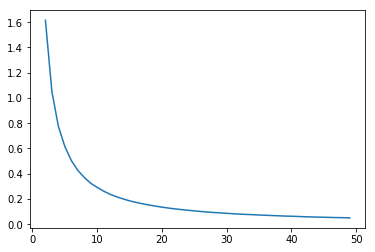

In [92]:
distances = elbow_plot(features, clusters2test = 50)

In [93]:
second_diff = np.diff(np.diff(distances))

In [94]:
second_diff

array([ 2.90261504e-01,  1.14452974e-01,  4.90940099e-02,  3.32773839e-02,
        2.15336304e-02,  1.00810413e-02,  1.33994330e-02,  3.23225407e-03,
        4.32664668e-03,  5.64695245e-03,  3.04667049e-03,  1.23007519e-03,
        3.10583598e-03,  1.41544860e-03,  7.20122680e-04,  1.28571166e-03,
        7.63335510e-04,  8.29857254e-04,  6.62616398e-04,  1.00608084e-03,
        1.02681967e-04,  6.70050162e-04, -2.06013217e-04,  1.10998485e-03,
       -4.06755485e-05,  8.08863560e-04, -3.94265923e-04,  1.45836630e-04,
        5.02710429e-04,  1.97079609e-04,  7.00642340e-04, -7.51086619e-04,
        7.68995312e-04, -5.52735512e-04,  6.45706247e-04, -4.43257481e-04,
        8.23456045e-04, -1.14502041e-04, -6.70730327e-04,  8.06424907e-04,
       -2.06858669e-04,  4.92646845e-04, -2.21213424e-04,  1.78672847e-04,
        3.89909458e-04, -1.04196028e-03])

In [95]:
if second_diff[0] > 0:
    m_sign = 1
else:
    m_sign = 0
cluster_index = 0
for idx, elem in enumerate(second_diff):
    if (elem > 0 and m_sign == 0) or (elem < 0 and m_sign == 1):
        cluster_index = idx
        break
print(cluster_index)

22


## Kmeans

In [96]:
Kmeans = KMeans(n_clusters = cluster_index).fit(features)

In [97]:
cluster_number = pd.DataFrame(Kmeans.predict(features), columns = ['SubClusterNumber'])
cluster_number

,SubClusterNumber
0,9
1,21
2,11
3,1
4,8
...,...
31831,8
31832,7
31833,20
31834,8


In [99]:
cluster_0['SubClusterNumber'] = cluster_number['SubClusterNumber'].tolist()

/opt/conda/envs/nlp/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [100]:
cluster_0[:10]

,Unnamed: 0,Unnamed: 0.1,product,sessionId,_text,templateId,id,time,name,diff,clase,lemma,ClusterNumber,tipified,SubClusterNumber
1,1,1,/voicebot_codensa_b2c,1-1578082408.737052,escorpion corte de energia desde las 8 de la manana y son las 3 de la manana solucionar el problema Por favor,emergencias,8,2020-01-03 15:14:48.127871-05:00,Emergencias,0.259904,Emergencias,escorpion corte energia manana ser manana solucionar problema,11,0,9
3,3,3,/voicebot_codensa_b2c,2-1578082699.601374,"y casi todos los dias estamos sin luz en el primero todos fueron 12 horas , y ahora otra vez no",emergencias,30,2020-01-03 15:19:38.406214-05:00,Emergencias,0.255137,Emergencias,casi dia estar luz primero ser hora ahora vez no,11,0,21
4,4,4,/voicebot_codensa_b2c,2-1578082796.601402,hay muchos cortes de energia constantes bajones de luz porque ya me bloqueo porque me esta danando los aparatos,emergencias,37,2020-01-03 15:21:22.117893-05:00,Emergencias,0.099053,Emergencias,haber cortes energia constantes bajones luz porque ya bloquear porque danando aparatos,11,0,11
6,6,6,/voicebot_codensa_b2c,1-1578082867.737243,problemas del servicio,emergencias,47,2020-01-03 15:22:30.122180-05:00,Emergencias,0.393107,Emergencias,problema servicio,8,0,1
8,8,8,/voicebot_codensa_b2c,1-1578082985.737287,lo que pasa es que tengo un problema con la vaina de la energia que dice una casa y estoy esperando a ponerme las luces ya que los 20 dias Entonces eso es lo que pasa que no me explique no me digan que es lo que pasa sobre eso,emergencias,58,2020-01-03 15:24:22.121047-05:00,Emergencias,0.106807,Emergencias,paso ser que tener problema vaina energia hacer casa estar esperar poner lunes ya que dia entonces ser paso que no explicar no digna que ser paso,11,0,8
13,13,13,/voicebot_codensa_b2c,2-1578083304.601545,problema del servicio,emergencias,107,2020-01-03 15:29:23.065219-05:00,Emergencias,0.393107,Emergencias,problema servicio,8,0,1
17,17,17,/voicebot_codensa_b2c,1-1578083598.737579,Espera yo no tengo por favor,emergencias,140,2020-01-03 15:34:40.976064-05:00,Emergencias,0.098138,Emergencias,esperar no tener,11,0,5
19,19,19,/voicebot_codensa_b2c,2-1578083666.601670,estamos completando en el municipio de terrazas La Vega + municipio de Salvatierra viejas mas de 4 horas ya queremos saber que pasa tenemos medicamentos en congelado en congelacion y no se esta preocupando,emergencias,150,2020-01-03 15:36:04.524904-05:00,Emergencias,0.221386,Emergencias,estar completar municipio terrazas vega municipio salvatierra viejas mas hora ya querer saber que paso tener medicamentos congelado congelacion no preocupar,11,0,2
20,20,20,/voicebot_codensa_b2c,2-1578083782.601713,amor para mas de dos horas estar sin luz en el municipio de la Vereda tierras viejas y tenemos medicamentos que se pueden danar de alto costo Queremos saber a que hora tenemos luz,emergencias,160,2020-01-03 15:37:45.536021-05:00,Emergencias,0.119846,Emergencias,amor mas dos hora estar luz municipio vereda tierras viejas tener medicamentos poder danar alto costo querer saber que hora tener luz,11,0,2
21,21,21,/voicebot_codensa_b2c,2-1578083808.601723,presentamos una falla desde esta manana y Queremos saber a que horas regresa el servicio,emergencias,162,2020-01-03 15:37:59.780216-05:00,Emergencias,0.180927,Emergencias,presentar falla manana querer saber que hora regresar servicio,11,0,3


In [102]:
cluster_0['SubClusterNumber'].value_counts().to_frame()

,SubClusterNumber
20,4265
8,3787
9,2793
6,2655
7,1911
1,1898
19,1861
4,1723
14,1543
11,1495


In [105]:
filename_cluster_0_subcluster = '/home/JulioCesar/nlp/nlp_clustering/tipified/subcluster_0_lemma.csv'

In [106]:
cluster_0.to_csv(filename_cluster_0_subcluster)

## Train model

In [107]:
cluster_to_train = cluster_0[['_text', 'lemma', 'SubClusterNumber']].rename(columns = {'lemma' : 'iteration', 'SubClusterNumber' : 'label'})

In [108]:
cluster_to_train.shape

(31836, 3)

In [109]:
cluster_to_train[:10]

,_text,iteration,label
1,escorpion corte de energia desde las 8 de la manana y son las 3 de la manana solucionar el problema Por favor,escorpion corte energia manana ser manana solucionar problema,9
3,"y casi todos los dias estamos sin luz en el primero todos fueron 12 horas , y ahora otra vez no",casi dia estar luz primero ser hora ahora vez no,21
4,hay muchos cortes de energia constantes bajones de luz porque ya me bloqueo porque me esta danando los aparatos,haber cortes energia constantes bajones luz porque ya bloquear porque danando aparatos,11
6,problemas del servicio,problema servicio,1
8,lo que pasa es que tengo un problema con la vaina de la energia que dice una casa y estoy esperando a ponerme las luces ya que los 20 dias Entonces eso es lo que pasa que no me explique no me digan que es lo que pasa sobre eso,paso ser que tener problema vaina energia hacer casa estar esperar poner lunes ya que dia entonces ser paso que no explicar no digna que ser paso,8
13,problema del servicio,problema servicio,1
17,Espera yo no tengo por favor,esperar no tener,5
19,estamos completando en el municipio de terrazas La Vega + municipio de Salvatierra viejas mas de 4 horas ya queremos saber que pasa tenemos medicamentos en congelado en congelacion y no se esta preocupando,estar completar municipio terrazas vega municipio salvatierra viejas mas hora ya querer saber que paso tener medicamentos congelado congelacion no preocupar,2
20,amor para mas de dos horas estar sin luz en el municipio de la Vereda tierras viejas y tenemos medicamentos que se pueden danar de alto costo Queremos saber a que hora tenemos luz,amor mas dos hora estar luz municipio vereda tierras viejas tener medicamentos poder danar alto costo querer saber que hora tener luz,2
21,presentamos una falla desde esta manana y Queremos saber a que horas regresa el servicio,presentar falla manana querer saber que hora regresar servicio,3


In [110]:
cluster_to_train.label = cluster_to_train.label.apply(lambda x: str(x))
cluster_to_train = cluster_to_train.dropna()
cluster_to_train.shape

(31836, 3)

### tfidf

In [111]:
Tfidf = TfidfVec()
Tfidf._embedding = TfidfVectorizer(ngram_range=(1, 4),
                                   norm='l2',
                                   min_df=10,
                                   max_df=0.5,          
                                   tokenizer=None,
                                   strip_accents=None,
                                   lowercase=False)
clasifier = ShallowModel('tfidf')
clasifier._vectorizer = Tfidf
clasifier._preprocessing = None

/opt/conda/envs/nlp/lib/python3.7/site-packages/tqdm/std.py:658: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


Number of features: 9210


SPLIT

Size of training set:     22285          
Size of validation set:   4775           
Size of test set:         4776           

TRAINING RESULTS


Accuracy:
0.82
              precision    recall  f1-score   support

           0       0.82      0.97      0.89       561
           1       0.83      0.77      0.79      1346
          10       0.87      0.97      0.92       390
          11       0.88      0.86      0.87      1093
          12       0.68      0.96      0.80       531
          13       0.84      1.00      0.91       272
          14       0.84      0.94      0.89      1037
          15       0.73      1.00      0.85       138
          16       0.92      0.99      0.96       234
          17       0.87      0.93      0.90       597
          18       0.75      1.00      0.85       150
          19       0.71      0.89      0.79      1322
           2       0.80      0.87      0.84       895
          20       0.90      0.66      0.76     

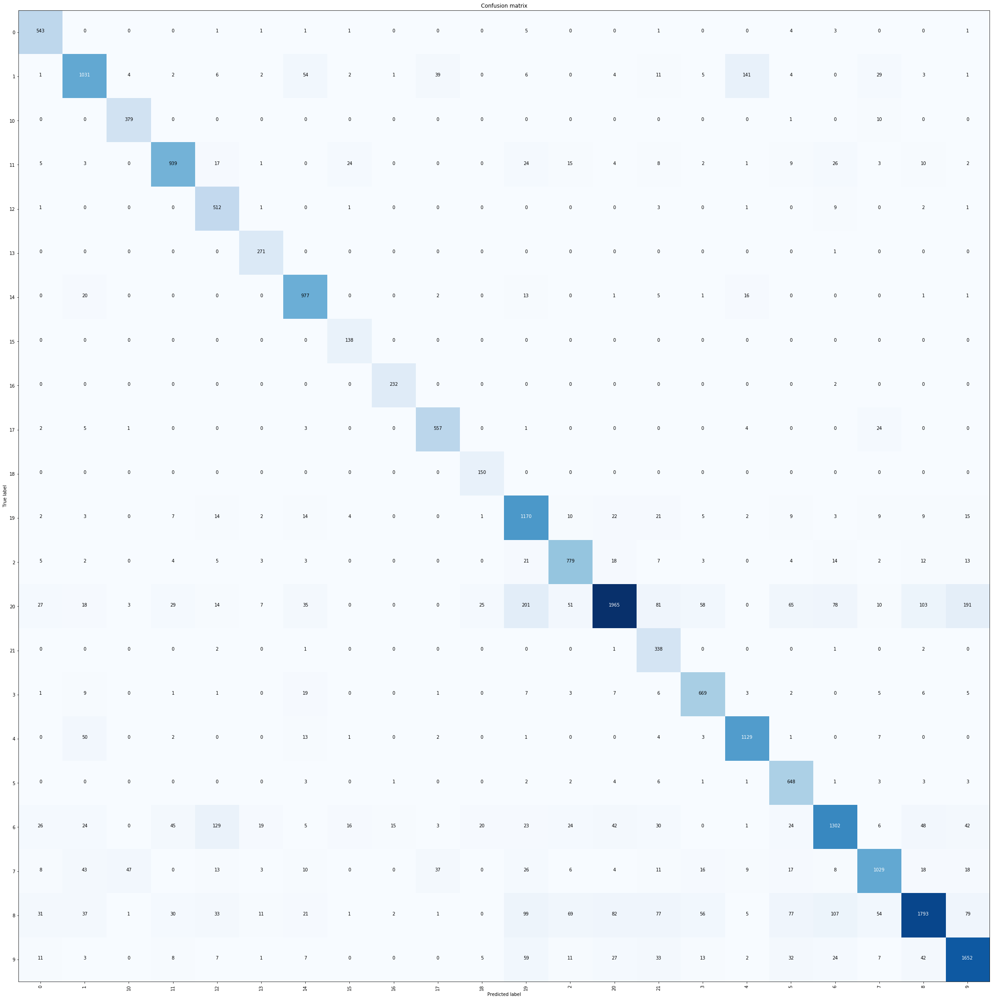


TESTING RESULTS


Accuracy:
0.72
              precision    recall  f1-score   support

           0       0.75      0.89      0.82       100
           1       0.75      0.68      0.71       287
          10       0.87      0.92      0.90        75
          11       0.76      0.82      0.79       197
          12       0.63      0.78      0.69       137
          13       0.85      0.96      0.90        67
          14       0.80      0.89      0.84       241
          15       0.63      0.93      0.75        29
          16       0.91      0.96      0.93        52
          17       0.87      0.87      0.87       117
          18       0.65      0.90      0.76        31
          19       0.60      0.75      0.67       293
           2       0.65      0.68      0.66       195
          20       0.82      0.58      0.68       643
          21       0.35      0.87      0.50        60
           3       0.69      0.78      0.73       142
           4       0.83      0.90      0.87    

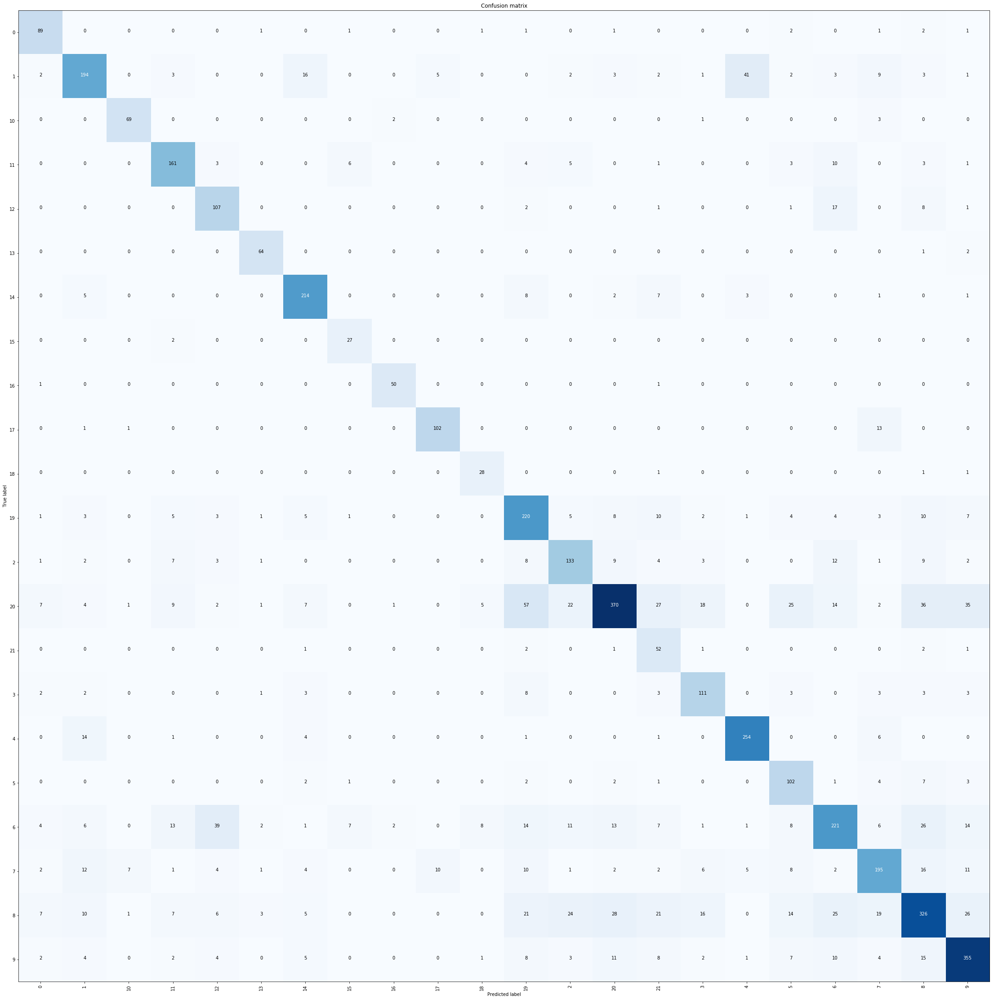

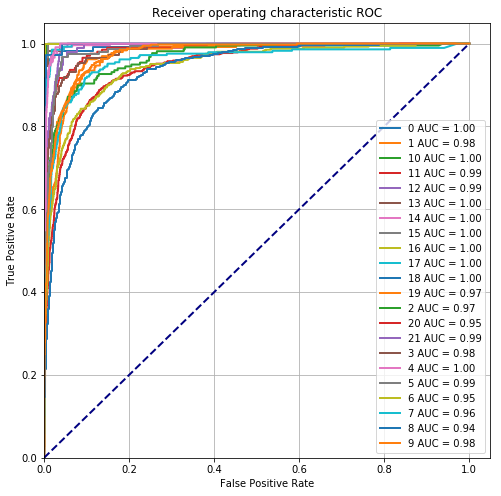

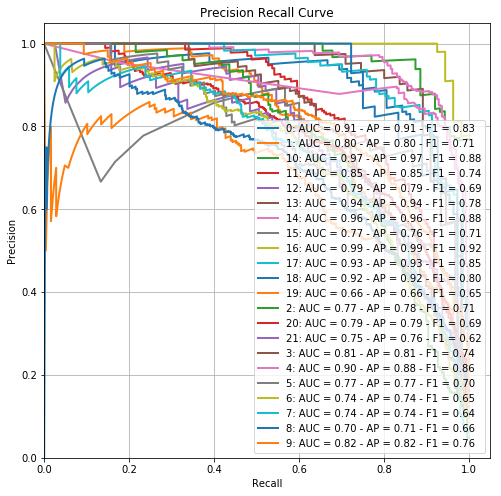


VALIDATION RESULTS

Threshold
[0.08, 0.07, 0.15, 0.12, 0.1, 0.09, 0.07, 0.09, 0.13, 0.09, 0.13, 0.1, 0.1, 0.11, 0.08, 0.07, 0.11, 0.09, 0.12, 0.08, 0.1, 0.09]


,class,false positive rate,true positive rate
0,0,0.023784,0.981481
1,1,0.101552,0.962264
2,10,0.005546,1.000000
3,11,0.035011,0.917073
4,12,0.044244,0.991597
5,13,0.008475,0.981818
6,14,0.030820,0.984906
7,15,0.009273,1.000000
8,16,0.003177,1.000000
9,17,0.018111,0.985401



TESTING RESULTS



,class,false positive rate,true positive rate
0,0,0.000428,0.530000
1,1,0.000668,0.393728
2,10,0.000213,0.773333
3,11,0.000437,0.350254
4,12,0.000862,0.335766
5,13,0.000212,0.805970
6,14,0.003087,0.688797
7,15,0.001685,0.586207
8,16,0.000212,0.923077
9,17,0.000859,0.512821


In [112]:
clasifier.fit(cluster_to_train)

### word plot

Cluster 0


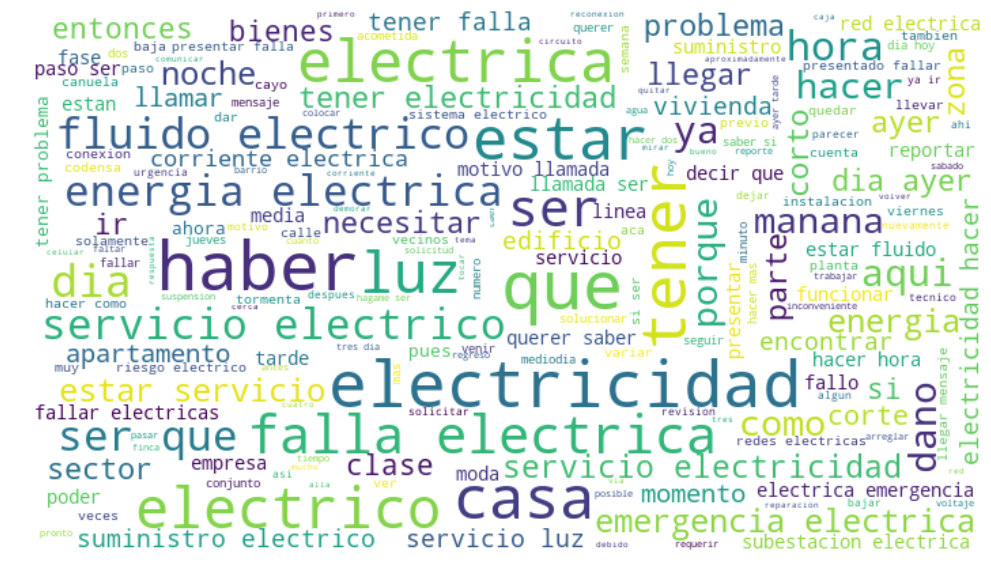

Cluster 1


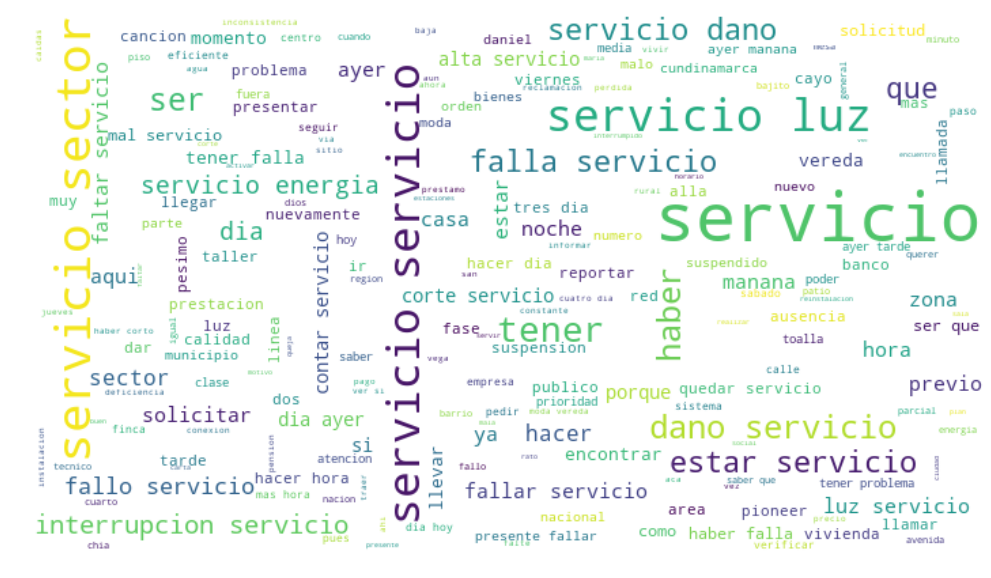

Cluster 2


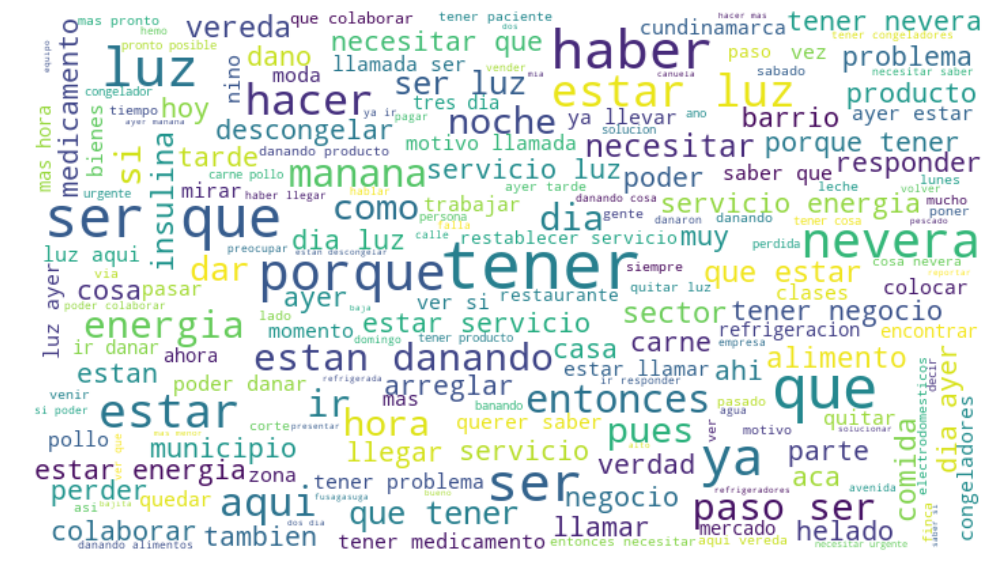

Cluster 3


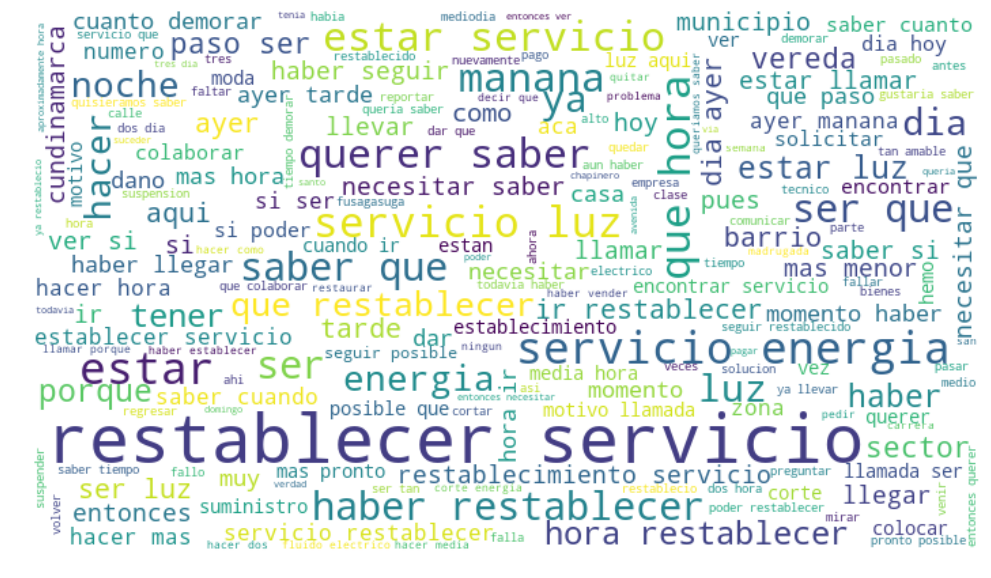

Cluster 4


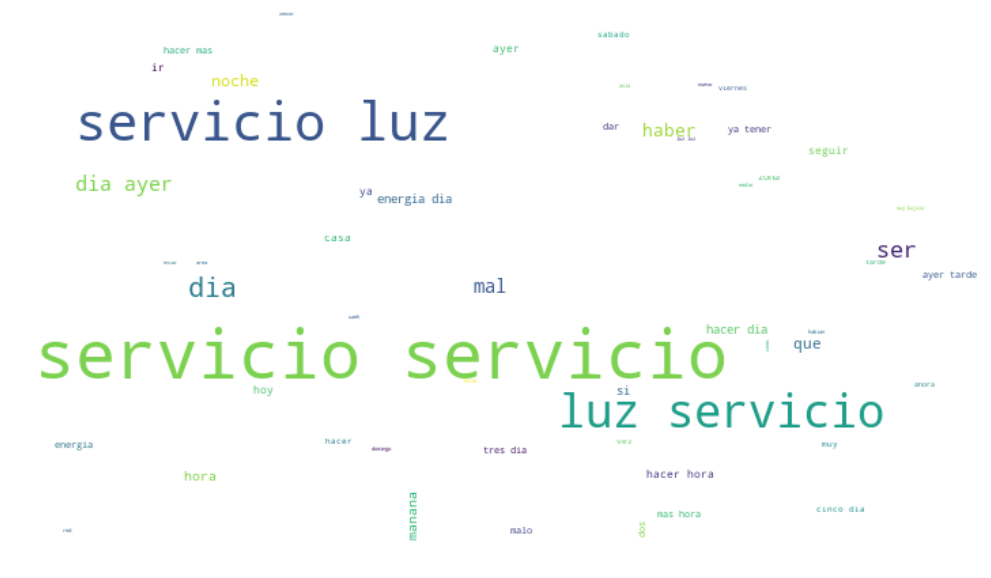

Cluster 5


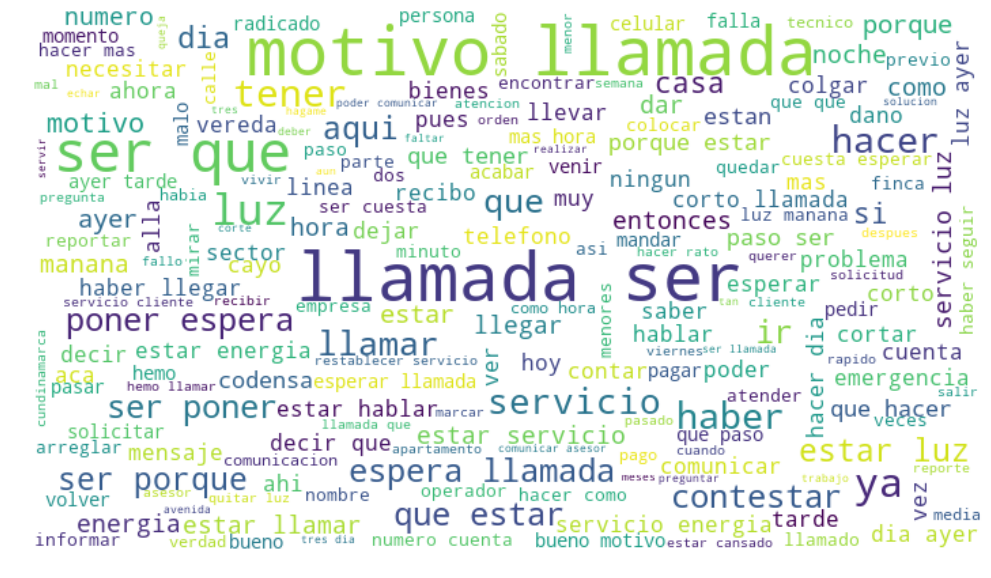

Cluster 6


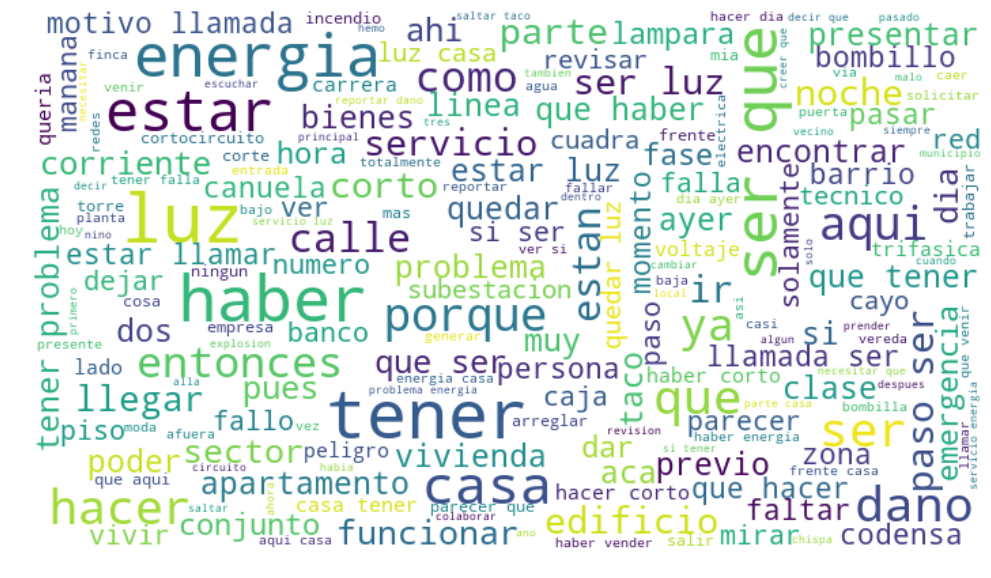

Cluster 7


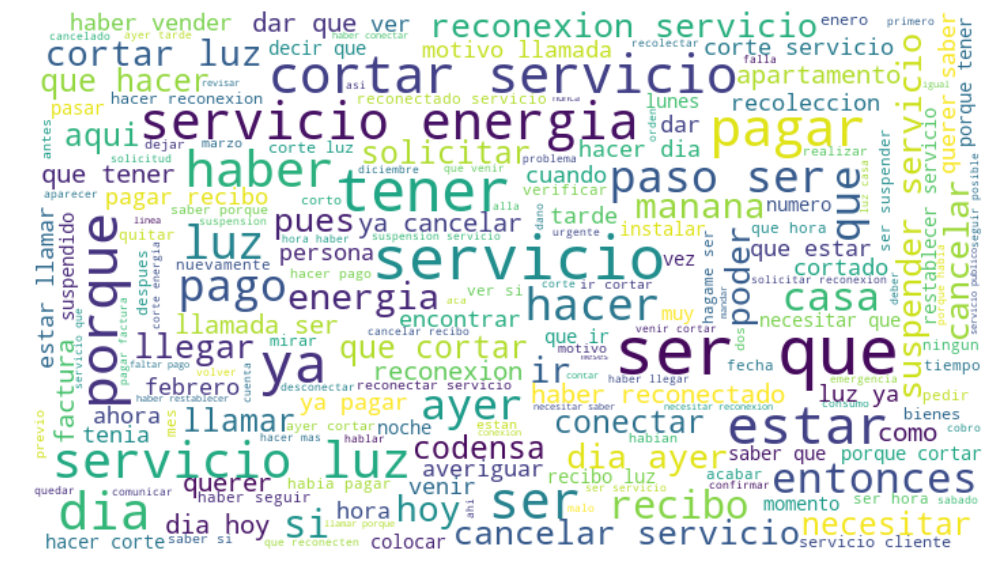

Cluster 8


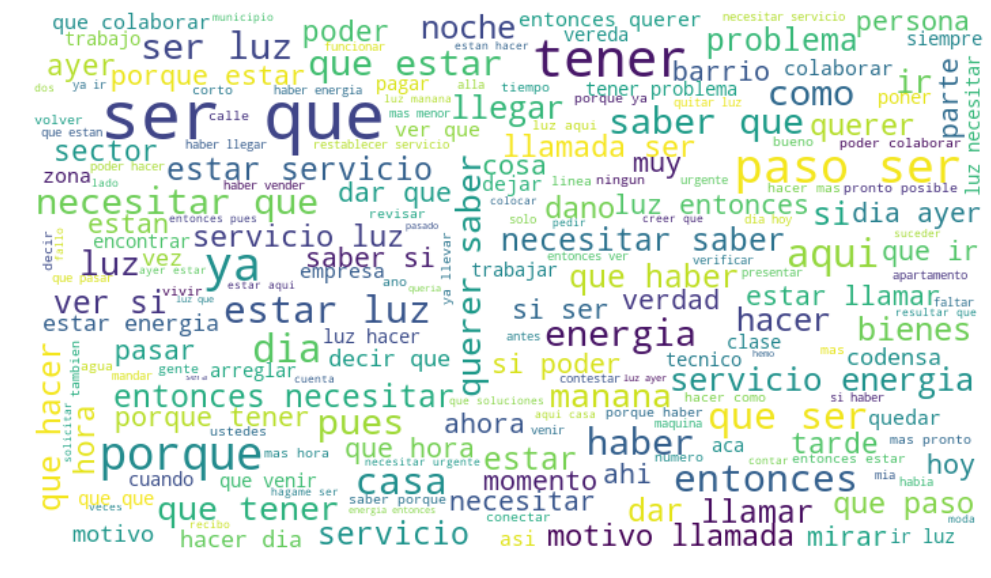

Cluster 9


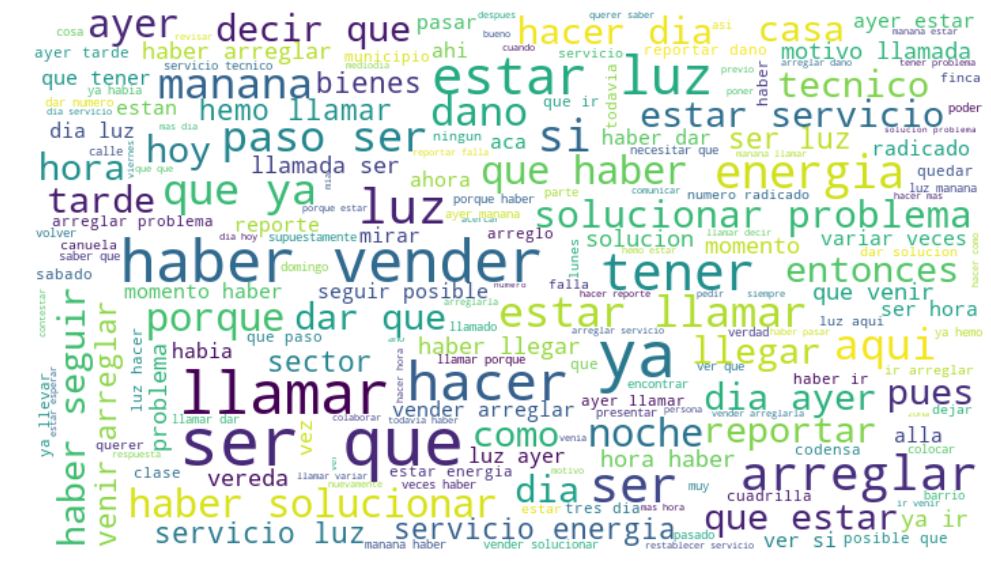

Cluster 10


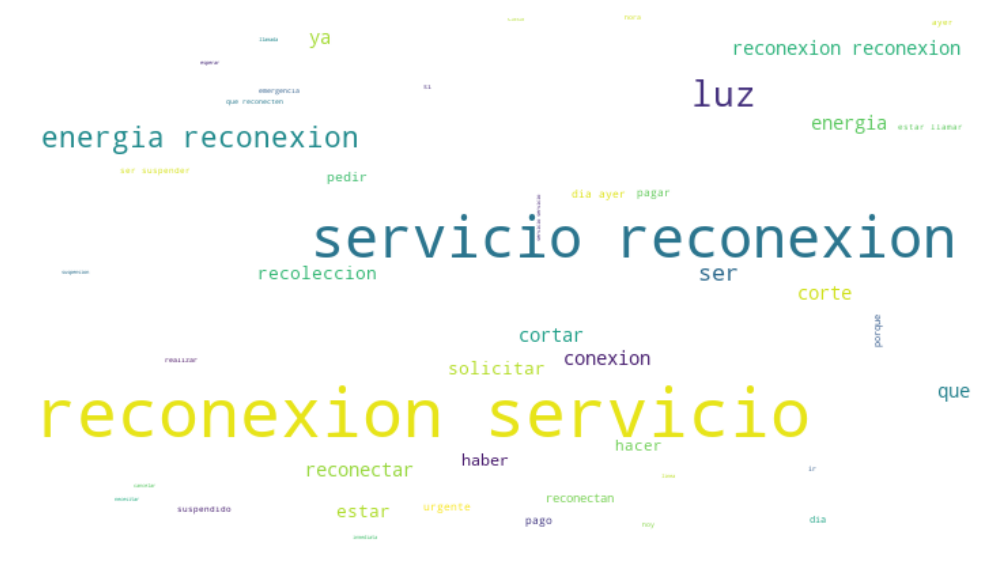

Cluster 11


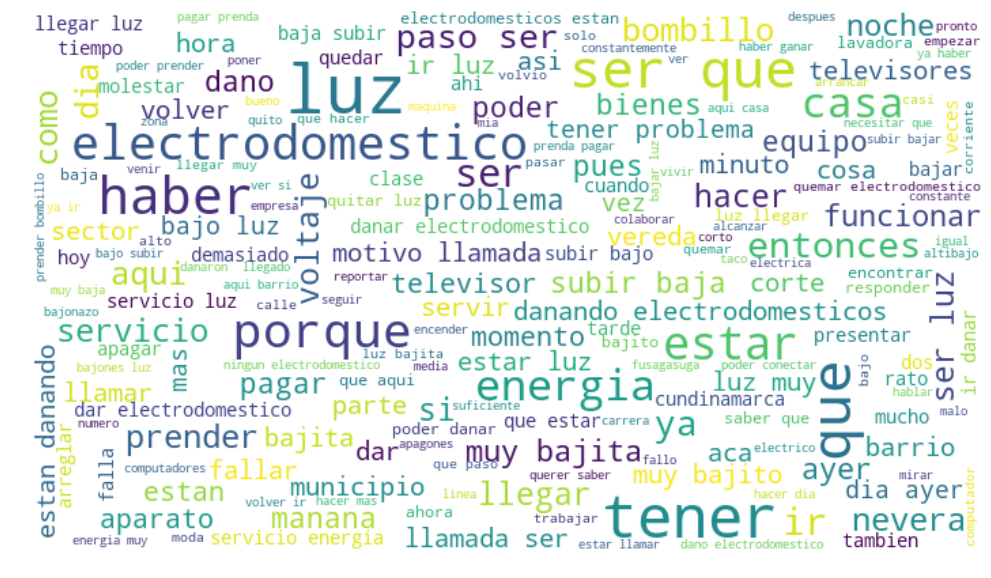

Cluster 12


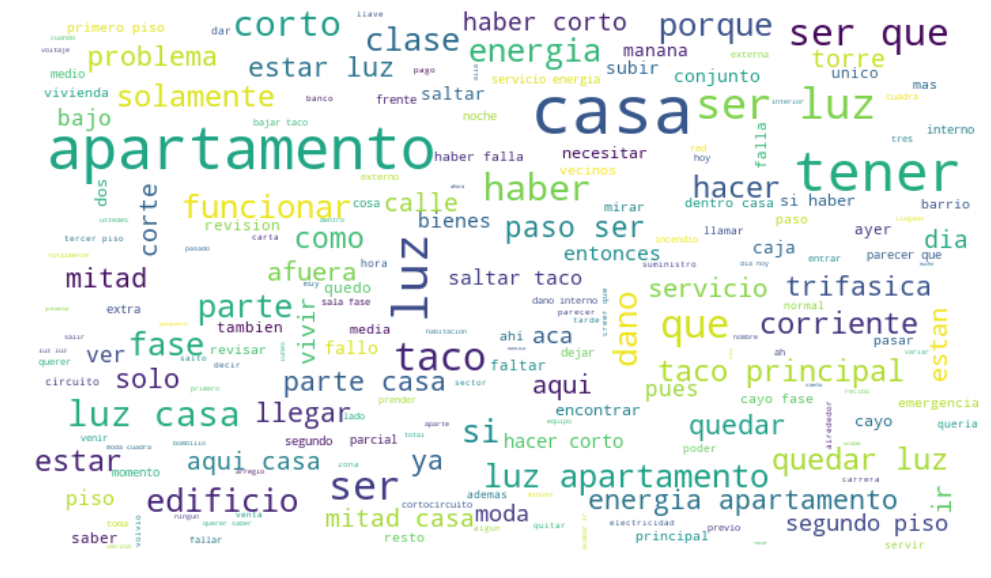

Cluster 13


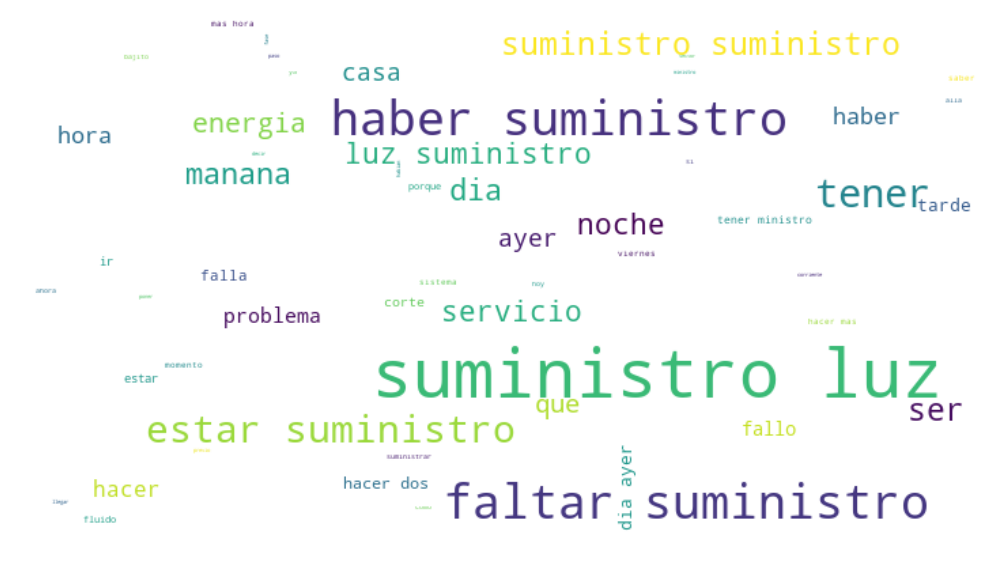

Cluster 14


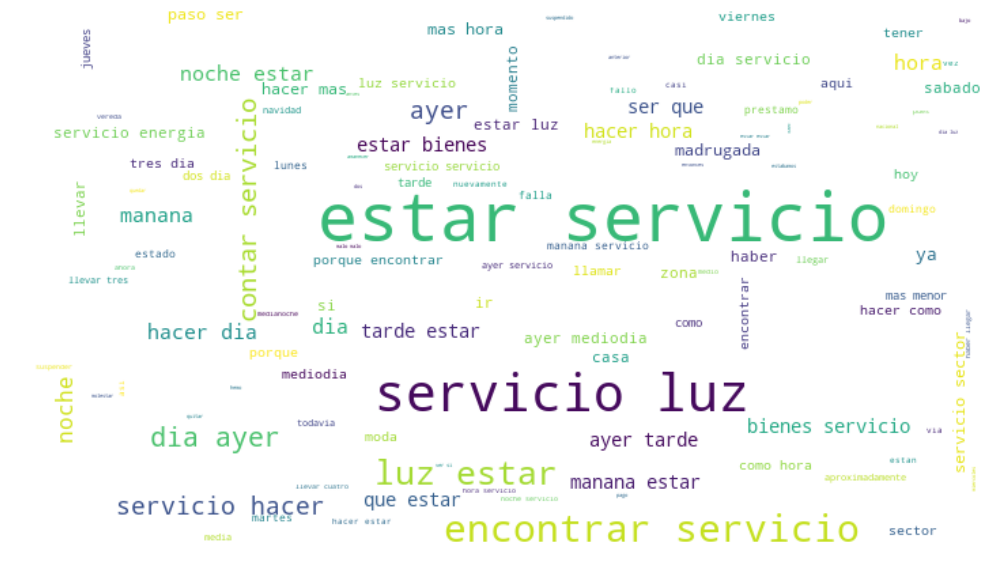

Cluster 15


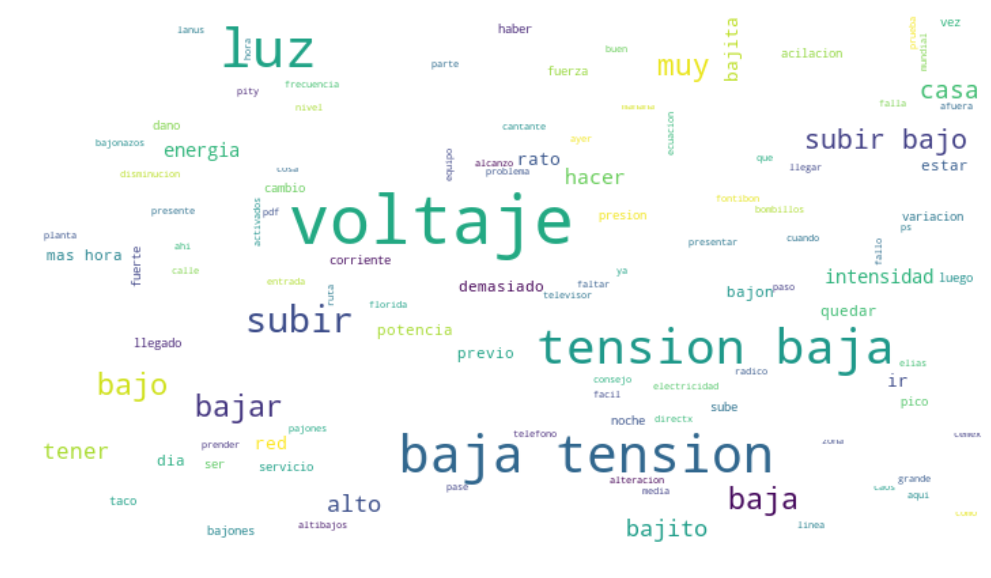

Cluster 16


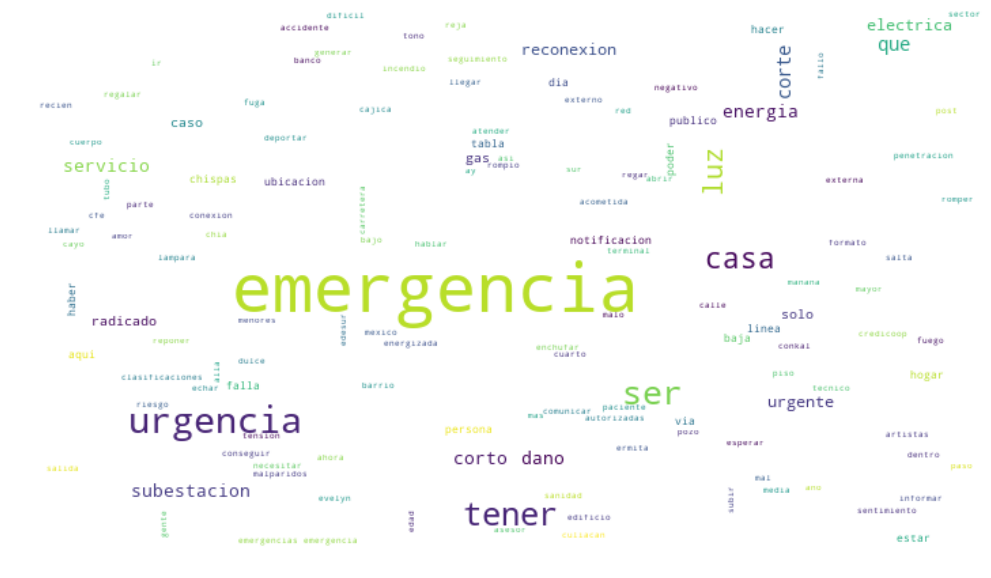

Cluster 17


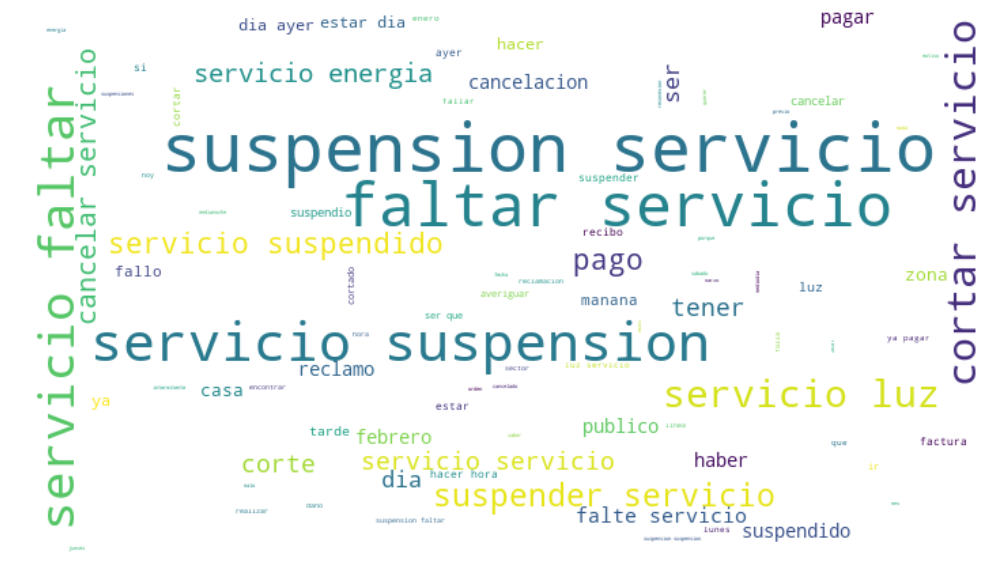

Cluster 18


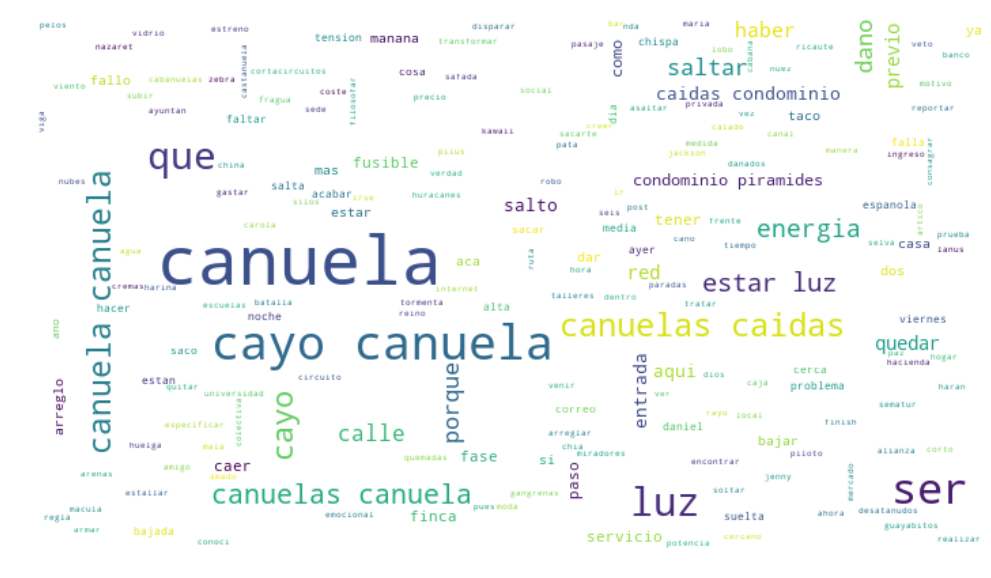

Cluster 19


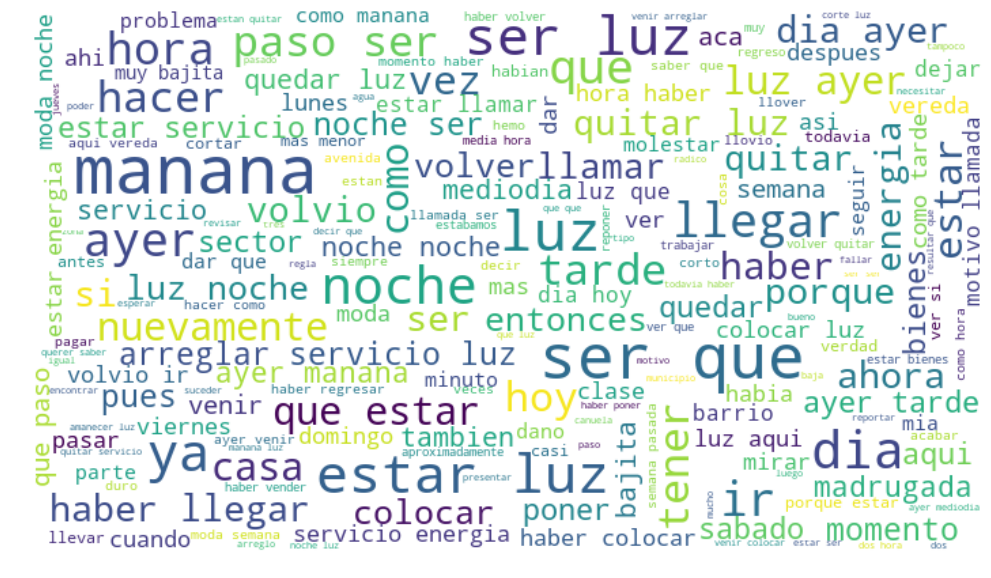

Cluster 20


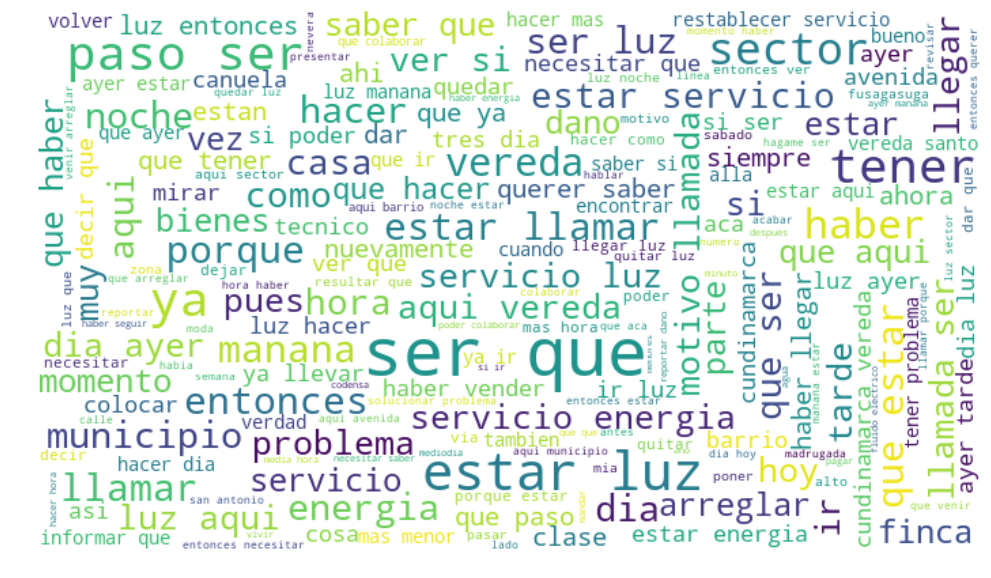

Cluster 21


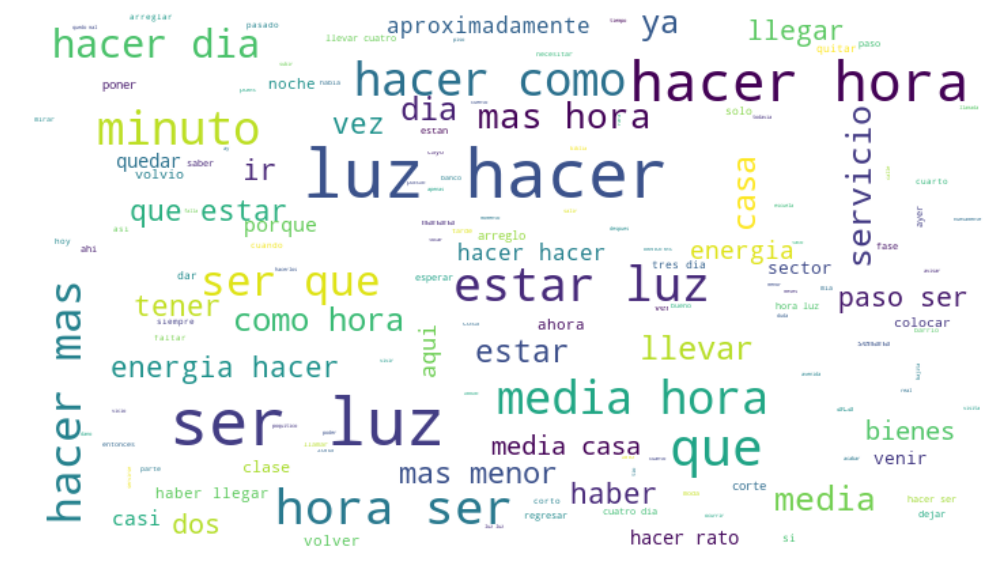

In [114]:
for i in range(cluster_index):
    try:
        print('Cluster {}'.format(i))
        plot_word_cloud(" ".join(review for review in cluster_to_train[cluster_to_train.label == str(i)].iteration.tolist()),str(i))
    except:
        pass

### vocabulario

In [115]:
vocab_per_cluster = pd.DataFrame()
for cluster in range(cluster_index):
    try:
        vocab_per_cluster['Cluster {}: Words'.format(cluster)] = vocabulary(clasifier, str(cluster)).feature.tolist()
        vocab_per_cluster['Cluster {}: Coeffs'.format(cluster)] = vocabulary(clasifier, str(cluster))[str(cluster)].tolist()
    except:
        pass
vocab_per_cluster

,Cluster 0: Words,Cluster 0: Coeffs,Cluster 1: Words,Cluster 1: Coeffs,Cluster 2: Words,Cluster 2: Coeffs,Cluster 3: Words,Cluster 3: Coeffs,Cluster 4: Words,Cluster 4: Coeffs,Cluster 5: Words,Cluster 5: Coeffs,Cluster 6: Words,Cluster 6: Coeffs,Cluster 7: Words,Cluster 7: Coeffs,Cluster 8: Words,Cluster 8: Coeffs,Cluster 9: Words,Cluster 9: Coeffs,Cluster 10: Words,Cluster 10: Coeffs,Cluster 11: Words,Cluster 11: Coeffs,Cluster 12: Words,Cluster 12: Coeffs,Cluster 13: Words,Cluster 13: Coeffs,Cluster 14: Words,Cluster 14: Coeffs,Cluster 15: Words,Cluster 15: Coeffs,Cluster 16: Words,Cluster 16: Coeffs,Cluster 17: Words,Cluster 17: Coeffs,Cluster 18: Words,Cluster 18: Coeffs,Cluster 19: Words,Cluster 19: Coeffs,Cluster 20: Words,Cluster 20: Coeffs,Cluster 21: Words,Cluster 21: Coeffs
0,electrica,13.44,servicio,10.87,nevera,7.02,restablecer,12.56,servicio,14.77,llamada,11.70,calle,3.11,recibo,5.45,necesitar,9.43,arreglar,9.56,reconexion,12.16,electrodomesticos,12.59,apartamento,10.67,suministro,12.70,estar servicio,8.52,voltaje,8.88,emergencia,11.91,servicio,8.53,canuela,10.71,manana,7.31,cundinamarca,8.22,hacer,9.48
1,electrico,13.10,dano servicio,3.15,tener,6.41,restablecer servicio,6.56,servicio luz,4.00,motivo,9.49,corriente,2.99,cortar,5.25,entonces,5.38,solucionar,7.84,conexion,4.72,prender,5.54,casa,7.45,suministro luz,4.77,servicio,6.81,baja,7.78,urgencia,6.62,suspension,5.88,canuelas,10.11,noche,6.73,municipio,8.21,minuto,5.10
2,electricidad,10.21,sector,3.13,danando,5.89,servicio,4.81,servicio dia,2.78,contestar,5.31,presentar,2.72,cancelar,5.19,que,4.89,llamar,6.53,reconectar,4.44,electrodomestico,4.64,apartamentos,5.17,fluido,4.46,encontrar,5.54,bajar,5.48,subestacion,4.45,faltar servicio,4.95,cayo,4.66,nuevamente,5.11,vereda,8.00,media,4.89
3,electricas,6.33,servicio sector,2.52,alimentos,5.51,restablecimiento,4.67,ser servicio,2.71,esperar,4.87,energia,2.64,servicio,4.87,porque,4.59,tecnico,5.56,reconexion servicio,4.05,bajita,4.37,taco,4.93,ministro,4.36,encontrar servicio,4.64,bajo,4.92,falla,2.91,cortar,4.89,red,4.63,colocar,4.66,aqui,4.66,vez,3.59
4,electricos,3.47,falla servicio,2.22,producto,5.43,saber,4.41,dia servicio,2.66,llamadas,4.48,edificio,2.51,pagar,4.86,querer,4.34,solucion,5.26,reconectan,3.98,bombillos,4.16,corto,4.84,suministrar,3.35,estar,3.98,subir,4.74,emergencias,2.66,suspendido,4.81,dano ser,2.41,quitar,4.37,sector,4.65,llevar,3.39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9205,electrodomestico,-0.82,energia,-1.69,llamada,-1.17,quedar,-0.90,que,-1.30,electrico,-1.25,servicio luz,-1.57,estar servicio,-1.43,nevera,-1.35,cundinamarca,-1.25,hacer,-0.86,servicio luz,-1.27,hacer,-1.86,luz apartamento,-0.77,no,-1.20,estar,-1.68,llamadas,-1.08,hacer,-1.27,dia,-0.87,suministro,-1.57,emergencia,-1.03,ayer,-1.82
9206,ya,-0.96,luz,-2.09,emergencia,-1.19,bienes,-1.12,no,-1.47,suministro,-1.36,dia,-2.45,estar,-1.48,municipio,-1.63,quitar,-1.25,casa,-0.93,no haber,-1.54,ayer,-2.13,dano,-0.80,tener,-1.33,no,-1.88,no,-1.20,ser,-1.29,tener,-1.06,necesitar,-1.72,apartamento,-1.06,aqui,-1.82
9207,ser luz,-1.02,ser,-2.17,hacer,-1.58,problema,-1.14,tener,-1.58,arreglar,-1.42,manana,-2.58,sector,-1.50,vereda,-1.69,casa,-1.34,informacion,-0.97,hora,-1.55,dia,-2.38,apartamento,-0.86,energia,-1.37,ser,-1.92,estar,-1.24,estar,-1.42,hacer,-1.23,hacer,-2.13,casa,-1.37,haber,-2.23
9208,luz,-1.88,que,-2.53,casa,-1.98,tener,-1.57,estar servicio,-1.88,haber,-1.44,hora,-2.91,dano,-1.67,servicio,-1.87,necesitar,-1.40,necesitar,-0.98,hacer,-1.81,estar,-3.08,que,-1.46,ser,-1.59,que,-1.97,que,-1.32,no,-1.70,no,-1.89,tener,-2.20,electrodomesticos,-1.45,tener,-2.78


In [117]:
vocab_per_cluster[:30]

,Cluster 0: Words,Cluster 0: Coeffs,Cluster 1: Words,Cluster 1: Coeffs,Cluster 2: Words,Cluster 2: Coeffs,Cluster 3: Words,Cluster 3: Coeffs,Cluster 4: Words,Cluster 4: Coeffs,Cluster 5: Words,Cluster 5: Coeffs,Cluster 6: Words,Cluster 6: Coeffs,Cluster 7: Words,Cluster 7: Coeffs,Cluster 8: Words,Cluster 8: Coeffs,Cluster 9: Words,Cluster 9: Coeffs,Cluster 10: Words,Cluster 10: Coeffs,Cluster 11: Words,Cluster 11: Coeffs,Cluster 12: Words,Cluster 12: Coeffs,Cluster 13: Words,Cluster 13: Coeffs,Cluster 14: Words,Cluster 14: Coeffs,Cluster 15: Words,Cluster 15: Coeffs,Cluster 16: Words,Cluster 16: Coeffs,Cluster 17: Words,Cluster 17: Coeffs,Cluster 18: Words,Cluster 18: Coeffs,Cluster 19: Words,Cluster 19: Coeffs,Cluster 20: Words,Cluster 20: Coeffs,Cluster 21: Words,Cluster 21: Coeffs
0,electrica,13.44,servicio,10.87,nevera,7.02,restablecer,12.56,servicio,14.77,llamada,11.70,calle,3.11,recibo,5.45,necesitar,9.43,arreglar,9.56,reconexion,12.16,electrodomesticos,12.59,apartamento,10.67,suministro,12.70,estar servicio,8.52,voltaje,8.88,emergencia,11.91,servicio,8.53,canuela,10.71,manana,7.31,cundinamarca,8.22,hacer,9.48
1,electrico,13.10,dano servicio,3.15,tener,6.41,restablecer servicio,6.56,servicio luz,4.00,motivo,9.49,corriente,2.99,cortar,5.25,entonces,5.38,solucionar,7.84,conexion,4.72,prender,5.54,casa,7.45,suministro luz,4.77,servicio,6.81,baja,7.78,urgencia,6.62,suspension,5.88,canuelas,10.11,noche,6.73,municipio,8.21,minuto,5.10
2,electricidad,10.21,sector,3.13,danando,5.89,servicio,4.81,servicio dia,2.78,contestar,5.31,presentar,2.72,cancelar,5.19,que,4.89,llamar,6.53,reconectar,4.44,electrodomestico,4.64,apartamentos,5.17,fluido,4.46,encontrar,5.54,bajar,5.48,subestacion,4.45,faltar servicio,4.95,cayo,4.66,nuevamente,5.11,vereda,8.00,media,4.89
3,electricas,6.33,servicio sector,2.52,alimentos,5.51,restablecimiento,4.67,ser servicio,2.71,esperar,4.87,energia,2.64,servicio,4.87,porque,4.59,tecnico,5.56,reconexion servicio,4.05,bajita,4.37,taco,4.93,ministro,4.36,encontrar servicio,4.64,bajo,4.92,falla,2.91,cortar,4.89,red,4.63,colocar,4.66,aqui,4.66,vez,3.59
4,electricos,3.47,falla servicio,2.22,producto,5.43,saber,4.41,dia servicio,2.66,llamadas,4.48,edificio,2.51,pagar,4.86,querer,4.34,solucion,5.26,reconectan,3.98,bombillos,4.16,corto,4.84,suministrar,3.35,estar,3.98,subir,4.74,emergencias,2.66,suspendido,4.81,dano ser,2.41,quitar,4.37,sector,4.65,llevar,3.39
5,falla electrica,3.18,interrupcion servicio,2.12,insulina,5.01,establecimiento,4.05,servicio noche,2.44,llamar,4.05,dano,2.50,factura,3.49,poder,2.84,haber,3.97,recoleccion,3.80,quemar,3.98,edificio,4.67,faltar suministro,2.39,no contar servicio,2.70,tension,3.67,asi mas,1.89,cortar servicio,4.73,cabanuelas,2.23,ayer,4.34,barrio,3.89,hora,2.91
6,servicio electrico,3.13,haber servicio,1.89,carne,4.51,establecer,3.65,dia,2.35,motivo llamada,3.76,vivienda,2.44,reconexion,3.20,colaborar,2.58,problema,3.69,reconectar servicio,3.42,televisor,3.97,solamente,4.41,tener ministro,2.22,no contar,2.50,bajon luz,3.50,corte,1.83,suspender,4.64,ser dano,2.16,volvio,4.15,estar,3.10,media casa,2.45
7,energia electrica,3.00,fallo servicio,1.88,comida,4.35,cuanto,3.64,seguir servicio,2.05,bueno,3.21,parecer,2.43,pago,3.07,ser,2.51,reportar,3.48,recoleccion servicio,3.28,aparatos,3.85,trifasica,4.24,no tener ministro,2.22,servicio luz,2.48,bajon,3.17,tener emergencia,1.74,faltar,4.35,canuelas caidas,2.14,luz,3.73,avenida,3.09,luz hacer,2.39
8,fallar electricas,2.39,banco servicio,1.88,descongelar,4.18,querer,3.42,haber servicio luz,1.99,mensaje,2.99,banco,2.42,conectar,2.90,estar,2.36,radicado,3.41,conexion servicio,2.97,equipos,3.74,clases,3.93,estar suministro,2.21,estar bienes servicio,2.47,bajar luz,2.66,luz asi,1.69,suspension servicio,4.30,fase estar,2.12,tarde,3.58,llamar,2.83,como,2.34
9,electricaribe,2.00,interrupcion,1.86,negocio,4.02,hora,3.41,servicio ayer,1.96,comunicar,2.79,conjunto,2.39,porque,2.73,saber,2.29,venir,3.00,servicio,2.57,televisores,3.35,fase,3.77,falla 

In [118]:
vocab_per_cluster[['Cluster {}: Words'.format(x) for x in range(cluster_index)]][:30]

,Cluster 0: Words,Cluster 1: Words,Cluster 2: Words,Cluster 3: Words,Cluster 4: Words,Cluster 5: Words,Cluster 6: Words,Cluster 7: Words,Cluster 8: Words,Cluster 9: Words,Cluster 10: Words,Cluster 11: Words,Cluster 12: Words,Cluster 13: Words,Cluster 14: Words,Cluster 15: Words,Cluster 16: Words,Cluster 17: Words,Cluster 18: Words,Cluster 19: Words,Cluster 20: Words,Cluster 21: Words
0,electrica,servicio,nevera,restablecer,servicio,llamada,calle,recibo,necesitar,arreglar,reconexion,electrodomesticos,apartamento,suministro,estar servicio,voltaje,emergencia,servicio,canuela,manana,cundinamarca,hacer
1,electrico,dano servicio,tener,restablecer servicio,servicio luz,motivo,corriente,cortar,entonces,solucionar,conexion,prender,casa,suministro luz,servicio,baja,urgencia,suspension,canuelas,noche,municipio,minuto
2,electricidad,sector,danando,servicio,servicio dia,contestar,presentar,cancelar,que,llamar,reconectar,electrodomestico,apartamentos,fluido,encontrar,bajar,subestacion,faltar servicio,cayo,nuevamente,vereda,media
3,electricas,servicio sector,alimentos,restablecimiento,ser servicio,esperar,energia,servicio,porque,tecnico,reconexion servicio,bajita,taco,ministro,encontrar servicio,bajo,falla,cortar,red,colocar,aqui,vez
4,electricos,falla servicio,producto,saber,dia servicio,llamadas,edificio,pagar,querer,solucion,reconectan,bombillos,corto,suministrar,estar,subir,emergencias,suspendido,dano ser,quitar,sector,llevar
5,falla electrica,interrupcion servicio,insulina,establecimiento,servicio noche,llamar,dano,factura,poder,haber,recoleccion,quemar,edificio,faltar suministro,no contar servicio,tension,asi mas,cortar servicio,cabanuelas,ayer,barrio,hora
6,servicio electrico,haber servicio,carne,establecer,dia,motivo llamada,vivienda,reconexion,colaborar,problema,reconectar servicio,televisor,solamente,tener ministro,no contar,bajon luz,corte,suspender,ser dano,volvio,estar,media casa
7,energia electrica,fallo servicio,comida,cuanto,seguir servicio,bueno,parecer,pago,ser,reportar,recoleccion servicio,aparatos,trifasica,no tener ministro,servicio luz,bajon,tener emergencia,faltar,canuelas caidas,luz,avenida,luz hacer
8,fallar electricas,banco servicio,descongelar,querer,haber servicio luz,mensaje,banco,conectar,estar,radicado,conexion servicio,equipos,clases,estar suministro,estar bienes servicio,bajar luz,luz asi,suspension servicio,fase estar,tarde,llamar,como
9,electricaribe,interrupcion,negocio,hora,servicio ayer,comunicar,conjunto,porque,saber,venir,servicio,televisores,fase,falla sistema,contar servicio,bajita luz,urgente,suspender servicio,seis,semana,finca,hacer dia


In [211]:
cluster_to_train[cluster_to_train.label == str(8)]

,_text,iteration,label
93407,el sopo carretera Vereda Mercenario enfrente de la Hacienda Buenavista siguen las canuelas transformadores botando chispas porque fueron y arreglaron el problema pero no podaron los arboles entonces en cualquier momento se vuelve a quemar las canuelas o a explotar el transformador si ustedes no van de inmediato hacer la respectiva poda,sopar carretera vereda mercenario enfrente hacienda buenavista seguir canuelas transformadores botar chispas porque ser arreglar problema no podar arboles entonces momento volver quemar canuelas explotar transformador si no ir inmediata hacer respectivo podar,8
17429,que es una falla de energia debido a que se cayo un arbol sobre las fuerzas de la luz,que ser falla energia debido que cayo arbol fuerzas luz,8
62492,el motivo de mi llamada es porque en estos momentos cayo un pedazo de arbol sobre las cuerdas aqui en el sector de la piscina y estamos sin luz,motivo llamada ser porque momento cayo pedazo arbol cuerdas aqui sector piscina estar luz,8
82727,suspension del servicio en esta zona por una tormenta electrica tenemos un arbol sobre las cuerdas de alta tension al parecer esta energizado y para evitar una tragedia solicitamos un servicio de urgencia de urgencia en este sector un servicio de urgencia y emergencia en la espalda esta presentando en ese sector,suspension servicio zona tormenta electrica tener arbol cuerdas alta tension parecer energizado evitar tragedia solicitar servicio urgencia urgencia sector servicio urgencia emergencia espalda presentado sector,8
82345,no tengo luz electrica en mi casa un arbol cayo sobre las cuerdas,no tener luz electrica casa arbol cayo cuerdas,8
65634,lo que pasa es que se caguen arbolitos yo las cuerdas y de ahi incendio en la Vereda,paso ser que cagar arbolitos cuerdas ahi incendio vereda,8
94897,5 casas y Dulce cayo un arbol torrento cuerdas 515 cada sin luz aqui en Florencia,clases dulce cayo arbol torrento cuerdas luz aqui florencia,8
74950,y en nuestro edificio ubicado en la carrera 14b 119-10 tenemos una subestacion electrica dentro de nuestro parqueadero cuando llueve es esta filtrando el agua pura y con riesgo de un cortocircuito y aqui habitan bastantes ninos y los arboles que estan por la calle 119 ya los cables de la energia estan dentro de los arboles Asi que es urgente que nos hagan un mantenimiento,edificio ubicado carrera b tener subestacion electrica dentro parqueadero cuando llover ser filtrar agua pura riesgo cortocircuito aqui habitar ninos arboles estan calle ya cables energia estan dentro arboles asi ser urgente que hacer mantenimiento,8
9493,es para informar que la poblacion de capataz en la Vereda del alto del gramal al pie del transformador que hay aqui se revento un cable porque anoche hubo una una borrasca fuertemente reventon que esta sobre camino donde mucha gente pasa y queremos mama para que venga,ser informar que poblacion capataz vereda alto gramal pie transformador haber aqui revento cable porque noche haber borrasca fuertemente reventon camino gente paso querer mama que venta,8
6895,poste ladeado los casos teniendo un arbol y una rama y la base esta agrietada,poste ladeado caso tener arbol rama base agrietada,8


### Crear grafos

In [116]:
for label_test in range(cluster_index):
    foldername = '/home/JulioCesar/nlp/nlp_clustering/tipified/sub_cluster_otros/subluster_{}'.format(label_test)
    if not os.path.exists(foldername):
        os.makedirs(foldername)
    for idx_feature in range(10):
        graph = create_adjacency_graph(data_set = cluster_to_train,
                                       model = clasifier,
                                       label = str(label_test),
                                       num_features = idx_feature,
                                       per_class = True,
                                       levels = 2)
        filename = os.path.join(foldername, 'subcluster_{}_feature_{}'.format(label_test, idx_feature))
        graph.render(filename)

### Sinonimos

In [132]:
similarities = fasttext._embedding.wv.most_similar(positive=['sector'],
                                                   # negative=['interface'],
                                                   topn = 20)
similarities

[('doctor', 0.7417510747909546),
 ('sectores', 0.704964280128479),
 ('rio', 0.6726216673851013),
 ('actor', 0.6691967248916626),
 ('victoria', 0.6548019647598267),
 ('tio', 0.6411941051483154),
 ('ria', 0.6392053365707397),
 ('berea', 0.6238066554069519),
 ('gloria', 0.6195113062858582),
 ('avenida', 0.6155879497528076),
 ('veredas', 0.6068809032440186),
 ('siberia', 0.6026020646095276),
 ('urbana', 0.6005663275718689),
 ('murio', 0.5952690839767456),
 ('calandaima', 0.5947011709213257),
 ('cruz', 0.5938717722892761),
 ('area', 0.5918769240379333),
 ('iberia', 0.5899730920791626),
 ('vereda', 0.5889910459518433),
 ('chica', 0.5859625339508057)]

### Cluster 0 (Other): Tipified

In [154]:
sin_servicio_calle_cluster_0_lst = [20, 6]
posible_averia_cliente_cluster_0_lst = [9, 1, 19, 4, 14, 17, 12, 0, 21, 13]
intermitencia_cluster_0_lst = [11]
electrodependiente_cluster_0_lst = [2]
otros_cluster_0_lst = [3, 5, 7, 8, 10, 15, 16, 18]

In [ ]:
'''
sin_suministro_calle_cluster,
posible_averia_cliente_cluster,
cables_cluster,
intermitencia_cluster,
transformador_contador_cluster,
postes_cluster,
electrodependiente_cluster,
arboles_cluster
'''

In [156]:
print(sin_suministro_calle_cluster.shape,
        posible_averia_cliente_cluster.shape,
        cables_cluster.shape,
        intermitencia_cluster.shape,
        transformador_contador_cluster.shape,
        postes_cluster.shape,
        electrodependiente_cluster.shape,
        arboles_cluster.shape)

(29795, 13) (44333, 13) (3225, 13) (905, 13) (2978, 13) (1036, 13) (1797, 13) (573, 13)


In [158]:
cluster_0[:2]

,Unnamed: 0,Unnamed: 0.1,product,sessionId,_text,templateId,id,time,name,diff,clase,lemma,ClusterNumber,tipified,SubClusterNumber
1,1,1,/voicebot_codensa_b2c,1-1578082408.737052,escorpion corte de energia desde las 8 de la manana y son las 3 de la manana solucionar el problema Por favor,emergencias,8,2020-01-03 15:14:48.127871-05:00,Emergencias,0.259904,Emergencias,escorpion corte energia manana ser manana solucionar problema,11,0,9
3,3,3,/voicebot_codensa_b2c,2-1578082699.601374,"y casi todos los dias estamos sin luz en el primero todos fueron 12 horas , y ahora otra vez no",emergencias,30,2020-01-03 15:19:38.406214-05:00,Emergencias,0.255137,Emergencias,casi dia estar luz primero ser hora ahora vez no,11,0,21


In [159]:
sin_servicio_calle_cluster_0 = cluster_0[cluster_0['SubClusterNumber'].isin(sin_servicio_calle_cluster_0_lst)]
print('sin_servicio_calle_cluster_0', sin_servicio_calle_cluster_0.shape)

posible_averia_cliente_cluster_0 = cluster_0[cluster_0['SubClusterNumber'].isin(posible_averia_cliente_cluster_0_lst)]
print('posible_averia_cliente_cluster_0', posible_averia_cliente_cluster_0.shape)

intermitencia_cluster_0 = cluster_0[cluster_0['SubClusterNumber'].isin(intermitencia_cluster_0_lst)]
print('intermitencia_cluster_0', intermitencia_cluster_0.shape)

electrodependiente_cluster_0 = cluster_0[cluster_0['SubClusterNumber'].isin(electrodependiente_cluster_0_lst)]
print('electrodependiente_cluster_0', electrodependiente_cluster_0.shape)

otros_cluster_0 = cluster_0[cluster_0['SubClusterNumber'].isin(otros_cluster_0_lst)]
print('otros_cluster_0', otros_cluster_0.shape)

sin_servicio_calle_cluster_0 (6920, 15)
posible_averia_cliente_cluster_0 (13119, 15)
intermitencia_cluster_0 (1495, 15)
electrodependiente_cluster_0 (1308, 15)
otros_cluster_0 (8994, 15)


(31836, 15)

In [161]:
'''
clusters_0_list = [sin_servicio_calle_cluster_0,
                 posible_averia_cliente_cluster_0,
                 intermitencia_cluster_0,
                 electrodependiente_cluster_0,
                 otros_cluster_0]
'''

In [ ]:
'''
{0: 'otro',
 1: 'sin_suministro_calle',
 2: 'posible_averia_cliente',
 3: 'cables',
 4: 'intermitencia',
 5: 'transformador_contador',
 6: 'postes',
 7: 'electrodependiente',
 8: 'arboles'}
'''

In [178]:
sin_servicio_calle_cluster_0['tipified'] = 1
posible_averia_cliente_cluster_0['tipified'] = 2
intermitencia_cluster_0['tipified'] = 4
electrodependiente_cluster_0['tipified'] = 7
otros_cluster_0['tipified'] = 0

/opt/conda/envs/nlp/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/opt/conda/envs/nlp/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/conda/envs/nlp/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See t

In [180]:
sin_servicio_calle_cluster_0[:10]

,Unnamed: 0,Unnamed: 0.1,product,sessionId,_text,templateId,id,time,name,diff,clase,lemma,ClusterNumber,tipified,SubClusterNumber
27,27,27,/voicebot_codensa_b2c,2-1578083911.601765,si van a estar mirando el municipio de la Vega cundinamarca tenemos una falla en el servicio como desde las 10 de la manana y a esa hora tenemos a los tecnicos de la energia en frente de la finca donde estamos pero yo no estan trabajando estan sentados Charlando y eso ya lleva mas de 2 horas a que yonatan realizando a ninguna hora nosotros estamos desde las 7 de la manana,emergencias,206,2020-01-03 15:40:07.393409-05:00,Emergencias,0.515079,Emergencias,si ir estar mirar municipio vega cundinamarca tener falla servicio como manana hora tener tecnico energia frente finca estar no estan trabajar estan sentados charlar ya llevar mas hora que realizar ningun hora estar manana,11,1,20
50,50,50,/voicebot_codensa_b2c,1-1578084842.738065,dano en equipo de codensa de quebracho,emergencias,353,2020-01-03 15:55:21.075554-05:00,Emergencias,0.181346,Emergencias,dano equipo codensa quebracho,6,1,6
57,57,57,/voicebot_codensa_b2c,1-1578085342.738281,reportar una lampara que no enciende y se ha generado un espacio de robot,emergencias,394,2020-01-03 16:03:25.556397-05:00,Emergencias,0.078670,Emergencias,reportar lampara no encender haber generador espacio robot,6,1,6
59,59,59,/voicebot_codensa_b2c,1-1578085399.738311,"lo que pasa es que desde ayer estamos en cerrillo en la vida que la vere Ana mogas sector H muda bajo es reportado Ya va por su tercer bebe ahorita , Edgar y no han querido venir para que nadie le dieron ese problemita , hay una senora que tiene lleno y no has querido venir a que horas porque le toman la leche",emergencias,405,2020-01-03 16:05:03.097476-05:00,Alumbrado Publico,0.134996,Emergencias,paso ser que ayer estar cerrillo via verde ana mogas sector muda ser reportar ya ir tercer bebe ahora edgar no haber querer venir que dar problemita haber tener lleno no haber querer venir que hora porque tomar leche,11,1,20
70,70,70,/voicebot_codensa_b2c,2-1578085938.602492,ya llevamos como 3 horas me acaban de informar que me echaban la casa sin energia en el sexo,emergencias,469,2020-01-03 16:13:30.635936-05:00,Emergencias,0.194909,Emergencias,ya llevar como hora acabar informar que echar casa energia sexo,11,1,20
75,75,75,/voicebot_codensa_b2c,1-1578086172.738633,motivo de mi llamada Es que tengo un problema de energia desde esta manana aqui en la Vereda con que caen chia cundinamarca y no han venido a arreglar esta situacion,emergencias,490,2020-01-03 16:17:22.529056-05:00,Emergencias,0.270142,Emergencias,motivo llamada ser que tener problema energia manana aqui vereda cien chia cundinamarca no haber vender arreglar situacion,11,1,20
114,114,114,/voicebot_codensa_b2c,2-1578089266.603555,empiezo mi vida buenas tardes Mira es que tengo un aumento de la luz en la casa pero solamente aqui al parecer es un dano fuera pero yo ya habia notificado ya me habian dado un numero lo que pasa es que no ha venido la persona,emergencias,809,2020-01-03 17:09:06.787138-05:00,Emergencias,0.089780,Emergencias,empezar via mirar ser que tener aumento luz casa solamente aqui parecer ser dano ser ya habia notificar ya habian dar numero paso ser que no haber vender persona,11,1,6
120,120,120,/voicebot_codensa_b2c,1-1578089788.739998,estamos estamos en una habitacion decorada municipio junin cundinamarca desde la 1 de la tarde y ya estamos a ver si nos van a restablecer el servicio en el transcurso de la tarde o de la noche muchas gracias yo,emergencias,867,2020-01-03 17:18:01.113824-05:00,Emergencias,0.518013,Emergencias,estar estar habitacion decorada municipio junio cundinamarca tarde ya estar ver si ir restablecer servicio transcurso tarde noche,11,1,20
165,165,165,/voicebot_codensa_b2c,2-1578092361.604336,Buenas tardes hagame un favor lo que pasa es que estamos sin luz desde el primero ya llamamos esta manana lo recoges estuvieron en el sector pero aqui no nos han regresado l

# Create structured database

In [168]:
# sessionId, _text, lemma, ClusterNumber, tipified

In [169]:
print(sin_suministro_calle_cluster.shape,
        posible_averia_cliente_cluster.shape,
        cables_cluster.shape,
        intermitencia_cluster.shape,
        transformador_contador_cluster.shape,
        postes_cluster.shape,
        electrodependiente_cluster.shape,
        arboles_cluster.shape)

(29795, 13) (44333, 13) (3225, 13) (905, 13) (2978, 13) (1036, 13) (1797, 13) (573, 13)


In [ ]:
'''
{0: 'otro',
 1: 'sin_suministro_calle',
 2: 'posible_averia_cliente',
 3: 'cables',
 4: 'intermitencia',
 5: 'transformador_contador',
 6: 'postes',
 7: 'electrodependiente',
 8: 'arboles'}
'''

In [181]:
data_sin_suministro_calle = sin_suministro_calle_cluster[['sessionId', '_text', 'lemma', 'ClusterNumber']]
data_sin_suministro_calle['tipified'] = 1
print('data_sin_suministro_calle', data_sin_suministro_calle.shape)

data_posible_averia_cliente = posible_averia_cliente_cluster[['sessionId', '_text', 'lemma', 'ClusterNumber']]
data_posible_averia_cliente['tipified'] = 2
print('data_posible_averia_cliente', data_posible_averia_cliente.shape)

data_cables = cables_cluster[['sessionId', '_text', 'lemma', 'ClusterNumber']]
data_cables['tipified'] = 3
print('data_cables', data_cables.shape)

data_intermitencia = intermitencia_cluster[['sessionId', '_text', 'lemma', 'ClusterNumber']]
data_intermitencia['tipified'] = 4
print('data_intermitencia', data_intermitencia.shape)

data_transformador_contador = transformador_contador_cluster[['sessionId', '_text', 'lemma', 'ClusterNumber']]
data_transformador_contador['tipified'] = 5
print('data_transformador_contador', data_transformador_contador.shape)

data_postes = postes_cluster[['sessionId', '_text', 'lemma', 'ClusterNumber']]
data_postes['tipified'] = 6
print('data_postes', data_postes.shape)

data_electrodependiente = electrodependiente_cluster[['sessionId', '_text', 'lemma', 'ClusterNumber']]
data_electrodependiente['tipified'] = 7
print('data_electrodependiente', data_electrodependiente.shape)

data_arboles = arboles_cluster[['sessionId', '_text', 'lemma', 'ClusterNumber']]
data_arboles['tipified'] = 8
print('data_arboles', data_arboles.shape)

data_sin_suministro_calle (29795, 5)
data_posible_averia_cliente (44333, 5)
data_cables (3225, 5)
data_intermitencia (905, 5)
data_transformador_contador (2978, 5)
data_postes (1036, 5)
data_electrodependiente (1797, 5)
data_arboles (573, 5)


/opt/conda/envs/nlp/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/conda/envs/nlp/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/conda/envs/nlp/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas

In [ ]:
'sessionId', '_text', 'lemma', 'ClusterNumber'

In [184]:
data_sin_servicio_calle_otros = sin_servicio_calle_cluster_0[['sessionId', '_text', 'lemma', 'ClusterNumber', 'tipified']]
print('data_sin_servicio_calle_otros', data_sin_servicio_calle_otros.shape)

data_posible_averia_cliente_otros = posible_averia_cliente_cluster_0[['sessionId', '_text', 'lemma', 'ClusterNumber', 'tipified']]
print('data_posible_averia_cliente_otros', data_posible_averia_cliente_otros.shape)

data_intermitencia_otros = intermitencia_cluster_0[['sessionId', '_text', 'lemma', 'ClusterNumber', 'tipified']]
print('data_intermitencia_otros', data_intermitencia_otros.shape)

data_electrodependiente_otros = electrodependiente_cluster_0[['sessionId', '_text', 'lemma', 'ClusterNumber', 'tipified']]
print('data_electrodependiente_otros', data_electrodependiente_otros.shape)

data_otros_cluster_otros = otros_cluster_0[['sessionId', '_text', 'lemma', 'ClusterNumber', 'tipified']]
print('data_otros_cluster_otros', data_otros_cluster_otros.shape)

data_sin_servicio_calle_otros (6920, 5)
data_posible_averia_cliente_otros (13119, 5)
data_intermitencia_otros (1495, 5)
data_electrodependiente_otros (1308, 5)
data_otros_cluster_otros (8994, 5)


In [185]:
full_database_tipified = pd.concat([data_sin_suministro_calle,
                                    data_posible_averia_cliente,
                                    data_cables,
                                    data_intermitencia,
                                    data_transformador_contador,
                                    data_postes,
                                    data_electrodependiente,
                                    data_arboles,
                                    data_sin_servicio_calle_otros,
                                    data_posible_averia_cliente_otros,
                                    data_intermitencia_otros,
                                    data_electrodependiente_otros,
                                    data_otros_cluster_otros])
full_database_tipified.shape

(116478, 5)

In [186]:
full_database_tipified.tipified.value_counts().to_frame()

,tipified
2,57452
1,36715
0,8994
3,3225
7,3105
5,2978
4,2400
6,1036
8,573


In [187]:
filename_full_database_tipified = '/home/JulioCesar/nlp/nlp_clustering/tipified/full_database_lemma_tipified.csv'
full_database_tipified.to_csv(filename_full_database_tipified, index = False)

# Train full model

In [191]:
cluster_to_train = full_database_tipified[['_text', 'lemma', 'tipified']].rename(columns = {'lemma' : 'iteration', 'tipified' : 'label'})
cluster_to_train.shape

(116478, 3)

In [197]:
cluster_to_train[:100]

,_text,iteration,label
2,estoy llamando la Vereda campo municipal caparrapi desde el lunes estamos sin luz y no es posible que los guarda lineas,estar llamar vereda campo municipal caparrapi lunes estar luz no ser posible que guardar linea,1
14,esa tiene la expresion de Santa Aguila municipio paratebueno cundinamarca que se encuentra todo el caserio sin luz,tener expresion santa aguila municipio paratebueno cundinamarca encontrar caserio luz,1
15,Que pasa si no tenemos luz en el sector de Chimbote Santa Lucia,que paso si no tener luz sector chimbote santa lucia,1
16,Tu amor es que ando aqui en el dia que llegamos aqui Se fue la luz este ano nuevo Ya que no tenemos aca heladeria el show de la Vega cundinamarca,amor ser que andar aqui dia llegar aqui ser luz ano nuevo ya que no tener heladeria show vega cundinamarca,1
18,Bueno lo siguiente esta aqui en el barrio San Mateo es un corto no se fue la luz y se fueron varias casas en algunos llamaron y vinieron ayer a querer arreglo pero como yo estaba en la casa de la Calle 7 numero 346 le llama cuando cuenta,bueno siguiente aqui barrio santo mateo ser corto no ser luz ser variar clases llamar venir ayer querer arreglo como estar casa calle numero llamar cuando contar,1
22,desde esta manana no hay servicio de energia del municipio de sasaima cundinamarca,manana no haber servicio energia municipio sasaima cundinamarca,1
25,no tengo luz en mi casa numero de cuenta de la 149 67 03 - 8 Gracias,no tener luz casa numero cuenta,1
38,no tenemos servicio aqui por la via sasaima en el barrio San Antonio,no tener servicio aqui via sasaima barrio santo antonio,1
41,Nos quedamos sin luz en la Vereda Andalucia,quedar luz vereda andalucia,1
45,lo que pasa es que llevamos varios dias sin luz aqui en la Vereda El Salitre,paso ser que llevar dia luz aqui vereda salitre,1


In [204]:
cluster_to_train = cluster_to_train.sample(frac = 1)
cluster_to_train.shape

(116427, 3)

In [205]:
cluster_to_train[:100]

,_text,iteration,label
31409,no tenemos servicio de energia en el barrio,no tener servicio energia barrio,1
5962,Nos quedamos sin energia,quedar energia,2
68735,no hay luz,no haber luz,2
40824,Graco taller a las 6 de la manana se levantaron aqui al lado de entrar a Jerico y ahi donde fusiona nuevo radar y estamos sin luz desde ayer Ya te llamado y no han venido y la nada,grado taller manana levantar aqui lado entrar jerico ahi fusionar nuevo radar estar luz ayer ya llamado no haber vender,1
57800,es una cuerda que a un metro 10 de altura esta pegando a las matas de cafe entonces es un riesgo para los corredores,ser cuerda metro altura pegar ruta cafe entonces ser riesgo corredores,3
22786,falla del servicio de 48 horas,falla servicio hora,2
104301,creo que estoy aqui por lado de cundinamarca por el lado del municipio de sasaima la carta y parece que sea un contador Entonces estamos entonces para saber si nos toca Cintia Maria Carmen Sanchez tiene que ir o sea tenia que ir,creer que estar aqui lado cundinamarca lado municipio sasaima carta parecer que ser contador entonces estar entonces saber si tocar cintia maria carmen sanchez tener que ir sea tenia que ir,5
83115,Cuantos no hay energia,cuanto no haber energia,2
75706,no hay luz,no haber luz,2
93407,el sopo carretera Vereda Mercenario enfrente de la Hacienda Buenavista siguen las canuelas transformadores botando chispas porque fueron y arreglaron el problema pero no podaron los arboles entonces en cualquier momento se vuelve a quemar las canuelas o a explotar el transformador si ustedes no van de inmediato hacer la respectiva poda,sopar carretera vereda mercenario enfrente hacienda buenavista seguir canuelas transformadores botar chispas porque ser arreglar problema no podar arboles entonces momento volver quemar canuelas explotar transformador si no ir inmediata hacer respectivo podar,8


In [206]:
cluster_to_train.label.value_counts().to_frame()

,label
2,57452
1,36664
0,8994
3,3225
7,3105
5,2978
4,2400
6,1036
8,573


In [207]:
cluster_to_train.label = cluster_to_train.label.apply(lambda x: str(x))
cluster_to_train = cluster_to_train.dropna()
cluster_to_train.shape

(116427, 3)

In [208]:
Tfidf = TfidfVec()
Tfidf._embedding = TfidfVectorizer(ngram_range=(1, 4),
                                   norm='l2',
                                   min_df=10,
                                   max_df=0.5,          
                                   tokenizer=None,
                                   strip_accents=None,
                                   lowercase=False)
clasifier = ShallowModel('tfidf')
clasifier._vectorizer = Tfidf
clasifier._preprocessing = None

Number of features: 26676


SPLIT

Size of training set:     81498          
Size of validation set:   17464          
Size of test set:         17465          

TRAINING RESULTS


Accuracy:
0.85
              precision    recall  f1-score   support

           0       0.61      0.95      0.74      6327
           1       0.90      0.84      0.87     25600
           2       0.95      0.83      0.89     40217
           3       0.77      0.80      0.79      2233
           4       0.64      0.97      0.77      1750
           5       0.71      0.93      0.81      2070
           6       0.60      0.98      0.75       731
           7       0.64      0.98      0.78      2184
           8       0.55      1.00      0.71       386

    accuracy                           0.85     81498
   macro avg       0.71      0.92      0.79     81498
weighted avg       0.88      0.85      0.86     81498



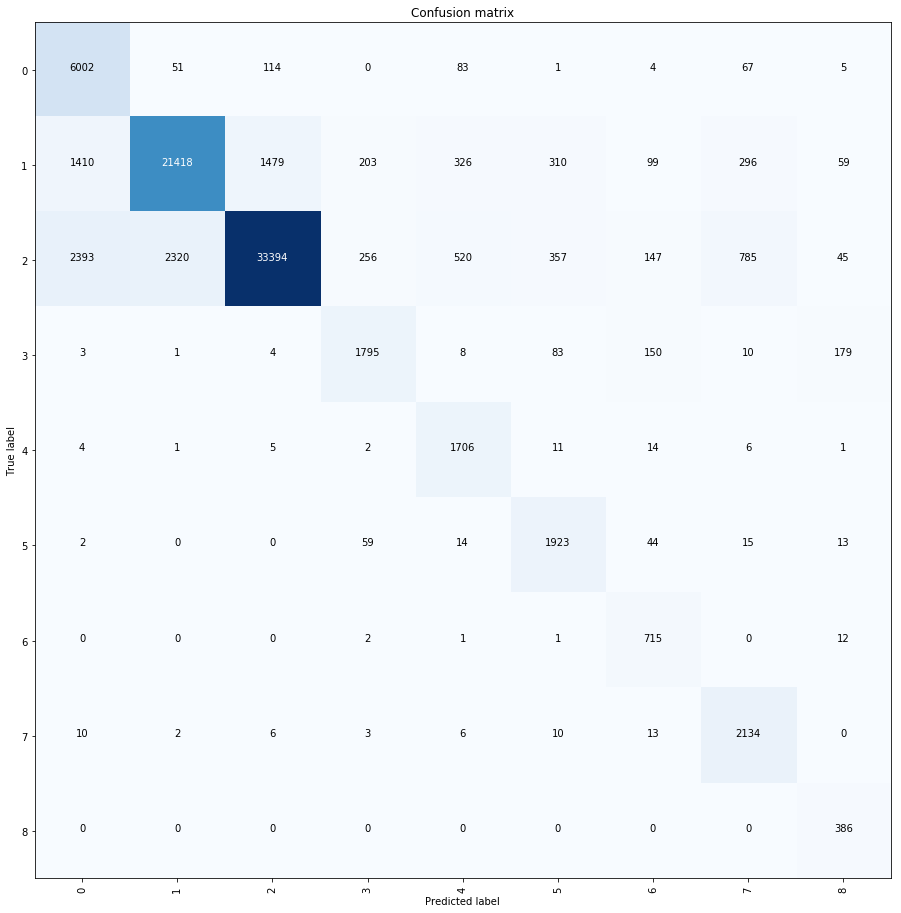


TESTING RESULTS


Accuracy:
0.81
              precision    recall  f1-score   support

           0       0.54      0.86      0.66      1326
           1       0.87      0.80      0.84      5561
           2       0.93      0.82      0.87      8582
           3       0.64      0.68      0.66       487
           4       0.52      0.84      0.64       326
           5       0.63      0.82      0.71       446
           6       0.49      0.68      0.57       163
           7       0.56      0.81      0.66       480
           8       0.33      0.51      0.40        94

    accuracy                           0.81     17465
   macro avg       0.61      0.76      0.67     17465
weighted avg       0.84      0.81      0.82     17465



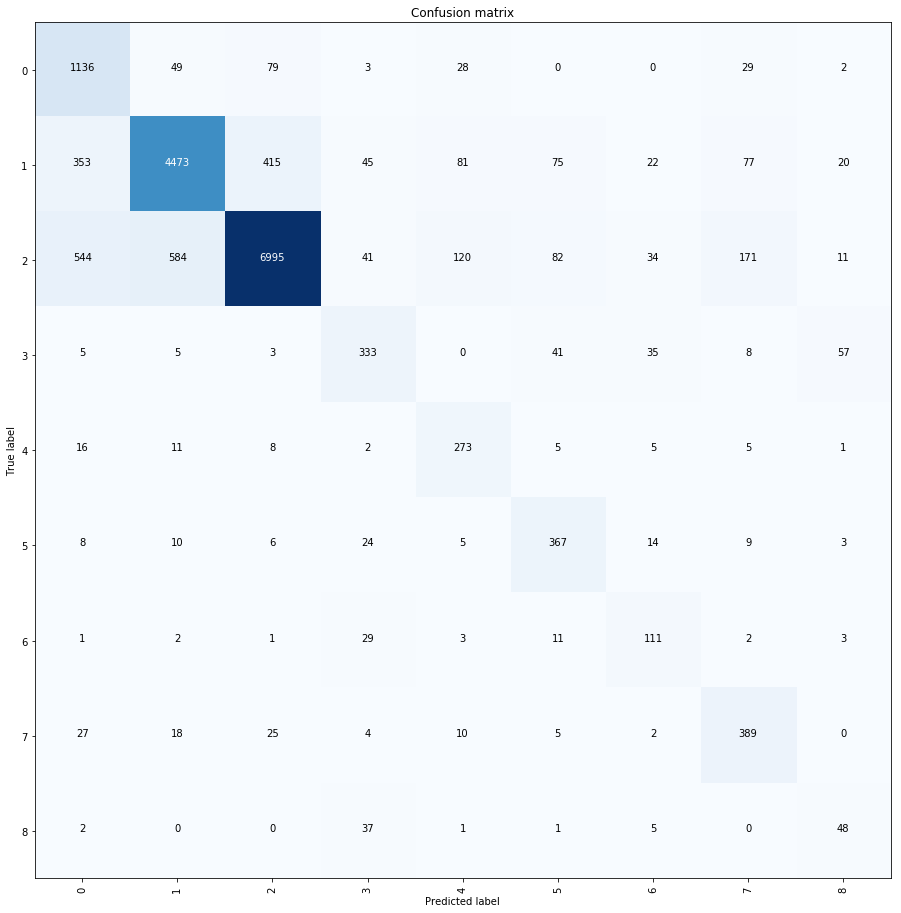

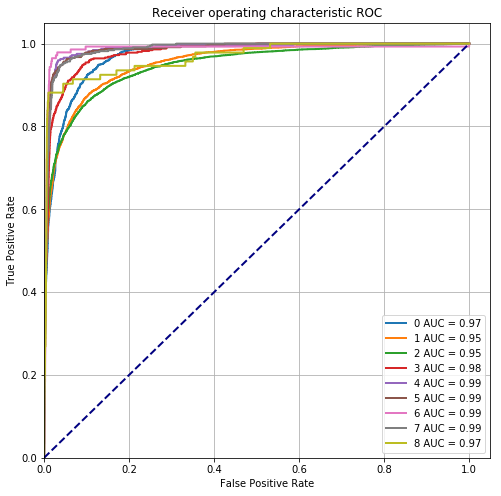

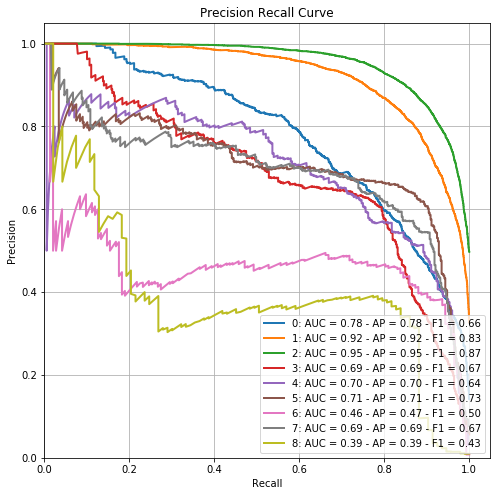


VALIDATION RESULTS

Threshold
[0.24, 0.23, 0.26, 0.05, 0.16, 0.08, 0.06, 0.16, 0.08]


,class,false positive rate,true positive rate
0,0,0.101036,0.924683
1,1,0.107098,0.880065
2,2,0.102032,0.860742
3,3,0.090218,0.948515
4,4,0.032789,0.959877
5,5,0.046053,0.956710
6,6,0.031001,0.978873
7,7,0.038595,0.947846
8,8,0.010247,0.881720



TESTING RESULTS



,class,false positive rate,true positive rate
0,0,0.018465,0.612368
1,1,0.022849,0.644129
2,2,0.018462,0.689350
3,3,0.003711,0.525667
4,4,0.007235,0.708589
5,5,0.005700,0.652466
6,6,0.002659,0.453988
7,7,0.008772,0.683333
8,8,0.001785,0.234043


In [209]:
clasifier.fit(cluster_to_train)

In [210]:
type(clasifier)

millenlp.state_models.shallow_model.ShallowModel

## Train full model with strings

In [ ]:
'''
{0: 'otro',
 1: 'sin_suministro_calle',
 2: 'posible_averia_cliente',
 3: 'cables',
 4: 'intermitencia',
 5: 'transformador_contador',
 6: 'postes',
 7: 'electrodependiente',
 8: 'arboles'}
'''

In [251]:
data_sin_suministro_calle['string'] = 'sin_suministro_calle'
data_posible_averia_cliente['string'] = 'posible_averia_cliente'
data_cables['string'] = 'cables'
data_intermitencia['string'] = 'intermitencia'
data_transformador_contador['string'] = 'transformador_contador'
data_postes['string'] = 'postes'
data_electrodependiente['string'] = 'electrodependiente'
data_arboles['string'] = 'arboles'
data_sin_servicio_calle_otros['string'] = 'sin_suministro_calle'
data_posible_averia_cliente_otros['string'] = 'posible_averia_cliente'
data_intermitencia_otros['string'] = 'intermitencia'
data_electrodependiente_otros['string'] = 'electrodependiente'
data_otros_cluster_otros['string'] = 'otros'

/opt/conda/envs/nlp/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/opt/conda/envs/nlp/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/conda/envs/nlp/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See t

### Check shapes

In [252]:
print(data_sin_suministro_calle.shape)
print(data_posible_averia_cliente.shape)
print(data_cables.shape)
print(data_intermitencia.shape)
print(data_transformador_contador.shape)
print(data_postes.shape)
print(data_electrodependiente.shape)
print(data_arboles.shape)
print(data_sin_servicio_calle_otros.shape)
print(data_posible_averia_cliente_otros.shape)
print(data_intermitencia_otros.shape)
print(data_electrodependiente_otros.shape)
print(data_otros_cluster_otros.shape)

(29795, 6)
(44333, 6)
(3225, 6)
(905, 6)
(2978, 6)
(1036, 6)
(1797, 6)
(573, 6)
(6920, 6)
(13119, 6)
(1495, 6)
(1308, 6)
(8994, 6)


In [253]:
full_database_tipified_string = pd.concat([data_sin_suministro_calle,
                                    data_posible_averia_cliente,
                                    data_cables,
                                    data_intermitencia,
                                    data_transformador_contador,
                                    data_postes,
                                    data_electrodependiente,
                                    data_arboles,
                                    data_sin_servicio_calle_otros,
                                    data_posible_averia_cliente_otros,
                                    data_intermitencia_otros,
                                    data_electrodependiente_otros,
                                    data_otros_cluster_otros])

full_database_tipified_string.shape

(116478, 6)

In [254]:
full_database_tipified_string.string.value_counts().to_frame()

,string
posible_averia_cliente,57452
sin_suministro_calle,36715
otros,8994
cables,3225
electrodependiente,3105
transformador_contador,2978
intermitencia,2400
postes,1036
arboles,573


In [256]:
filename_full_database_tipified_string = '/home/JulioCesar/nlp/nlp_clustering/tipified/full_database_lemma_tipified_string.csv'

In [257]:
full_database_tipified_string.to_csv(filename_full_database_tipified_string, index = False)

In [337]:
cluster_to_train = full_database_tipified_string[['_text', 'lemma', 'string']].rename(columns = {'lemma' : 'iteration', 'string' : 'label'})
cluster_to_train.shape

(116478, 3)

In [338]:
cluster_to_train[:100]

,_text,iteration,label
2,estoy llamando la Vereda campo municipal caparrapi desde el lunes estamos sin luz y no es posible que los guarda lineas,estar llamar vereda campo municipal caparrapi lunes estar luz no ser posible que guardar linea,sin_suministro_calle
14,esa tiene la expresion de Santa Aguila municipio paratebueno cundinamarca que se encuentra todo el caserio sin luz,tener expresion santa aguila municipio paratebueno cundinamarca encontrar caserio luz,sin_suministro_calle
15,Que pasa si no tenemos luz en el sector de Chimbote Santa Lucia,que paso si no tener luz sector chimbote santa lucia,sin_suministro_calle
16,Tu amor es que ando aqui en el dia que llegamos aqui Se fue la luz este ano nuevo Ya que no tenemos aca heladeria el show de la Vega cundinamarca,amor ser que andar aqui dia llegar aqui ser luz ano nuevo ya que no tener heladeria show vega cundinamarca,sin_suministro_calle
18,Bueno lo siguiente esta aqui en el barrio San Mateo es un corto no se fue la luz y se fueron varias casas en algunos llamaron y vinieron ayer a querer arreglo pero como yo estaba en la casa de la Calle 7 numero 346 le llama cuando cuenta,bueno siguiente aqui barrio santo mateo ser corto no ser luz ser variar clases llamar venir ayer querer arreglo como estar casa calle numero llamar cuando contar,sin_suministro_calle
22,desde esta manana no hay servicio de energia del municipio de sasaima cundinamarca,manana no haber servicio energia municipio sasaima cundinamarca,sin_suministro_calle
25,no tengo luz en mi casa numero de cuenta de la 149 67 03 - 8 Gracias,no tener luz casa numero cuenta,sin_suministro_calle
38,no tenemos servicio aqui por la via sasaima en el barrio San Antonio,no tener servicio aqui via sasaima barrio santo antonio,sin_suministro_calle
41,Nos quedamos sin luz en la Vereda Andalucia,quedar luz vereda andalucia,sin_suministro_calle
45,lo que pasa es que llevamos varios dias sin luz aqui en la Vereda El Salitre,paso ser que llevar dia luz aqui vereda salitre,sin_suministro_calle


In [339]:
cluster_to_train = cluster_to_train.sample(frac = 1)
cluster_to_train.shape

(116478, 3)

In [340]:
cluster_to_train[:100]

,_text,iteration,label
33761,lo que paso fue que eso nos cayeron las canuelas del transformador y estamos necesitando aqui en el barrio las acacias 2 el servicio ya que hay algunos ancianos que manejan el aparato ese oxigeno entonces con esos que necesita la energia el va al girar dos,pasar ser que caer canuelas transformador estar necesitar aqui barrio acacias servicio ya que haber ancianos que manejar aparato oxigeno entonces necesitar energia ir guiar dos,transformador_contador
6167,falta del suministro de energia,faltar suministro energia,posible_averia_cliente
69356,noticias del municipio dicen que envian un mensaje que ya arreglaron servicio a las 16:33 para la hora que no hay servicio en el sector una Vereda por favor,noticias municipio decir que enviar mensaje ya arreglar servicio hora no haber servicio sector vereda,posible_averia_cliente
70901,no hay luz,no haber luz,posible_averia_cliente
577,no tenemos energia,no tener energia,posible_averia_cliente
60109,estamos en servicio desde el dia de ayer tarde que hay una cuerda que vinieron y la recogieron pero no la han colocado Y hace como 3 meses y eso estan pidiendo para que la luz se vaya a seguir,estar servicio dia ayer tarde que haber cuerda venir recoger no haber colocar hacer como meses estan pedir que luz ir seguir,cables
107924,venga hagame un favor desde el martes estamos estoy sin luz aqui en el sector de San Raymundo de sesiones en 10 Samo Sin luz y no se como una canuela que se cayo y canaliza llamo y llamo pero no nos vienen a solucionar ese problema por favor,venta hagame martes estar estar luz aqui sector santo raymundo sesiones samo luz no como canuela cayo canalizar llamar llamar no bienes solucionar problema,sin_suministro_calle
6760,lo que pasa es que desde ayer de las 5 de la tarde a la hora que ahorita no hay servicio de luz aqui en la Vereda jiron de blancos de caqueza sector estoy asi Donde esta la tienda estamos en la lucha Y es bajita y vuelve y se vaya sinceramente,paso ser que ayer tarde hora ahora no haber servicio luz aqui vereda jiron bancos caqueza sector estar asi tienda estar lucha ser bajita volver ir sinceramente,posible_averia_cliente
31288,"el contador en la parte exterior de esta esta saliendo humo Parece ser que tiene un corto interno no tengo energia en el predio , alo",contador parte exterior salir humo parecer ser que tener corto interno no tener energia previo malo,posible_averia_cliente
91023,app ahora Estamos sin luz desde el dia de ayer a mediodia y en dos ocasiones que ha llamado y me han dicho que ya viene para que la cuadrilla ahora que solucione el problema,app ahora estar luz dia ayer mediodia dos ocasiones haber llamar haber decir que ya bienes que cuadrilla ahora solucion problema,posible_averia_cliente


In [341]:
cluster_to_train.label.value_counts().to_frame()

,label
posible_averia_cliente,57452
sin_suministro_calle,36715
otros,8994
cables,3225
electrodependiente,3105
transformador_contador,2978
intermitencia,2400
postes,1036
arboles,573


In [342]:
cluster_to_train.label = cluster_to_train.label.apply(lambda x: str(x))
cluster_to_train = cluster_to_train.dropna()
cluster_to_train.shape

(116427, 3)

In [308]:
Tfidf = TfidfVec()
Tfidf._embedding = TfidfVectorizer(ngram_range=(1, 4),
                                   norm='l2',
                                   min_df=10,
                                   max_df=0.5,          
                                   tokenizer=None,
                                   strip_accents=None,
                                   lowercase=False)
clasifier = ShallowModel('tfidf')
clasifier._vectorizer = Tfidf
clasifier._preprocessing = None

/opt/conda/envs/nlp/lib/python3.7/site-packages/tqdm/std.py:658: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


Number of features: 26676


SPLIT

Size of training set:     81498          
Size of validation set:   17464          
Size of test set:         17465          

TRAINING RESULTS


Accuracy:
0.85
                        precision    recall  f1-score   support

               arboles       0.55      1.00      0.71       402
                cables       0.77      0.80      0.79      2260
    electrodependiente       0.64      0.98      0.77      2167
         intermitencia       0.64      0.98      0.77      1654
                 otros       0.62      0.94      0.75      6270
posible_averia_cliente       0.95      0.83      0.89     40314
                postes       0.59      0.98      0.74       712
  sin_suministro_calle       0.90      0.84      0.87     25649
transformador_contador       0.72      0.92      0.81      2070

              accuracy                           0.85     81498
             macro avg       0.71      0.92      0.79     81498
          weighted avg       0.88 

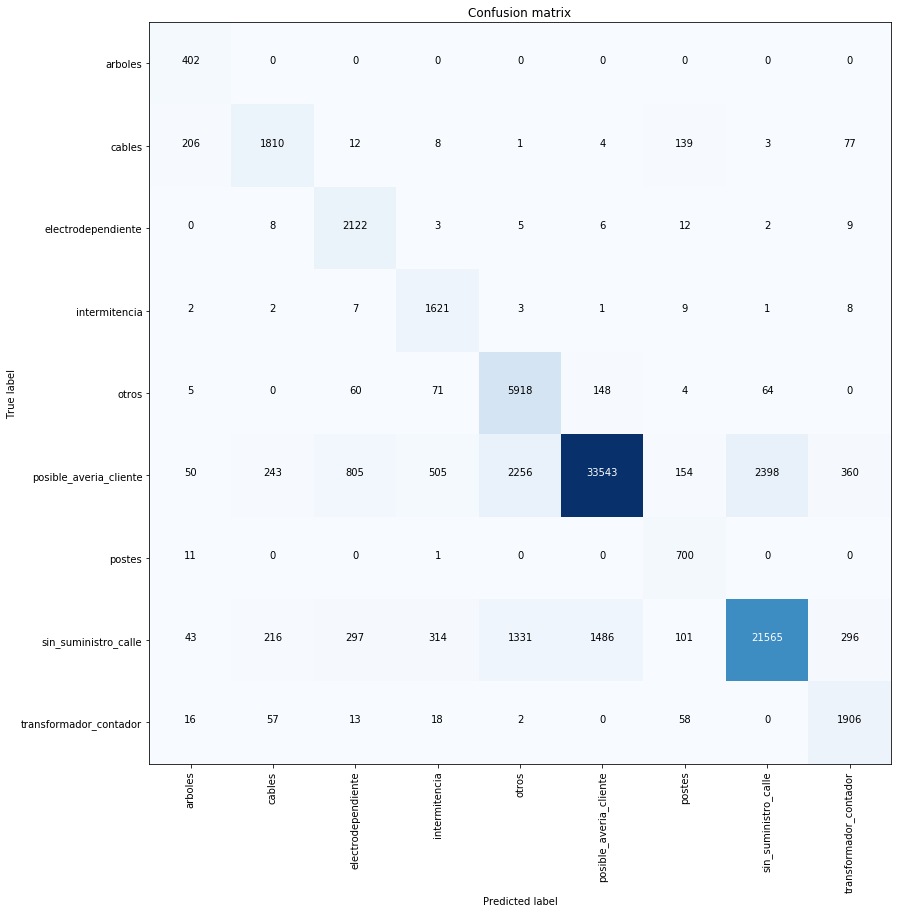


TESTING RESULTS


Accuracy:
0.81
                        precision    recall  f1-score   support

               arboles       0.39      0.54      0.45        89
                cables       0.63      0.72      0.67       473
    electrodependiente       0.55      0.84      0.66       473
         intermitencia       0.55      0.84      0.67       402
                 otros       0.56      0.86      0.67      1342
posible_averia_cliente       0.93      0.82      0.87      8521
                postes       0.46      0.64      0.53       150
  sin_suministro_calle       0.87      0.80      0.84      5575
transformador_contador       0.65      0.81      0.72       440

              accuracy                           0.81     17465
             macro avg       0.62      0.76      0.68     17465
          weighted avg       0.84      0.81      0.82     17465



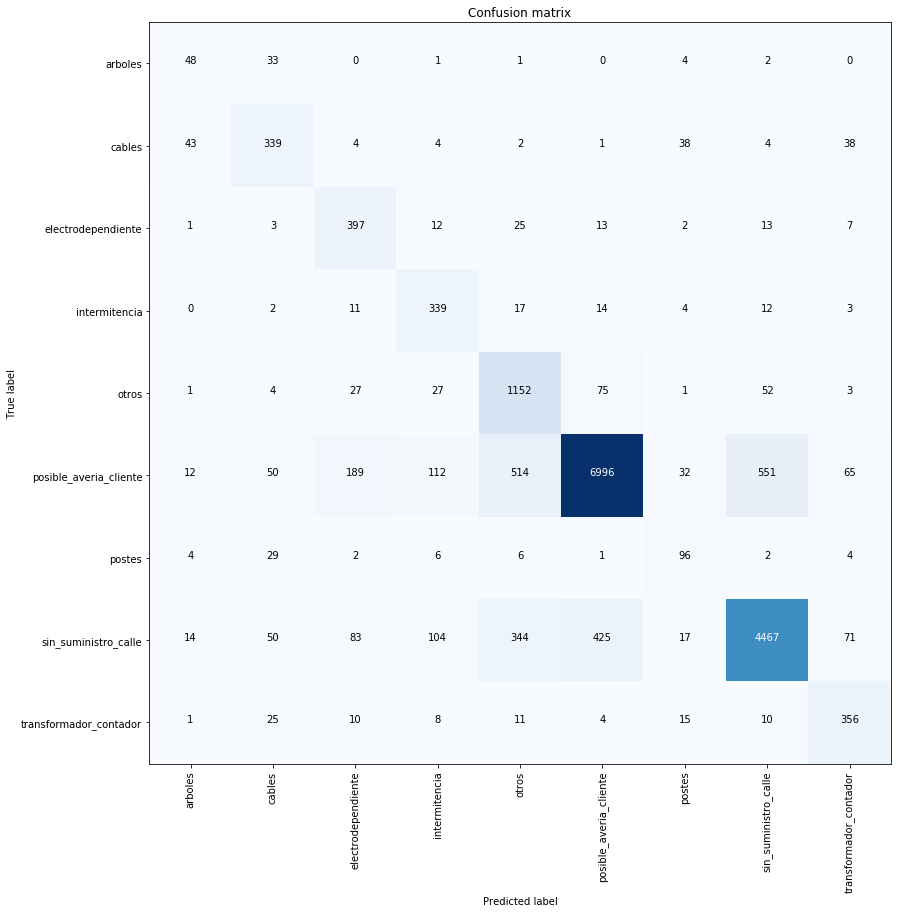

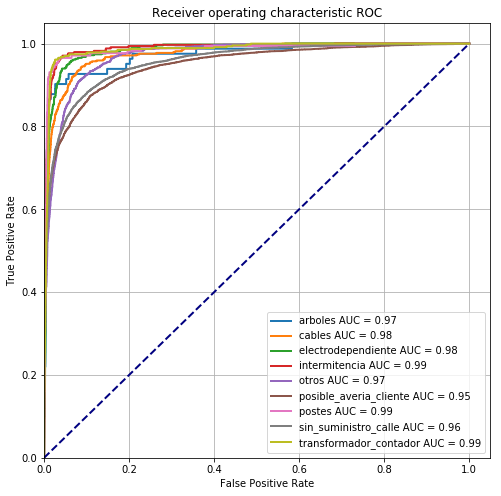

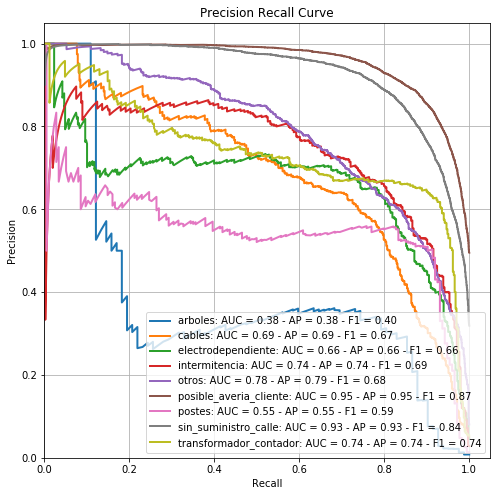


VALIDATION RESULTS

Threshold
[0.03, 0.05, 0.15, 0.11, 0.25, 0.25, 0.05, 0.24, 0.12]


,class,false positive rate,true positive rate
0,arboles,0.026234,0.902439
1,cables,0.086495,0.943089
2,electrodependiente,0.042297,0.939785
3,intermitencia,0.043341,0.970930
4,otros,0.082142,0.909551
5,posible_averia_cliente,0.108398,0.873622
6,postes,0.036379,0.965517
7,sin_suministro_calle,0.102295,0.883272
8,transformador_contador,0.026300,0.961538



TESTING RESULTS



,class,false positive rate,true positive rate
0,arboles,0.001611,0.224719
1,cables,0.003766,0.473573
2,electrodependiente,0.010417,0.699789
3,intermitencia,0.008850,0.723881
4,otros,0.016870,0.585693
5,posible_averia_cliente,0.017889,0.698275
6,postes,0.002541,0.426667
7,sin_suministro_calle,0.017830,0.635516
8,transformador_contador,0.005228,0.627273


In [309]:
clasifier.fit(cluster_to_train)

In [442]:
cluster_to_train

,_text,iteration,label
33761,lo que paso fue que eso nos cayeron las canuelas del transformador y estamos necesitando aqui en el barrio las acacias 2 el servicio ya que hay algunos ancianos que manejan el aparato ese oxigeno entonces con esos que necesita la energia el va al girar dos,pasar ser que caer canuelas transformador estar necesitar aqui barrio acacias servicio ya que haber ancianos que manejar aparato oxigeno entonces necesitar energia ir guiar dos,transformador_contador
6167,falta del suministro de energia,faltar suministro energia,posible_averia_cliente
69356,noticias del municipio dicen que envian un mensaje que ya arreglaron servicio a las 16:33 para la hora que no hay servicio en el sector una Vereda por favor,noticias municipio decir que enviar mensaje ya arreglar servicio hora no haber servicio sector vereda,posible_averia_cliente
70901,no hay luz,no haber luz,posible_averia_cliente
577,no tenemos energia,no tener energia,posible_averia_cliente
...,...,...,...
5228,servicio de nuevo,servicio nuevo,posible_averia_cliente
73931,hay no hay luz en el municipio de zuazua y Rio frio,haber no haber luz municipio zuazua rio frio,sin_suministro_calle
70861,para reportar un dano en Carmen de carupa Vereda suben al sector San Juanito,reportar dano carmen carupa vereda subir sector santo juanito,sin_suministro_calle
93277,Alo no tenemos luz en el sector de patio bonito La Vega y tenemos bebes dos bebes pequenos una senora enferma por favor adulta necesitamos que nos colaboren por favor,malo no tener luz sector patio bonito vega tener bebe dos beber pequeno enferma adulta necesitar que colaborar,posible_averia_cliente


## Test the classifier

In [324]:
preproc = PreProc()
preproc._remove_digits = True
preproc._remove_names = False

clasifier._preprocessing = preproc

In [472]:
counter_test = 0
data_predicted = None
clasifier._sentinels = False

for index, data_frame in cluster_to_train.iterrows():
    counter_test += 1
    prediction, prob = clasifier.predict(data_frame)
    '''
    print(type(data_frame))
    print('Texto:', data_frame._text)
    print(prediction, prob)
    print('*********', prediction[0], index, '******')
    '''
    
    # print('prediction', prediction, data_frame._text)
    if len(prediction) > 0:
        pred = str(prediction[0])
    else:
        pred = 'otros'
    test_d = {'_text': [data_frame._text], 'lemma': data_frame.iteration,
                  'tipified': data_frame.label, 'predict': pred}
    if counter_test == 1:
        data_predicted = pd.DataFrame(data = test_d)
    else:
        data_predicted = pd.concat([data_predicted,
                                    pd.DataFrame(data = test_d)])
    '''
    print('------------')
    break
    if counter_test > 2:
        break
    '''

In [473]:
data_predicted.shape

(116427, 4)

In [474]:
data_predicted

,_text,lemma,tipified,predict
0,lo que paso fue que eso nos cayeron las canuelas del transformador y estamos necesitando aqui en el barrio las acacias 2 el servicio ya que hay algunos ancianos que manejan el aparato ese oxigeno entonces con esos que necesita la energia el va al girar dos,pasar ser que caer canuelas transformador estar necesitar aqui barrio acacias servicio ya que haber ancianos que manejar aparato oxigeno entonces necesitar energia ir guiar dos,transformador_contador,electrodependiente
0,falta del suministro de energia,faltar suministro energia,posible_averia_cliente,posible_averia_cliente
0,noticias del municipio dicen que envian un mensaje que ya arreglaron servicio a las 16:33 para la hora que no hay servicio en el sector una Vereda por favor,noticias municipio decir que enviar mensaje ya arreglar servicio hora no haber servicio sector vereda,posible_averia_cliente,posible_averia_cliente
0,no hay luz,no haber luz,posible_averia_cliente,posible_averia_cliente
0,no tenemos energia,no tener energia,posible_averia_cliente,posible_averia_cliente
...,...,...,...,...
0,servicio de nuevo,servicio nuevo,posible_averia_cliente,posible_averia_cliente
0,hay no hay luz en el municipio de zuazua y Rio frio,haber no haber luz municipio zuazua rio frio,sin_suministro_calle,sin_suministro_calle
0,para reportar un dano en Carmen de carupa Vereda suben al sector San Juanito,reportar dano carmen carupa vereda subir sector santo juanito,sin_suministro_calle,sin_suministro_calle
0,Alo no tenemos luz en el sector de patio bonito La Vega y tenemos bebes dos bebes pequenos una senora enferma por favor adulta necesitamos que nos colaboren por favor,malo no tener luz sector patio bonito vega tener bebe dos beber pequeno enferma adulta necesitar que colaborar,posible_averia_cliente,sin_suministro_calle


In [475]:
filename_full_database_predicted = '/home/JulioCesar/nlp/nlp_clustering/tipified/full_database_lemma_tipified_string_predicted_V1.csv'

In [476]:
data_predicted.to_csv(filename_full_database_predicted, index = False)

In [478]:
different_data = data_predicted[data_predicted['tipified'] != data_predicted['predict']]

In [480]:
different_data[:100]

,_text,lemma,tipified,predict
0,lo que paso fue que eso nos cayeron las canuelas del transformador y estamos necesitando aqui en el barrio las acacias 2 el servicio ya que hay algunos ancianos que manejan el aparato ese oxigeno entonces con esos que necesita la energia el va al girar dos,pasar ser que caer canuelas transformador estar necesitar aqui barrio acacias servicio ya que haber ancianos que manejar aparato oxigeno entonces necesitar energia ir guiar dos,transformador_contador,electrodependiente
0,lo que pasa es que desde ayer de las 5 de la tarde a la hora que ahorita no hay servicio de luz aqui en la Vereda jiron de blancos de caqueza sector estoy asi Donde esta la tienda estamos en la lucha Y es bajita y vuelve y se vaya sinceramente,paso ser que ayer tarde hora ahora no haber servicio luz aqui vereda jiron bancos caqueza sector estar asi tienda estar lucha ser bajita volver ir sinceramente,posible_averia_cliente,sin_suministro_calle
0,"el contador en la parte exterior de esta esta saliendo humo Parece ser que tiene un corto interno no tengo energia en el predio , alo",contador parte exterior salir humo parecer ser que tener corto interno no tener energia previo malo,posible_averia_cliente,transformador_contador
0,aca esperando una semana quiera chantypak Feria San Bartolome,esperar semana querer chantypak feria santo bartolome,sin_suministro_calle,otros
0,su Merced es que estamos sin luz la semana pasada duramos cuatro dias sin luz y no la colocaron por unos dias y volvio y Se fue la luz desde ayer no tenemos luz y a mi se me despego un negocio se me estan danando las cosas de la nevera de la escuela no hay luz para poder licuar los jugos para los ninos entonces que esta pasando con el problema,merced ser que estar luz semana pasada duramos cuatro dia luz no colocar dia volvio ser luz ayer no tener luz despegar negocio estan danando cosa nevera escuela no haber luz poder licuar jugos ninos entonces que pasado problema,posible_averia_cliente,electrodependiente
0,esta sin energia desde hace rato y la verdad creo que pegaron y esta haciendo corto,energia hacer rato verdad creer que pegar hacer corto,sin_suministro_calle,arboles
0,Buenas tardes lo que pasa es que desde ayer estoy sin luz esta manana ya hace como a las 11 de la manana y dijeron que llegaban en breves minutos y en la hora de quien nada el numero del radicalismo 77074 567 por favor,paso ser que ayer estar luz manana ya hacer como manana dar que llegar breves minuto hora numero radicalismo,posible_averia_cliente,otros
0,para lo que pasa es que un cable se desprendio de un poste y eso esta peligroso que pase un carro y haga un corto ahi o alguna persona esta muy bajito el cable de corriente,paso ser que cable desprendio poste peligroso pasar carro hacer corto ahi persona muy bajito cable corriente,cables,postes
0,no hay luz en unas partes de la casa la luz se va y viene constantemente,no haber luz parte casa luz ir bienes constantemente,posible_averia_cliente,intermitencia
0,lo que pasa es que hace como mas de una hora no hay luz aqui en la en las meralda 3 Entonces lo paso es que yo tengo un jardin comunitario el bienestar y pues tengo los ninos sin luz y sin nada Cesar Si nos hacen el favor de reconectar la luz por favor,paso ser que hacer como mas hora no haber luz aqui meralda entonces paso ser que tener jardin comunitario bienestar pues tener ninos luz cesar si haran reconectar luz,posible_averia_cliente,otros


In [440]:
'''
text_lst = ['quiero reportar una falla de luz en la vereda', 'llamo porque no hay servicio en mi casa',
           'se daño el transformador en la calle', 'se cayo un arbol sobre el transformador',
           'se cayo un arbol sobre las cuerdas', 'los cables estan echando chispas',
           'el contador esta fallando', 'por favor aplomar el posta de luz',
           'llamo para reportar que la luz viene y se va seguido', 'necesito que me pongan la luz',
           'toda la zona quinta se encuentra sin servicio', 'no se que se hizo mi perrito',
           'se fue la luz', 'mi casa esta sin luz', 'no hay suministro de energia',
           'un arbol se cayo sobre el contador', 'el conjunto se encuentra sin luz',
           'quiero construir un robot', 'hay intermitencia en el servicio',
           'no se como ir a la casa', 'quiero comer hamburguesa']
'''
'''
text_lst = ['no se que se hizo mi perito', 'todas las casas del barrio estan sin luz', 'aun no hay luz',
           'se salto el transformador y ahora no tenemos luz en toda la cuadra', 'se daño el taco',
           'no he podido pagar mi factura']
'''
text_lst = ['quiero reportar que no hay luz']

test_d = {'_text': text_lst}
test_df = pd.DataFrame(data = test_d)
test_df

counter_test = 0
for index, message in test_df.iterrows():
    counter_test += 1
    prediction, prob = clasifier.predict(message)
    print('Texto:', message._text)
    print(prediction, prob)
    # clasifier.predict_probas(message)
    print('------------')


MODEL: 
	(0.734635372922997, 'posible_averia_cliente', 0.2460321528702692)
	(0.22643374347924997, 'sin_suministro_calle', 0.2390504733144723)
	(0.011152505046664514, 'otros', 0.2546120743924712)
	(0.008415319361350503, 'cables', 0.04983123971285437)
	(0.006849688552717175, 'transformador_contador', 0.12286428915080853)
	(0.004112516868288165, 'electrodependiente', 0.15404822201145388)
	(0.003456533657117172, 'intermitencia', 0.11301266586469869)
	(0.002845297288865283, 'arboles', 0.031051179362521636)
	(0.0020990228227501843, 'postes', 0.051780448357849944)
Texto: quiero reportar que no hay luz
['posible_averia_cliente'] [(0.734635372922997, 'posible_averia_cliente', 0.2460321528702692), (0.22643374347924997, 'sin_suministro_calle', 0.2390504733144723), (0.011152505046664514, 'otros', 0.2546120743924712), (0.008415319361350503, 'cables', 0.04983123971285437), (0.006849688552717175, 'transformador_contador', 0.12286428915080853), (0.004112516868288165, 'electrodependiente', 0.154048222

## Multi label

In [310]:
cluster_to_train_multilabel = cluster_to_train

In [311]:
cluster_to_train_multilabel.label.apply(lambda x: [x] if x != 'otros' else [])

38139    [posible_averia_cliente]
50024    [posible_averia_cliente]
86935    [posible_averia_cliente]
19492    []                      
36252    []                      
         ..                      
17665    [sin_suministro_calle]  
21130    [posible_averia_cliente]
73424    []                      
6792     [sin_suministro_calle]  
17207    [posible_averia_cliente]
Name: label, Length: 116427, dtype: object

In [312]:
cluster_to_train_multilabel['label'] = cluster_to_train_multilabel.label.apply(lambda x: [x] if x != 'otros' else [])

In [313]:
cluster_to_train_multilabel[:30]

,_text,iteration,label
38139,Se fue la luz en la casa no hay luz,ser luz casa no haber luz,[posible_averia_cliente]
50024,no tenemos luz desde las 6 de la manana de ayer,no tener luz manana ayer,[posible_averia_cliente]
86935,estamos sin luz,estar luz,[posible_averia_cliente]
19492,en el sector Se fue la luz entonces necesitamos que nos colaboren con restablecer el servicio,sector ser luz entonces necesitar que colaborar restablecer servicio,[]
36252,la reconexion de servicio aqui en el municipio de,reconexion servicio aqui municipio,[]
94317,alta de servicio en un inmueble,alta servicio inmueble,[posible_averia_cliente]
102092,no hay luz a casa,no haber luz casa,[posible_averia_cliente]
3338,no presentadas por el momento el servicio de luz,no presentadas momento servicio luz,[posible_averia_cliente]
62562,que motivo de llamada es porque llevamos 4 horas sin energia en la Vereda San Juan municipio La verdad cundinamarca vamos 8 viviendas las cuales no estamos con energia no tenemos energia,que motivo llamada ser porque llevar hora energia vereda santo juan municipio verdad cundinamarca ir vivienda no estar energia no tener energia,[sin_suministro_calle]
82117,el motivo de la llamada Es que hicieron una acometida nueva Kia mi predio Y entonces quitaron la luz a otro con otro cliente y cuando se fueron dejaron sin luz aqui en ti entonces ya hace como tres o cuatro dias que esta sin luz desde el senor Entonces ese es el reporte a ver si la pones como el de la funciona a mi a mi predio no esta todavia lista la comida entonces toca esperar un poco,motivo llamada ser que hacer acometida nueva dia previo entonces quitar luz cliente cuando ser dejar luz aqui entonces ya hacer como tres cuatro dia que luz entonces ser reporte ver si poner como funcionar previo no todavia lista comida entonces tocar esperar,[]


In [314]:
Tfidf_multilabel = TfidfVec()
Tfidf_multilabel._embedding = TfidfVectorizer(ngram_range=(1, 4),
                                   norm='l2',
                                   min_df=10,
                                   max_df=0.5,          
                                   tokenizer=None,
                                   strip_accents=None,
                                   lowercase=False)
clasifier_multilabel = MultiLabelShallowModel('tfidf')
clasifier_multilabel._vectorizer = Tfidf
clasifier_multilabel._preprocessing = None


SPLIT

Size of training set:     81498          
Size of validation set:   17464          
Size of test set:         17465          


/opt/conda/envs/nlp/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



TRAINING RESULTS


Accuracy:
0.97
                        precision    recall  f1-score   support

               arboles       0.75      0.77      0.76       415
                cables       0.91      0.82      0.86      2290
    electrodependiente       0.91      0.95      0.93      2147
         intermitencia       0.97      0.97      0.97      1703
posible_averia_cliente       0.99      0.99      0.99     40178
                postes       0.89      0.70      0.79       716
  sin_suministro_calle       1.00      1.00      1.00     25641
transformador_contador       0.86      0.93      0.90      2089

             micro avg       0.98      0.98      0.98     75179
             macro avg       0.91      0.89      0.90     75179
          weighted avg       0.98      0.98      0.98     75179
           samples avg       0.90      0.90      0.90     75179



/opt/conda/envs/nlp/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1268: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/envs/nlp/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1268: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


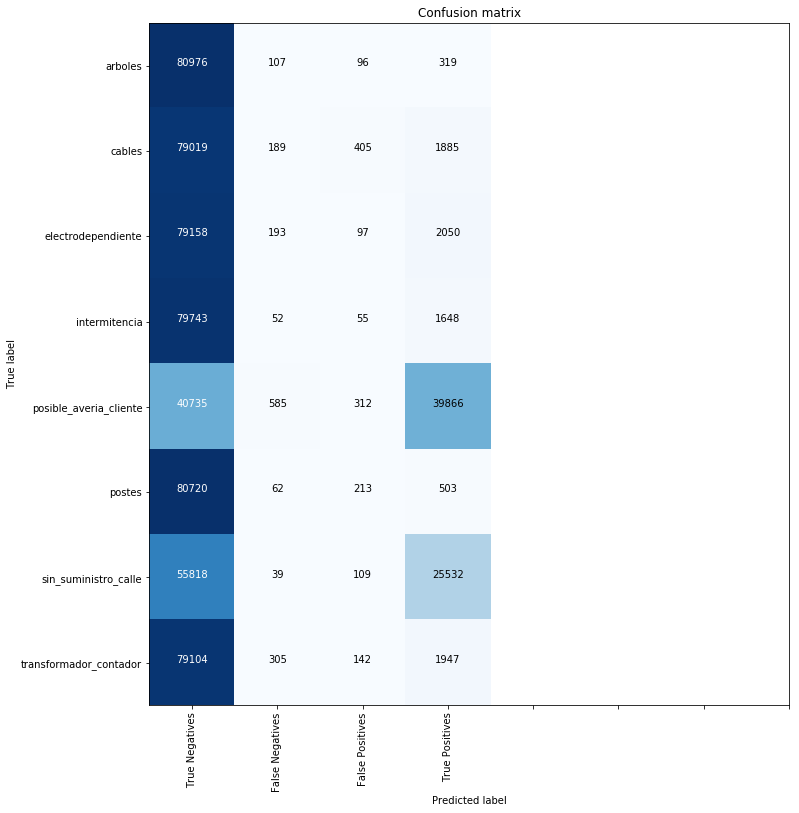


TESTING RESULTS


Accuracy:
0.79
                        precision    recall  f1-score   support

               arboles       0.23      0.20      0.22        93
                cables       0.56      0.47      0.51       476
    electrodependiente       0.67      0.58      0.62       462
         intermitencia       0.71      0.56      0.63       350
posible_averia_cliente       0.87      0.89      0.88      8596
                postes       0.36      0.19      0.25       170
  sin_suministro_calle       0.87      0.83      0.85      5543
transformador_contador       0.63      0.50      0.55       438

             micro avg       0.84      0.82      0.83     16128
             macro avg       0.61      0.53      0.56     16128
          weighted avg       0.84      0.82      0.83     16128
           samples avg       0.75      0.75      0.75     16128



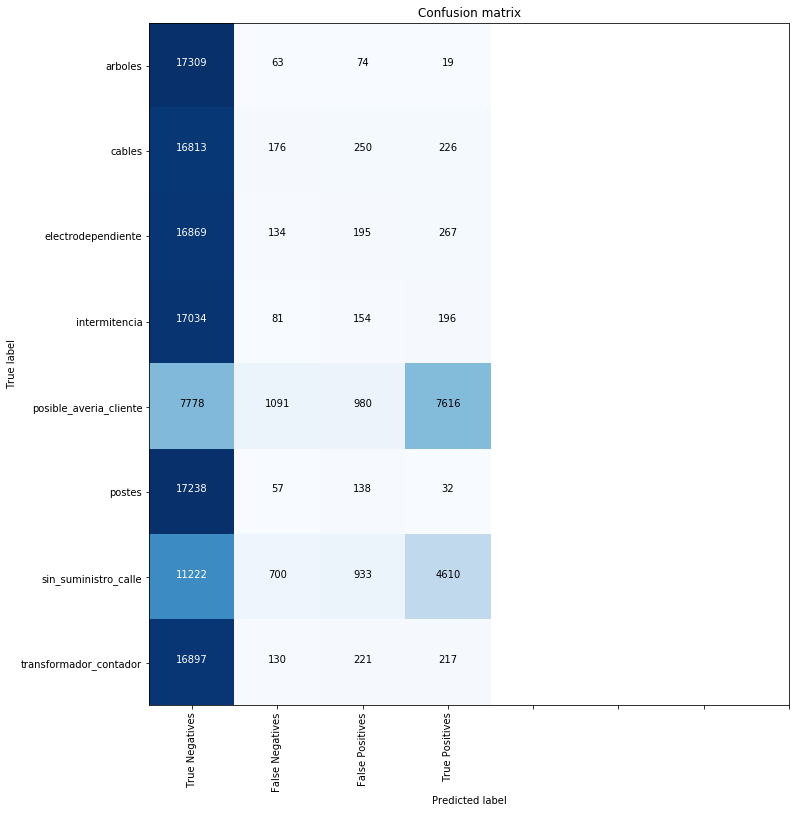

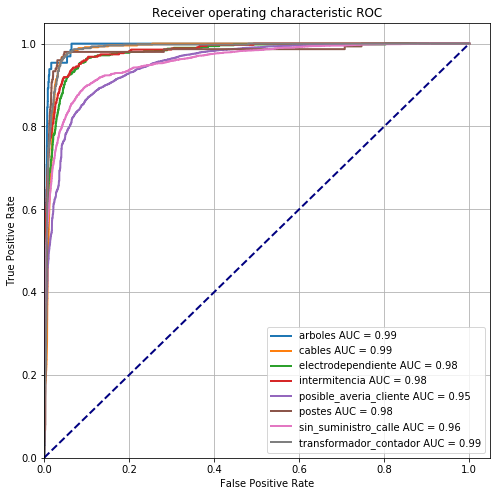

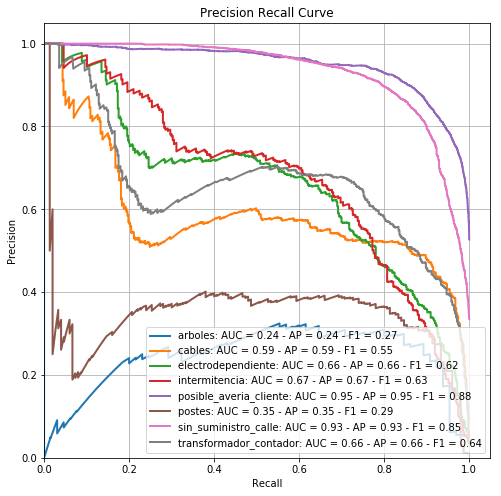

/opt/conda/envs/nlp/lib/python3.7/site-packages/millenlp/helpers/nlp_utils.py:381: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  binary_prediction = [lb == label for lb in prediction]



VALIDATION RESULTS

Threshold
[0.0, 0.0, 0.0, 0.0, 0.64, 0.0, 0.09, 0.0]


,class,false positive rate,true positive rate
0,arboles,0.016840,0.953846
1,cables,0.041576,0.967320
2,electrodependiente,0.083864,0.953629
3,intermitencia,0.068645,0.942363
4,posible_averia_cliente,0.103688,0.870477
5,postes,0.047707,0.980000
6,sin_suministro_calle,0.093708,0.893248
7,transformador_contador,0.055428,0.977827



TESTING RESULTS



,class,false positive rate,true positive rate
0,arboles,0.0,0.0
1,cables,0.0,0.0
2,electrodependiente,0.0,0.0
3,intermitencia,0.0,0.0
4,posible_averia_cliente,0.0,0.0
5,postes,0.0,0.0
6,sin_suministro_calle,0.0,0.0
7,transformador_contador,0.0,0.0


In [315]:
clasifier_multilabel.fit(cluster_to_train_multilabel)

In [316]:
cluster_to_train_multilabel

,_text,iteration,label
38139,Se fue la luz en la casa no hay luz,ser luz casa no haber luz,"[0, 0, 0, 0, 1, 0, 0, 0]"
50024,no tenemos luz desde las 6 de la manana de ayer,no tener luz manana ayer,"[0, 0, 0, 0, 1, 0, 0, 0]"
86935,estamos sin luz,estar luz,"[0, 0, 0, 0, 1, 0, 0, 0]"
19492,en el sector Se fue la luz entonces necesitamos que nos colaboren con restablecer el servicio,sector ser luz entonces necesitar que colaborar restablecer servicio,"[0, 0, 0, 0, 0, 0, 0, 0]"
36252,la reconexion de servicio aqui en el municipio de,reconexion servicio aqui municipio,"[0, 0, 0, 0, 0, 0, 0, 0]"
...,...,...,...
17665,se acaba de ir la luz aqui en Chaco en la participacion muchas casas masiva que cundinamarca el numero de ese no era para ti,acabar ir luz aqui chaco participacion clases masivo cundinamarca numero no ser,"[0, 0, 0, 0, 0, 0, 1, 0]"
21130,me falla suministro energia,fallo suministro energia,"[0, 0, 0, 0, 1, 0, 0, 0]"
73424,que estamos sin servicio desde el dia sabado en la noche estamos viendo muy afectados,que estar servicio dia sabado noche estar ser muy afectados,"[0, 0, 0, 0, 0, 0, 0, 0]"
6792,lo que pasa es que desde el dia de ayer no tenemos luz en el sector del Artico,paso ser que dia ayer no tener luz sector artico,"[0, 0, 0, 0, 0, 0, 1, 0]"
